In [12]:
import torch
import torchvision
import torchvision.transforms as transforms

In [13]:
#Train & Test data
transform = torchvision.transforms.Compose(
    [torchvision.transforms.ToTensor(),
     torchvision.transforms.Normalize((0.1307), (1.3081))])

trainset = torchvision.datasets.MNIST(root='./data', train=True, 
                                        download=True, transform =transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True)
testset = torchvision.datasets.MNIST(root='./data', train=False, 
                                        download=True, transform =transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                          shuffle=True)

classes = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9)

tensor([6, 2, 2, 2])


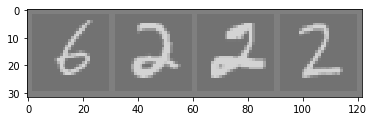

    6     2     2     2


In [14]:
#View Dataset
import matplotlib.pyplot as plt
import numpy as np

#functions to show an image

def imshow(img):
    img = img / 2 + 0.5 #unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))
    plt.show()
    
# get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()
print(labels)

#show images
imshow(torchvision.utils.make_grid(images))
#print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [18]:
##Define CNN
import torch.nn as nn
import torch.nn.functional as F

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, 5)
        self.pool = nn.MaxPool2d(2,2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 4 * 4, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)
        
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 4 * 4)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
net = Net()

In [19]:
#Loss function
import torch.optim as optim
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr = 0.001, momentum = 0.9)

In [20]:
#Training
total_loss = 0.0
EPOCHS = 1
for j in range(EPOCHS):
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data

        optimizer.zero_grad()

        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        print(i, "loss ", loss.item(), outputs, labels)

0 loss  2.2714295387268066 tensor([[-0.0541,  0.0196, -0.0451, -0.0757,  0.1322,  0.1243,  0.0052,  0.0396,
          0.1228, -0.0658],
        [-0.0443,  0.0191, -0.0438, -0.0814,  0.1295,  0.1237, -0.0003,  0.0353,
          0.1289, -0.0597],
        [-0.0527,  0.0132, -0.0477, -0.0798,  0.1316,  0.1214,  0.0026,  0.0320,
          0.1197, -0.0608],
        [-0.0479,  0.0169, -0.0397, -0.0822,  0.1320,  0.1268, -0.0038,  0.0275,
          0.1224, -0.0632]], grad_fn=<AddmmBackward>) tensor([8, 8, 6, 2])
1 loss  2.3355765342712402 tensor([[-0.0527,  0.0201, -0.0445, -0.0774,  0.1280,  0.1276, -0.0018,  0.0391,
          0.1291, -0.0658],
        [-0.0473,  0.0193, -0.0493, -0.0762,  0.1330,  0.1236, -0.0012,  0.0450,
          0.1257, -0.0567],
        [-0.0514,  0.0178, -0.0416, -0.0807,  0.1305,  0.1280,  0.0034,  0.0324,
          0.1260, -0.0660],
        [-0.0398,  0.0181, -0.0456, -0.0919,  0.1309,  0.1319,  0.0038,  0.0394,
          0.1302, -0.0610]], grad_fn=<AddmmBackward>) t

41 loss  2.3707666397094727 tensor([[-0.0657,  0.0409, -0.0299, -0.0905,  0.1181,  0.1322,  0.0132,  0.0444,
          0.1197, -0.0809],
        [-0.0725,  0.0400, -0.0297, -0.0856,  0.1165,  0.1295,  0.0180,  0.0429,
          0.1223, -0.0756],
        [-0.0672,  0.0411, -0.0218, -0.0926,  0.1169,  0.1243,  0.0186,  0.0415,
          0.1270, -0.0742],
        [-0.0753,  0.0413, -0.0297, -0.0840,  0.1134,  0.1268,  0.0184,  0.0469,
          0.1217, -0.0840]], grad_fn=<AddmmBackward>) tensor([6, 3, 2, 9])
42 loss  2.2831268310546875 tensor([[-0.0732,  0.0431, -0.0273, -0.0844,  0.1194,  0.1294,  0.0174,  0.0412,
          0.1192, -0.0833],
        [-0.0744,  0.0424, -0.0327, -0.0793,  0.1166,  0.1299,  0.0241,  0.0505,
          0.1233, -0.0864],
        [-0.0614,  0.0397, -0.0375, -0.0954,  0.1142,  0.1315,  0.0170,  0.0445,
          0.1208, -0.0687],
        [-0.0776,  0.0404, -0.0261, -0.0809,  0.1182,  0.1299,  0.0197,  0.0421,
          0.1164, -0.0859]], grad_fn=<AddmmBackward>)

86 loss  2.2888498306274414 tensor([[-0.0707,  0.0566, -0.0324, -0.0781,  0.0945,  0.1131,  0.0427,  0.0602,
          0.1013, -0.0897],
        [-0.0597,  0.0563, -0.0366, -0.0802,  0.1016,  0.1162,  0.0433,  0.0635,
          0.0987, -0.0824],
        [-0.0628,  0.0579, -0.0375, -0.0811,  0.1014,  0.1225,  0.0356,  0.0606,
          0.0976, -0.0814],
        [-0.0640,  0.0574, -0.0295, -0.0778,  0.0953,  0.1177,  0.0470,  0.0659,
          0.1050, -0.0899]], grad_fn=<AddmmBackward>) tensor([4, 6, 3, 4])
87 loss  2.289057731628418 tensor([[-0.0669,  0.0614, -0.0288, -0.0792,  0.0939,  0.1161,  0.0445,  0.0563,
          0.0998, -0.0884],
        [-0.0601,  0.0581, -0.0404, -0.0798,  0.0968,  0.1157,  0.0419,  0.0690,
          0.1026, -0.0863],
        [-0.0695,  0.0583, -0.0305, -0.0790,  0.0990,  0.1164,  0.0444,  0.0570,
          0.0990, -0.0919],
        [-0.0607,  0.0523, -0.0336, -0.0722,  0.0950,  0.1160,  0.0484,  0.0625,
          0.0979, -0.0821]], grad_fn=<AddmmBackward>) 

135 loss  2.286435842514038 tensor([[-0.0730,  0.0818, -0.0369, -0.0558,  0.0885,  0.0953,  0.0289,  0.0677,
          0.1043, -0.0831],
        [-0.0795,  0.0733, -0.0420, -0.0603,  0.0887,  0.1022,  0.0276,  0.0545,
          0.0962, -0.0770],
        [-0.0619,  0.0784, -0.0330, -0.0613,  0.0917,  0.1072,  0.0320,  0.0576,
          0.1049, -0.0680],
        [-0.0766,  0.0807, -0.0333, -0.0561,  0.0875,  0.1029,  0.0301,  0.0594,
          0.1028, -0.0791]], grad_fn=<AddmmBackward>) tensor([7, 8, 0, 7])
136 loss  2.281031608581543 tensor([[-0.0725,  0.0804, -0.0359, -0.0594,  0.0896,  0.1038,  0.0267,  0.0526,
          0.0982, -0.0743],
        [-0.0638,  0.0817, -0.0350, -0.0613,  0.0891,  0.1060,  0.0219,  0.0624,
          0.1043, -0.0740],
        [-0.0676,  0.0809, -0.0393, -0.0640,  0.0843,  0.0968,  0.0229,  0.0650,
          0.1042, -0.0767],
        [-0.0744,  0.0807, -0.0343, -0.0583,  0.0948,  0.1035,  0.0255,  0.0586,
          0.1022, -0.0828]], grad_fn=<AddmmBackward>)

184 loss  2.2636451721191406 tensor([[-0.0742,  0.0885, -0.0341, -0.0337,  0.0687,  0.1100,  0.0190,  0.0820,
          0.0924, -0.0893],
        [-0.0808,  0.0910, -0.0258, -0.0258,  0.0713,  0.1092,  0.0203,  0.0774,
          0.0910, -0.0970],
        [-0.0759,  0.0850, -0.0324, -0.0260,  0.0696,  0.1168,  0.0225,  0.0782,
          0.0854, -0.0907],
        [-0.0819,  0.0845, -0.0343, -0.0335,  0.0692,  0.1130,  0.0201,  0.0829,
          0.0840, -0.0935]], grad_fn=<AddmmBackward>) tensor([5, 5, 0, 5])
185 loss  2.310039520263672 tensor([[-0.0868,  0.0871, -0.0268, -0.0295,  0.0730,  0.1098,  0.0183,  0.0689,
          0.0869, -0.1020],
        [-0.0820,  0.0872, -0.0295, -0.0238,  0.0657,  0.1033,  0.0234,  0.0832,
          0.0867, -0.0943],
        [-0.0864,  0.0831, -0.0263, -0.0291,  0.0713,  0.1098,  0.0275,  0.0716,
          0.0885, -0.0980],
        [-0.0793,  0.0748, -0.0374, -0.0308,  0.0717,  0.1120,  0.0292,  0.0776,
          0.0823, -0.0857]], grad_fn=<AddmmBackward>

232 loss  2.306469202041626 tensor([[-0.0691,  0.0980, -0.0422, -0.0321,  0.0624,  0.0906,  0.0291,  0.0597,
          0.0776, -0.0667],
        [-0.0722,  0.0997, -0.0512, -0.0268,  0.0593,  0.0929,  0.0260,  0.0635,
          0.0776, -0.0675],
        [-0.0703,  0.0943, -0.0443, -0.0326,  0.0610,  0.0841,  0.0268,  0.0575,
          0.0795, -0.0642],
        [-0.0760,  0.0958, -0.0457, -0.0271,  0.0649,  0.0934,  0.0283,  0.0567,
          0.0749, -0.0682]], grad_fn=<AddmmBackward>) tensor([5, 9, 2, 5])
233 loss  2.328826904296875 tensor([[-0.0781,  0.0965, -0.0488, -0.0285,  0.0592,  0.0892,  0.0323,  0.0638,
          0.0764, -0.0727],
        [-0.0772,  0.0963, -0.0511, -0.0236,  0.0606,  0.0893,  0.0298,  0.0642,
          0.0735, -0.0680],
        [-0.0673,  0.1006, -0.0523, -0.0266,  0.0658,  0.1007,  0.0313,  0.0648,
          0.0785, -0.0609],
        [-0.0800,  0.1017, -0.0426, -0.0215,  0.0616,  0.0910,  0.0293,  0.0608,
          0.0780, -0.0753]], grad_fn=<AddmmBackward>)

280 loss  2.295583724975586 tensor([[-0.0831,  0.1104, -0.0376, -0.0044,  0.0586,  0.0818,  0.0324,  0.0713,
          0.0589, -0.0600],
        [-0.0772,  0.1157, -0.0377, -0.0117,  0.0561,  0.0822,  0.0390,  0.0633,
          0.0613, -0.0618],
        [-0.0865,  0.1072, -0.0381, -0.0109,  0.0604,  0.0749,  0.0386,  0.0653,
          0.0610, -0.0707],
        [-0.0831,  0.1123, -0.0407, -0.0128,  0.0577,  0.0770,  0.0372,  0.0699,
          0.0619, -0.0699]], grad_fn=<AddmmBackward>) tensor([5, 0, 4, 4])
281 loss  2.2757887840270996 tensor([[-0.0872,  0.1168, -0.0329, -0.0133,  0.0630,  0.0784,  0.0310,  0.0605,
          0.0634, -0.0712],
        [-0.0797,  0.1083, -0.0360, -0.0129,  0.0631,  0.0792,  0.0444,  0.0694,
          0.0635, -0.0608],
        [-0.0911,  0.1121, -0.0320, -0.0121,  0.0643,  0.0824,  0.0405,  0.0585,
          0.0610, -0.0732],
        [-0.0859,  0.1127, -0.0406, -0.0151,  0.0574,  0.0816,  0.0335,  0.0667,
          0.0649, -0.0719]], grad_fn=<AddmmBackward>

323 loss  2.2618348598480225 tensor([[-0.0859,  0.1151, -0.0312, -0.0017,  0.0662,  0.0850,  0.0233,  0.0600,
          0.0588, -0.0577],
        [-0.1010,  0.1174, -0.0319, -0.0067,  0.0696,  0.0887,  0.0221,  0.0513,
          0.0567, -0.0692],
        [-0.1024,  0.1102, -0.0326, -0.0100,  0.0691,  0.0876,  0.0280,  0.0414,
          0.0517, -0.0637],
        [-0.0868,  0.1127, -0.0408, -0.0003,  0.0629,  0.0857,  0.0192,  0.0603,
          0.0534, -0.0594]], grad_fn=<AddmmBackward>) tensor([6, 1, 8, 7])
324 loss  2.273493766784668 tensor([[-0.0959,  0.1079, -0.0317, -0.0077,  0.0701,  0.0840,  0.0273,  0.0533,
          0.0546, -0.0621],
        [-0.0921,  0.1215, -0.0295, -0.0071,  0.0678,  0.0853,  0.0164,  0.0545,
          0.0598, -0.0659],
        [-0.0923,  0.1096, -0.0376, -0.0083,  0.0622,  0.0962,  0.0222,  0.0538,
          0.0518, -0.0594],
        [-0.0907,  0.1096, -0.0307, -0.0156,  0.0655,  0.0941,  0.0259,  0.0495,
          0.0569, -0.0595]], grad_fn=<AddmmBackward>

367 loss  2.307291269302368 tensor([[-0.0889,  0.1215, -0.0295, -0.0018,  0.0698,  0.0682,  0.0111,  0.0676,
          0.0463, -0.0586],
        [-0.0786,  0.1103, -0.0328, -0.0031,  0.0723,  0.0673,  0.0202,  0.0688,
          0.0457, -0.0503],
        [-0.0856,  0.1160, -0.0304, -0.0096,  0.0680,  0.0655,  0.0045,  0.0647,
          0.0485, -0.0599],
        [-0.0872,  0.1166, -0.0277,  0.0047,  0.0693,  0.0611,  0.0167,  0.0843,
          0.0484, -0.0596]], grad_fn=<AddmmBackward>) tensor([3, 0, 4, 7])
368 loss  2.276045560836792 tensor([[-0.0889,  0.1194, -0.0265, -0.0021,  0.0687,  0.0585,  0.0099,  0.0800,
          0.0513, -0.0610],
        [-0.0839,  0.1133, -0.0226, -0.0081,  0.0720,  0.0681,  0.0216,  0.0782,
          0.0536, -0.0560],
        [-0.0953,  0.1178, -0.0250, -0.0020,  0.0698,  0.0624,  0.0172,  0.0691,
          0.0508, -0.0632],
        [-0.0899,  0.1253, -0.0224, -0.0043,  0.0733,  0.0619,  0.0157,  0.0683,
          0.0539, -0.0672]], grad_fn=<AddmmBackward>)

415 loss  2.3085451126098633 tensor([[-0.0899,  0.1123, -0.0203,  0.0030,  0.0491,  0.0593,  0.0041,  0.0732,
          0.0623, -0.0504],
        [-0.0855,  0.1186, -0.0156,  0.0032,  0.0520,  0.0547,  0.0161,  0.0810,
          0.0738, -0.0603],
        [-0.0871,  0.1179, -0.0145,  0.0058,  0.0508,  0.0522,  0.0123,  0.0832,
          0.0701, -0.0542],
        [-0.0875,  0.1209, -0.0188,  0.0056,  0.0454,  0.0546,  0.0037,  0.0762,
          0.0684, -0.0494]], grad_fn=<AddmmBackward>) tensor([3, 6, 2, 8])
416 loss  2.257824182510376 tensor([[-0.0896,  0.1181, -0.0190,  0.0033,  0.0493,  0.0556,  0.0009,  0.0782,
          0.0669, -0.0560],
        [-0.0904,  0.1160, -0.0187,  0.0086,  0.0496,  0.0589,  0.0094,  0.0811,
          0.0662, -0.0529],
        [-0.0942,  0.1279, -0.0162,  0.0025,  0.0539,  0.0554,  0.0033,  0.0777,
          0.0721, -0.0657],
        [-0.0891,  0.1116, -0.0258,  0.0134,  0.0500,  0.0614,  0.0082,  0.0847,
          0.0630, -0.0525]], grad_fn=<AddmmBackward>

464 loss  2.323453187942505 tensor([[-0.0681,  0.1079, -0.0322,  0.0195,  0.0603,  0.0395, -0.0093,  0.0918,
          0.0676, -0.0589],
        [-0.0666,  0.1070, -0.0284,  0.0082,  0.0666,  0.0440,  0.0002,  0.0789,
          0.0710, -0.0546],
        [-0.0702,  0.1123, -0.0355,  0.0101,  0.0641,  0.0407, -0.0127,  0.0905,
          0.0685, -0.0640],
        [-0.0704,  0.1051, -0.0177,  0.0056,  0.0696,  0.0392, -0.0004,  0.0757,
          0.0744, -0.0605]], grad_fn=<AddmmBackward>) tensor([7, 6, 9, 2])
465 loss  2.2472128868103027 tensor([[-0.0744,  0.1030, -0.0251,  0.0109,  0.0647,  0.0415,  0.0029,  0.0806,
          0.0690, -0.0587],
        [-0.0814,  0.1153, -0.0212,  0.0141,  0.0707,  0.0396, -0.0026,  0.0737,
          0.0707, -0.0692],
        [-0.0772,  0.1193, -0.0227,  0.0092,  0.0693,  0.0425, -0.0066,  0.0764,
          0.0735, -0.0714],
        [-0.0673,  0.1086, -0.0257,  0.0095,  0.0642,  0.0413, -0.0135,  0.0856,
          0.0691, -0.0632]], grad_fn=<AddmmBackward>

512 loss  2.3092212677001953 tensor([[-0.0492,  0.1083, -0.0357, -0.0114,  0.0487,  0.0410,  0.0218,  0.0862,
          0.0899, -0.0675],
        [-0.0599,  0.1116, -0.0383,  0.0002,  0.0510,  0.0359,  0.0105,  0.0965,
          0.0839, -0.0784],
        [-0.0494,  0.1069, -0.0363,  0.0070,  0.0532,  0.0439,  0.0168,  0.0906,
          0.0841, -0.0678],
        [-0.0511,  0.1095, -0.0352,  0.0057,  0.0522,  0.0322,  0.0111,  0.0969,
          0.0845, -0.0650]], grad_fn=<AddmmBackward>) tensor([6, 7, 3, 0])
513 loss  2.332587242126465 tensor([[-0.0401,  0.0978, -0.0249, -0.0075,  0.0479,  0.0377,  0.0259,  0.0822,
          0.0875, -0.0582],
        [-0.0547,  0.1078, -0.0458,  0.0067,  0.0477,  0.0349,  0.0183,  0.1014,
          0.0833, -0.0683],
        [-0.0562,  0.1102, -0.0427,  0.0090,  0.0485,  0.0289,  0.0150,  0.1049,
          0.0856, -0.0715],
        [-0.0572,  0.1079, -0.0302,  0.0030,  0.0520,  0.0281,  0.0175,  0.0972,
          0.0863, -0.0713]], grad_fn=<AddmmBackward>

554 loss  2.262439727783203 tensor([[-0.0411,  0.1019, -0.0451,  0.0174,  0.0438,  0.0263,  0.0216,  0.1014,
          0.0724, -0.0731],
        [-0.0283,  0.0917, -0.0506,  0.0206,  0.0359,  0.0338,  0.0222,  0.1039,
          0.0660, -0.0580],
        [-0.0447,  0.1020, -0.0418,  0.0157,  0.0444,  0.0276,  0.0254,  0.0991,
          0.0709, -0.0737],
        [-0.0328,  0.0906, -0.0455,  0.0096,  0.0395,  0.0356,  0.0359,  0.0948,
          0.0737, -0.0549]], grad_fn=<AddmmBackward>) tensor([1, 3, 1, 5])
555 loss  2.342420816421509 tensor([[-0.0418,  0.1044, -0.0482,  0.0176,  0.0435,  0.0283,  0.0216,  0.1021,
          0.0699, -0.0709],
        [-0.0405,  0.0855, -0.0432,  0.0181,  0.0385,  0.0276,  0.0326,  0.1158,
          0.0690, -0.0619],
        [-0.0266,  0.0862, -0.0401,  0.0106,  0.0317,  0.0396,  0.0423,  0.0951,
          0.0740, -0.0592],
        [-0.0376,  0.0893, -0.0455,  0.0143,  0.0427,  0.0261,  0.0316,  0.0945,
          0.0698, -0.0612]], grad_fn=<AddmmBackward>)

596 loss  2.3005123138427734 tensor([[-0.0469,  0.0845, -0.0286,  0.0161,  0.0407,  0.0365,  0.0403,  0.1031,
          0.0552, -0.0717],
        [-0.0378,  0.0979, -0.0254,  0.0154,  0.0359,  0.0263,  0.0249,  0.1091,
          0.0659, -0.0745],
        [-0.0385,  0.0953, -0.0313,  0.0186,  0.0288,  0.0350,  0.0267,  0.1087,
          0.0599, -0.0715],
        [-0.0377,  0.0991, -0.0276,  0.0277,  0.0366,  0.0304,  0.0243,  0.1093,
          0.0598, -0.0725]], grad_fn=<AddmmBackward>) tensor([5, 5, 3, 3])
597 loss  2.283602237701416 tensor([[-0.0458,  0.1160, -0.0276,  0.0199,  0.0405,  0.0222,  0.0161,  0.1114,
          0.0647, -0.0845],
        [-0.0414,  0.0872, -0.0228,  0.0169,  0.0348,  0.0289,  0.0278,  0.1047,
          0.0579, -0.0713],
        [-0.0498,  0.0939, -0.0200,  0.0150,  0.0415,  0.0228,  0.0314,  0.0993,
          0.0633, -0.0759],
        [-0.0397,  0.0952, -0.0333,  0.0261,  0.0338,  0.0402,  0.0293,  0.1073,
          0.0553, -0.0728]], grad_fn=<AddmmBackward>

643 loss  2.2733893394470215 tensor([[-0.0518,  0.1198, -0.0206,  0.0416,  0.0381,  0.0315,  0.0040,  0.1002,
          0.0373, -0.0806],
        [-0.0469,  0.0934, -0.0230,  0.0413,  0.0325,  0.0391,  0.0163,  0.0997,
          0.0313, -0.0641],
        [-0.0352,  0.0922, -0.0139,  0.0303,  0.0418,  0.0375,  0.0268,  0.0953,
          0.0359, -0.0718],
        [-0.0455,  0.1059, -0.0289,  0.0413,  0.0332,  0.0307,  0.0078,  0.1043,
          0.0318, -0.0723]], grad_fn=<AddmmBackward>) tensor([1, 8, 6, 4])
644 loss  2.2980666160583496 tensor([[-0.0405,  0.1041, -0.0275,  0.0371,  0.0283,  0.0362,  0.0036,  0.1119,
          0.0368, -0.0650],
        [-0.0322,  0.0945, -0.0272,  0.0356,  0.0341,  0.0393,  0.0197,  0.0962,
          0.0320, -0.0625],
        [-0.0471,  0.1225, -0.0223,  0.0406,  0.0359,  0.0300, -0.0020,  0.1015,
          0.0376, -0.0789],
        [-0.0422,  0.1003, -0.0119,  0.0401,  0.0315,  0.0357,  0.0160,  0.0985,
          0.0373, -0.0721]], grad_fn=<AddmmBackward

690 loss  2.268336057662964 tensor([[-0.0272,  0.1084, -0.0079, -0.0032,  0.0112,  0.0567,  0.0319,  0.0948,
          0.0486, -0.0528],
        [-0.0495,  0.1341, -0.0106,  0.0063,  0.0193,  0.0498,  0.0053,  0.1025,
          0.0465, -0.0736],
        [-0.0396,  0.1081, -0.0032,  0.0028,  0.0149,  0.0623,  0.0156,  0.1064,
          0.0440, -0.0629],
        [-0.0375,  0.1111, -0.0110,  0.0117,  0.0054,  0.0613,  0.0120,  0.0952,
          0.0420, -0.0570]], grad_fn=<AddmmBackward>) tensor([6, 1, 5, 3])
691 loss  2.276412010192871 tensor([[-4.4931e-02,  1.0889e-01, -4.2818e-03,  7.5851e-03,  1.1204e-02,
          5.3424e-02,  2.3616e-02,  9.8481e-02,  4.8202e-02, -6.3205e-02],
        [-3.9251e-02,  1.1630e-01,  4.3538e-03,  7.1961e-03,  1.4336e-02,
          5.1400e-02,  1.8854e-02,  1.0426e-01,  5.0410e-02, -6.6533e-02],
        [-4.9348e-02,  1.0905e-01, -2.0409e-03,  6.8038e-05,  2.2518e-02,
          5.5094e-02,  2.6751e-02,  9.5869e-02,  4.7238e-02, -6.9472e-02],
        [-4.78

733 loss  2.223888874053955 tensor([[-0.0296,  0.1296,  0.0052, -0.0154,  0.0106,  0.0488,  0.0293,  0.1129,
          0.0572, -0.0710],
        [-0.0528,  0.1587, -0.0019, -0.0022,  0.0099,  0.0433,  0.0074,  0.1066,
          0.0538, -0.0837],
        [-0.0333,  0.1274, -0.0204,  0.0043, -0.0026,  0.0443,  0.0079,  0.1235,
          0.0483, -0.0651],
        [-0.0356,  0.1294, -0.0108, -0.0117,  0.0159,  0.0396,  0.0165,  0.1093,
          0.0521, -0.0707]], grad_fn=<AddmmBackward>) tensor([6, 1, 7, 7])
734 loss  2.278502941131592 tensor([[-0.0465,  0.1300,  0.0032, -0.0037,  0.0033,  0.0436,  0.0207,  0.1060,
          0.0544, -0.0713],
        [-0.0453,  0.1590, -0.0090, -0.0040,  0.0132,  0.0399,  0.0043,  0.1157,
          0.0547, -0.0807],
        [-0.0389,  0.1454,  0.0095, -0.0203,  0.0089,  0.0562,  0.0201,  0.0866,
          0.0610, -0.0737],
        [-0.0430,  0.1243, -0.0101, -0.0098,  0.0084,  0.0427,  0.0118,  0.1135,
          0.0482, -0.0698]], grad_fn=<AddmmBackward>)

777 loss  2.2448606491088867 tensor([[-0.0433,  0.1816,  0.0111, -0.0082,  0.0086,  0.0144,  0.0120,  0.1023,
          0.0421, -0.0854],
        [-0.0328,  0.1755,  0.0060, -0.0047,  0.0085,  0.0129,  0.0153,  0.1092,
          0.0400, -0.0834],
        [-0.0145,  0.1307,  0.0469, -0.0303,  0.0106,  0.0157,  0.0464,  0.0914,
          0.0501, -0.0716],
        [-0.0190,  0.1324,  0.0101, -0.0159,  0.0054,  0.0146,  0.0232,  0.1098,
          0.0365, -0.0661]], grad_fn=<AddmmBackward>) tensor([1, 1, 2, 9])
778 loss  2.3079614639282227 tensor([[-1.0910e-02,  1.3411e-01,  2.0250e-02, -2.1760e-03,  9.4339e-03,
          1.9464e-02,  3.8133e-02,  1.0138e-01,  3.3880e-02, -6.1659e-02],
        [-3.6430e-02,  1.6542e-01,  1.2338e-04,  1.5959e-03,  6.9580e-03,
          7.8294e-03,  1.5686e-02,  1.1654e-01,  3.7063e-02, -7.6235e-02],
        [-2.7888e-02,  1.4886e-01,  1.3292e-02, -1.3387e-02,  5.9426e-03,
          1.7135e-02,  3.2147e-02,  1.0588e-01,  4.1586e-02, -7.1711e-02],
        [-3.

822 loss  2.322002410888672 tensor([[-0.0305,  0.1657,  0.0201, -0.0240, -0.0048,  0.0323,  0.0285,  0.0881,
          0.0416, -0.0776],
        [-0.0093,  0.1679,  0.0467, -0.0417, -0.0038,  0.0256,  0.0381,  0.0687,
          0.0560, -0.0713],
        [ 0.0131,  0.1520,  0.0245, -0.0220, -0.0208,  0.0455,  0.0394,  0.0840,
          0.0443, -0.0638],
        [-0.0043,  0.1515,  0.0422, -0.0382, -0.0021,  0.0406,  0.0606,  0.0862,
          0.0525, -0.0727]], grad_fn=<AddmmBackward>) tensor([9, 2, 0, 6])
823 loss  2.292187452316284 tensor([[ 0.0215,  0.1510,  0.0310, -0.0282, -0.0155,  0.0551,  0.0393,  0.0784,
          0.0453, -0.0652],
        [-0.0130,  0.1714,  0.0191, -0.0221, -0.0037,  0.0297,  0.0340,  0.0786,
          0.0413, -0.0741],
        [-0.0112,  0.1499,  0.0186, -0.0370,  0.0023,  0.0375,  0.0371,  0.0785,
          0.0390, -0.0739],
        [-0.0003,  0.1443,  0.0006, -0.0163, -0.0142,  0.0384,  0.0268,  0.0965,
          0.0322, -0.0648]], grad_fn=<AddmmBackward>)

867 loss  2.3250272274017334 tensor([[ 0.0168,  0.1403,  0.0356, -0.0436, -0.0213,  0.0344,  0.0609,  0.0998,
          0.0385, -0.0634],
        [ 0.0111,  0.1357,  0.0260, -0.0367, -0.0255,  0.0292,  0.0487,  0.0888,
          0.0285, -0.0662],
        [ 0.0338,  0.1428,  0.0371, -0.0474, -0.0236,  0.0414,  0.0551,  0.0719,
          0.0325, -0.0559],
        [ 0.0342,  0.1215,  0.0624, -0.0548, -0.0162,  0.0372,  0.0749,  0.0670,
          0.0425, -0.0614]], grad_fn=<AddmmBackward>) tensor([4, 9, 6, 2])
868 loss  2.3202919960021973 tensor([[ 0.0355,  0.1430,  0.0058, -0.0251, -0.0280,  0.0362,  0.0394,  0.1093,
          0.0213, -0.0562],
        [ 0.0148,  0.1352,  0.0273, -0.0445, -0.0331,  0.0325,  0.0565,  0.1026,
          0.0311, -0.0577],
        [ 0.0244,  0.1441,  0.0161, -0.0409, -0.0221,  0.0310,  0.0411,  0.0958,
          0.0232, -0.0602],
        [ 0.0532,  0.1298,  0.0211, -0.0371, -0.0267,  0.0376,  0.0484,  0.0822,
          0.0289, -0.0477]], grad_fn=<AddmmBackward

911 loss  2.334947347640991 tensor([[ 0.0217,  0.1568,  0.0074, -0.0091, -0.0312,  0.0190,  0.0246,  0.0966,
          0.0320, -0.0509],
        [ 0.0303,  0.1556, -0.0020, -0.0179, -0.0291,  0.0358,  0.0228,  0.1013,
          0.0249, -0.0555],
        [ 0.0090,  0.1736,  0.0265, -0.0266, -0.0389,  0.0050,  0.0256,  0.0861,
          0.0461, -0.0551],
        [ 0.0195,  0.1569,  0.0357, -0.0431, -0.0149, -0.0026,  0.0405,  0.0870,
          0.0423, -0.0626]], grad_fn=<AddmmBackward>) tensor([3, 3, 3, 2])
912 loss  2.2979464530944824 tensor([[ 0.0127,  0.1513,  0.0213, -0.0210, -0.0343,  0.0229,  0.0348,  0.0954,
          0.0332, -0.0503],
        [ 0.0251,  0.1636, -0.0008, -0.0182, -0.0284,  0.0239,  0.0154,  0.0972,
          0.0268, -0.0459],
        [ 0.0180,  0.1462,  0.0404, -0.0276, -0.0244,  0.0164,  0.0520,  0.0984,
          0.0374, -0.0511],
        [ 0.0349,  0.1596,  0.0268, -0.0432, -0.0316,  0.0305,  0.0411,  0.0623,
          0.0427, -0.0475]], grad_fn=<AddmmBackward>

959 loss  2.282663583755493 tensor([[ 0.0240,  0.1724, -0.0157,  0.0224, -0.0328, -0.0010,  0.0067,  0.1317,
          0.0314, -0.0567],
        [ 0.0241,  0.1530, -0.0055,  0.0044, -0.0295,  0.0099,  0.0118,  0.0926,
          0.0259, -0.0515],
        [ 0.0118,  0.1591,  0.0232, -0.0057, -0.0109, -0.0023,  0.0248,  0.0814,
          0.0371, -0.0691],
        [ 0.0190,  0.1750, -0.0005,  0.0172, -0.0350,  0.0012,  0.0066,  0.1235,
          0.0355, -0.0582]], grad_fn=<AddmmBackward>) tensor([7, 9, 4, 7])
960 loss  2.307126522064209 tensor([[ 2.4575e-02,  1.7885e-01, -1.5437e-02,  2.0423e-02, -4.0039e-02,
          6.4450e-03, -4.4575e-03,  1.1529e-01,  3.1523e-02, -5.5219e-02],
        [ 2.2854e-02,  1.7347e-01,  3.8950e-03,  1.2845e-02, -3.7852e-02,
          2.4949e-03,  8.5334e-03,  1.1841e-01,  3.6380e-02, -5.4054e-02],
        [ 5.1396e-02,  1.5350e-01,  7.4451e-05,  7.3819e-03, -4.8606e-02,
          2.9007e-02,  5.5715e-03,  9.1962e-02,  3.3562e-02, -5.4244e-02],
        [ 3.32

1007 loss  2.327502727508545 tensor([[ 0.0081,  0.1881,  0.0233, -0.0163, -0.0297, -0.0145,  0.0273,  0.0768,
          0.0542, -0.0707],
        [ 0.0409,  0.1764,  0.0485, -0.0290, -0.0180,  0.0125,  0.0595,  0.0481,
          0.0611, -0.0776],
        [ 0.0113,  0.1836,  0.0568, -0.0142, -0.0189, -0.0118,  0.0555,  0.0521,
          0.0673, -0.0808],
        [ 0.0200,  0.1681,  0.0361, -0.0151, -0.0359, -0.0071,  0.0308,  0.0732,
          0.0588, -0.0626]], grad_fn=<AddmmBackward>) tensor([4, 6, 6, 9])
1008 loss  2.3243424892425537 tensor([[ 0.0113,  0.1705,  0.0221,  0.0027, -0.0364, -0.0094,  0.0513,  0.0698,
          0.0524, -0.0613],
        [ 0.0504,  0.1472,  0.0350, -0.0230, -0.0391,  0.0212,  0.0396,  0.0548,
          0.0518, -0.0596],
        [ 0.0317,  0.1605,  0.0391, -0.0134, -0.0309,  0.0089,  0.0352,  0.0650,
          0.0514, -0.0691],
        [ 0.0143,  0.1852,  0.0611, -0.0339, -0.0337, -0.0106,  0.0434,  0.0428,
          0.0698, -0.0755]], grad_fn=<AddmmBackwar

1055 loss  2.2971434593200684 tensor([[ 0.1236,  0.1717, -0.0057, -0.0131, -0.0676,  0.0327,  0.0210,  0.0770,
          0.0618, -0.0313],
        [ 0.0751,  0.1552, -0.0088, -0.0242, -0.0466, -0.0091,  0.0012,  0.1030,
          0.0475, -0.0321],
        [ 0.0601,  0.1779,  0.0476, -0.0359, -0.0566, -0.0011,  0.0480,  0.0780,
          0.0870, -0.0496],
        [ 0.0440,  0.2124, -0.0221,  0.0179, -0.0729,  0.0121, -0.0237,  0.0999,
          0.0550, -0.0530]], grad_fn=<AddmmBackward>) tensor([0, 9, 6, 3])
1056 loss  2.2546896934509277 tensor([[ 0.0227,  0.2660, -0.0009, -0.0312, -0.0598, -0.0155, -0.0059,  0.0662,
          0.0796, -0.0663],
        [ 0.0582,  0.1927,  0.0078, -0.0383, -0.0469,  0.0099,  0.0191,  0.0883,
          0.0689, -0.0454],
        [ 0.0903,  0.1874, -0.0329, -0.0066, -0.0609,  0.0277, -0.0092,  0.0992,
          0.0504, -0.0335],
        [ 0.0641,  0.2013, -0.0050, -0.0292, -0.0784,  0.0147,  0.0064,  0.0804,
          0.0734, -0.0488]], grad_fn=<AddmmBackwa

1096 loss  2.2176175117492676 tensor([[ 0.0091,  0.2138, -0.0229,  0.0076, -0.0677, -0.0097, -0.0048,  0.1326,
          0.0562, -0.0538],
        [ 0.0134,  0.1994, -0.0093,  0.0175, -0.0931, -0.0295,  0.0131,  0.1890,
          0.0748, -0.0432],
        [ 0.0508,  0.1494,  0.0086,  0.0085, -0.0711,  0.0189,  0.0246,  0.1180,
          0.0545, -0.0468],
        [-0.0045,  0.2564,  0.0007, -0.0185, -0.0682, -0.0245,  0.0006,  0.1152,
          0.0755, -0.0633]], grad_fn=<AddmmBackward>) tensor([3, 7, 5, 1])
1097 loss  2.281569480895996 tensor([[ 0.0284,  0.1791, -0.0118, -0.0005, -0.0815, -0.0238,  0.0052,  0.1810,
          0.0656, -0.0300],
        [ 0.0570,  0.1476,  0.0215, -0.0137, -0.0514, -0.0154,  0.0384,  0.1270,
          0.0570, -0.0449],
        [ 0.0634,  0.1340,  0.0287, -0.0361, -0.0687, -0.0155,  0.0601,  0.1380,
          0.0734, -0.0230],
        [ 0.0071,  0.1867, -0.0171, -0.0084, -0.0544, -0.0216,  0.0090,  0.1233,
          0.0541, -0.0513]], grad_fn=<AddmmBackwar

1135 loss  2.2915713787078857 tensor([[ 4.1472e-02,  6.9023e-02,  3.2660e-02, -3.4526e-02, -1.5184e-02,
          2.5115e-02,  9.4970e-02,  1.1080e-01,  5.2228e-02, -2.8355e-02],
        [-2.0615e-02,  1.3642e-01,  9.7347e-03, -2.0307e-02, -3.4439e-02,
          1.5747e-04,  3.6702e-02,  9.9092e-02,  6.0782e-02, -4.0866e-02],
        [-8.1126e-03,  1.1968e-01, -3.6691e-03, -1.7188e-03, -2.5184e-02,
          4.8016e-03,  4.8330e-02,  1.2130e-01,  4.9037e-02, -2.4556e-02],
        [-3.4464e-02,  1.8389e-01, -3.1653e-02,  1.4051e-02, -4.4037e-02,
         -1.4275e-02,  2.9412e-03,  1.5029e-01,  5.2700e-02, -3.9120e-02]],
       grad_fn=<AddmmBackward>) tensor([6, 8, 8, 4])
1136 loss  2.208247661590576 tensor([[-6.1048e-03,  7.5179e-02,  1.9309e-02, -3.1347e-02, -1.2094e-02,
          8.2077e-03,  6.8143e-02,  7.8464e-02,  5.1927e-02, -3.3354e-02],
        [-6.3397e-02,  2.2291e-01, -5.1496e-03,  4.4404e-03, -3.3229e-02,
         -1.5733e-02,  2.0458e-02,  1.1164e-01,  6.2275e-02, -6.0792

1178 loss  2.3030710220336914 tensor([[ 0.0007,  0.1605,  0.0071, -0.0078, -0.0460,  0.0077,  0.0460,  0.0990,
          0.0661, -0.0446],
        [ 0.0331,  0.0877,  0.0826, -0.0719, -0.0145, -0.0137,  0.1118,  0.0262,
          0.0944, -0.0548],
        [ 0.0259,  0.1368,  0.0678, -0.0288, -0.0382, -0.0185,  0.0891,  0.0783,
          0.0885, -0.0414],
        [-0.0152,  0.1615, -0.0209,  0.0128, -0.0516, -0.0191,  0.0298,  0.1218,
          0.0589, -0.0349]], grad_fn=<AddmmBackward>) tensor([5, 2, 2, 9])
1179 loss  2.2623627185821533 tensor([[ 0.0937,  0.0262, -0.0035, -0.0011, -0.0511,  0.0177,  0.0675,  0.1079,
          0.0441,  0.0129],
        [ 0.0359,  0.1078, -0.0591,  0.0284, -0.0498, -0.0156,  0.0351,  0.1854,
          0.0463, -0.0019],
        [ 0.0139,  0.1742, -0.0353,  0.0124, -0.0440,  0.0105,  0.0312,  0.1043,
          0.0562, -0.0339],
        [ 0.0325,  0.1181,  0.0425, -0.0265, -0.0430, -0.0143,  0.0750,  0.0638,
          0.0823, -0.0307]], grad_fn=<AddmmBackwa

1223 loss  2.216493844985962 tensor([[ 0.0299,  0.1498, -0.0053, -0.0341, -0.0550, -0.0051,  0.0357,  0.0740,
          0.0654, -0.0024],
        [ 0.2043,  0.0213,  0.0229, -0.0235, -0.0670,  0.0641,  0.0859,  0.0504,
          0.0558,  0.0208],
        [-0.0326,  0.2919,  0.0207, -0.0264, -0.0447, -0.0303,  0.0043,  0.0580,
          0.0833, -0.0545],
        [ 0.0704,  0.1248,  0.0238, -0.0134, -0.0670,  0.0571,  0.0358,  0.0238,
          0.0676, -0.0236]], grad_fn=<AddmmBackward>) tensor([9, 0, 1, 3])
1224 loss  2.2421212196350098 tensor([[ 6.7338e-02,  1.2534e-01, -6.7439e-02,  1.0985e-02, -5.7641e-02,
          8.4237e-03,  1.3923e-04,  1.7414e-01,  3.1038e-02,  7.5909e-03],
        [ 7.0966e-02,  1.2819e-01,  2.3342e-02, -2.4278e-02, -5.8282e-02,
          3.3300e-02,  4.8918e-02,  7.8764e-02,  6.3027e-02, -1.3004e-02],
        [ 9.4297e-02,  8.5485e-02,  1.5034e-02,  9.7586e-03, -6.7677e-02,
          4.2121e-02,  4.2045e-02,  7.6368e-02,  4.7568e-02, -4.6429e-03],
        [ 8

1261 loss  2.149665594100952 tensor([[ 0.1158,  0.0480, -0.0018, -0.0436, -0.0248,  0.0123,  0.0485,  0.1061,
          0.0036,  0.0536],
        [ 0.2626, -0.0164,  0.0925, -0.0890, -0.0255,  0.0882,  0.1366, -0.0017,
          0.0360,  0.0495],
        [ 0.1270,  0.0317,  0.1462, -0.0787, -0.0011,  0.0319,  0.1361,  0.0212,
          0.0496, -0.0015],
        [-0.0422,  0.3228, -0.0065, -0.0056, -0.0396, -0.0158, -0.0388,  0.1148,
          0.0410, -0.0528]], grad_fn=<AddmmBackward>) tensor([9, 0, 2, 1])
1262 loss  2.181424140930176 tensor([[-0.0233,  0.3171,  0.0357, -0.0460, -0.0311, -0.0292, -0.0200,  0.0615,
          0.0572, -0.0505],
        [ 0.0697,  0.1403, -0.0582,  0.0121, -0.0460,  0.0144, -0.0229,  0.1675,
         -0.0105,  0.0242],
        [ 0.0679,  0.1013,  0.1275, -0.0771, -0.0395,  0.0114,  0.0674,  0.0327,
          0.0634, -0.0047],
        [ 0.0750,  0.1470,  0.0929, -0.0827, -0.0689,  0.0028,  0.0629,  0.0432,
          0.0774,  0.0200]], grad_fn=<AddmmBackward

1300 loss  2.2675840854644775 tensor([[ 0.0485,  0.1111,  0.0743,  0.0200, -0.0659,  0.0371,  0.0624,  0.0813,
         -0.0016,  0.0009],
        [ 0.1328,  0.0150,  0.1692, -0.0514, -0.0339,  0.0024,  0.1548,  0.0555,
          0.0147,  0.0218],
        [ 0.1067,  0.0853,  0.0995, -0.0109, -0.0727,  0.0521,  0.0696,  0.0591,
          0.0166,  0.0038],
        [ 0.0668,  0.1489,  0.0203,  0.0643, -0.1120,  0.0699, -0.0101,  0.0739,
         -0.0014,  0.0299]], grad_fn=<AddmmBackward>) tensor([5, 6, 5, 3])
1301 loss  2.3328909873962402 tensor([[ 0.0363,  0.1342,  0.1078,  0.0410, -0.1103,  0.0093,  0.0169,  0.0859,
          0.0302,  0.0255],
        [ 0.1412, -0.0840,  0.0854, -0.0431, -0.0225,  0.0158,  0.1224,  0.0831,
         -0.0204,  0.0858],
        [ 0.1074,  0.1048,  0.0748,  0.0375, -0.0906,  0.0506,  0.0404,  0.0463,
          0.0077,  0.0354],
        [ 0.0120,  0.0538,  0.0884, -0.0258, -0.0238, -0.0228,  0.0831,  0.1122,
         -0.0084,  0.0381]], grad_fn=<AddmmBackwa

1348 loss  2.267287254333496 tensor([[ 0.0430,  0.1774,  0.0672,  0.1019, -0.1139, -0.0359, -0.0229,  0.1464,
          0.0551,  0.0003],
        [ 0.0332,  0.1151,  0.2460, -0.0670, -0.0121, -0.0198,  0.1623, -0.0037,
          0.0982, -0.0777],
        [ 0.2013, -0.1219,  0.2225, -0.1009,  0.0188, -0.0145,  0.2059,  0.0185,
          0.0596,  0.0132],
        [ 0.1056, -0.0112,  0.0884, -0.0083, -0.0421, -0.0573,  0.0853,  0.1550,
          0.0444,  0.0571]], grad_fn=<AddmmBackward>) tensor([3, 6, 4, 9])
1349 loss  2.106602430343628 tensor([[ 0.3005, -0.0294,  0.1040,  0.0007, -0.1104,  0.0404,  0.1063,  0.0335,
          0.0704,  0.0505],
        [ 0.0143,  0.1848,  0.0511,  0.0830, -0.1050, -0.0133, -0.0133,  0.1286,
          0.0605, -0.0011],
        [ 0.0707,  0.0669,  0.1518, -0.0060, -0.0896, -0.0241,  0.1115,  0.1185,
          0.0846, -0.0069],
        [ 0.5717, -0.3113,  0.1332, -0.0247, -0.0878,  0.1015,  0.2201,  0.0047,
          0.0455,  0.1193]], grad_fn=<AddmmBackward

1396 loss  1.9099079370498657 tensor([[ 5.3461e-01, -4.1375e-01,  2.6694e-01, -8.8485e-02, -1.5017e-01,
          1.7418e-01,  2.4637e-01,  1.0574e-01,  1.1128e-01,  1.1490e-01],
        [ 2.0853e-01, -4.2125e-02, -1.0482e-01,  1.6650e-02, -1.4213e-01,
          3.8544e-02,  4.7319e-04,  4.6730e-01,  7.6744e-02,  1.5088e-01],
        [ 5.9895e-01, -2.9445e-01,  6.2333e-02, -8.4675e-03, -2.0236e-01,
          1.7377e-01,  1.1172e-01,  2.2450e-01,  8.8301e-02,  1.3435e-01],
        [ 2.6832e-02,  3.0178e-01,  3.7069e-01, -9.0997e-02, -1.6501e-01,
          6.3054e-02,  3.0957e-02,  3.0016e-02,  2.3303e-01, -1.1983e-01]],
       grad_fn=<AddmmBackward>) tensor([0, 7, 0, 2])
1397 loss  2.047206401824951 tensor([[ 0.2305,  0.0148,  0.0197,  0.0255, -0.1152,  0.1104,  0.0319,  0.2268,
          0.0397,  0.0201],
        [ 0.1115,  0.0825, -0.1419,  0.0015, -0.1484, -0.0196, -0.0671,  0.5890,
          0.0959,  0.1192],
        [ 0.1282, -0.0456,  0.5204, -0.1871, -0.0434,  0.0036,  0.2803,  

1440 loss  2.025357723236084 tensor([[ 0.4577, -0.1730,  0.2615, -0.0650, -0.1932,  0.2596,  0.2004,  0.1207,
          0.0960,  0.0282],
        [ 0.7304, -0.3803,  0.1445,  0.0242, -0.2474,  0.3461,  0.1495,  0.1327,
          0.0266,  0.0793],
        [ 0.4392, -0.0989,  0.0239,  0.1529, -0.2493,  0.1679, -0.0361,  0.4082,
         -0.0052,  0.0747],
        [-0.3282,  0.8516,  0.2759, -0.1503, -0.0857, -0.1099, -0.1240,  0.2914,
          0.2109, -0.1297]], grad_fn=<AddmmBackward>) tensor([5, 5, 3, 1])
1441 loss  2.006836414337158 tensor([[ 0.1013,  0.1151,  0.5566, -0.3190,  0.0210,  0.1126,  0.3211, -0.1548,
          0.1929, -0.1746],
        [ 0.9156, -0.6283,  0.4559, -0.2942, -0.0919,  0.2976,  0.4567, -0.0178,
          0.0632,  0.0030],
        [ 0.4037, -0.2583,  0.5688, -0.4210,  0.0033,  0.1932,  0.4479,  0.0084,
          0.2086, -0.0401],
        [ 0.2596,  0.0343, -0.0547,  0.0957, -0.2051,  0.1109, -0.0864,  0.4688,
         -0.0073,  0.0972]], grad_fn=<AddmmBackward

1482 loss  1.9074673652648926 tensor([[-0.6798,  1.5633,  0.1841, -0.0697, -0.1239, -0.1557, -0.2286,  0.3453,
          0.3210, -0.1518],
        [ 1.0426, -0.5095, -0.0195,  0.0799, -0.1324,  0.3211,  0.2179,  0.1036,
         -0.0577,  0.0685],
        [ 0.8457, -0.3350,  0.3951, -0.0229, -0.1281,  0.2165,  0.3515, -0.0373,
          0.0573, -0.1195],
        [-0.2447,  0.1817,  0.5285, -0.3269,  0.2730, -0.1212,  0.4143,  0.0910,
          0.1503, -0.1716]], grad_fn=<AddmmBackward>) tensor([1, 5, 5, 4])
1483 loss  2.1277108192443848 tensor([[-0.5917,  1.3838,  0.1040, -0.0335, -0.1060, -0.1379, -0.2436,  0.3835,
          0.2600, -0.1322],
        [ 0.8268, -0.8831,  0.7402, -0.3788,  0.2494,  0.1141,  0.8783, -0.1984,
          0.0451, -0.1326],
        [-0.5741,  1.0159, -0.0612, -0.0333, -0.0256, -0.1684, -0.1987,  0.5535,
          0.1933, -0.0437],
        [ 0.0104,  0.4081,  0.9883, -0.4487,  0.0630,  0.0330,  0.6196, -0.2963,
          0.3902, -0.3759]], grad_fn=<AddmmBackwa

1528 loss  1.6632169485092163 tensor([[-4.0318e-01,  2.9756e-01, -1.9565e-01,  4.2145e-01, -2.8229e-02,
         -1.1120e-01, -1.8360e-02,  4.2587e-01, -1.9373e-01,  5.1617e-01],
        [-1.1617e+00,  2.0826e+00,  3.8528e-01,  2.6016e-01, -2.9009e-01,
         -1.3519e-01, -1.3481e-01, -1.2038e-03,  2.1992e-01,  7.0638e-02],
        [-4.7994e-01,  3.0393e-01,  6.4797e-02,  2.5882e-01,  4.8078e-02,
         -1.0860e-01,  2.6096e-01,  2.7667e-01, -9.9256e-02,  4.2038e-01],
        [-4.1344e-01,  4.9142e-01, -1.3711e-02,  2.4064e-01, -9.4121e-03,
         -1.5693e-01,  9.1327e-02,  4.0597e-01, -6.4232e-02,  4.4506e-01]],
       grad_fn=<AddmmBackward>) tensor([9, 1, 9, 9])
1529 loss  2.102151393890381 tensor([[ 0.3038, -0.7116,  1.1220,  0.0607,  0.1302,  0.1709,  1.0810, -0.7016,
          0.0529,  0.1667],
        [ 0.7091, -0.8573,  0.5459,  0.3687, -0.0874,  0.5977,  0.8157, -0.8961,
         -0.1188,  0.2507],
        [-0.0796,  0.4953,  1.0270,  0.0505, -0.1703,  0.0754,  0.6385, -

1573 loss  1.6816954612731934 tensor([[ 1.4377, -2.3037, -0.4867,  1.0320,  0.0813,  1.0753, -0.1116,  0.0818,
          0.0261,  0.8724],
        [-0.2522, -0.0553,  0.0304,  1.2815, -0.2605,  0.3565, -0.6451,  0.0731,
          0.2740,  0.7576],
        [-0.0303, -0.5167,  0.1626,  0.1579,  0.5164,  0.3041,  0.3755, -0.4351,
          0.2723,  0.6173],
        [-0.2705, -0.7562, -0.4807,  0.4402,  0.5153, -0.0915, -0.2974,  0.9786,
          0.2048,  1.2027]], grad_fn=<AddmmBackward>) tensor([5, 3, 5, 9])
1574 loss  1.3057972192764282 tensor([[-0.6342, -0.7956,  3.2983, -0.7040,  1.3565, -0.4561,  2.1353, -1.9926,
          1.0571, -0.5091],
        [-1.2909,  1.9334, -0.1934,  0.4322, -0.1571, -0.2188, -0.7142,  0.5427,
          0.2501,  0.3698],
        [ 1.6051, -2.2455, -0.8509,  1.5570, -0.2932,  1.0413, -0.6764,  0.6190,
         -0.0862,  1.1086],
        [ 1.8635, -2.8209,  0.8408,  0.4865,  0.4013,  1.1306,  1.0695, -1.2750,
          0.2315,  0.2171]], grad_fn=<AddmmBackwa

1621 loss  0.9455632567405701 tensor([[-1.3011e+00, -1.7859e-02,  3.6023e+00,  1.1147e+00, -1.5640e+00,
          1.0485e+00,  9.2769e-01, -1.7195e+00,  2.7014e+00,  2.8153e-03],
        [ 5.4272e+00, -6.8730e+00,  1.1943e+00,  5.6278e-01, -8.5400e-01,
          3.2155e+00,  1.9169e+00, -2.0015e+00,  2.1200e+00,  7.6310e-01],
        [-1.0596e+00, -8.9560e-01,  4.8595e+00, -9.0203e-01,  3.5980e-01,
          6.1564e-02,  2.5558e+00, -3.0278e+00,  2.5410e+00, -4.3547e-01],
        [-1.1784e+00, -7.8920e-01,  4.6718e-03,  3.4315e-01, -2.0265e-01,
          4.0389e-01, -2.5626e-01,  9.3730e-01,  1.1797e+00,  1.6588e+00]],
       grad_fn=<AddmmBackward>) tensor([2, 0, 2, 2])
1622 loss  1.1516520977020264 tensor([[-1.5340,  1.8095,  0.9201,  0.0969, -0.5521,  0.0197, -0.3203, -0.0527,
          1.2050,  0.3849],
        [-0.2556, -1.7649,  4.2924, -0.0413, -0.6091,  0.7181,  1.9570, -1.9787,
          2.6924, -0.2218],
        [-0.7953, -1.0196,  1.8120, -1.1582,  0.8731,  0.3524,  2.1045, 

1660 loss  1.5246913433074951 tensor([[-2.9479,  0.2685, -0.9801,  1.9052,  0.5973,  0.8158, -1.4602,  0.3337,
          0.9574,  1.4004],
        [-1.4208,  0.2422, -0.6945,  2.5480, -0.6920,  1.8677, -1.3834, -0.1110,
          1.2150,  0.2646],
        [-4.5341, -1.2151,  0.0787,  0.6603,  2.8494,  0.1689,  0.0817,  0.1947,
          1.4192,  1.9398],
        [-2.5616, -0.6426, -0.4200, -0.0892,  2.2445,  0.1558, -0.1297,  0.0903,
          0.9076,  1.4968]], grad_fn=<AddmmBackward>) tensor([3, 3, 7, 4])
1661 loss  0.20877644419670105 tensor([[-4.4561,  4.7742,  0.5220,  1.5911, -0.3830, -0.5119, -1.8822,  1.0015,
          1.5738,  0.3376],
        [-4.5468,  1.8840,  5.1297,  0.6127,  1.0970, -0.8631,  1.3924, -2.1276,
          2.5529, -1.3732],
        [-4.0147,  1.8221, -2.3891,  3.4446, -0.5020, -0.0613, -4.6521,  5.3370,
          1.3866,  2.1509],
        [-2.1794, -0.4172,  5.2982,  0.8411,  0.5664,  1.9685,  3.7729, -5.9006,
          2.9823, -2.3650]], grad_fn=<AddmmBackw

1702 loss  0.5572986602783203 tensor([[ 0.2414, -1.5991,  1.4815, -0.3795,  0.7463,  1.5518,  2.7222, -4.1475,
          2.5560,  0.0095],
        [ 6.3365, -7.8247, -1.4070,  1.4967,  0.1334,  2.9860,  0.0344, -1.0573,
          1.8276,  1.5094],
        [ 6.3391, -8.0819,  0.2659,  1.2410,  0.1172,  2.7501,  1.3646, -1.9500,
          2.1127,  0.6969],
        [-1.8909, -2.0207, -1.7058, -0.1128,  2.7731, -0.3386, -0.3131, -0.2494,
          1.0359,  3.1994]], grad_fn=<AddmmBackward>) tensor([6, 0, 0, 4])
1703 loss  0.49618035554885864 tensor([[ 7.8899, -9.3729, -0.3101,  0.8533,  0.5552,  3.8123,  2.0385, -3.7925,
          2.2060,  0.7513],
        [-2.0170, -0.1676, -3.7652,  1.1148,  1.4126,  0.0121, -3.1020,  2.7431,
          0.9319,  3.6423],
        [-0.1622, -2.3889,  1.5852, -1.0155,  1.6877,  0.5353,  3.0905, -3.1103,
          1.8716,  0.3421],
        [ 0.2867, -2.6006, -3.3348,  1.9139,  0.6138,  1.0521, -2.7976,  1.6619,
          1.1883,  2.9714]], grad_fn=<AddmmBackw

1745 loss  1.3675380945205688 tensor([[-0.1263, -3.2850,  1.3719, -0.4096,  1.7175,  1.0246,  1.8620, -1.3770,
          1.7257,  0.2905],
        [-1.9279,  0.1391, -0.4057,  2.3480, -0.4150,  2.4262, -0.9801, -0.6472,
          2.2137,  0.1804],
        [-2.2923, -0.9482,  1.0134,  4.1023, -1.0288,  3.1019, -0.4682, -1.7192,
          2.5989, -0.5602],
        [-1.3587, -0.2184,  1.2013, -0.4219,  1.0107,  1.0524,  2.0777, -2.7655,
          1.5971, -0.2544]], grad_fn=<AddmmBackward>) tensor([6, 8, 3, 5])
1746 loss  1.1557133197784424 tensor([[-1.5690, -0.5870, -1.0933,  3.0271, -0.2288,  1.7188, -1.8857,  0.3628,
          1.1311,  0.8185],
        [-1.5934, -2.8127,  0.1297,  1.1790,  1.2305,  1.9965,  0.6263, -1.5012,
          2.2234,  0.8786],
        [-3.0572, -1.7545,  1.2024, -0.4454,  2.6260,  0.6898,  2.8372, -2.5409,
          1.8386,  0.7416],
        [-2.8236,  1.1448, -0.3723,  1.5961,  0.1623, -0.1002, -2.7510,  2.7952,
          1.5561,  1.0994]], grad_fn=<AddmmBackwa

1789 loss  0.9327429533004761 tensor([[-1.2901, -1.6871, -4.4550,  1.6670,  0.9926, -0.6761, -5.7367,  7.5999,
          0.1864,  5.1317],
        [ 2.7159, -4.9938,  2.6371, -2.1589,  2.2765,  1.2877,  5.8515, -5.4473,
          1.2887,  0.9545],
        [-0.2525, -0.5647, -2.0072,  2.1303, -0.4858,  1.5766, -1.6898,  0.3154,
          0.5685,  1.8390],
        [-2.4065, -2.8202, -3.5277, -0.6124,  4.2726, -1.0134, -1.0856,  1.4364,
         -0.7038,  5.9630]], grad_fn=<AddmmBackward>) tensor([7, 6, 5, 4])
1790 loss  1.5739166736602783 tensor([[ 0.3562, -2.2281, -3.3132,  3.7898, -1.1872,  2.2030, -4.1528,  3.2070,
          0.7296,  3.1305],
        [-0.1603, -2.9745,  6.3964,  0.5471, -0.0693, -0.9419,  3.1040, -2.9338,
          2.4326,  0.0938],
        [-2.1583, -2.3429, -4.0916,  0.8815,  2.5391, -0.8714, -3.9666,  4.1744,
         -0.3294,  5.8805],
        [-1.5685,  2.0952,  1.7132,  0.3490, -0.6386, -0.3111, -0.5287, -0.3423,
          1.8574,  0.6803]], grad_fn=<AddmmBackwa

1825 loss  1.192976951599121 tensor([[-0.7845, -2.2051,  0.4227,  0.9382,  0.6205,  0.7250, -0.2959, -0.2735,
          2.7328,  1.3712],
        [-5.6269,  6.8417,  0.1243,  0.5903, -0.3006, -0.8771, -2.0860,  0.6481,
          3.3074,  0.8672],
        [-5.3637,  1.4984, -3.4153, -0.9265,  4.3658, -2.3452, -3.9771,  4.2576,
          1.4635,  5.2088],
        [-3.2772,  0.5871, -3.2059, -0.5137,  2.1415, -0.2607, -3.5051,  3.8771,
          2.1393,  3.8697]], grad_fn=<AddmmBackward>) tensor([8, 1, 4, 8])
1826 loss  0.3634684681892395 tensor([[ 1.3370, -3.7494,  6.0578, -2.8477,  1.7830, -0.0078,  6.0876, -5.6251,
          4.2660, -1.3558],
        [-1.3818, -3.9675,  0.6788, -2.8558,  5.6574, -2.2490,  1.0455,  0.5808,
          1.0542,  3.1408],
        [-4.5373,  6.1054,  0.4806, -0.0115, -0.8216,  0.1178, -0.1396, -0.7893,
          3.6263, -0.0472],
        [-4.4382,  2.2704,  4.0394, -0.3304,  1.3707, -2.4983,  1.7161, -1.1996,
          2.4366, -0.2990]], grad_fn=<AddmmBackwar

1865 loss  0.19272150099277496 tensor([[-2.2344, -0.3320, -1.8184,  1.6256,  0.2558,  0.2340, -6.2422,  6.7377,
          2.2299,  2.6785],
        [-3.6813, -1.0083,  1.3857, -1.7374,  4.4998, -1.1915,  1.8275, -1.8671,
          1.2481,  1.2346],
        [-2.0492, -2.3163,  9.4358,  0.3986, -0.1428, -1.2021,  4.5075, -3.5037,
          3.7369, -2.6201],
        [-0.7261, -1.8102, -0.8242,  2.1245, -0.5679,  3.5037, -0.5648, -0.6750,
          2.4211,  0.3056]], grad_fn=<AddmmBackward>) tensor([7, 4, 2, 5])
1866 loss  0.49421483278274536 tensor([[-0.6418, -3.0797, -5.5798,  0.9292,  2.4469,  1.0366, -6.5959,  6.8426,
          0.9044,  4.4902],
        [-3.4921, -1.7420,  6.9324, -0.8638,  2.9291, -1.7176,  4.3721, -4.2483,
          2.5776, -1.1039],
        [-5.0905,  5.7652,  0.0339,  1.2099, -0.4545,  0.5338, -2.2147,  0.8970,
          2.5009,  0.1304],
        [-2.1247, -3.4930, -2.1159, -0.9620,  4.8753, -0.6577, -1.9946,  2.5134,
          0.6733,  3.4966]], grad_fn=<AddmmBack

1908 loss  0.12189476937055588 tensor([[-3.1263,  1.5366,  6.7021,  3.0780, -3.5522, -1.3865, -0.2239,  0.5422,
          3.9250, -1.1552],
        [-5.3724,  2.6443,  6.5609,  1.4277, -0.6999, -2.6326,  2.1040, -1.7571,
          3.0787, -0.7177],
        [-3.3130,  1.9180, -2.8099,  1.6001, -0.2714,  0.1336, -5.6538,  5.3204,
          2.4741,  3.7752],
        [ 7.9261, -7.7375, -0.1769,  2.2835, -2.5337,  4.0198,  0.3746, -0.4287,
          3.3046,  0.1709]], grad_fn=<AddmmBackward>) tensor([2, 2, 7, 0])
1909 loss  0.31313979625701904 tensor([[-1.4280, -1.8462, 11.1316,  1.0635, -2.9047, -1.9788,  5.3393, -3.2345,
          5.3356, -2.4599],
        [-5.6471,  4.4648,  4.4365,  2.0619, -2.1954, -0.7220,  1.0781, -1.8644,
          4.4020, -0.2074],
        [-6.3487,  7.1619,  0.9311,  1.7645, -1.7706,  0.2215, -1.4305, -0.2992,
          3.4984,  1.0457],
        [-5.6437,  6.8967,  1.1011,  1.3207, -1.5715,  0.0345, -0.9211, -1.0010,
          3.0511,  0.7064]], grad_fn=<AddmmBack

1952 loss  0.2593699097633362 tensor([[-1.7930, -0.2248, -2.8012,  2.5334, -1.5424,  1.2862, -6.0809,  5.6135,
          2.7569,  3.6789],
        [-6.5946,  7.0301, -0.9664,  2.4120, -1.2828,  1.2979, -0.7762, -2.5786,
          3.5422,  1.7965],
        [-3.8836,  3.0850,  1.6137,  3.4648, -3.5524,  1.7333, -1.4835, -0.8023,
          4.5944,  1.0607],
        [ 6.5991, -7.1533,  1.9530,  2.5037, -2.8732,  4.9216,  3.1171, -3.1733,
          2.2661, -1.2701]], grad_fn=<AddmmBackward>) tensor([7, 1, 8, 0])
1953 loss  0.3589579164981842 tensor([[-6.2552,  3.7299, 11.7488,  4.5170, -4.3950, -0.2476,  4.5861, -5.5100,
          5.1511, -3.6589],
        [ 0.8353, -2.6580,  1.4528,  7.2826, -5.5643,  5.6805,  0.8850, -3.8868,
          3.3545, -1.2288],
        [ 0.0900, -6.3259, -3.3181,  0.2157,  2.9935,  2.0212,  0.2878,  0.6810,
          1.2419,  3.9279],
        [ 3.2452, -6.3534,  1.1612,  0.7451, -0.4701,  1.4755,  0.5671,  1.4337,
          1.6703,  1.2942]], grad_fn=<AddmmBackwa

1996 loss  0.9113129377365112 tensor([[-4.2995,  2.6133, -0.9529,  2.7507, -0.5419,  1.8548,  0.7813, -2.7597,
          2.6090,  0.7484],
        [-0.7869, -4.2073, -2.0892,  7.2739, -3.4225,  1.8379, -8.1525,  5.8242,
          3.1157,  4.1957],
        [-3.8066, -7.6852, -5.6602,  0.0150,  9.5755, -0.6618,  0.3480, -0.6090,
          0.6307,  6.7457],
        [-2.8297, -0.7668, -3.1968,  2.9735, -0.0225, -0.1456, -6.9139,  6.9298,
          1.9391,  4.4386]], grad_fn=<AddmmBackward>) tensor([6, 3, 4, 7])
1997 loss  1.0353872776031494 tensor([[-1.6829, -2.8065, -3.0059,  5.4834, -0.7234,  3.2262, -2.4916, -0.6702,
          1.7922,  2.7860],
        [ 3.0160, -6.8957,  2.1944, -0.1292,  0.9781,  3.3019,  6.2480, -5.2653,
          1.6328, -0.6484],
        [-4.1073, -0.6772, -1.3312,  7.6986, -2.2469,  1.7276, -5.6850,  1.8735,
          2.6009,  3.0297],
        [ 4.6764, -5.6191, -0.2730,  5.7995, -4.8555,  5.7998, -1.3627, -1.0861,
          2.8703,  0.3911]], grad_fn=<AddmmBackwa

       grad_fn=<AddmmBackward>) tensor([1, 4, 7, 9])
2031 loss  0.39841604232788086 tensor([[ 7.3157, -8.9567, -0.6308,  3.2555, -3.8139,  3.7888, -2.3927,  2.3318,
          2.6418,  2.6012],
        [-6.2216, -2.1349, -2.2893, -0.0396,  6.0276, -2.7402,  0.4502, -0.1916,
          2.0077,  5.2119],
        [ 0.0628, -3.3992,  0.9661,  4.4629, -2.2597,  2.8949,  0.9599, -3.1401,
          2.5574,  0.1863],
        [-1.3957, -4.3523, -1.8145,  3.5184, -0.6084,  0.2966, -3.2873,  3.5683,
          2.9445,  4.3565]], grad_fn=<AddmmBackward>) tensor([0, 4, 3, 9])
2032 loss  0.08532210439443588 tensor([[ 2.0870, -2.7644,  9.8786,  3.8719, -5.8120, -0.3763,  1.6875,  0.0252,
          3.5388, -2.3997],
        [-1.4611, -5.2705, -3.2477,  1.1098,  3.2952,  0.2608, -0.5302, -0.4669,
          1.8545,  4.8806],
        [-4.9644,  7.3406,  2.7223,  1.9394, -3.2637, -0.3310, -0.9626, -1.0999,
          4.1674, -0.4724],
        [ 8.9566, -9.7907, -0.0151,  3.2545, -4.4806,  4.5609, -2.0189,  1.

2067 loss  0.2514568567276001 tensor([[-1.8574, -0.3408, -0.0983,  7.8088, -4.2015,  0.2239, -5.7908,  2.7063,
          4.0829,  2.2218],
        [ 8.1023, -6.8103, -0.1409,  1.5165, -3.1535,  3.2222, -0.9387,  1.7790,
          1.9039,  1.2551],
        [-4.1385,  4.5491,  1.7663,  1.3389, -0.2003, -2.2137, -1.2933,  0.1596,
          2.6346,  0.3704],
        [ 1.2024,  0.7232, -0.6535,  1.6310, -3.1224,  4.0120,  1.3254, -3.2661,
          3.7094, -0.5449]], grad_fn=<AddmmBackward>) tensor([3, 0, 1, 5])
2068 loss  0.10021801292896271 tensor([[-3.8674,  0.0283, -0.2346,  6.0942, -0.6723, -1.3331, -4.1883,  1.7304,
          2.4538,  2.4409],
        [ 1.4619, -4.5063,  7.2779, -1.6240,  0.3359,  1.6927,  9.5747, -7.3657,
          3.0606, -2.7240],
        [-4.5529, -1.5058, -7.1988, -0.1075,  5.2571, -1.6355, -5.8351,  5.6680,
          3.1217,  7.6052],
        [ 9.2663, -9.4785, -2.5225,  0.3030, -1.2524,  4.2347, -0.1844,  0.8481,
          2.7247,  2.9137]], grad_fn=<AddmmBackw

2110 loss  0.8049502372741699 tensor([[-1.9108,  0.5860, -2.9341,  0.6896, -0.1916,  1.9189, -1.9548,  0.8490,
          3.3195,  2.2676],
        [-3.0340,  2.6904, -0.9779,  1.6839, -0.6400,  2.1875,  2.3227, -3.9011,
          3.0114, -0.1334],
        [-2.8280,  4.3144, -0.0115,  1.3568, -1.6260,  0.9322, -0.2768, -1.7770,
          3.8766,  0.0715],
        [-1.6666, -1.8265, -1.7033,  0.9362, -0.0292,  2.2644,  0.8901, -1.7846,
          4.4844,  1.9094]], grad_fn=<AddmmBackward>) tensor([8, 6, 1, 8])
2111 loss  0.34635138511657715 tensor([[ 2.4396, -5.4773, -3.6822,  2.4577, -3.0011,  8.6258,  0.8519, -2.2300,
          5.3219,  0.3872],
        [-2.7566, -4.7117, -4.3554, -0.1601,  5.0787, -0.0778, -1.3496,  0.2172,
          2.6415,  5.8036],
        [-3.0308,  1.0998, -1.2003, -0.1537,  1.1892,  0.9283,  0.9587, -1.6580,
          3.0818,  1.1156],
        [-2.5248,  4.4397,  0.7562,  1.1876, -1.9277,  0.7427,  0.1545, -1.9344,
          3.3318, -0.4568]], grad_fn=<AddmmBackw

2155 loss  0.41943854093551636 tensor([[ 0.3834, -5.3569, -4.4363,  0.6166,  1.2466,  0.2457, -9.3516, 10.6370,
          2.4006,  6.7600],
        [-1.4026, -1.9991,  3.1990,  3.4506, -1.9413, -0.0388, -3.3788,  3.1937,
          2.4387,  0.6301],
        [-3.9194, -2.9859, -1.6251, -0.6466,  7.2795, -1.6039,  0.5215, -2.1845,
          1.1587,  3.3500],
        [ 3.7462, -4.9836, -0.6354,  4.5798, -4.9332,  6.2752, -2.8476,  1.2256,
          3.1702, -0.0417]], grad_fn=<AddmmBackward>) tensor([7, 2, 4, 5])
2156 loss  0.20072104036808014 tensor([[ 1.9948, -4.9774, -3.8376, -0.3167,  0.7459,  6.6990, -1.5226,  0.2245,
          2.8041,  1.7123],
        [-3.3208, -2.7735, -3.7475, -1.5593,  7.0657,  0.0657, -0.5585, -0.7470,
          1.1715,  3.9220],
        [-2.6185, -2.8004, -5.0354, -0.6411,  4.9467,  0.5448, -4.4524,  3.3867,
          1.9160,  5.6121],
        [-3.3765, -0.6178, -1.3795, -2.0548,  4.4680,  0.3559,  0.7503, -1.3623,
          1.9076,  2.1972]], grad_fn=<AddmmBack

2200 loss  0.047844722867012024 tensor([[-0.7247, -1.1651, -1.5982,  3.3505, -1.5211, -1.3797, -5.7565,  5.7109,
          1.6540,  3.2035],
        [10.9330, -8.5799,  0.9436,  4.5411, -6.9214,  4.5970,  0.7937,  0.3722,
          3.4414, -0.1516],
        [-0.6861, -1.1524,  0.3575, -1.1996,  1.4832,  2.8453,  9.8215, -8.3256,
          3.7880, -1.9270],
        [ 0.2883, -0.8439,  3.2137, -0.9380,  0.6503,  1.0562,  9.7182, -7.3339,
          2.7668, -2.8036]], grad_fn=<AddmmBackward>) tensor([7, 0, 6, 6])
2201 loss  0.4902215600013733 tensor([[ 2.1033,  1.2284,  6.4822,  1.5578, -5.1696,  1.6644,  6.5187, -5.0398,
          3.9078, -4.7501],
        [-2.8542, -3.0479, -3.7221, -1.2182,  6.7286, -0.9809,  1.1333, -1.6161,
          1.3450,  3.9223],
        [-0.5076, -3.4586,  4.3788,  1.9755,  1.1298, -2.4894,  2.9600, -2.9348,
          1.6872,  0.2580],
        [ 2.3915, -4.6221, -4.7771,  2.4654, -0.8983,  0.6172, -5.3625,  5.3745,
          2.6706,  5.3012]], grad_fn=<AddmmBack

2244 loss  0.2942437529563904 tensor([[-0.7560, -2.1713, -1.8832,  0.5432,  0.3869, -0.9373, -5.9054,  5.4695,
          1.6583,  4.7722],
        [-1.3346, -3.8548, -2.5823, -0.1142,  3.9105, -0.6770, -2.1557,  0.0143,
          1.4233,  5.2415],
        [ 7.7277, -5.1309,  2.8475,  1.8292, -5.4121,  3.2645, -0.8937,  0.1949,
          3.1287, -0.2087],
        [-3.6892,  5.3015,  4.2593, -0.3640,  1.7082, -3.9030,  1.1132, -3.8397,
          3.5054, -0.2830]], grad_fn=<AddmmBackward>) tensor([7, 9, 0, 1])
2245 loss  0.3177937865257263 tensor([[ 2.9150, -1.1837,  3.5706,  1.1966, -5.1218,  4.8534,  2.6089, -4.5828,
          4.9168, -3.0685],
        [ 0.4020,  0.9630, 10.3242,  4.3107, -7.6277, -0.7669, -1.7316, -0.3315,
          6.1567, -2.7963],
        [ 2.9997, -0.9490, -1.5327,  0.1590, -3.1086,  6.0847,  0.7520, -2.9473,
          4.0679, -1.0618],
        [-0.6169, -4.8556, -2.9046,  0.1853,  3.0456,  0.2627, -3.5316,  1.0605,
          2.2285,  5.6824]], grad_fn=<AddmmBackwa

2284 loss  0.47071409225463867 tensor([[ 0.7938, -3.7027, -3.8551,  0.2318,  0.7026,  0.9114, -5.5051,  5.3911,
          1.9255,  4.8548],
        [-2.4714, -2.3304, -3.5108,  2.0416,  1.0735, -0.4155, -6.5665,  4.9016,
          2.0779,  5.6318],
        [ 9.3246, -8.9431,  1.4970,  1.5563, -4.2627,  5.2094,  1.6065, -1.4115,
          2.8703,  0.4818],
        [-1.3805, -2.8263,  1.3007,  4.4137, -0.8862,  1.5880,  0.7126, -3.4915,
          4.1386,  0.0268]], grad_fn=<AddmmBackward>) tensor([7, 9, 0, 8])
2285 loss  0.1271120309829712 tensor([[ 0.4495, -2.2751,  9.5094,  3.2773, -4.3738, -2.5635, -0.5081, -0.2305,
          4.4746, -0.6870],
        [10.7594, -8.8638,  0.6450,  1.3022, -5.1774,  6.6713,  1.2577, -1.4497,
          3.2854,  0.0267],
        [-2.0735, -2.1429, -1.4744, -1.7629,  4.2965, -2.5440, -2.3887,  1.8703,
          1.1338,  5.2849],
        [-4.2376,  5.5233, -0.8723,  1.2957, -0.3133, -1.1438, -3.0558,  0.8539,
          3.1391,  1.2950]], grad_fn=<AddmmBackw

2322 loss  0.06095827370882034 tensor([[ -0.4421,  -0.9243,  -2.1902,   6.9218,  -4.2262,   3.4815,  -5.2718,
           0.3451,   3.5571,   1.3808],
        [ 10.9334, -11.3759,  -0.8325,  -0.1673,  -2.2502,   5.5097,   1.6430,
          -1.7338,   2.7749,   2.2412],
        [ -1.3862,   3.7834,   7.4025,   4.6504,  -5.8777,  -0.1893,   0.4557,
          -2.8376,   4.8383,  -3.7432],
        [ -4.2712,   9.7178,   1.5983,   0.8694,  -2.6250,  -0.6965,   0.3272,
          -2.9557,   5.2474,  -2.0578]], grad_fn=<AddmmBackward>) tensor([3, 0, 2, 1])
2323 loss  0.4536726474761963 tensor([[-0.2691,  1.7875,  1.5490,  6.8694, -5.1937,  3.3326, -0.0849, -4.0263,
          3.4583, -2.9889],
        [-4.1205,  3.0695,  5.2712,  2.8419, -0.8365, -0.9047,  3.1198, -5.2565,
          3.5830, -2.4781],
        [-2.3453,  3.8117,  1.5195,  0.2970, -1.6713,  1.3511,  2.7408, -4.0568,
          4.5211, -2.1228],
        [-1.7182, -2.4891, -3.0701, -2.1097,  4.8098, -0.7722, -0.9300,  0.5973,
        

2365 loss  1.1627318859100342 tensor([[ 8.4360e-02, -3.2624e+00, -4.6627e-01,  7.6661e+00, -4.9464e+00,
          5.2332e+00, -2.1110e+00, -1.0414e+00,  1.8740e+00, -6.1321e-01],
        [-3.2694e+00,  3.8758e+00, -6.1900e-01,  1.7051e+00, -2.7068e+00,
          2.8523e+00,  2.3020e-01, -1.4974e+00,  3.7234e+00, -7.2368e-01],
        [ 2.8867e+00, -6.8921e+00, -1.9617e+00,  4.4706e+00, -5.3657e+00,
          8.9834e+00, -1.6986e+00, -4.2076e-01,  3.6011e+00,  3.3274e-01],
        [ 3.5674e-03, -2.1459e+00,  5.2003e-03,  2.7256e+00, -2.8951e+00,
          6.2747e+00,  3.7008e+00, -4.5992e+00,  2.5898e+00, -2.5713e+00]],
       grad_fn=<AddmmBackward>) tensor([3, 1, 5, 3])
2366 loss  0.28966376185417175 tensor([[-3.0852,  3.9057,  1.4337,  1.6071, -1.9703, -0.2432, -1.1866, -0.1042,
          2.9465, -0.3159],
        [-2.8040, -1.4817,  4.0765,  8.0066, -6.4313,  1.1274, -5.5807,  2.4514,
          4.0319,  1.0352],
        [-3.2830, -0.9912,  1.6587,  1.5273, -0.0399, -2.8859, -4.0052,

2410 loss  0.7600034475326538 tensor([[-0.3474,  2.0065,  3.7098,  0.2927, -3.2279,  0.6719, -0.4035, -0.2472,
          2.8589, -1.6906],
        [-0.9032,  0.0604,  0.6220,  7.2942, -3.5592,  4.4468, -2.5617, -2.7019,
          1.5151, -2.1588],
        [-2.2678, -0.4571,  6.3486, -1.0070, -0.1689,  1.1631,  5.4804, -4.9583,
          3.3627, -3.8280],
        [ 0.1585, -2.1623,  2.7018, -2.7738,  0.9072,  0.8947,  2.5941, -2.0343,
          2.7610, -0.1954]], grad_fn=<AddmmBackward>) tensor([8, 3, 2, 8])
2411 loss  3.2808568477630615 tensor([[ 2.7845, -7.0534, -0.0314, -2.1397,  2.6056,  4.1451,  2.6826, -4.0029,
          1.4117,  0.8666],
        [ 0.7190, -3.6542,  8.1115,  2.4240, -2.5043,  0.7306,  0.9791, -2.5957,
          3.9604, -2.4435],
        [-1.0458, -4.3499,  0.4449, -0.7869,  2.2796, -0.9838, -2.3985,  1.7411,
          1.1274,  3.8095],
        [-4.0106,  7.2664,  1.2109,  0.8307, -1.8161, -0.0111, -1.1436, -0.7613,
          2.9922, -1.2846]], grad_fn=<AddmmBackwa

2456 loss  0.6546351909637451 tensor([[ 1.9306, -4.2784,  0.8854, -1.7370,  1.0825,  6.1403,  8.2858, -8.0069,
          3.6272, -2.8590],
        [ 5.8706, -8.9829,  3.9761, -1.3301, -2.7921,  4.3938, -0.4832, -0.3099,
          4.7946,  1.3253],
        [-0.8747, -2.9266,  9.4006,  2.4066, -2.0341, -1.3738,  0.5439, -2.0554,
          4.0525, -1.1556],
        [-2.4560, -5.9178, -1.9123, -3.4551,  7.7359,  1.8296,  3.9058, -4.9122,
          3.7224,  2.1215]], grad_fn=<AddmmBackward>) tensor([6, 2, 2, 4])
2457 loss  0.20116372406482697 tensor([[ 0.5967, -0.6381,  1.6498,  4.1730, -4.2808,  2.3696, -5.1560,  1.9497,
          1.7196, -0.0828],
        [-2.4422,  0.5533,  3.4953,  7.0486, -5.7409,  4.1869, -4.5289, -1.7957,
          5.5430, -1.6055],
        [-2.6065,  5.1922,  0.6566,  0.3155, -1.8874,  1.1996, -0.6107, -0.7494,
          2.5176, -1.1708],
        [ 2.2160, -6.4903, -1.4741, -0.2225, -1.3888,  1.2010, -9.6543,  9.3855,
          2.6413,  5.7378]], grad_fn=<AddmmBackw

2501 loss  0.14231032133102417 tensor([[-4.3006,  3.6947,  0.5260,  1.3642, -2.5327,  0.9075, -3.3619,  1.2164,
          5.1216,  1.1605],
        [ 4.9397, -6.7839, -1.3720, -0.3960,  0.2104,  6.6092,  0.4490, -3.2928,
          2.2241,  0.1874],
        [-2.4784, -4.0382, -1.6421, -2.8559,  7.5262, -0.3842,  1.0031, -1.7125,
          0.9414,  3.4845],
        [ 2.5185, -2.8894,  2.6095, -2.3972,  0.3609,  5.5625,  8.2854, -7.9378,
          3.2174, -3.5165]], grad_fn=<AddmmBackward>) tensor([8, 5, 4, 6])
2502 loss  0.060568757355213165 tensor([[-3.7175e+00,  7.0932e+00, -2.2205e-01,  1.7119e+00, -2.4918e+00,
          1.0461e+00, -1.8815e+00,  7.1841e-02,  2.1575e+00, -6.4582e-01],
        [-1.2945e+00, -4.9963e+00,  5.3727e-01, -3.4225e+00,  6.5128e+00,
         -8.9029e-01,  2.2054e+00, -3.2078e+00,  1.6871e+00,  3.1302e+00],
        [-2.1425e+00,  1.1382e+00,  7.5522e-01,  6.9499e-01, -2.2223e+00,
         -1.4258e-01, -4.2880e+00,  1.8333e+00,  4.8169e+00,  2.0285e+00],
       

2545 loss  0.19193947315216064 tensor([[ -0.9417,  -2.8869,  -0.9971,   2.4492,  -2.2856,  -1.7937, -10.3040,
          10.1254,   3.3768,   5.4108],
        [ -0.3378,  -4.7890,   1.4771,  -0.0201,   0.3912,   2.0302,   1.7061,
          -3.7468,   4.9772,   0.8609],
        [ -3.0492,   2.0152,   0.4150,   1.6968,  -2.6520,   2.7818,   0.0141,
          -2.5311,   5.9969,  -0.4078],
        [  4.7302,  -8.6009,   2.5394,  -2.0929,  -0.4920,   6.6966,   5.7519,
          -6.6458,   4.8415,  -1.1980]], grad_fn=<AddmmBackward>) tensor([7, 8, 8, 5])
2546 loss  0.16518443822860718 tensor([[ -2.9138,  -3.9835,  -2.5577,  -1.1389,   3.4853,   0.6522,  -2.3662,
           0.6091,   3.6423,   5.3170],
        [  0.0160,  -5.8315,  -2.4658,   0.8096,  -0.5552,  -0.6223, -10.0811,
           9.9045,   4.1822,   6.8843],
        [ 13.1472, -13.0713,   1.9079,   0.9221,  -3.5553,   7.1158,   1.5733,
          -3.0940,   3.7950,  -0.0482],
        [  0.7907,  -1.9760,   2.4364,  -0.4769,   0.4171,

2591 loss  0.8230555057525635 tensor([[-5.3597, -6.1770, -3.6448, -0.7452,  9.2919, -2.4940, -0.9310, -0.1336,
          0.9044,  7.3424],
        [ 2.2843, -2.0781,  5.4488, 11.9242, -8.2458,  1.5081, -4.5350, -1.1696,
          3.5580, -1.7415],
        [ 1.9024, -2.5414, -1.3938,  6.4615, -3.1257,  3.4101, -3.1552, -0.3066,
          0.9353,  0.1204],
        [-2.3932,  2.0989,  6.8276,  0.9210, -1.0449, -3.5908,  0.8958, -1.8921,
          3.2436, -0.8615]], grad_fn=<AddmmBackward>) tensor([4, 3, 5, 2])
2592 loss  0.355872243642807 tensor([[ 0.4867, -4.2966,  4.8949,  0.7213, -0.8913, -2.7869, -3.0949,  1.1969,
          2.8293,  2.6470],
        [-3.9054,  4.2314, 10.9556,  4.8347, -5.4038, -2.0462,  0.7424, -2.8838,
          4.6369, -3.9125],
        [-2.2955,  0.5000, -2.5340,  0.5220,  0.4832,  0.6387, -2.3808,  0.4322,
          3.5249,  3.0543],
        [-0.8015, -3.0640, -0.4672, -0.3476, -0.1900,  1.0588, -1.8670, -0.5996,
          5.8567,  2.8009]], grad_fn=<AddmmBackwar

2636 loss  0.9989443421363831 tensor([[-0.8656,  0.3888,  1.3761,  0.4712, -3.1699,  5.1223,  0.6135, -3.8203,
          5.8027, -1.3838],
        [ 1.0118, -4.4298,  3.4105, -2.6800,  1.9157,  0.8708,  2.5910, -3.2234,
          2.0897,  0.9921],
        [ 0.1592,  1.8464,  1.1630,  0.8415, -4.9778,  4.1514, -1.3321, -1.3050,
          5.3660, -1.1673],
        [-2.2691,  6.3032,  1.8968,  1.1552, -3.1960,  0.7238, -0.7294, -1.1773,
          2.8455, -1.7983]], grad_fn=<AddmmBackward>) tensor([8, 9, 8, 1])
2637 loss  0.15092173218727112 tensor([[ -3.4808,  -4.8236,  -2.1710,  -0.0715,   5.0836,   2.2577,  -0.5845,
          -1.0920,   0.4289,   4.1327],
        [ -2.5262,  -0.8764,  -1.5428,   1.5654,  -1.5935,  -1.7474, -11.5633,
          11.7765,   2.4661,   6.5808],
        [  0.2433,  -7.6070,   0.7003,  -2.4028,   2.8918,  -0.3590,  -4.2105,
           3.3924,   1.7509,   6.5580],
        [  0.1411,  -2.2043,   6.8689,   3.0973,  -4.6915,  -1.6156,  -5.0800,
           4.6247,  

2683 loss  0.10652409493923187 tensor([[ 2.0680e-01, -3.1554e+00,  1.2160e-02, -9.0030e-01,  1.5771e+00,
          4.1581e+00,  7.5795e+00, -7.2387e+00,  2.6070e+00, -1.2909e+00],
        [-6.4553e+00,  3.7791e+00, -1.3466e+00,  9.6872e-02,  1.6078e+00,
         -1.9733e+00, -3.7689e+00,  1.9234e+00,  2.8040e+00,  5.0915e+00],
        [-5.3719e+00,  1.3206e+00, -1.2404e+00,  1.7597e+00, -8.3338e-01,
         -3.1399e+00, -1.1327e+01,  1.2278e+01,  2.6835e+00,  7.4416e+00],
        [-5.9712e+00,  9.7129e+00, -1.9536e-01,  2.2559e+00, -2.8315e+00,
          7.9095e-03, -2.3019e+00,  2.7281e-01,  2.8481e+00,  2.0105e-01]],
       grad_fn=<AddmmBackward>) tensor([6, 9, 7, 1])
2684 loss  0.15856319665908813 tensor([[-3.7751, -3.4248,  0.9133, -3.7546,  8.3737, -2.3987,  3.1831, -1.6756,
         -0.3948,  3.2907],
        [10.2275, -7.9566,  0.9034,  1.0467, -4.1761,  4.4054, -0.9418, -0.0396,
          3.1867,  1.0985],
        [-7.2655,  3.4089, -1.3354, -2.1642,  5.0806, -2.4979, -0.9385

2730 loss  0.3636709451675415 tensor([[ 4.6621, -6.3262,  3.4079,  2.9167, -0.5931,  6.0234,  5.4179, -5.5299,
          0.5088, -4.3139],
        [ 8.3428, -5.3486,  2.6936,  4.5333, -6.8211,  4.8992, -4.3988,  0.4939,
          3.4496, -1.0822],
        [-0.5635, -4.7637,  0.8673, -1.6911,  3.4931,  3.7802,  7.6388, -6.9558,
          3.7516, -2.0876],
        [-0.0648, -6.4097,  1.9748, -1.4471,  4.8915,  2.7796,  7.6874, -6.6666,
          2.0313, -1.4812]], grad_fn=<AddmmBackward>) tensor([6, 0, 6, 6])
2731 loss  0.21033358573913574 tensor([[ 0.6755,  2.1099,  6.6160,  4.6561, -6.8813,  0.7855, -2.1227, -0.7703,
          4.5004, -2.9807],
        [-3.0262,  1.8061,  0.1254,  2.2649, -2.1585, -2.0811, -9.5972,  9.0516,
          2.5863,  4.5395],
        [-1.7115, -4.1306, -0.9332, -0.9670,  4.1920, -1.4667, -2.9869,  1.1804,
          1.0538,  5.5253],
        [ 0.8619, -4.3491,  0.1507, -2.3667,  0.5335,  1.8949, -2.2808,  1.6340,
          4.3872,  2.6059]], grad_fn=<AddmmBackw

2774 loss  0.014247946441173553 tensor([[-1.5756e+00, -3.3448e+00,  2.0435e+00,  1.0143e+00, -7.6497e-01,
          2.1021e+00,  2.3873e+00, -4.5229e+00,  7.8105e+00, -1.6027e-01],
        [-2.4917e+00,  8.3226e-02,  2.7314e-01,  4.6622e+00, -4.6105e+00,
         -2.5504e+00, -1.4882e+01,  1.5582e+01,  2.5629e+00,  5.6578e+00],
        [-5.6156e+00,  8.5265e+00, -1.5305e-02,  1.1526e+00, -3.0075e+00,
          1.1558e+00, -1.9277e+00,  3.5196e-01,  4.9270e+00, -4.0710e-01],
        [-3.8366e+00,  7.1376e+00, -1.0635e-01,  1.2940e+00, -2.0758e+00,
         -1.0065e-01, -2.8569e+00,  1.9746e+00,  1.8023e+00, -2.0297e-01]],
       grad_fn=<AddmmBackward>) tensor([8, 7, 1, 1])
2775 loss  0.018964823335409164 tensor([[-0.6161, -0.7308,  3.0405, 10.6815, -7.2349,  3.3811, -5.0841, -0.2732,
          3.2404, -1.2153],
        [-0.1365, -2.4502, -1.1426, -0.0902, -3.1956,  0.8197, -9.9909, 10.1947,
          5.9684,  4.7567],
        [-1.3842, -2.1517,  9.0102,  4.8916, -4.9929, -3.1806, -4.83

2820 loss  1.246511697769165 tensor([[ 5.9745, -4.2686,  1.0636, -0.0414, -2.5894,  2.8500, -0.1900, -0.7091,
          2.4418,  0.0820],
        [ 9.7941, -7.4649,  3.5060, -0.3311, -4.5896,  4.9963,  2.2100, -3.0438,
          4.9532, -0.6731],
        [-1.8244,  2.7267, -1.2054, -1.5938, -1.0594,  2.0922, -1.5265,  0.3545,
          4.9776,  0.2721],
        [-1.2906,  0.4975,  9.7586,  3.1577, -4.2051, -0.9957, -0.1834, -0.9879,
          3.7365, -3.2186]], grad_fn=<AddmmBackward>) tensor([0, 0, 9, 2])
2821 loss  0.3706170320510864 tensor([[-4.3334,  7.9455, -0.4717,  0.0620, -1.5313,  0.6479, -1.6731,  0.3213,
          2.7981, -0.7934],
        [ 2.3380, -2.5550,  0.8452, -3.6422, -1.8216,  6.9726,  5.5105, -5.5202,
          6.8573, -2.6497],
        [-0.0374, -4.2219, -1.0491, -2.6259,  1.7895,  0.9690, -4.2019,  3.1020,
          3.4621,  4.3619],
        [-2.1435,  0.4395, -0.6645,  2.6209, -1.4588, -1.2291, -9.2179,  9.6193,
          1.6268,  3.1010]], grad_fn=<AddmmBackwar

2864 loss  0.005656196735799313 tensor([[  1.7125,  -4.7658,   2.9253,  -1.9750,   1.5153,   3.5119,   9.3948,
          -6.5937,   2.9930,  -3.0733],
        [ -3.2147,  -0.0299,   1.2637,   4.4069,  -3.2200,  -1.4483, -10.5938,
           9.8541,   3.3214,   3.2150],
        [  0.1166,  -1.0366,   9.6857,   4.0040,  -5.0302,  -1.2505,  -0.9464,
           0.7866,   3.9790,  -2.6801],
        [ -3.4299,   0.3609,   0.9539,   4.7943,  -2.9397,  -2.7197, -12.1057,
          11.8975,   2.6209,   4.4338]], grad_fn=<AddmmBackward>) tensor([6, 7, 2, 7])
2865 loss  0.7538371086120605 tensor([[ 3.0956, -4.1780,  0.0453,  2.9758, -2.4380,  1.4022, -4.5768,  3.4327,
          0.9563,  1.6192],
        [-2.4726, -3.0448, -1.5443,  0.5727,  2.8600, -2.3431, -5.4220,  6.0419,
          0.7463,  4.9091],
        [-1.4555, -3.1055,  0.0108,  1.1266, -0.6139, -0.1101, -4.6321,  2.9322,
          5.4925,  3.4053],
        [-2.6110,  2.4942,  9.7657,  4.6137, -5.0139, -0.8202,  0.2678, -0.9560,
       

2910 loss  0.5758470892906189 tensor([[ 2.2296, -0.3291,  2.2978, -1.1400, -1.4369,  3.6566,  4.4506, -4.7470,
          2.8820, -2.9596],
        [-2.3214, -0.5392,  9.0077,  2.7085, -1.1565, -1.2177,  1.0221, -2.5250,
          1.8939, -2.5022],
        [-3.2394, -5.8331, -1.9608, -0.1803,  6.7277, -0.1763, -1.3589, -1.6823,
          0.9605,  5.7181],
        [-1.6016,  0.3142,  0.3016,  1.4298, -1.9720, -0.1033, -7.9354,  5.0545,
          2.7435,  3.6464]], grad_fn=<AddmmBackward>) tensor([6, 2, 9, 7])
2911 loss  0.3905232846736908 tensor([[-0.7874,  0.0917,  4.0849,  4.1684, -5.3362,  0.7998, -6.1728,  1.7095,
          3.9820,  1.1849],
        [-3.1116, -3.6585, -2.2954,  1.7799,  5.4104,  0.6357, -1.4767, -1.9619,
         -1.6038,  3.8256],
        [-1.4026, -1.0863, -0.3909,  2.8216, -2.0937, -0.4828, -9.4656,  8.1570,
          0.7273,  4.5848],
        [-4.4558, -4.4867, -0.6489, -1.4395,  8.5189, -2.7345, -1.3829,  0.6329,
         -0.3922,  5.4124]], grad_fn=<AddmmBackwa

2953 loss  0.03628532588481903 tensor([[-3.6095, -0.1758,  2.6465,  9.4252, -4.6580,  1.7689, -7.5322,  0.7879,
          3.1147,  1.4844],
        [-3.2209,  0.5893, -1.8395,  6.1931, -1.6221,  1.8581, -7.7934,  2.4695,
          0.5392,  3.6490],
        [ 9.2803, -6.9861,  3.4285,  2.8490, -5.8641,  2.9235, -3.5277,  2.3114,
          3.2509,  0.5956],
        [-2.0163, -1.8241, 10.2541,  6.0155, -2.9268, -3.0676, -2.4537,  0.6492,
          2.1537, -1.2158]], grad_fn=<AddmmBackward>) tensor([3, 3, 0, 2])
2954 loss  0.243168443441391 tensor([[-0.4850, -1.2830,  3.6691,  5.1875, -5.1770,  6.5756,  0.3514, -4.3146,
          4.5347, -3.7570],
        [-4.4762, -3.9129, -4.4794, -0.6628,  7.6491, -1.6015, -4.3025,  3.0849,
          0.4019,  7.3340],
        [-0.4412, -0.3348, -3.5113,  3.6043, -1.5845,  6.7094, -2.9450, -1.4273,
          1.3864,  0.7219],
        [-4.8473,  8.5945, -0.7038,  0.8382, -0.9372,  0.5334, -0.9347, -0.8801,
          1.7166, -0.8798]], grad_fn=<AddmmBackwa

2998 loss  0.04631411284208298 tensor([[ -3.1277,  -0.1733,   6.6256,  10.3395,  -6.5812,  -1.4399, -11.3502,
           6.4021,   2.9461,   1.3155],
        [ -2.3969,   5.6915,   0.2930,   0.8426,  -1.1991,   0.6810,   0.1132,
          -1.4887,   1.4188,  -1.4711],
        [ -5.8361,   9.2325,   1.3911,   1.6290,  -1.6573,   1.1971,   0.6158,
          -3.2722,   3.1716,  -2.4857],
        [ -5.5933,  -4.3893,   1.9856,   1.9170,   4.2555,  -5.2593,  -7.7818,
           5.4635,   2.1365,   8.0590]], grad_fn=<AddmmBackward>) tensor([3, 1, 1, 9])
2999 loss  0.14700761437416077 tensor([[-4.0279, -4.0932, -1.2179, -1.1459,  6.4468, -4.0569, -6.9517,  3.9691,
          2.0169,  9.0167],
        [-1.1053, -3.0784, -5.0758,  0.1629,  4.8807,  0.4865, -6.9311,  6.5863,
         -0.4663,  5.2730],
        [-2.3469,  0.5117, 14.9344,  9.0225, -6.9383, -3.0856, -4.6745,  2.1350,
          3.4697, -3.5048],
        [-5.0593,  3.0134, -0.0847,  0.6990,  0.7934,  1.7525, -0.5326, -3.2362,
       

3036 loss  0.07200191169977188 tensor([[-3.7701, -0.3155, -0.6500,  0.9511,  1.2947,  0.5828, -2.1928, -1.6306,
          4.3659,  2.6589],
        [-5.3668,  1.1037,  5.6582, 10.5365, -5.0813,  0.9738, -6.3711, -1.6014,
          5.0135, -0.2778],
        [-5.2751, -4.3957,  2.1121, -2.2632,  9.8763, -3.0497,  4.4016, -3.6817,
          0.3318,  0.8007],
        [-2.4062,  1.2846,  0.5454, -0.0567, -2.8181,  3.2317, -1.0761, -2.2867,
          8.5373, -0.2772]], grad_fn=<AddmmBackward>) tensor([8, 3, 4, 8])
3037 loss  0.050855085253715515 tensor([[ 9.5207, -6.2570,  2.0749,  1.2241, -5.5498,  7.2130,  1.7258, -4.3453,
          5.5769, -2.0336],
        [10.1403, -9.8004,  1.8674,  1.6516, -3.6391,  4.5433, -1.3820, -1.3697,
          4.1247,  1.4561],
        [-2.4208,  0.2965,  2.0905, -2.1579,  1.4844,  2.3073,  8.5758, -7.2423,
          4.7157, -3.2071],
        [ 1.9978, -4.5490, -1.8155,  2.0278, -0.2665,  6.3766,  2.1539, -3.9033,
          2.3186, -1.0626]], grad_fn=<AddmmBac

3078 loss  0.3596290349960327 tensor([[-3.6019, -4.7319, -2.5846,  0.1676,  2.4744, -1.5572, -7.9974,  6.0161,
          2.5378,  9.4743],
        [-3.2561, -2.1287, -2.8689, -0.7239,  2.8540, -1.2859, -5.8135,  4.0938,
          2.2890,  7.5834],
        [-2.5819, -5.0685, -2.4456, -2.1676,  3.7837,  0.0639, -4.0857,  1.7555,
          3.6010,  8.0753],
        [-2.6901, -2.2832, -3.4761, -2.4503,  5.2863, -1.0037, -1.5947,  0.2696,
          1.2722,  6.3052]], grad_fn=<AddmmBackward>) tensor([9, 9, 9, 4])
3079 loss  0.11770500987768173 tensor([[-0.8787, -0.1973, -0.5952,  0.3116, -1.2872,  2.7580,  1.7925, -3.6582,
          4.5321,  0.0859],
        [ 3.4301, -2.7113, -1.6155, -2.4296, -1.9936,  8.5313,  4.7761, -5.7858,
          4.8800, -1.5374],
        [-0.9984, -1.4998,  0.7393,  2.2784, -2.5891, -1.9651, -9.2488,  9.8076,
          1.1143,  4.3450],
        [ 0.5332, -0.9202, -0.7852,  1.7919, -1.6051,  6.1056,  4.2069, -4.5513,
          1.1063, -2.5027]], grad_fn=<AddmmBackw

3120 loss  0.1766664832830429 tensor([[-0.9864,  0.2321,  6.9206,  3.4648, -6.5106, -0.9590, -4.1453,  1.4438,
          6.8065, -0.2970],
        [-1.2726, -1.1906,  2.3248,  8.7118, -4.8825,  2.1922, -3.3772, -1.1153,
          2.2393,  0.0183],
        [ 0.1623, -4.3386,  5.1523, -3.5240,  2.9870,  1.7958,  9.8678, -7.6794,
          4.0798, -2.5455],
        [-3.5509, -3.3619, -3.1700,  1.2346,  3.4792, -2.3111, -6.7071,  4.1752,
          1.8061,  8.1514]], grad_fn=<AddmmBackward>) tensor([2, 3, 6, 9])
3121 loss  0.5038130879402161 tensor([[ 4.4144, -4.0858, -0.4496, -1.6965, -3.2096,  4.8069, -1.8274, -0.4913,
          7.0989,  1.4887],
        [ 8.5010, -7.4114,  0.6496,  1.6806, -3.3187,  2.4021, -2.0745,  1.5137,
          1.5679,  2.0616],
        [-3.2648, -2.8668,  0.3643,  2.5936,  0.7898,  2.0463, -1.0429, -2.1420,
          2.8600,  1.6345],
        [-2.9921,  0.6527, 12.3657,  8.6337, -6.4107, -4.6363, -5.5907,  4.9106,
          2.2835, -1.5822]], grad_fn=<AddmmBackwa

3164 loss  0.016378004103899002 tensor([[ -0.4212,  -3.1249,  -1.2682,  -2.0788,  -0.4165,   4.3646,  -0.0198,
          -0.8999,   7.3220,   0.9452],
        [  0.6485,  -3.5461,  -0.5119,   3.9513,  -4.0934,  -0.7709, -12.1211,
          13.8370,   1.9350,   3.9930],
        [  2.1960,  -6.8651,   1.5318,  -3.1911,   5.9388,   2.3372,  10.5674,
          -7.0538,   1.1277,  -1.7020],
        [  1.7164,  -6.3277,   2.2162,  -2.7696,   4.1975,   4.4158,  12.3980,
          -9.0482,   2.7397,  -3.3380]], grad_fn=<AddmmBackward>) tensor([8, 7, 6, 6])
3165 loss  0.07803908735513687 tensor([[-0.6621, -3.5812,  1.6418, -0.6454, -0.5562,  2.3974,  3.1222, -4.2059,
          7.3630, -0.1079],
        [-3.7028, -4.4647, -3.6375,  0.7361,  4.4718, -0.6744, -5.9047,  3.6861,
          2.3527,  7.3176],
        [-3.0809, -2.5614,  0.4443,  2.5807, -1.9577,  1.8500, -4.6074,  1.3449,
          6.9078,  2.5659],
        [-2.9424, -7.5386,  1.9283,  0.4027,  3.5273, -0.5393,  0.0297, -3.0436,
      

3211 loss  0.5197284817695618 tensor([[ 3.6251, -4.4513,  9.7676,  2.9963, -3.5744, -1.1737, -1.0718,  0.8113,
          2.8455, -1.6818],
        [-0.0746, -1.7078,  3.5123, -3.3303,  4.5559,  0.5908, 10.2765, -7.3896,
          2.3682, -3.4980],
        [-1.9953,  0.2942,  1.9202,  6.6655, -5.9727,  0.9853, -9.3240,  5.0463,
          5.1580,  1.5631],
        [ 3.4906, -2.9431, -2.6051,  0.9012, -1.2288,  4.6919, -1.4554, -0.8293,
          3.4963,  0.7460]], grad_fn=<AddmmBackward>) tensor([2, 6, 3, 0])
3212 loss  0.10183984041213989 tensor([[11.6039, -9.0104,  2.9150,  0.6709, -3.6603,  2.8871, -0.2502, -0.5196,
          3.4474,  0.7300],
        [-3.2829,  6.9384, -1.0575,  0.6051, -0.7490,  0.1781, -0.2671, -0.8220,
          1.8769, -0.8653],
        [ 9.7173, -7.3382, -0.3121,  2.8663, -3.7939,  5.3785, -2.5932,  1.5615,
          1.6276, -0.1440],
        [-1.8969, -0.7623,  2.2334,  4.9432, -3.6298,  1.5553, -3.5031, -0.3739,
          5.8234, -0.1746]], grad_fn=<AddmmBackw

3256 loss  0.03362860903143883 tensor([[-0.9208, -1.0153, -2.6983,  1.6232, -0.4330,  1.7948, -6.1530,  6.9137,
         -0.3471,  2.7969],
        [-1.7851,  8.7232,  1.5305, -0.2982, -2.8023, -0.3170,  0.7372, -0.9334,
          2.7515, -2.9239],
        [-1.0576, -3.2392,  0.0312, -3.4099,  5.9419,  0.7706,  2.9347, -2.8454,
          0.5259,  1.5664],
        [-0.1830, -0.7878, -0.9018,  1.2111, -1.3193, -0.1763, -7.1496,  7.1599,
          0.6516,  3.3544]], grad_fn=<AddmmBackward>) tensor([7, 1, 4, 7])
3257 loss  0.28336092829704285 tensor([[ 1.2029,  0.2279,  3.1356,  0.7829, -6.0747,  1.4122, -3.8235,  0.7938,
          8.0935,  0.7564],
        [ 1.9996, -2.4150,  8.9561,  3.4899, -4.6449, -1.7724, -4.1424,  3.3757,
          1.8319,  0.1385],
        [-1.5658,  0.7512, -0.1585, -0.6449,  1.0118, -0.9006, -1.6887,  0.6707,
          1.4380,  2.3241],
        [ 1.1091, -5.3388,  1.6549, -2.4610,  2.6706, -0.8770, -3.7764,  3.5470,
          0.5848,  5.2123]], grad_fn=<AddmmBack

3299 loss  0.3285070061683655 tensor([[-3.1507,  5.6180,  0.1481,  0.3096,  0.6623, -2.1009, -2.2290,  1.2916,
          0.3864,  0.7405],
        [-0.9757, -3.0136,  3.3093,  0.7583, -1.7237,  3.5462, -0.0490, -2.8825,
          5.6223, -0.5624],
        [-3.3118, -3.2838, -0.3804, -0.7192,  4.8069, -0.8049, -1.9222, -0.5661,
          1.8333,  4.4353],
        [-2.5640, -1.5117,  1.9459,  6.1954, -4.2097,  2.5076, -8.2764,  2.3057,
          2.7580,  2.8198]], grad_fn=<AddmmBackward>) tensor([1, 8, 9, 3])
3300 loss  0.20936690270900726 tensor([[  0.8787,  -2.2195,   1.1415,   5.0195,  -4.8988,   9.4013,  -0.1456,
          -5.7609,   3.1818,  -1.9833],
        [ -3.3371,   0.5490,  -3.2602,   1.3270,   0.2453,   0.4148,  -9.2601,
           7.9917,   1.8419,   5.9672],
        [ -2.2629,  -1.2195,  -1.8470,   1.8184,  -0.9478,  -0.0977, -11.0622,
          10.6464,   1.4313,   6.1170],
        [ -0.5550,  -1.9431,  -0.2224,   7.8560,  -4.2952,   7.8337,  -3.7497,
          -3.0386,  

3343 loss  0.04952925443649292 tensor([[ 2.0967e-01, -2.6247e+00,  1.2014e+01,  4.2992e+00, -4.3226e+00,
         -2.9248e+00, -2.5432e+00,  5.0776e-01,  3.2253e+00, -1.1077e-01],
        [-4.4891e+00,  2.7190e-01,  2.0986e+00,  1.1474e+00, -2.0461e+00,
          1.6884e+00, -3.0728e-01, -3.2957e+00,  8.7630e+00,  1.0148e+00],
        [-1.8990e+00, -4.5409e+00, -8.4643e-03, -1.9786e+00,  3.5699e+00,
         -1.8490e+00, -3.9401e+00,  2.3325e+00,  2.6065e+00,  7.5085e+00],
        [-7.0089e-01, -1.6752e+00, -3.0926e+00,  7.0326e-01,  9.3009e-01,
          4.5042e-01, -5.8330e+00,  6.4237e+00, -6.4793e-01,  4.6101e+00]],
       grad_fn=<AddmmBackward>) tensor([2, 8, 9, 7])
3344 loss  0.07129073143005371 tensor([[  1.3949,  -3.2561,  -2.3357,   4.3522,  -4.4361,   7.6677,  -3.6729,
          -1.3480,   4.0964,   1.9568],
        [ -0.0290,  -2.2208,   3.7590,  -4.0174,   3.5248,   1.8389,  11.4856,
          -8.1655,   2.2960,  -2.8788],
        [ -6.4586,   1.2787,   4.6323,   9.9891,  

3387 loss  0.07822313904762268 tensor([[  0.1802,  -1.1653,   6.5890,   7.7249,  -8.0002,   0.8794,  -8.2574,
           3.5645,   2.8312,   0.3096],
        [ -1.4077,  -1.8822,   4.7043,   9.7138,  -7.0794,   4.4796,  -5.0614,
          -1.5649,   3.3789,  -0.6088],
        [  5.8423,  -6.7122,   2.4813,  -4.4347,   1.9370,   5.4335,  13.3998,
         -10.5098,   4.1516,  -2.6574],
        [ 11.7926,  -8.8860,   4.0196,   0.8918,  -3.9631,   1.9787,  -0.0390,
          -0.5281,   1.1979,   2.0377]], grad_fn=<AddmmBackward>) tensor([3, 3, 6, 0])
3388 loss  0.09742925316095352 tensor([[-0.4537, -1.7270, -1.4516,  0.9363,  0.1567, -0.8506, -6.0649,  6.6560,
          0.1390,  4.0498],
        [10.3901, -7.0092,  4.3674,  0.3483, -3.9540,  3.0631,  1.8061, -3.0883,
          2.1996,  0.4543],
        [-2.2407, -3.1547, -0.1683, -0.6219,  4.0662, -2.7057, -2.5759,  0.8559,
          0.7275,  5.7813],
        [-1.8472, -1.4710,  1.4572, -4.3011,  5.7462, -1.3837,  3.3044, -2.6779,
       

3430 loss  0.062232084572315216 tensor([[-4.4151, -1.8007,  0.1290, -1.7884,  6.9949, -3.1928,  0.1236, -1.0173,
         -0.1573,  4.2691],
        [-4.3304,  7.6626,  0.3228,  1.4522, -1.5511, -1.1947, -2.5358,  0.6035,
          2.0722,  0.3353],
        [14.2243, -9.7353,  3.3179,  0.3265, -4.6413,  4.5835,  1.6030, -3.7294,
          3.2830,  1.3109],
        [ 3.3643, -0.2153, -0.0226, -0.0833, -3.8472,  6.0818,  2.2848, -4.3577,
          3.7258, -1.7435]], grad_fn=<AddmmBackward>) tensor([4, 1, 0, 5])
3431 loss  0.07795393466949463 tensor([[-3.9147e+00,  2.8698e+00,  1.1599e+01,  3.2944e+00, -2.4908e+00,
         -3.7303e+00, -9.4286e-01, -4.6928e-01,  2.2779e+00, -2.6462e+00],
        [ 3.5747e+00,  4.2804e-01,  3.2188e-01, -1.1797e+00, -3.4421e+00,
          3.5262e+00,  2.6764e+00, -5.0258e+00,  5.5325e+00, -6.3219e-01],
        [-4.3994e+00,  7.8655e+00,  3.7638e-01,  1.4810e-01, -7.3097e-01,
         -7.9413e-01,  1.0408e-02, -1.5885e+00,  2.3674e+00, -7.1265e-01],
       

3474 loss  1.2283269166946411 tensor([[-5.3711,  3.0260,  6.4967, -0.8033,  1.1248, -2.1748,  2.4841, -1.8263,
          2.2875, -3.2417],
        [-3.5312, -4.4985, -1.2714, -0.9840,  7.2602, -1.4938, -1.7205, -1.0225,
          1.0963,  5.3888],
        [-3.3001, -1.6677,  0.5354, -1.0609,  5.5796, -2.3406,  0.4151, -2.3618,
          0.9561,  2.8388],
        [ 1.1868, -1.9295,  3.1845, -2.3776,  3.4947,  0.9718, 10.4274, -8.1503,
          1.8654, -3.1952]], grad_fn=<AddmmBackward>) tensor([2, 9, 9, 6])
3475 loss  0.06890703737735748 tensor([[-2.2363, -5.6394,  1.7116,  1.1066,  2.0955, -1.2012, -5.2658,  0.4342,
          2.9840,  6.1408],
        [-2.1868,  1.7485,  6.7788,  0.9142,  0.3715, -4.5012,  1.3478, -3.5325,
          4.8539, -0.2965],
        [-4.1633,  6.5858,  1.6816,  1.7346, -0.7556, -3.2984, -3.6726,  1.9158,
          2.5459,  0.6029],
        [-0.8082, -3.5546,  4.7020, -4.8533,  5.5179,  2.0321, 12.6256, -9.0127,
          2.5605, -3.9481]], grad_fn=<AddmmBackw

3518 loss  0.6837227940559387 tensor([[  3.4997,  -5.3466,  -1.1119,  -1.4873,   0.4107,  10.1577,   9.2456,
         -10.3520,   2.5949,  -2.3147],
        [ -5.7887,  -1.1917,   0.1169,   5.4264,   0.7692,   0.6240,  -6.5997,
           0.8711,   0.8636,   4.5749],
        [ -3.1608,   0.1982,   1.1655,   3.4589,  -4.2293,   5.3419,  -1.7166,
          -3.8352,   6.8491,  -0.1623],
        [ -2.3172,  -3.5223,  -2.1381,  -3.1708,   8.2619,   0.5072,   1.2102,
          -0.7368,  -2.1348,   3.8801]], grad_fn=<AddmmBackward>) tensor([6, 9, 8, 4])
3519 loss  0.6148828268051147 tensor([[-4.7751,  6.9125,  0.4838,  1.2845,  0.7197, -2.9471, -3.0014,  1.4802,
          1.0334,  1.0022],
        [-4.1590,  1.5062,  2.1286,  7.4171, -3.0768,  1.4161, -6.1371,  0.8743,
          0.9560,  0.7774],
        [-3.7176,  6.8682, -0.2357,  1.0813, -0.3644, -0.9550, -1.3081, -0.2483,
          1.3987, -0.1954],
        [ 6.1041, -6.0875,  2.0231, -2.1690,  2.1002,  4.1379,  8.4099, -6.4043,
         

3564 loss  0.028117891401052475 tensor([[-1.3349, -2.3400, -2.3524,  2.7783, -1.5035,  2.3500, -8.3911,  7.1719,
          1.4942,  3.8279],
        [-3.8664, -2.0954, -1.5792, -2.8219,  7.3211,  0.3342,  1.9244, -2.0587,
          0.0926,  2.9066],
        [ 1.3318, -4.9165, -3.1381,  3.5769, -3.2052, 11.5087, -1.1253, -4.8357,
          3.6009,  0.8046],
        [-2.3398, -1.7476,  3.1857,  9.2306, -7.4895,  4.2574, -7.4528, -0.4730,
          5.5873,  1.3285]], grad_fn=<AddmmBackward>) tensor([7, 4, 5, 3])
3565 loss  0.054892219603061676 tensor([[-1.5189,  2.3752, 11.6262,  5.2413, -7.0528, -1.1860, -2.3955,  0.2254,
          3.9707, -3.1489],
        [-4.4668,  9.4041,  0.4474, -0.1554, -0.9577, -1.8159,  0.5427, -2.4000,
          4.8196, -1.0411],
        [-5.1261,  7.7640, -2.0212,  1.8443, -2.3429,  0.8356, -3.4270,  0.8167,
          4.5246,  1.0604],
        [ 4.7930, -4.0079,  0.0457, -1.9837, -1.9104,  7.5034,  5.1609, -5.4808,
          3.1663, -1.6880]], grad_fn=<AddmmBa

3608 loss  0.3493262231349945 tensor([[ -5.5046,   8.1598,   0.3363,   2.4825,  -1.7994,  -0.6966,  -2.2338,
          -0.8017,   3.5754,  -0.0805],
        [  1.6405,  -1.6206,   0.0863,  -1.6609,  -0.7807,   3.3103,   3.4899,
          -3.9358,   3.3352,  -0.6100],
        [  4.5135,  -3.8369,   3.0674,  -2.9330,   2.0262,   1.6667,   9.5047,
          -6.3512,   0.7683,  -2.1308],
        [ -2.2603,  -0.7575,   4.4411,   4.8154,  -4.5792,  -2.2998, -10.8838,
           7.7272,   3.8048,   3.5747]], grad_fn=<AddmmBackward>) tensor([1, 5, 6, 7])
3609 loss  0.6388402581214905 tensor([[-5.9574, -0.9375, -1.5104,  0.0966,  4.8522, -1.6419, -2.7415, -0.4805,
          2.8596,  5.5166],
        [-4.5263,  0.0862,  5.4036,  5.6420, -2.4604, -3.2110, -9.0993,  5.2054,
          2.6513,  3.5304],
        [ 2.8073, -3.1748,  2.7464, -3.0513,  2.0669,  2.4249, 10.4703, -7.5307,
          1.8379, -2.5999],
        [-4.5639,  7.5394,  0.7038,  0.9096, -0.5376, -2.8595, -1.9465, -0.3665,
         

3652 loss  1.0800725221633911 tensor([[ 2.0045,  0.0193,  9.7650,  3.6943, -5.2616, -0.1137, -0.6076, -2.0222,
          2.9234, -2.7489],
        [ 2.2026, -3.3537, -1.9323,  0.1903, -3.2271,  5.9350, -4.0533, -0.5337,
          6.7674,  3.0213],
        [-3.4225, -2.0427, -2.7402,  3.8916,  0.6051,  1.0506, -7.1718,  1.3409,
          3.0376,  6.0215],
        [ 2.7960,  1.2103,  1.2016, -0.0400, -5.9052,  2.7711, -0.9033, -2.8004,
          8.3664, -0.4811]], grad_fn=<AddmmBackward>) tensor([2, 9, 9, 8])
3653 loss  0.0818168967962265 tensor([[ -1.2539,  -2.1079,  -2.2595,   3.6133,  -1.4545,   1.5923,  -8.1080,
           3.1107,   2.9348,   5.6978],
        [ -1.4256,  -0.4588,  -0.1515,   4.0071,  -3.4966,   0.5488, -11.5619,
           9.4346,   2.1233,   4.0316],
        [ 14.5079,  -8.2895,   3.5328,   1.4621,  -5.6416,   4.2022,  -0.7537,
          -0.1259,   0.8162,   0.0863],
        [  1.2400,  -3.1221,   0.1748,  -0.1060,  -3.4180,   6.1247,   0.8477,
          -5.7463,   

3698 loss  0.010059704072773457 tensor([[-3.4395,  6.6444,  1.3652, -0.4962,  1.1693, -3.0070,  0.0643, -0.7305,
          2.2645, -1.5693],
        [-6.1150, -3.6939, -2.1225, -1.9244, 10.0718, -1.8439, -0.9412, -1.1983,
          1.0644,  5.0479],
        [10.3689, -5.7056,  1.4298, -1.4705, -1.5050,  1.8492,  3.2610, -2.4954,
          1.3190,  0.5152],
        [-0.9654,  3.0292, -0.1513, -3.6414,  2.3296,  0.6700,  9.6616, -7.5892,
          4.4283, -3.1742]], grad_fn=<AddmmBackward>) tensor([1, 4, 0, 6])
3699 loss  0.03322387859225273 tensor([[ -5.0490,  -3.8744,  -0.2212,  -3.8575,  11.1725,  -2.0172,   2.5699,
          -2.2662,  -0.1680,   2.4790],
        [ -1.5897,  -1.0008,  -0.1572,   2.6283,  -1.8420,  -1.1080, -14.0397,
          15.6105,   0.5957,   4.1153],
        [  6.2345,  -5.2350,   3.0141,  -4.2018,   0.7064,   4.3567,   9.6741,
          -6.5529,   2.6271,  -2.9334],
        [ -4.7224,   6.3725,   0.0861,  -0.1170,   1.5923,  -3.0831,  -3.1071,
           1.6489,

3744 loss  0.3195774555206299 tensor([[ -5.3497,  -3.0460,  -0.4810,  -3.3163,  11.0731,  -2.4322,   0.8723,
          -1.3743,  -1.4671,   4.9332],
        [ -0.5002,   2.0914,  -3.1624,   2.8526,  -3.5199,  10.3796,  -1.6666,
          -3.2824,   2.0123,  -0.7934],
        [ -4.6845,   4.5258,   0.3153,   2.4208,  -1.0984,   0.2034,  -3.4240,
          -0.5209,   3.7599,   1.2438],
        [ -5.1601,  -0.2774,   2.2477,  12.8560,  -6.5621,   5.0468, -12.7681,
           0.4800,   1.8795,   3.8346]], grad_fn=<AddmmBackward>) tensor([4, 5, 8, 3])
3745 loss  0.131760373711586 tensor([[-4.6357, -0.3863, -3.4497,  2.0948,  3.4374, -0.5556, -7.8139,  4.2275,
         -0.1328,  7.5299],
        [-5.7706,  0.9244, -4.1174,  0.7050,  5.7075, -0.8972, -5.1309,  1.5637,
          0.2111,  6.8931],
        [-5.7439, -0.9117, -0.2638, -3.5084, 10.2532, -2.8416,  0.8620, -0.8209,
         -1.7979,  2.6344],
        [-1.9568,  4.7395,  3.1820, -1.6373,  1.1646, -0.4297,  6.5292, -5.3218,
          

       grad_fn=<AddmmBackward>) tensor([0, 0, 7, 1])
3789 loss  0.005508619826287031 tensor([[ 0.5697, -1.7360, -0.4624,  0.5653, -1.2629,  7.4516,  1.4996, -3.9692,
          2.6508, -2.1483],
        [-4.8653,  8.4727,  0.6040,  1.0194, -0.8432, -0.2008, -1.3914, -1.2321,
          3.4970, -1.5666],
        [-3.2890,  4.5796, 14.0993,  5.0642, -6.1846, -1.2638, -3.2484,  0.8833,
          2.1701, -5.8133],
        [-5.2549, -1.5324,  0.6723, -4.9556, 12.1335, -3.2529,  2.1793, -2.2010,
         -0.1922,  1.6001]], grad_fn=<AddmmBackward>) tensor([5, 1, 2, 4])
3790 loss  0.09559807926416397 tensor([[-5.9522,  6.7074,  0.0771,  2.2459,  0.6575, -1.0160, -4.3515,  1.2769,
          2.4062,  0.4310],
        [-1.7222,  1.2811,  3.0252,  5.8906, -5.2979,  4.7679, -5.0364,  1.1125,
          1.5042, -2.3716],
        [ 3.8214, -5.3838, -0.7179,  1.9374, -3.6017, 12.3107,  2.1739, -6.8759,
          4.4634, -1.9377],
        [-5.1953, -2.9640,  0.3747, -4.9642, 11.3068, -0.9993,  3.0969, -4

3833 loss  0.05968611314892769 tensor([[ -0.4583,  -2.4637,   5.8317,   6.2387,  -7.4316,   0.4167, -13.0416,
          10.1843,   2.4033,   2.1559],
        [ -3.8847,   8.3525,   2.6591,  -0.0414,  -0.0857,  -2.8051,   1.1840,
          -3.0881,   4.1160,  -2.6177],
        [ -4.0445,  -3.9015,   2.2133,  -2.4256,   6.2718,  -1.0541,   1.4080,
          -3.1133,   2.8209,   2.2419],
        [ -0.6046,  -0.2633,   2.0476,   7.8843,  -5.7747,   5.7199,  -2.6918,
          -2.5457,   2.0955,  -2.2797]], grad_fn=<AddmmBackward>) tensor([7, 1, 4, 3])
3834 loss  0.5830512642860413 tensor([[ -3.6569,   7.3980,   1.6877,   1.2400,  -1.2905,  -1.5786,  -1.7382,
          -0.9298,   4.0566,  -1.4804],
        [ -1.4383,  -5.3610,   3.1876,   2.2348,  -4.6148,   5.9305,  -3.2912,
          -3.4339,  11.3080,   0.9758],
        [ -0.3290,  -0.6877,   7.3008,   4.9417,  -3.9923,  -1.4316,  -4.7279,
           2.0610,   1.2262,  -0.3631],
        [ -5.1660,  -2.4494,   1.3942,   6.5462,  -1.8029, 

3879 loss  0.9114922881126404 tensor([[  9.8329,  -7.0617,   0.5707,   1.7656,  -4.0923,   4.8993,  -0.7450,
           1.0039,   0.4493,   0.3934],
        [ -2.1458,   0.1974,   0.7054,   3.0603,  -2.7667,   0.0131, -10.4399,
          10.2041,   0.8113,   3.2202],
        [ -0.4087,   0.2916,   1.9521,  -4.0687,   2.5571,   2.1715,  12.8439,
          -9.4859,   5.4610,  -4.9216],
        [ -2.0912,  -1.7780,   1.7921,   4.7490,  -3.8799,   2.4194,  -2.3949,
          -2.9982,   8.3530,   0.7446]], grad_fn=<AddmmBackward>) tensor([0, 7, 6, 3])
3880 loss  0.5838285088539124 tensor([[ -4.1720,   8.5762,  -1.6373,   1.0432,  -1.1656,  -0.0159,  -1.5481,
          -0.6160,   3.1843,   0.0975],
        [ -3.7660,   3.0523,  -3.9497,   1.2849,   2.3274,   0.9024,  -4.0076,
           1.9071,  -0.2200,   3.1539],
        [ -0.2287,  -2.9423,  -3.9866,   3.5590,  -0.9137,   9.5858,  -1.1355,
          -3.5177,   1.8182,   0.0666],
        [ -3.0743,   1.0109,   1.0465,   4.3546,  -3.4575,  

3924 loss  0.25699979066848755 tensor([[-2.0570,  0.5115,  1.9780, -1.7230,  3.4382, -1.0223,  3.7082, -2.7637,
          0.0737, -1.3194],
        [ 8.2241, -6.4625,  1.0762,  0.2425, -1.9120,  1.4743,  1.1138, -2.0047,
          1.7673,  2.1806],
        [-5.7358,  1.4871, -0.8994, -2.4372,  6.1557, -0.5345,  0.2937, -0.0330,
          2.2834,  0.7454],
        [11.0140, -8.4525,  2.7229, -0.5578, -2.6157,  1.4720,  0.7524, -1.2787,
          1.8142,  2.5639]], grad_fn=<AddmmBackward>) tensor([4, 0, 4, 0])
3925 loss  1.3902809619903564 tensor([[-1.9338,  5.5078, -0.8302, -0.1392, -0.1419, -0.0949,  0.0907, -0.5303,
          1.1651, -0.9109],
        [-0.7676,  0.2193,  9.8577,  2.5328, -1.3740, -4.5854, -1.9193,  1.5253,
          0.5498, -1.0560],
        [-1.1559, -3.0825,  3.0620, -2.0324,  1.4241,  0.5536,  3.5390, -4.6589,
          5.3789,  0.1163],
        [-2.2028,  7.5502, -0.0658, -0.3361, -0.5718, -0.9642,  0.2361, -0.8106,
          2.2019, -1.4454]], grad_fn=<AddmmBackw

3970 loss  0.05106747895479202 tensor([[-0.2399, -0.2902, -3.2460,  4.2938, -2.0979,  7.2144, -4.1072,  0.5836,
         -0.3181, -0.4250],
        [-0.3018,  1.1610,  1.6682, -3.2816,  3.8405, -0.6347,  8.3177, -6.0305,
          1.5361, -2.6795],
        [-2.0238, -0.2010, -0.6648,  2.5046, -1.6538, -0.5642, -9.7778,  9.0223,
          2.6212,  3.4128],
        [-4.8745, -1.6217, -3.3161,  1.1857,  4.4652, -1.2743, -6.1789,  2.0835,
          3.1734,  6.8128]], grad_fn=<AddmmBackward>) tensor([5, 6, 7, 9])
3971 loss  0.3341817259788513 tensor([[-2.3710,  5.6632, -0.7870,  1.5811, -2.7578,  0.1734, -3.3489,  0.9869,
          4.8480,  0.1677],
        [-0.6497, -2.9488,  1.9980, -4.9439,  6.3732,  0.2674,  9.2490, -6.6977,
          1.7396, -1.3364],
        [ 0.3174, -1.2982, -4.1468,  3.5326, -3.2324,  9.9524, -1.7571, -2.8351,
          3.5086, -0.4309],
        [-1.5423,  0.1236, -3.7912,  3.4382,  0.1403,  6.1876, -2.1511, -0.7169,
         -0.3148, -0.6099]], grad_fn=<AddmmBackw

4013 loss  0.6494059562683105 tensor([[-5.1324,  3.6123,  4.1886,  0.3559,  0.2537, -0.3357, -0.5343,  0.7095,
          0.7937, -3.1275],
        [-3.0326,  1.8362,  5.2405,  9.8702, -7.9902,  3.4521, -8.9695,  3.6215,
          1.7456, -2.1900],
        [ 6.1052, -5.2770,  0.7758, -2.5694,  1.9452,  3.1370,  8.7733, -6.1117,
          0.2616, -0.9176],
        [ 3.1576, -3.2248,  0.0729,  0.8386, -0.0245,  2.1364,  3.9044, -5.4512,
          2.6269,  0.1449]], grad_fn=<AddmmBackward>) tensor([2, 3, 6, 8])
4014 loss  0.4010329246520996 tensor([[-1.5887,  3.5020, 14.1639,  6.0018, -6.3257, -3.8533, -5.5614,  4.7716,
         -0.0217, -3.8830],
        [-3.7428,  5.6874,  0.0982, -0.9838,  0.6341,  1.3055,  3.4444, -4.0501,
          2.9435, -2.5466],
        [-3.7425, -1.3666, -0.2385,  1.7651,  1.7615, -0.6246, -3.2856, -0.2293,
          3.1846,  3.3938],
        [ 1.1054, -3.4008, -2.0472,  1.3783, -3.2487,  5.8419, -4.4896, -0.0164,
          6.6336,  2.3431]], grad_fn=<AddmmBackwa

4057 loss  0.05984295904636383 tensor([[-2.3529,  3.4413, 10.0303, -0.3861, -2.4725, -0.9975,  1.4883, -0.9612,
          1.2895, -4.5988],
        [ 1.8811, -5.7571, -2.9440,  2.2644,  0.4032,  9.0485,  0.3943, -3.9639,
         -0.5276,  1.2388],
        [-4.1342,  6.8342,  0.2645,  0.6778,  0.6010, -1.7885, -2.5803,  0.4708,
          0.9485,  0.4997],
        [-2.3208, -2.2939, -3.4871, -0.3027,  2.7029,  0.5515, -7.8791,  7.4540,
          0.3047,  6.0213]], grad_fn=<AddmmBackward>) tensor([2, 5, 1, 7])
4058 loss  0.10081113874912262 tensor([[ 4.4370e+00, -4.7501e+00,  2.9287e+00, -2.4363e+00,  5.8662e-01,
          1.9082e+00,  1.2944e+00, -8.2130e-01, -1.5762e-01,  1.2142e+00],
        [-3.2529e+00, -8.9920e-01,  2.0649e+00,  9.8312e+00, -5.0154e+00,
          3.7847e+00, -8.0240e+00,  3.8110e-01,  1.8808e+00,  1.2660e+00],
        [-3.5331e+00,  6.3094e-01,  2.6571e+00,  7.5368e+00, -4.6202e+00,
          2.6865e+00, -9.1781e+00,  3.8372e+00,  1.2293e+00,  1.9225e-01],
        

4102 loss  0.01224785577505827 tensor([[-4.7568, -0.1189,  3.7090, -3.2526,  8.1723, -4.1984,  0.9459, -1.0880,
         -1.1048, -0.2601],
        [ 0.3568, -4.3176, -2.8740,  1.4639, -0.7566,  7.4037, -5.1226, -0.0894,
          2.4291,  2.8668],
        [-2.7316, -1.8131,  1.4930, -4.1006,  8.0942, -4.3613, -0.1624, -0.6397,
          1.4287,  3.6067],
        [12.8453, -8.8047,  1.7767, -0.6869, -2.6192,  2.6881, -1.3496,  0.7106,
          1.7184,  2.2377]], grad_fn=<AddmmBackward>) tensor([4, 5, 4, 0])
4103 loss  0.023389050737023354 tensor([[-1.3042, -2.4566,  0.4720,  1.3480, -2.2054,  1.4168, -2.7845, -1.7641,
          8.5502,  1.9514],
        [-2.9507,  7.3229,  1.2561, -0.4624,  0.4166, -2.7891, -1.8405,  0.8359,
          1.6167, -0.8511],
        [-4.9466,  7.4052,  0.5830,  0.8987, -1.6440, -0.4453, -2.8858, -0.0992,
          4.8603, -0.2247],
        [ 1.3370, -4.6506, -3.9316,  0.2060, -1.2916, 11.9220,  1.2723, -6.7057,
          5.5645, -0.0242]], grad_fn=<AddmmBac

4147 loss  0.5308911800384521 tensor([[ 2.0540, -2.1964, -1.0938,  2.2394, -3.0369,  3.2812, -0.6287, -4.7653,
          6.2833,  1.9977],
        [-1.5563, -6.1043,  0.3813,  2.9234,  0.1486,  0.4539, -7.1222,  0.7999,
          4.7909,  6.6021],
        [-3.0647,  6.0420, -1.2628,  1.0739,  0.1733, -0.4791, -2.0229, -0.1337,
          0.8135,  0.7501],
        [-1.1329, -4.2556, -1.2071,  0.5999,  3.0764, -1.9485, -6.0495,  2.2756,
          0.1096,  7.7913]], grad_fn=<AddmmBackward>) tensor([8, 8, 1, 9])
4148 loss  0.7820766568183899 tensor([[-2.4838,  2.4251, 12.1390,  6.3749, -5.5695, -2.5815, -4.3518,  1.6947,
          1.7955, -2.7190],
        [-1.7070,  2.3079,  0.7207,  0.6085, -0.8692,  0.3825, -2.8358,  2.3041,
          0.7758, -0.0688],
        [ 8.0598, -7.0757,  0.3347,  1.0082, -2.3423,  3.7327, -2.9076,  1.3643,
          0.2699,  2.4988],
        [ 0.1105, -4.1627, -2.3103,  1.3619,  0.0501,  2.3461, -7.7128,  4.8430,
          0.9197,  5.5432]], grad_fn=<AddmmBackwa

4192 loss  0.07729283720254898 tensor([[-5.5299,  8.3028,  4.0404,  2.9103,  0.3569, -4.3283, -3.3072,  0.3664,
          1.1965, -1.1888],
        [-5.7980, -2.9744, -1.4364,  0.0823,  8.1754, -2.6263, -1.9860, -2.4212,
          1.7944,  6.2589],
        [ 9.2326, -8.2182,  4.9881,  1.7831, -4.0163,  4.5467, -0.2691, -3.7239,
          2.7568,  1.6047],
        [-0.2623, -1.8985, -1.7408,  1.8180, -0.9971,  4.9311, -1.4618, -1.9692,
          1.9876,  1.1004]], grad_fn=<AddmmBackward>) tensor([1, 4, 0, 5])
4193 loss  0.5516585111618042 tensor([[ -4.7425,   0.5288,   4.0272,   6.2671,  -3.7141,  -1.2166, -12.7024,
           9.2908,   1.9705,   2.8985],
        [ -3.7205,  -6.6521,  -0.0614,   3.4462,   0.9794,   0.6167, -10.2498,
           1.4551,   4.9380,   9.7405],
        [ -2.7811,   4.8264,   0.8560,   1.2234,  -0.3131,  -0.0765,   3.2726,
          -5.1787,   3.1946,  -1.2807],
        [ -6.1248,  -1.3515,  -1.9841,  -0.5744,   7.4176,  -2.5303,  -4.2527,
           1.9585,  

         -0.7119, -2.4014]], grad_fn=<AddmmBackward>) tensor([7, 3, 9, 6])
4237 loss  0.06943374127149582 tensor([[-3.2499,  8.8827,  2.0824, -0.7487,  0.3325, -3.3364,  2.7494, -1.8268,
          1.1124, -2.4624],
        [-2.3546, -3.7510, -2.8836, -1.0885,  3.9610, -0.6559, -6.6514,  5.7331,
          0.4911,  7.2719],
        [-5.8496,  0.2918, -1.0870, 11.3240, -2.2289,  5.5775, -6.2206, -2.1254,
         -0.2623,  0.0640],
        [-4.0481, -0.4567,  0.3455, -3.6852,  6.1924, -2.2296,  0.4311,  0.9109,
          1.3499,  2.5195]], grad_fn=<AddmmBackward>) tensor([1, 9, 3, 4])
4238 loss  0.07770895957946777 tensor([[ -2.4755,  -0.6216,   3.3278,   1.9469,  -2.2234,  -2.8544, -12.4832,
          13.4687,   2.0312,   3.2533],
        [ -3.4953,  -1.7824,  -3.2319,  -0.0965,   3.7993,   0.0876,  -5.0977,
           4.0091,  -0.1034,   5.6579],
        [  0.1430,  -0.4546,   1.1164,  -1.1112,  -2.2725,   0.0561,   0.4403,
          -2.5485,   8.2554,   1.0122],
        [ -5.8976,  -1.

4281 loss  0.044760074466466904 tensor([[-1.4209, -0.3050, 12.2841, 10.2672, -6.4925, -3.3648, -6.6346,  3.0069,
          1.6057, -1.8841],
        [-0.5496, -2.2823, -2.6131,  0.2246,  1.6388, -0.1301, -8.5871,  8.9895,
         -0.7375,  5.2618],
        [-0.2095, -2.4710,  3.0473,  3.4159, -3.4627,  0.4703,  0.3295, -3.8623,
          8.0193,  0.6037],
        [ 7.9165, -5.1747,  1.1486, -1.1247, -1.1753,  1.4874,  2.6732, -2.2767,
          1.3373,  0.8816]], grad_fn=<AddmmBackward>) tensor([2, 7, 8, 0])
4282 loss  0.01497457642108202 tensor([[ 0.1830, -4.1128, -4.7557,  3.7721, -2.9376, 13.0370,  0.5040, -6.6442,
          3.4425,  0.2337],
        [-2.3620, -0.4421,  0.0875, 10.1479, -3.4626,  3.7332, -5.5445, -0.0372,
         -1.7462,  0.2810],
        [-1.4999,  1.2487,  1.3373,  1.5619, -2.3622, -0.8315, -2.7637, -0.4836,
          5.6768,  1.2048],
        [-3.3586,  8.6950,  1.3582, -0.2181, -0.3631, -2.6882,  0.6435, -0.3383,
          1.0911, -1.8302]], grad_fn=<AddmmBac

4326 loss  0.04985348880290985 tensor([[ -3.7225,  -1.2652,  -2.9556,   1.3789,   3.7791,  -1.1737,  -4.3403,
           0.8892,   1.5414,   5.8430],
        [ -3.4912,   8.1317,  -0.2476,   0.1985,  -0.0889,  -2.0129,  -0.0523,
          -0.6570,   1.7232,  -0.7300],
        [ -2.4778,   0.2486,   3.6947,   4.8885,  -3.2974,  -3.7264, -11.0220,
           9.7707,   2.3497,   2.7898],
        [  2.6879,  -3.4355,  -3.3839,   3.9144,  -2.4851,   7.5652,  -2.5022,
          -1.5326,   0.6456,   0.9736]], grad_fn=<AddmmBackward>) tensor([9, 1, 7, 5])
4327 loss  0.4243833124637604 tensor([[ 1.9113, -2.4353,  0.0295, -1.0207,  1.7360, -0.2018, -1.6304,  1.8090,
         -1.6299,  2.0699],
        [ 1.8513,  0.7108, -0.4738,  0.0814, -4.2950,  2.8741,  1.6152, -3.8114,
          7.2585, -0.8543],
        [-3.2079,  8.5598,  0.8727, -0.1446,  0.3788, -3.3113,  1.1349, -1.2383,
          1.9904, -1.6349],
        [-4.2995,  7.2994,  3.6023, -0.2289,  1.4479, -4.6010,  1.3802, -0.8220,
        

4370 loss  0.006834397092461586 tensor([[-3.6042, -1.6374,  1.0943, 10.6588, -3.5975,  4.0218, -5.3650, -2.2697,
          1.6308,  1.4881],
        [ 2.8107, -3.6841,  0.9260, -5.1422,  2.6477,  2.9923, 11.6294, -7.4938,
          3.0024, -1.8338],
        [12.6940, -9.6811,  3.0180, -3.4143, -1.1768,  2.6388,  4.1565, -2.9588,
          2.2663,  2.0068],
        [ 1.2991, -4.6096, -2.6006, -0.8539,  1.1120,  7.7601,  3.8518, -5.1803,
          1.1608,  0.1747]], grad_fn=<AddmmBackward>) tensor([3, 6, 0, 5])
4371 loss  0.13204920291900635 tensor([[-5.9810, -2.9202, -0.6607, -1.7829, 10.4874, -2.9996,  0.3074, -1.6695,
         -1.7630,  4.2141],
        [-3.1637, -1.1799, -1.7441,  8.3413, -2.1939,  4.5314, -5.4892, -1.4050,
          0.7665,  2.5233],
        [-0.2697, -6.1934, -3.0480, -1.8698,  5.2521,  2.8733, -1.6715, -1.0873,
          0.2012,  5.7862],
        [-5.2323,  1.8275, 10.3481,  1.4662,  1.5118, -5.5224,  0.5390, -0.1356,
          0.6126, -1.9657]], grad_fn=<AddmmBac

4416 loss  0.05440546199679375 tensor([[-3.4941, -2.5254,  1.2173, -2.5198,  8.3051, -3.1407,  1.0748, -2.5537,
         -0.7024,  2.6806],
        [-2.4825, -0.0444,  7.2803,  4.7372, -2.9633, -3.1466, -5.7662,  2.7749,
          3.2992,  0.8614],
        [-3.6671, -3.4807,  1.0780, -0.2232,  4.7780, -3.2080, -5.0810,  1.3885,
          0.9018,  7.0525],
        [-3.9584,  0.0332,  1.8066, 10.1711, -3.9121,  2.5623, -8.1706, -0.0934,
          1.4456,  2.0983]], grad_fn=<AddmmBackward>) tensor([4, 2, 9, 3])
4417 loss  0.010843712836503983 tensor([[-6.0704, -2.3720,  0.7066, -2.5556, 10.7364, -3.2226,  0.3534, -1.8054,
         -1.6094,  2.9677],
        [ 0.1866, -5.4885, -4.3503,  2.2925, -1.2893, 12.0450, -4.3937, -3.4689,
          3.5763,  3.7897],
        [-0.5296, -1.9851, -3.2312,  2.3042, -0.1839,  7.2288, -2.5553, -1.4335,
         -0.6971,  1.3590],
        [-3.7048, -4.8919,  0.8531,  0.1533,  5.2699, -3.1821, -5.8482,  0.3577,
          1.5831,  8.7923]], grad_fn=<AddmmBac

4460 loss  0.15521806478500366 tensor([[-2.2577,  1.2789,  5.0578,  8.4428, -6.0226,  1.6267, -7.1898,  0.5584,
          3.6029, -0.7044],
        [-5.3573, -3.1828,  3.4318,  2.2533,  3.0014, -3.4365, -5.2639, -0.9439,
          4.9382,  5.5513],
        [10.3830, -6.6672,  2.0912,  0.0177, -2.5698,  2.2447,  1.4088, -2.2033,
          1.3491,  1.5316],
        [12.5956, -7.3033,  2.9283, -3.0365, -2.1369,  1.3718,  5.2620, -4.1598,
          3.3665,  0.8283]], grad_fn=<AddmmBackward>) tensor([3, 9, 0, 0])
4461 loss  0.6487452983856201 tensor([[-1.1199,  0.6523,  5.6494, -4.0386,  2.4335, -2.0327,  9.7869, -5.9203,
          2.1542, -3.4391],
        [-5.8454,  0.9587, -1.7183,  0.4120,  3.1309, -1.7615, -5.7691,  3.6747,
          5.2360,  3.7927],
        [-3.2490, -2.0984,  2.3201,  1.9180, -1.2265, -1.3657, -6.9956,  1.5033,
          8.8488,  3.5149],
        [-1.5225, -2.1570,  2.3430,  0.6203, -3.5026,  0.4657, -2.3324, -3.3353,
         12.8555,  1.8089]], grad_fn=<AddmmBackw

4505 loss  0.01909339800477028 tensor([[-0.1639, -3.4836,  0.7719, -6.0677,  4.5562,  2.1436, 10.8794, -6.7810,
          3.0610, -0.3652],
        [-5.6290, -2.3366, -3.4843,  2.4774,  5.5121, -0.2127, -6.3971, -0.7686,
          1.1836,  8.7849],
        [-2.8383, -1.7953,  0.6531,  1.6525, -0.7972,  0.2929, -3.0308, -3.3913,
          7.6316,  4.0466],
        [ 4.5839, -4.6871,  1.8540, -5.1178,  2.0327,  2.4862, 10.8593, -6.8922,
          2.3895, -0.5902]], grad_fn=<AddmmBackward>) tensor([6, 9, 8, 6])
4506 loss  0.04026345536112785 tensor([[-2.5256, -4.9792,  0.6072,  1.9077,  1.8438, -1.0080, -5.8935, -0.7782,
          2.8796,  8.1649],
        [-0.7176,  0.7497,  4.9030,  2.0261, -0.9648, -2.9166, -3.1469,  2.0947,
          0.3279,  0.5937],
        [-2.0404,  0.4678, 11.0720,  2.2207, -1.6628, -3.6450, -1.5779,  0.0496,
          1.0663, -0.7699],
        [-4.7580, -0.7154,  1.1534, 13.8295, -4.6576,  3.5205, -9.4047, -2.2370,
          1.8742,  3.6319]], grad_fn=<AddmmBack

4549 loss  0.059055011719465256 tensor([[ -0.9128,   1.4828,   7.6956,   5.4879,  -6.7258,   0.0595,  -6.4379,
           1.5276,   5.4995,  -1.4364],
        [ -0.8059,   0.7299,   4.3046,   3.9724,  -3.0005,  -3.0791, -10.9041,
          10.3484,  -0.4640,   1.6738],
        [  0.4844,  -1.7303,  -2.6985,   1.4999,  -2.0185,   7.4967,   0.9510,
          -4.5280,   3.5248,   0.1243],
        [  0.1980,  -0.3938,   1.3099,   1.7169,  -1.1226,  -1.2405,  -7.7009,
           8.4941,  -0.9445,   1.9062]], grad_fn=<AddmmBackward>) tensor([2, 7, 5, 7])
4550 loss  0.003606403712183237 tensor([[  2.8198,  -4.5928,   1.8329,  -6.7452,   1.7699,   4.4796,  14.6337,
         -10.2567,   5.7147,  -1.6592],
        [ -3.1517,   7.2959,   0.3024,   1.3612,  -1.6972,  -0.5354,  -2.6352,
           1.1108,   1.8780,  -0.6531],
        [ -4.4061,   5.0980,  12.0083,   4.9140,  -3.4572,  -3.5457,  -1.9022,
           1.4400,   0.1861,  -4.9155],
        [ -1.4034,   0.0918,  11.1153,   4.3575,  -3.773

4594 loss  0.0761902704834938 tensor([[  0.4587,  -4.6170,  -0.1576,  -0.2902,   0.1232,  -0.4011,  -8.0659,
           2.6651,   7.8774,   6.7612],
        [ -0.4970,   0.0787,   2.3013,   2.7997,  -1.4231,  -3.0732, -11.7296,
          10.8807,   0.3177,   2.9034],
        [  1.8871,  -1.8987,   7.2610,   1.5958,  -2.2961,  -0.5245,  -0.1283,
          -1.4461,   1.9344,  -0.4607],
        [ -4.1214,  -1.5260,   0.4888,  13.9075,  -4.7299,   5.8097,  -7.9006,
          -4.5661,   4.0352,   2.0942]], grad_fn=<AddmmBackward>) tensor([8, 7, 2, 3])
4595 loss  0.36830511689186096 tensor([[-3.8835,  1.4649,  4.9041,  3.5035, -0.8799, -3.5691, -6.8714,  5.1751,
          1.7507,  1.2101],
        [ 1.3761, -1.0066,  4.4748, 11.3033, -6.5433,  2.3391, -6.8066, -0.6009,
          1.1201, -0.0850],
        [-8.4063,  1.8326,  1.3541,  5.7702, -0.4061,  2.6131, -4.7310, -0.3489,
          5.1297,  0.0219],
        [-1.5697,  2.2485, 11.5055,  7.4476, -6.4442, -2.7035, -7.2509,  3.4130,
        

4639 loss  1.278929352760315 tensor([[  1.8379,   0.5969,   6.5382,   1.2276,  -2.8844,  -2.5542,  -4.8831,
           4.6526,   0.9148,  -1.0877],
        [ -0.3909,   2.9982,   6.6302,   2.4868,  -3.6872,  -2.7126,  -6.5793,
           5.8906,   2.8580,  -1.8488],
        [  3.0358,  -7.5824,  -0.7108,   2.5437,  -1.2907,   4.5024,   0.4089,
          -5.4679,   5.0930,   4.0153],
        [ -2.2370,   1.6541,   3.5223,   1.3547,  -1.2562,  -3.0678, -11.7874,
          11.1171,   3.5657,   1.4077]], grad_fn=<AddmmBackward>) tensor([2, 8, 8, 7])
4640 loss  0.0023335458245128393 tensor([[-4.1509,  1.5390,  1.7439,  9.2822, -3.1852,  3.1046, -5.5360, -1.5961,
          1.2986, -0.3438],
        [-3.2042, -1.7322,  0.5881, -3.7480,  8.8983, -3.3645,  1.6079, -0.8408,
         -1.8949,  2.2503],
        [ 3.7733, -4.8528,  0.8152, -5.7170,  3.9721,  2.7525, 12.9634, -7.2174,
          0.8699, -1.3796],
        [-3.1234,  3.3579,  9.8513,  2.2839, -0.9443, -4.8254, -3.0966,  3.0644,
       

4683 loss  0.014343852177262306 tensor([[-0.2187,  1.0374,  2.6040, -0.3489, -3.0838,  1.6979,  2.7122, -6.0788,
          8.0776, -0.5643],
        [-2.7744, -5.4472, -3.0001, -0.3872,  3.4425, -0.1932, -8.7084,  5.0264,
          2.4339, 10.5535],
        [-3.3202,  3.0718,  0.9959,  1.8226, -2.7071,  0.1999, -3.4210, -0.6958,
          6.8097,  1.3745],
        [-6.6309,  1.7730,  0.6897, 10.8229, -3.0775,  2.7252, -9.8571,  0.5338,
          2.1185,  2.7759]], grad_fn=<AddmmBackward>) tensor([8, 9, 8, 3])
4684 loss  0.7564781904220581 tensor([[ 1.6892, -7.5611, -3.7245,  1.9279, -2.2012, 10.1724, -2.4680, -2.5612,
          3.8756,  4.5091],
        [-1.8177,  6.0478, 11.8465,  1.7644, -3.3593, -3.9244,  0.8307, -0.3240,
          1.1966, -5.8307],
        [-5.6128,  0.4927, -2.0042, -0.1890,  4.5642, -2.0990, -4.2942, -0.2913,
          2.7019,  7.1270],
        [-0.9697, -0.7122,  3.8335,  6.6973, -2.4665, -0.2398, -5.3526,  0.6414,
         -1.0213,  1.5039]], grad_fn=<AddmmBack

4718 loss  0.03170699626207352 tensor([[-6.8390, -2.3104, -2.5752, -4.9816, 12.1661, -3.2935, -1.7853,  1.3375,
         -0.1035,  7.0540],
        [-6.6869, 10.3514, -0.0381, -0.8762,  0.5379, -0.5220, -1.1832, -1.7560,
          3.6773, -0.5598],
        [-5.6943,  2.3425, -1.4282, -2.0695,  6.7460, -2.1571, -1.2515, -1.0194,
          0.8184,  3.5496],
        [-5.1956, -0.7932, -3.3991, -0.0924,  4.8829, -0.7647, -7.3266,  4.0024,
          1.0289,  7.9741]], grad_fn=<AddmmBackward>) tensor([4, 1, 4, 9])
4719 loss  0.041147202253341675 tensor([[13.1855, -7.9679,  5.3071, -3.3535, -2.5790,  2.4890,  2.5263, -2.7333,
          1.9239,  1.7076],
        [-4.8487,  1.3533,  7.2828,  0.2369,  1.8429, -4.2554, -4.5030,  0.3179,
          1.8987,  1.7329],
        [-0.9116,  4.5000,  9.2233,  0.6903, -4.4805, -2.1831, -2.8038, -0.9029,
          6.8001, -2.4333],
        [-4.6495,  7.3063,  2.8961, -2.2545,  3.3837, -4.5742, -1.8494,  0.4717,
          3.4781, -1.5239]], grad_fn=<AddmmBac

4752 loss  0.18650715053081512 tensor([[ 12.5742,  -7.8252,   5.8758,  -4.7988,  -0.6685,   1.6266,   5.5236,
          -3.8542,   0.6473,   1.2057],
        [ -0.9441,   1.6868,   6.7795,   1.8899,  -4.2952,  -1.5910,  -2.6575,
          -2.3382,   7.8782,   0.2480],
        [ -4.0657,  -2.5627,  -2.4332,   0.1548,   1.5434,   2.5930,  -6.2546,
           1.2575,   4.0768,   7.2412],
        [ -5.1791,   1.7635,   3.5813,   6.6714,  -3.5606,  -0.8771, -12.3421,
           5.5042,   3.9916,   3.7040]], grad_fn=<AddmmBackward>) tensor([0, 8, 9, 3])
4753 loss  0.027073971927165985 tensor([[ -3.9890,  -5.4957,  -1.2792,   1.4402,   2.0207,   1.0166,  -7.8680,
           2.3823,   3.3700,   8.8901],
        [ -5.9868,   3.0127,   3.3289,  10.7290,  -4.7727,   3.2894, -10.0493,
           1.6527,   0.9161,  -0.0541],
        [ -0.4473,  -5.9643,  -1.6635,   1.4599,  -1.0470,   7.7565,  -5.5676,
           0.5572,   1.7283,   5.4017],
        [ -1.5483,  -3.7987,  -0.7285,   4.7668,  -4.6459

4794 loss  0.2801765501499176 tensor([[ -1.8873,  -4.0734,   1.3410,  -3.9634,   8.6074,  -2.7166,   1.9288,
          -3.9237,  -1.1350,   4.8753],
        [  3.9432,  -5.2534,  -0.4168,  -2.0399,  -0.2474,   5.9749,   3.4005,
          -4.3532,   2.4143,   1.4760],
        [ -4.2681,   9.5219,   9.2962,   4.0940,  -5.3983,  -2.2011,  -2.8987,
          -1.4793,   4.3888,  -4.2262],
        [ -4.7283,   4.4496,   1.3681,   3.8707,  -1.5283,  -1.5596, -11.0004,
           7.9808,   1.9563,   2.6748]], grad_fn=<AddmmBackward>) tensor([4, 5, 2, 7])
4795 loss  0.015437925234436989 tensor([[-1.0535, -4.0688, -3.7241, -0.8989,  1.2224, 10.3205,  2.8431, -6.1258,
          1.1121,  2.4409],
        [-3.4526,  4.8970,  9.0637,  3.6637, -3.8587, -1.6671, -2.9369, -1.3807,
          3.4854, -2.4045],
        [-2.5221, -3.9028,  0.6433, -0.3629,  2.7156, -1.1648, -4.7050,  1.8124,
          0.7073,  6.6234],
        [-4.8707,  2.8008,  0.2952,  9.6312, -2.7806,  2.8256, -6.4782, -1.8641,
       

4837 loss  0.02344772219657898 tensor([[ 2.2186e+00, -3.0825e+00, -3.0248e-01, -3.2081e+00, -1.0245e+00,
          2.6301e+00, -9.9521e-01, -7.1088e-01,  7.2439e+00,  2.2576e+00],
        [ 1.5324e+01, -9.1893e+00,  3.5254e+00, -2.4867e+00, -3.0623e+00,
          2.2208e+00,  6.8443e-01,  3.8284e-01,  1.4943e+00,  2.0946e+00],
        [ 9.4204e+00, -6.8725e+00,  3.8589e-01,  1.4267e-02, -1.9035e+00,
          2.8122e+00,  2.9726e-01, -4.3771e-01,  5.6875e-01,  2.4117e+00],
        [-3.5798e+00,  7.5521e+00,  1.0304e+01,  2.6207e+00, -4.4859e+00,
         -2.8712e+00, -1.2215e+00, -1.8319e+00,  4.9025e+00, -4.4335e+00]],
       grad_fn=<AddmmBackward>) tensor([8, 0, 0, 2])
4838 loss  0.016346139833331108 tensor([[-3.5780,  0.4512, -1.9956,  7.5396, -1.9292,  4.7169, -5.5338, -1.8521,
          0.0759,  2.2123],
        [-4.0913, -2.6437, -3.2779, -7.4571, 12.7947, -0.5982,  2.4892,  0.4980,
         -1.7580,  4.5625],
        [ 1.3089, -4.7119, -2.4943, -0.3141, -2.4991, 11.4626,  1.337

4878 loss  0.003657120745629072 tensor([[ 2.0125, -5.5068,  5.2607, -7.6232,  5.7003,  1.8935, 14.4574, -7.9462,
         -0.2989, -1.8826],
        [ 8.4695, -6.4525,  2.4188, -2.1067,  1.5334, -1.0592,  2.3814, -2.3918,
         -1.0685,  3.6265],
        [-6.3669, -4.0086, -2.6194, -4.4134, 12.7016, -0.3806,  1.4742, -1.6346,
         -1.1442,  4.7694],
        [ 2.5135, -7.5595, -0.9624,  0.3738, -3.5327, 13.8721,  3.3582, -9.8608,
          5.9424,  2.0111]], grad_fn=<AddmmBackward>) tensor([6, 0, 4, 5])
4879 loss  0.13449911773204803 tensor([[-2.6287,  4.3197, 13.4775,  6.4783, -3.5540, -4.0102, -4.0494,  0.8305,
          0.5398, -4.8895],
        [-4.4473, -7.9838, -2.4311,  0.6545,  5.2194,  2.2137, -5.3422, -1.4767,
          2.4113, 10.3612],
        [ 2.1214, -5.7988,  1.0284, -6.4616,  6.3207,  2.6526, 12.5808, -6.3283,
         -1.0702, -0.8159],
        [-3.4038, -5.1742, -0.6155, -3.0309,  5.4644,  1.9266,  0.0910, -2.6845,
          2.4620,  5.9092]], grad_fn=<AddmmBac

4921 loss  0.0020761333871632814 tensor([[ 12.0597,  -5.9442,   4.5635,   1.2238,  -3.6425,  -1.4801,  -1.2834,
           0.4882,   0.7106,   2.2189],
        [ -4.0057,   1.6953,  -0.7942,   2.8652,   0.1073,  -2.1187, -11.8113,
           9.9422,   3.4508,   3.8394],
        [  3.5575,  -1.1724,   2.8181,  -5.5151,   2.2677,  -0.0630,  13.7577,
          -9.5106,   3.7746,  -2.3776],
        [ -5.8224,   9.3724,   0.1337,  -0.2394,   0.3869,  -0.8782,  -0.4928,
          -1.6215,   3.2496,  -1.1098]], grad_fn=<AddmmBackward>) tensor([0, 7, 6, 1])
4922 loss  0.006190954707562923 tensor([[ 1.2288,  3.1295,  3.0584, -3.4768,  1.7833, -2.4884,  9.2614, -6.9779,
          3.5645, -3.1178],
        [ 2.4945, -1.6281, 10.3377,  1.7519, -3.3984, -4.4654, -4.1051,  1.6763,
          5.7625, -0.9885],
        [ 1.8377, -1.3785,  0.8032, -0.0618, -4.1321,  0.7846, -2.6983, -1.9334,
         11.9073,  0.9224],
        [-1.7877, -8.1917, -2.0252,  1.5434,  2.0051, -0.3940, -9.2368,  2.2787,
    

4960 loss  0.0020228635985404253 tensor([[-5.5197, -1.9355, -1.8751, -4.2868,  9.6203, -0.9763,  1.2674, -0.6214,
          0.2503,  3.4800],
        [-3.0217,  4.7550, 13.6794,  6.6665, -5.3729, -2.6269, -4.5957,  0.7863,
          2.9808, -5.3699],
        [ 9.9448, -6.4344,  2.2160, -0.9674, -2.3790,  0.5859,  0.3348,  0.2497,
          0.9714,  2.6563],
        [-2.8357,  8.3852,  0.8552, -1.1601, -0.7125, -0.9485, -0.3400,  0.2528,
          2.0038, -2.1369]], grad_fn=<AddmmBackward>) tensor([4, 2, 0, 1])
4961 loss  0.05030732974410057 tensor([[-4.5357, 11.4211,  0.6556, -1.8836,  0.0320, -1.3398,  0.8273, -1.3187,
          3.0560, -2.5766],
        [-0.6947, -3.2917, -2.8451,  1.6822, -0.7757,  6.1674, -5.1578,  3.5257,
         -0.2091,  3.0014],
        [-4.9973, -3.0539, -0.7982, -2.8230,  8.0306, -1.6709, -0.7195, -0.4010,
         -0.0187,  5.2806],
        [-5.1212, -4.9437, -1.6305, -0.0918,  4.6643, -1.0156, -6.3740,  2.2287,
          3.4579,  9.0622]], grad_fn=<AddmmBa

4990 loss  0.08386466652154922 tensor([[ 4.9077, -3.8701,  0.7506, -2.8665, -0.1428,  2.0815,  2.6262, -1.0111,
          0.9173,  1.8506],
        [-1.9893,  3.1321,  8.1704,  4.9392, -4.6867, -2.5668, -8.2635,  5.4178,
          2.8844, -1.9061],
        [-0.4971, -3.4335,  3.2260, -5.4379,  3.1138,  2.4323, 10.8547, -5.2172,
          0.6223, -1.3750],
        [-1.3022, -4.6121, -3.9497, -0.8191, -0.9504, 12.4274,  4.8634, -6.4079,
          1.6180,  1.7911]], grad_fn=<AddmmBackward>) tensor([0, 2, 6, 5])
4991 loss  0.027768796309828758 tensor([[-5.2968,  6.0160,  2.8556, -4.5156,  2.5173,  0.7461,  9.3267, -7.0441,
          3.0817, -4.0116],
        [-4.8961, -1.8430, -1.4721, -5.9281, 10.9013, -1.9598,  2.7071,  0.0421,
         -1.8386,  3.8489],
        [ 8.8278, -6.4615,  2.4843, -3.9599,  0.5669,  1.7093,  5.9082, -2.5171,
         -0.4006,  1.7620],
        [-3.4835,  6.9977,  0.2699, -0.9172,  0.7728, -1.2547, -1.5642,  0.8773,
          2.0066, -0.8609]], grad_fn=<AddmmBac

5020 loss  0.08697830885648727 tensor([[ -0.6885,  -5.3883,  -3.6248,   1.4900,  -2.0710,  12.1617,  -3.7405,
          -1.2079,   2.8883,   4.2306],
        [ -4.7972,  -4.7925,   0.6577,   3.4014,   1.3500,  -1.8722, -11.6665,
           5.6678,   1.2323,  10.5907],
        [ -7.0901,  -3.1914,  -2.6697,  -1.2727,  10.6086,  -0.1679,  -2.0880,
          -0.6075,  -2.4380,   5.8468],
        [ -5.1356,   2.0766,   9.0492,   8.0956,  -4.3252,  -0.7065,  -9.0683,
           1.7463,   3.7055,  -0.7979]], grad_fn=<AddmmBackward>) tensor([5, 9, 4, 2])
5021 loss  0.07870300859212875 tensor([[ -4.5423,   1.3171,  -1.7605,   5.9450,  -2.2277,   7.2246,  -3.1616,
          -3.0133,   2.2262,  -0.0514],
        [ -1.2467,   1.1176,  10.4986,   7.3209,  -4.9885,  -2.9761,  -9.0517,
           5.9284,   1.0197,  -1.7868],
        [ -3.0829,  -4.3866,  -0.1835,  -0.6175,   4.1856,  -3.1956,  -7.8452,
           4.3193,   1.5188,   9.6234],
        [ -6.5195,  -1.6323,  -1.0124,  13.1138,  -2.8854,

5050 loss  0.01822134293615818 tensor([[-0.1805, -1.2770, 14.9956,  2.5615, -3.0400, -5.2610, -5.1510,  0.6101,
          4.1378,  0.0198],
        [-1.1432, -3.3861,  3.7904, -6.1459,  3.2688,  3.4370, 13.5292, -9.1423,
          3.6921, -1.9697],
        [-2.6304, -6.1940,  3.5720,  0.6361, -2.5625,  1.3344, -3.8333, -3.9017,
         13.4064,  4.8397],
        [ 9.0461, -6.7698,  4.9318, -5.2310, -2.6343,  1.8984,  3.7127, -3.9837,
          6.0961,  1.9215]], grad_fn=<AddmmBackward>) tensor([2, 6, 8, 0])
5051 loss  0.05181558057665825 tensor([[-1.9963, -1.5664, -1.2234, -1.2984,  1.9399, -1.0253, -5.5022,  3.8756,
          2.0202,  5.7731],
        [-4.0850,  6.5838,  0.8546, -0.0337, -0.4244, -0.4967, -1.0565, -0.2842,
          2.1859, -0.9230],
        [ 1.4595, -4.7959, -2.2035, -2.2668, -3.5958, 11.5355, -0.1838, -3.2531,
          6.1879,  3.0800],
        [13.8256, -9.4513,  5.1703, -2.7155, -2.4728,  0.8001,  2.8153, -2.8384,
          1.0843,  3.7886]], grad_fn=<AddmmBack

5080 loss  0.009100465103983879 tensor([[ 1.2596, -6.8831, -3.3311,  0.0433, -2.7771, 11.8822, -2.1544, -2.8133,
          4.0645,  5.0816],
        [-3.1502, -4.0193,  0.1366, -3.3832,  8.2204, -1.6659,  0.8864, -1.0447,
         -2.4295,  4.6922],
        [ 0.1585, -4.3802,  1.5541, -5.4790,  3.9889,  4.0279, 10.9004, -6.4375,
         -0.0770, -0.6464],
        [11.0017, -8.0460,  2.4913, -2.8888, -1.1893, -0.4019, -0.0714,  0.0347,
          1.0543,  4.9426]], grad_fn=<AddmmBackward>) tensor([5, 4, 6, 0])
5081 loss  0.02191711589694023 tensor([[ -2.9022,  -0.4220,   3.7539,  12.4726,  -7.7462,   3.2811, -10.8657,
           2.4315,   2.3582,   0.2712],
        [  0.9957,  -3.7864,  -0.3204,   2.2457,  -2.7888,   6.0147,  -2.2623,
          -1.2348,   1.4927,   1.8132],
        [  7.2406,  -5.2705,   1.3863,  -0.6637,  -1.6251,   0.1709,  -1.1931,
           0.8561,   0.3200,   3.4362],
        [ -1.3232,  -0.1714,   0.6426,   2.4012,  -2.3359,   0.6213,  -9.0062,
           9.7134,

5110 loss  0.32014018297195435 tensor([[ -4.0960,  -0.2658,   2.5911,  -5.1137,   7.6494,  -2.0626,   6.7142,
          -2.5538,  -1.7171,  -0.7305],
        [ -2.9936,   1.8345,   4.6293,   2.9145,  -2.2814,  -5.2187, -14.2487,
          13.7575,   2.2812,   3.0840],
        [ -5.6809,  -2.7048,  -1.7670,   2.6150,   3.1479,  -1.7847,  -8.9511,
           3.8684,   1.9013,   9.2419],
        [ 14.1702,  -7.6735,   4.0935,  -0.8354,  -3.0264,  -0.3582,   0.4431,
          -1.1858,   0.2542,   3.5380]], grad_fn=<AddmmBackward>) tensor([6, 7, 9, 0])
5111 loss  0.0010022716596722603 tensor([[-4.5173, 11.5814,  2.2210, -2.3708,  1.7347, -5.0405, -1.6802,  1.6125,
          2.9594, -2.2640],
        [-0.6102,  1.4338,  8.6869, -0.1708, -0.4070, -3.0551,  0.6983, -0.4402,
          0.8261, -3.0851],
        [-5.3084, -2.2831, -0.6470, -5.8845, 10.8505, -1.9282,  1.4261,  1.3633,
         -2.6751,  4.2199],
        [12.1726, -5.3987,  1.7217, -1.3653, -2.2888,  0.4820,  3.4223, -2.8045,
     

5140 loss  0.35538190603256226 tensor([[-3.2933,  3.0844, -1.5415,  0.4006,  0.3813, -0.6534, -5.4189,  4.2883,
          1.3103,  3.5336],
        [ 1.1461,  1.0471,  9.8482,  2.6778, -5.4865, -0.5016,  0.9179, -3.4575,
          5.9156, -3.6033],
        [-1.7846, -0.3461,  1.3699, -1.2047, -3.8664,  1.2815, -3.0232, -1.5991,
         12.9822,  1.6460],
        [-4.9595, -4.1582, -0.2395,  1.6305,  2.5691, -0.6421, -6.8354,  3.2807,
          1.3817,  7.8678]], grad_fn=<AddmmBackward>) tensor([9, 2, 8, 9])
5141 loss  0.25765031576156616 tensor([[ -5.8691,  11.5017,  -0.5521,  -2.2924,  -0.1047,  -0.1491,   2.3831,
          -2.7928,   4.3734,  -2.1835],
        [ -3.9901,   1.1547,  -0.6970,  -1.2872,   0.8308,   3.1969,   3.0400,
          -2.1260,   2.7743,  -1.0423],
        [ -2.2817,   1.0375,   2.2746,   2.6765,  -2.5056,  -1.9927, -11.4057,
          10.3508,   0.8307,   3.5643],
        [ -4.3400,   8.5948,  -0.3991,  -1.7011,   1.7601,  -2.4924,  -1.3210,
           1.2098, 

5167 loss  0.03712840378284454 tensor([[ -4.1996,  -2.4136,   0.3378,  13.0742,  -6.1064,   6.7067, -10.2957,
          -1.8608,   3.4115,   2.4949],
        [ -3.0132,  -5.8651,  -2.4950,   0.4052,   1.9967,   0.5623,  -8.5166,
           3.9641,   2.5852,  10.5195],
        [ -6.0111,  -2.0416,  -0.8305,   7.3983,  -0.0596,   5.4748,  -5.6471,
          -1.2240,   1.8177,   1.3918],
        [ -4.1409,   9.7279,   1.4107,  -2.1613,   0.5695,  -2.6054,  -2.4400,
           1.7189,   2.9916,  -1.4672]], grad_fn=<AddmmBackward>) tensor([3, 9, 3, 1])
5168 loss  0.007696283049881458 tensor([[  1.6709,  -0.1812,  14.8776,   4.9092,  -4.8176,  -4.9999,  -7.4565,
           3.7883,   2.2653,  -1.6742],
        [ -2.3737,   0.6572,   2.5145,   2.1825,  -2.5367,  -2.3559, -12.3591,
          10.6360,   1.8129,   4.5967],
        [ -1.6795,  -1.0120,  -2.3058,  -1.7663,   1.5080,   0.6302,  -7.1749,
           8.8035,  -0.2555,   4.9773],
        [ -2.2880,  -0.1666,  10.4017,   5.0374,  -1.6744

5196 loss  0.024101819843053818 tensor([[-3.1415e+00, -1.0325e-02,  1.8222e+00,  7.6399e+00, -4.0145e+00,
          2.4238e+00, -6.0644e+00, -1.8579e+00,  5.0523e+00,  1.7231e+00],
        [ 6.6866e-01, -2.7276e+00,  2.1216e+00,  9.7906e-01, -3.9151e+00,
         -6.4205e-01, -1.2396e+01,  1.0411e+01,  1.6532e+00,  5.8890e+00],
        [-3.1463e+00,  1.0366e+00,  3.5703e+00,  1.9510e+00, -4.5753e+00,
          1.0888e+00, -4.8964e+00, -1.1706e+00,  1.0297e+01,  6.8782e-01],
        [ 6.1375e-01,  2.1668e+00,  1.4498e+01,  3.0503e+00, -4.7154e+00,
         -3.9873e+00, -5.0615e+00,  1.5869e+00,  2.2857e+00, -2.8232e+00]],
       grad_fn=<AddmmBackward>) tensor([3, 7, 8, 2])
5197 loss  0.002203116426244378 tensor([[ -3.9479,  -4.9942,  -2.4992,   2.8835,  -0.0852,   1.3031, -10.6478,
           3.2407,   3.6571,  11.2783],
        [ -3.9628,   0.4254,   3.8714,  -0.9434,  -2.9089,   0.9178,  -2.9117,
          -2.5385,  12.5038,   0.8853],
        [ -6.1776,  -0.1766,   1.6844,  14.5771,

5226 loss  0.6006200909614563 tensor([[-4.5232e+00,  8.4867e+00,  7.3620e-01,  2.3492e+00, -1.4696e+00,
         -4.0516e-01, -4.9165e+00,  3.4177e+00, -7.2690e-01, -4.6083e-01],
        [ 7.9135e+00, -6.3890e+00,  1.9332e+00,  4.2373e-01, -2.8547e+00,
          1.4079e+00, -3.0743e+00,  1.3522e+00,  4.3230e-01,  4.0646e+00],
        [-2.4509e+00,  1.9046e-01,  1.2137e+00,  2.2415e+00, -1.3509e+00,
         -4.1926e-01, -7.8075e+00,  7.7566e+00, -5.5931e-01,  2.4363e+00],
        [-6.9251e+00,  1.6241e+00,  2.0295e+00,  5.4590e+00, -1.2534e+00,
          1.8822e+00, -5.1156e+00,  8.7071e-01,  3.2978e+00,  6.4735e-03]],
       grad_fn=<AddmmBackward>) tensor([1, 0, 7, 8])
5227 loss  0.015865614637732506 tensor([[ -2.0137,   2.6329,  15.1474,   6.8385,  -4.1420,  -3.4582,  -5.6943,
           2.7564,  -1.2560,  -3.6942],
        [ -1.9408,  -1.0545,  -0.6098,   2.4327,  -2.2726,   1.8374, -11.5734,
          11.4706,  -0.6857,   4.4833],
        [ -3.1087,  -5.1886,  -0.4500,  -0.8210,  

5256 loss  0.03488559275865555 tensor([[ -2.3212,  -1.0815,   2.5292,  -5.2334,   4.3197,   1.3031,  10.6724,
          -3.7560,   0.0868,  -3.3083],
        [ -6.1713,   0.4077,  -1.6065,  -2.6318,   8.0666,  -0.8182,   1.6130,
          -0.8767,  -0.6908,   2.2282],
        [ -4.2935,  -3.1505,   0.1161,  -1.0482,   4.0746,  -1.2221,  -4.4004,
           3.2248,   0.6346,   6.4433],
        [ -1.2681,  -1.4805,   3.5214,   3.0610,  -3.1552,  -2.2750, -12.6798,
          11.5892,   0.4573,   4.4347]], grad_fn=<AddmmBackward>) tensor([6, 4, 9, 7])
5257 loss  0.5143922567367554 tensor([[-6.4588,  9.8754,  1.6023,  1.4968, -0.9737, -0.5878, -1.5962,  0.2317,
          1.0537, -2.0201],
        [ 0.5174, -2.8308, -0.0471, -0.0831, -3.2995,  4.1233, -2.9032, -0.8261,
          7.5617,  2.8614],
        [-6.3050, -1.0384,  0.5861, -4.6809, 10.5277, -2.7514,  2.3905, -0.1866,
         -2.8908,  2.1871],
        [-5.5752,  2.0336, -0.3034,  1.1078,  3.0943,  2.7774,  4.2509, -3.9537,
        

5285 loss  0.23094651103019714 tensor([[-3.0986,  0.4363,  1.7110, -1.7177, -1.5566, -1.7031, -3.3666, -0.6057,
         10.5797,  3.7961],
        [-5.8243, -2.2977,  0.3641, -5.1758,  7.7707, -0.1505,  3.7938, -2.0211,
         -0.0208,  3.5163],
        [-0.8640,  1.1568,  1.7145, -3.3957, -0.3205,  2.0530,  8.2876, -6.0145,
          4.7855, -2.2428],
        [-7.7381,  3.8921,  2.4591,  5.1777, -1.7895, -0.5664, -6.4004,  1.1827,
          5.2099,  1.6547]], grad_fn=<AddmmBackward>) tensor([8, 4, 6, 8])
5286 loss  0.5036019086837769 tensor([[-1.6880e+00, -6.7265e-01,  1.9935e+00,  5.3283e-01, -8.1227e-01,
          1.3871e+00, -2.7391e+00,  1.9580e+00, -4.7172e-01,  1.8555e+00],
        [-1.5436e+00,  1.3776e+00,  2.2388e+00,  4.4797e-01, -5.7654e+00,
         -1.3814e-02, -4.1471e+00, -1.4004e+00,  1.3938e+01,  1.8854e+00],
        [ 1.0210e+01, -6.6650e+00,  4.9678e+00, -1.8087e+00, -2.4362e+00,
          6.2197e-01,  1.9027e+00, -3.1171e+00,  1.4025e+00,  3.4525e+00],
        [

5315 loss  0.02080754190683365 tensor([[-1.2641, -1.2430,  2.9013, -3.5948,  0.9259,  3.3883, 11.3465, -6.1465,
          1.7772, -2.9357],
        [-4.4262,  0.9614, -1.9316,  0.9274,  2.5269, -0.7034, -5.6729,  6.2090,
         -0.4823,  3.0950],
        [-0.8078,  3.0311, 13.4171,  7.1849, -7.9991, -3.3241, -4.5482,  1.2289,
          5.7001, -4.4385],
        [-0.6758, -2.9082,  0.8903, -4.7812,  4.0332,  2.5053, 11.3645, -5.7946,
         -0.1418, -1.1392]], grad_fn=<AddmmBackward>) tensor([6, 7, 2, 6])
5316 loss  0.0009662294760346413 tensor([[ -3.6230,   1.2582,  11.8555,   5.8478,  -2.9768,  -4.3014,  -4.7424,
           2.7266,   1.1167,  -1.5859],
        [  1.4647,  -4.6716,   3.5303,  -6.4107,   3.1978,   3.9966,  15.8018,
          -7.1485,  -0.2315,  -2.8061],
        [ -5.9491,  -1.8426,   1.6447,  15.1406,  -6.2087,   2.8969, -11.4419,
           1.1281,   4.4763,   3.0048],
        [ -2.3308,  -0.6236,   0.9960,   0.0900,  -2.4974,   0.7078,  -2.4018,
          -0.7267

5345 loss  0.08676773309707642 tensor([[-0.7907, -3.6229, -1.5662, -2.4586,  3.7727,  0.3932, -0.9642,  0.8971,
          0.2643,  5.3237],
        [-3.7320,  6.9803,  1.2618, -0.4810,  1.1260, -2.4682, -1.8866,  1.6735,
          0.9569, -1.4550],
        [-1.8946, -0.2177,  0.2237,  9.3820, -5.5708,  7.2411, -3.0590, -3.7800,
          1.9559, -0.8312],
        [-5.0764, -0.7626, -0.5504, -2.5321,  8.3743, -1.1101,  0.9266, -0.8242,
         -3.1679,  2.1682]], grad_fn=<AddmmBackward>) tensor([9, 1, 3, 4])
5346 loss  0.010625147260725498 tensor([[12.4940, -8.0430,  3.4636, -1.3628, -2.3996,  0.8381,  1.9549, -1.8924,
         -0.4426,  4.2771],
        [ 0.2813, -0.5314, 10.0191,  5.6252, -5.2574, -3.2440, -6.4416,  3.2714,
          3.4725, -0.4706],
        [-3.4083,  7.2557,  2.7547, -0.5115,  0.9754, -3.6783, -1.5943,  1.4163,
          0.8759, -1.4350],
        [ 2.6087, -3.8450,  1.2035, -2.7645,  1.1204,  3.5061,  8.7181, -4.8525,
         -0.2888, -0.4593]], grad_fn=<AddmmBac

5376 loss  0.041489508002996445 tensor([[ -0.9076,  -2.7647,  -0.8551,   6.8210,  -3.5668,   4.2630,  -4.3631,
          -0.6845,   1.6053,   2.4913],
        [ -6.1406,   0.1264,   2.7455,  13.2196,  -6.6432,   3.4728, -10.7310,
           0.8898,   5.6454,   0.7632],
        [ -4.0766,   0.8448,   0.1975,   1.1601,  -0.9167,   0.7586,  -2.0489,
          -0.2686,   5.5295,   1.8495],
        [ -4.3929,  -0.6907,   4.4205,  10.0328,  -4.7560,  -0.9352, -10.1418,
           4.1583,   3.6043,   2.5420]], grad_fn=<AddmmBackward>) tensor([3, 3, 8, 3])
5377 loss  0.12619565427303314 tensor([[ -1.9718,  -1.1020,   0.4047,  -1.5027,   3.3926,  -2.8101,  -2.9810,
           2.5960,   0.0182,   4.4939],
        [ 14.3608,  -8.8803,   3.7378,  -2.4986,  -2.2763,   1.6724,   4.3764,
          -2.5284,  -0.4284,   3.3052],
        [ -2.5143,   0.2386,   3.4446,   3.0038,  -2.3197,  -2.9743, -10.5832,
          11.4137,   0.2181,   2.8106],
        [ -1.9511,  -0.3048,   3.4520,  -1.1238,   0.5876

5405 loss  0.02554278075695038 tensor([[10.7855, -4.6174,  3.3102, -0.2373, -3.5995, -0.1560,  1.2098, -0.7318,
          0.7326,  1.7981],
        [ 1.5199, -4.1008,  1.1450, -4.6324,  1.5788,  4.7393, 12.7907, -8.3482,
          3.1959, -1.3916],
        [ 4.9193, -2.7067,  7.6161,  0.7160, -3.1040, -0.5271,  0.9340, -1.9448,
          1.0102,  0.2410],
        [-4.1861, -2.7376, -0.1856, -4.8309,  8.5728, -0.9142,  1.2747, -0.7142,
         -1.3987,  5.0903]], grad_fn=<AddmmBackward>) tensor([0, 6, 2, 4])
5406 loss  0.2714807689189911 tensor([[ -2.9821,  -3.7207,   0.9650,  -4.4110,   7.1549,  -0.1900,   3.1068,
          -1.9611,  -1.3778,   3.2097],
        [ -0.8477,  -0.9757,   6.7259,   3.1019,  -0.6008,  -2.5002,  -2.1386,
           0.7244,  -1.1157,   0.0695],
        [ -2.8848,   2.6135,   4.8869,   5.0103,  -3.0698,  -0.3006,  -4.4739,
           4.2250,  -2.0624,  -2.4012],
        [ -1.0944,  -0.5907,   2.6756,   1.5132,  -2.7519,  -2.1497, -12.0942,
          13.8721,  

5435 loss  0.07080497592687607 tensor([[-0.5263, -0.5902, -3.0317,  3.8595, -4.1616, 10.4494, -0.3821, -3.0229,
          2.4061, -1.1261],
        [-0.9438, -1.0335,  1.0451, -0.9280,  0.3587,  4.2872,  8.5830, -6.7422,
          3.1812, -3.0771],
        [-2.4814,  7.2466,  1.0549, -1.0274, -0.6207, -0.9951,  0.5450,  0.1025,
          1.4509, -2.3726],
        [-3.5846, -1.6357, -2.2884,  1.1507,  1.9683, -0.5106, -8.0584,  5.9077,
          0.3757,  7.1807]], grad_fn=<AddmmBackward>) tensor([5, 6, 1, 9])
5436 loss  0.0016496608732268214 tensor([[12.5564, -7.4316,  2.5627, -0.5584, -2.9045,  3.6918,  2.6182, -1.8464,
         -0.6897,  1.7213],
        [-1.7169, -6.0886, -3.2593,  2.9648, -1.2133, 10.1708, -0.9986, -3.6748,
          2.8881,  3.4050],
        [-3.0943, -4.7562, -1.2167,  0.4853,  3.1128, -1.1885, -6.4268,  2.9154,
          0.5084,  9.4186],
        [-0.1991, -5.0293, -3.4407,  3.1107, -3.5534, 13.2204, -1.5224, -3.6322,
          2.8648,  1.9867]], grad_fn=<AddmmBa

5465 loss  0.0010936497710645199 tensor([[-2.0871, -1.9814,  0.2629, 11.4802, -5.1555,  5.1343, -6.3622, -2.1721,
          1.6558,  1.5091],
        [-4.4829, -1.9934,  7.5640, 15.8405, -7.9163,  3.1351, -9.8128, -1.9241,
          6.4418, -0.5771],
        [-3.7142, -0.7285,  1.6213, 12.1921, -6.3798,  4.7675, -5.7985, -2.6717,
          4.0553,  0.2769],
        [-3.3756, -5.1631, -0.1963,  0.9070,  2.8210, -2.4045, -7.3341,  2.2683,
          2.6764, 10.4853]], grad_fn=<AddmmBackward>) tensor([3, 3, 3, 9])
5466 loss  0.06441527605056763 tensor([[-2.2573, -0.0372,  3.3126,  3.8527, -5.3540,  2.4606, -3.7444,  0.7220,
          5.8013, -0.5917],
        [-2.9051, -4.0521, -2.9534,  1.5256,  2.0043,  0.6552, -5.9373,  2.0270,
          1.4963,  8.4257],
        [ 1.8131, -0.2498,  2.4334,  1.1834, -6.3848,  2.0412, -0.0993, -3.2148,
         10.6878, -0.9416],
        [-3.2313,  5.3578, 12.2362,  7.5881, -5.7200, -1.6027, -2.1172,  0.2392,
          0.8636, -6.8590]], grad_fn=<AddmmBa

5495 loss  0.02422904595732689 tensor([[ -6.6209,   4.5819,   1.3303,   8.3394,  -2.1154,   1.6835,  -7.6540,
           1.9276,  -0.1090,  -0.3424],
        [  4.5566,  -4.5349,  -1.6518,  -2.0874,   1.1752,   4.6345,   8.4695,
          -5.9844,   0.3179,   0.3501],
        [ -1.6676,   2.1238,   4.4605,   3.4750,  -2.7564,  -4.3784, -11.5081,
          10.7431,   0.1464,   2.6424],
        [  1.6162,   1.3177,   7.3334,   2.4935,  -3.9614,  -2.4133,  -3.2374,
           0.8253,   2.6624,  -0.7101]], grad_fn=<AddmmBackward>) tensor([3, 6, 7, 2])
5496 loss  0.0072317831218242645 tensor([[ -2.1826,   1.7200,   6.5352,   4.6118,  -3.6993,  -5.7310, -13.3748,
          11.7511,   2.2855,   2.7187],
        [ -2.6581,   6.6087,  -0.3689,  -0.1005,  -0.0931,  -0.6183,  -1.4576,
           0.6429,   0.3615,  -0.4568],
        [ -1.2411,   0.3090,   3.2815,   1.7402,  -1.5899,  -2.0651,  -7.7621,
           8.2423,  -1.3374,   1.9964],
        [  9.7954,  -4.0021,   2.6561,  -0.2977,  -1.456

5524 loss  0.15798145532608032 tensor([[-2.2897, -4.2942, -0.8451,  1.3762,  1.9339, -1.0308, -6.4920,  1.6544,
          2.4639,  7.8610],
        [ 2.1195, -3.7741,  0.3279, -4.5720,  2.0841,  4.7195, 10.0117, -5.4637,
          1.7500, -1.8941],
        [-4.2989,  7.5930,  7.8222,  4.1768, -5.2376, -0.7587, -3.2792,  0.7386,
          4.1177, -5.4867],
        [-1.7042, -1.2897, -3.4008,  2.9185, -2.2502, 10.3924,  1.5426, -5.1573,
          2.8817, -1.2404]], grad_fn=<AddmmBackward>) tensor([9, 6, 2, 5])
5525 loss  0.012677488848567009 tensor([[ -0.8841,  -0.7284,  -1.1463,  -0.8918,   1.0463,  -0.5913,  -8.3605,
          10.2802,  -0.1640,   3.4747],
        [ -6.4728,   1.7191,   2.8408,  12.9900,  -4.7522,   4.0580,  -8.8772,
          -1.8517,   4.8092,  -1.1213],
        [ -0.7118,  -3.4810,   1.4807,  -4.6146,   3.9289,   4.2637,  10.2217,
          -4.3274,  -0.1718,  -3.3242],
        [ -1.7058,   3.0585,   6.1345,   5.1517,  -3.9562,  -3.8575, -10.5955,
           9.5840,

5554 loss  0.02840983122587204 tensor([[ -6.7910,  -1.0844,  -1.4386,   2.5938,   4.4752,  -1.3720,  -6.3154,
           0.5087,   2.4321,   6.8904],
        [ -1.8278,   0.5165,   4.0376,   2.0096,  -0.9590,  -4.6399, -11.1236,
          10.4837,   1.9670,   2.6532],
        [ -1.9465,   1.3291,   2.9193,   2.2387,  -1.0718,  -4.3773, -12.0708,
          11.8191,   1.1448,   2.5243],
        [ 12.5607,  -5.9540,   2.1242,  -3.2092,  -1.1740,  -0.2646,   2.2150,
          -0.8805,   1.2886,   2.2981]], grad_fn=<AddmmBackward>) tensor([9, 7, 7, 0])
5555 loss  0.011367601342499256 tensor([[ 0.3750, -1.6167, -0.3423,  0.0175, -1.5203,  2.4543,  1.9862, -4.6237,
          7.4385,  0.0377],
        [-4.7759, -0.0616, -1.5393, -1.8732,  7.2315, -2.2820, -0.8870,  0.1991,
          0.2379,  3.5906],
        [ 0.2017,  5.6846, 14.1355,  4.5996, -6.0229, -4.3998, -0.8901, -0.4598,
          3.5392, -7.0431],
        [-3.5594, -3.2882, -0.7056, -0.4190,  2.0725,  0.4934,  1.6242, -5.3337,
      

5584 loss  0.01416503544896841 tensor([[-1.7748,  2.8821, 11.8752,  5.3928, -3.4972, -6.1315, -7.9181,  8.4758,
         -0.1639, -3.1293],
        [-3.7012, -1.5720, -0.1636,  1.8984, -0.8343,  1.7737, -5.8369,  0.5900,
          7.2980,  2.6356],
        [-2.5659, -6.5604, -2.5328,  1.5661, -2.1612, 13.2479,  2.3814, -6.7605,
          6.9297,  1.2129],
        [ 2.2865,  1.6691, 13.5939,  4.9497, -5.9223, -4.4071, -1.0652, -1.4064,
          4.9458, -4.8447]], grad_fn=<AddmmBackward>) tensor([2, 8, 5, 2])
5585 loss  0.006646929308772087 tensor([[-0.1765, -0.4377,  1.6250, -2.9705,  0.8799,  2.1664,  9.6104, -5.9421,
          3.4637, -3.0432],
        [ 0.2679, -3.7760, -1.2796,  0.7544, -2.6915,  9.5357,  2.9530, -5.7195,
          4.8103, -0.1799],
        [ 1.7831, -3.1759,  0.5986, -1.7655, -1.9680,  1.7341,  0.4658, -3.5400,
         10.2684,  1.3196],
        [ 4.7701, -4.9829,  1.8661, -4.1661, -0.9395,  4.3826, 11.8411, -7.9321,
          7.3000, -2.4670]], grad_fn=<AddmmBac

5613 loss  0.02087666094303131 tensor([[ -0.0773,  -0.5474,   1.9744,   0.1465,  -0.6616,  -2.7623, -11.0338,
          11.5028,  -0.2992,   4.4211],
        [  2.8282,  -2.2098,   0.5696,  -2.3078,   0.4633,   3.2020,   9.0413,
          -5.5992,   1.9727,  -2.2193],
        [ -2.5146,   2.3291,   6.0627,   2.4979,  -0.8083,  -1.9971,  -2.0703,
           0.5170,  -0.0373,  -1.8747],
        [ -2.5469,   6.1407,   0.3098,  -0.1406,  -0.4099,  -0.9294,  -1.2524,
           0.6166,   0.7578,  -0.5129]], grad_fn=<AddmmBackward>) tensor([7, 6, 2, 1])
5614 loss  0.34193354845046997 tensor([[ 9.2904, -5.0368,  2.7423,  0.5037, -2.5880, -0.3040, -1.0169, -0.3361,
          0.6533,  2.3787],
        [-3.8697, -2.8377, -0.5222,  4.7014, -0.9168,  1.9324, -5.1807, -2.4984,
          5.8936,  4.7876],
        [-4.7191,  0.4452, -3.0705, -3.7148,  7.5567, -1.1121, -3.6550,  4.6012,
         -0.6570,  5.1472],
        [-2.4630,  0.6612, -1.4067, -0.9684,  4.1867, -2.7521, -3.0134,  2.3485,
       

5642 loss  0.027323797345161438 tensor([[ -2.3674,   0.6427,   4.8767,   3.3767,  -3.0256,  -4.5081, -14.5753,
          14.6859,   0.8538,   3.7717],
        [ -4.3295,   9.2450,   2.1335,  -1.1779,   1.5404,  -3.9984,  -1.0852,
           0.7975,   2.1021,  -1.9753],
        [  2.7369,  -7.7880,  -2.4359,   0.2661,  -4.4637,  14.6450,   9.7924,
         -11.2027,   7.4454,  -0.8406],
        [ -1.1914,  -5.4913,  -1.8064,  -1.4788,   3.2648,   2.9912,  -0.9130,
          -1.8180,   0.5238,   6.1624]], grad_fn=<AddmmBackward>) tensor([7, 1, 5, 9])
5643 loss  0.009309816174209118 tensor([[-2.2637,  4.2803,  9.5226,  2.0102, -3.6395, -2.8588, -0.7131,  0.1204,
          3.3349, -4.0818],
        [-4.0893, -1.0899,  0.7586,  9.8937, -3.9089,  3.8439, -6.4900, -1.6967,
          3.2192,  1.3584],
        [ 2.1103, -1.7235,  0.7207, -1.8110,  0.1433,  2.7404, 10.0323, -6.8636,
          3.4407, -2.3941],
        [-5.2187,  1.5118,  5.9148,  9.8100, -3.7533, -1.6805, -9.2702,  3.6011,
     

5672 loss  0.4994148313999176 tensor([[  2.2636,  -4.9529,  -0.3920,   1.3114,  -4.6370,   8.1697,   6.7804,
         -10.1627,   9.9174,  -0.2247],
        [ -2.5674,  -1.8758,   4.2632,   0.3135,  -3.7516,   5.5122,   1.0851,
          -5.0085,   8.8681,  -1.1288],
        [  0.9082,  -1.7691,  -3.2875,   0.7146,  -3.2563,   8.9260,   2.0226,
          -2.9324,   3.3983,  -0.4917],
        [ -5.4222,  -0.8607,   1.3781,  -5.1776,   9.8298,  -3.7559,   1.1897,
           0.7416,  -2.2748,   3.4456]], grad_fn=<AddmmBackward>) tensor([5, 8, 5, 4])
5673 loss  0.0007445163791999221 tensor([[-2.4137,  0.8896,  0.7439,  0.4087,  0.1451, -2.4208, -8.1359,  9.9685,
         -0.4583,  3.4770],
        [-5.3044,  0.9743,  1.7836, 11.8139, -5.3566,  3.7505, -8.5560,  0.0368,
          1.6042,  1.6421],
        [-4.6077, -4.3354, -1.5477,  0.5830,  3.0425, -1.6826, -7.7927,  2.5783,
          2.8347, 11.4816],
        [13.7239, -7.4839,  2.9285, -1.3450, -2.8490,  2.4041,  3.5082, -2.7356,
      

5702 loss  0.7931609153747559 tensor([[ -0.2909,  -1.4116,  -1.0292,  -1.1881,   0.4106,  -0.0575,  -9.7535,
          12.5522,  -1.8030,   5.0702],
        [ -0.3597,  -0.3482,  11.0638,   7.1970,  -6.6713,  -5.9747, -13.9673,
          12.7198,   2.1228,   0.9183],
        [ -6.2889,  -2.2240,  -3.1332,   1.8749,   3.0934,   0.7539,  -7.2914,
           5.5825,  -0.6488,   8.4637],
        [ -0.7929,  -2.4159,  -2.8829,   8.6739,  -5.8890,  11.6072,  -1.0224,
          -5.5025,   2.8820,  -0.8305]], grad_fn=<AddmmBackward>) tensor([7, 7, 7, 5])
5703 loss  0.7012709379196167 tensor([[-0.9835, -3.1334, -1.8436, -1.6538,  3.6685, -0.5187, -3.5752,  2.7311,
         -0.7040,  6.4359],
        [-4.4325, -5.5720, -2.4328,  1.2002,  3.1891, -0.3748, -7.5220,  2.9890,
          0.8167, 11.8551],
        [-1.7419,  2.1749,  3.9565,  1.4442, -1.2565, -2.6244, -5.3293,  6.5610,
         -0.9092, -0.5365],
        [-6.6285, -0.2209, -2.4395, -5.0250,  9.5886, -2.2848, -2.1431,  4.6897,
         

5732 loss  0.08643731474876404 tensor([[-3.2872, -1.9957,  0.5157,  7.5475, -2.5254,  6.4113, -0.9517, -3.2398,
          1.0153, -0.9248],
        [ 1.6836, -0.1974,  6.0095,  1.6227, -1.0120, -2.8331, -1.7313,  1.3147,
         -0.3130, -0.8546],
        [ 2.5019, -1.0129, -1.5620,  1.2494, -5.8139,  9.9090,  1.2820, -4.4127,
          6.1430, -1.4895],
        [ 4.4252, -3.6238, -0.9140, -4.0638,  2.7430,  3.5238, 11.8553, -6.9236,
          1.0195, -1.7608]], grad_fn=<AddmmBackward>) tensor([3, 2, 5, 6])
5733 loss  0.051271144300699234 tensor([[-5.0000, -0.9255, -1.2458, -3.7425,  8.4252, -2.0810,  0.6997, -0.4186,
         -0.6223,  3.9965],
        [ 1.4265, -6.6264,  3.1664,  1.0661, -3.0589,  0.1654, -2.9103, -3.5648,
         12.7722,  3.8812],
        [-2.8936, -1.9450, -0.3812, -0.2872, -0.8212,  0.9726, -1.8380, -3.2604,
         11.1043,  2.8628],
        [-3.2388,  7.3434,  9.0918,  3.1053, -4.2155, -3.7720, -2.2853, -0.3255,
          5.7317, -4.1907]], grad_fn=<AddmmBac

5763 loss  0.0029276914428919554 tensor([[ 13.1452,  -7.4071,   2.9494,  -0.7215,  -2.1035,  -0.7271,  -1.9211,
           1.9699,   0.2333,   3.6160],
        [ -3.4622,   8.3902,   1.5765,  -1.6345,   1.9535,  -3.8189,  -0.4354,
           0.4546,   1.7498,  -2.0592],
        [ -3.4474,   7.3216,   0.4169,  -0.1622,   0.3915,  -1.9641,  -1.8351,
           0.7698,   0.7303,  -0.1009],
        [ -1.6565,   0.5441,   1.1083,  -0.6240,   0.9400,  -3.6577, -11.0282,
          11.8524,  -0.1730,   4.7110]], grad_fn=<AddmmBackward>) tensor([0, 1, 1, 7])
5764 loss  0.11228062212467194 tensor([[-1.0804e+00,  2.0125e-01,  1.1531e+01,  4.8994e+00, -3.5826e+00,
         -3.3991e+00, -6.2970e+00,  3.2680e+00,  1.3530e+00, -1.4235e+00],
        [ 5.7957e-01, -2.5599e+00,  5.5041e-01, -3.0545e+00,  3.7939e+00,
          3.1571e+00,  1.3632e+01, -8.0839e+00,  2.1677e+00, -4.3179e+00],
        [-5.4289e+00, -2.0595e+00, -2.3765e+00,  1.5390e-01,  6.0222e+00,
         -1.3299e+00, -4.0012e+00,  6.549

5793 loss  0.027023937553167343 tensor([[15.4306, -8.8979,  0.4829,  0.2198, -3.4027,  2.7898,  1.2843, -1.1500,
          1.1954,  2.6012],
        [-3.3475, -3.4714, -1.4419,  0.1784,  3.6112, -3.3611, -7.7687,  3.6187,
          1.7362, 10.1151],
        [ 3.6658, -5.4631, -0.9114, -2.2664,  3.2421,  4.8714, 11.7009, -6.8897,
         -0.2833, -1.8811],
        [-1.8054,  1.0177, -0.6220, -1.5114,  0.4972, -0.5646, -2.3238,  0.1020,
          5.0965,  2.3662]], grad_fn=<AddmmBackward>) tensor([0, 9, 6, 8])
5794 loss  0.007041365839540958 tensor([[ 4.9740, -5.7791,  0.7239, -1.1883,  1.2238,  4.0517,  9.9298, -5.7744,
          0.5695, -1.8284],
        [-0.3032,  4.1408, 11.4256,  5.0702, -5.9369, -3.3314, -4.3060,  0.7466,
          4.0595, -4.1643],
        [ 0.0133,  0.2934,  7.9654,  3.0125, -2.3518, -2.6916, -3.4286,  0.8957,
          1.7881, -1.0316],
        [ 1.9849, -3.5842, -3.3765,  0.2651, -1.8005,  9.0476,  1.7933, -2.9808,
          2.8827,  0.1384]], grad_fn=<AddmmBa

5823 loss  0.013983333483338356 tensor([[ -1.5209,  -4.0716,  -0.1372,  -4.9612,   3.8504,   5.4218,  12.3976,
          -4.7815,   1.4931,  -4.0362],
        [  0.8309,  -1.5599,  -2.1263,  -1.3326,   0.6024,  -0.2369,  -7.5265,
           9.5040,  -1.0876,   4.8406],
        [ -2.3086,  -0.0796,   0.0655,   0.4833,  -0.4861,  -3.5840, -12.2180,
          13.7494,   0.8425,   5.6370],
        [ -1.9293,  -4.1358,   1.5313,   9.0613,  -6.3417,   2.1378, -11.4460,
           3.6649,   5.6569,   4.0050]], grad_fn=<AddmmBackward>) tensor([6, 7, 7, 3])
5824 loss  0.11114484816789627 tensor([[-4.2344e+00, -7.3926e-01, -7.6906e-01, -3.7439e+00,  7.6977e+00,
         -2.1153e+00,  3.7745e-01,  8.9257e-01, -6.3440e-01,  2.6840e+00],
        [-5.5747e+00,  1.6582e+00, -1.6311e+00, -1.4771e+00,  6.2994e+00,
         -1.8201e+00, -2.5351e+00,  2.6538e+00, -1.5773e+00,  2.7292e+00],
        [ 1.1067e+01, -8.1780e+00,  1.7158e+00, -1.0636e-02, -2.7871e+00,
          1.5057e+00, -9.0022e-01, -3.5071

5853 loss  0.1323135495185852 tensor([[ -1.4465,  -0.9942,  -0.9814,  -0.0437,   0.4578,  -1.5012,  -8.3957,
          10.0374,   0.7583,   3.4641],
        [ -0.9988,  -2.5723,   0.1959,  -2.3203,   4.3291,  -1.5411,  -1.8941,
           2.1178,  -1.8567,   3.7343],
        [  0.0550,  -5.0874,  -3.8822,   2.7046,  -1.9080,  10.0876,   1.5115,
          -5.3595,   2.9148,   1.1666],
        [ -1.6251,  -0.3859,   2.4651,   3.0416,  -2.2904,  -3.4019, -11.6617,
          11.9306,   1.0694,   2.4871]], grad_fn=<AddmmBackward>) tensor([7, 4, 5, 7])
5854 loss  0.03755895793437958 tensor([[ 2.7657, -5.2028, -0.6095, -4.7027,  3.0559,  5.2565, 13.9978, -7.6604,
          2.6705, -3.1052],
        [-5.3322, -0.7615,  2.0999, 12.8935, -4.9187,  4.5533, -7.5626, -1.9218,
          4.3264, -0.7903],
        [ 0.9193, -0.6465, -2.5390, -1.1897, -1.0381,  6.5629,  4.0788, -3.1224,
          2.9658, -1.9428],
        [-3.4115,  2.7398,  2.1014,  2.7108, -1.5356, -2.6104, -8.7661,  7.1855,
        

5882 loss  0.42060646414756775 tensor([[ 1.5050, -1.8367,  0.1451,  0.3082, -2.1463,  3.8935,  3.2330, -4.9084,
          5.0764, -1.0422],
        [-2.9507,  6.5359,  3.1549, -0.7512,  0.4262, -2.4142, -0.8836,  1.0197,
          1.9396, -3.4403],
        [ 3.8193, -2.0489,  3.0988,  0.6519,  0.0971, -0.6222, -0.0286, -0.0933,
         -1.4589,  0.1504],
        [ 8.6457, -4.6992,  0.8054,  0.6050, -1.4089, -0.0296, -0.1259, -0.0432,
         -0.6333,  2.3995]], grad_fn=<AddmmBackward>) tensor([8, 1, 2, 0])
5883 loss  0.001765839522704482 tensor([[  8.4515,  -5.0749,   0.6155,   0.8789,  -1.7530,   0.3593,  -0.2795,
          -0.3389,   0.4359,   1.9816],
        [ -0.6599,  -1.1886,   2.4038,   2.6404,  -3.0459,  -1.3631, -10.8633,
          10.9570,   1.6268,   1.3899],
        [ 12.3828,  -6.5689,   1.6003,   0.5632,  -3.3420,   2.6584,   1.2931,
          -1.3126,   1.2876,   0.1863],
        [ -0.7095,  -0.6852,   2.0570,   1.7584,  -2.3327,  -1.2458,  -9.5650,
           9.0791,

5912 loss  0.4546174705028534 tensor([[-2.7290,  1.6077,  2.6763,  3.0855, -2.2551, -0.2675, -5.9948,  4.2813,
          1.0688,  0.1285],
        [ 2.1732, -1.0924, 10.0714,  3.8550, -3.3848, -4.4778, -5.1705,  2.1677,
          2.9923, -0.7221],
        [-1.5572, -1.9908,  2.4196,  6.2395, -3.7547,  2.6348, -5.0974, -0.6802,
          3.6408,  0.7729],
        [-2.0155, -6.5583, -1.8054,  0.0962,  1.9935,  1.2590, -5.5524,  1.0990,
          1.8797,  9.3753]], grad_fn=<AddmmBackward>) tensor([3, 2, 3, 9])
5913 loss  0.006286982446908951 tensor([[-6.2471, -2.6856,  0.3329, -5.1839, 12.8029, -4.5141,  1.2005, -0.3772,
         -2.0646,  4.8650],
        [-3.0612, -4.3497, -3.2881,  2.0017, -1.4697, 12.0086,  7.8014, -9.4471,
          3.9821, -0.8303],
        [ 0.7421, -5.7867,  2.9443, -1.5397,  0.0364, -0.5660,  0.8358, -2.7067,
          8.4096,  2.3661],
        [-3.8721, -4.8506, -0.3396, -0.1704,  4.2055, -3.7790, -7.2821,  2.4307,
          2.1961, 10.8935]], grad_fn=<AddmmBack

5942 loss  0.1927957832813263 tensor([[-0.1621, -3.4802,  2.5317, -3.8232,  1.9386,  3.8554, 11.4580, -5.3249,
          1.3167, -3.2922],
        [-2.4618, -2.9039, -0.2016,  9.3684, -4.9782,  3.4175, -8.4411,  0.8273,
          3.0566,  3.2975],
        [-0.0867, -4.7443, -1.9828,  4.8687, -2.0395,  4.9538, -2.5166, -1.5354,
          1.7116,  3.2206],
        [-0.5173,  0.4289, 12.5753,  4.6087, -3.1949, -4.9028, -4.2481,  2.1286,
          2.6585, -2.4652]], grad_fn=<AddmmBackward>) tensor([6, 3, 5, 2])
5943 loss  0.006578656379133463 tensor([[-3.3855, -3.3080, -0.9714,  0.0445,  4.1263, -2.7551, -4.6186,  0.7056,
          0.6813,  8.6606],
        [ 0.0489, -3.3564, -2.5284,  0.3643, -1.1273,  7.7359, -1.6140, -0.2338,
          1.7856,  1.9406],
        [-2.8326, -2.6294, -0.8958, -6.2931, 10.2807,  0.1489,  4.1562,  0.0896,
         -3.7062,  2.5451],
        [-3.2377, -5.9514, -1.6355, -1.1745,  4.4803, -1.1571, -5.1256,  2.0554,
          1.4512,  9.9897]], grad_fn=<AddmmBack

5972 loss  0.007101318798959255 tensor([[-1.3151, -0.8813, 14.4419,  5.1692, -4.1902, -4.5323, -8.1154,  5.6479,
          1.0896, -1.0875],
        [ 2.4204, -2.6509,  1.6000, -1.0687, -0.7363, -1.3187, -8.8730,  9.8911,
         -0.6148,  4.3457],
        [ 7.2700, -4.4015,  1.9946, -1.4063, -0.7895,  1.1406,  2.9493, -1.5648,
          0.2887,  0.6532],
        [ 1.6396, -7.0732, -2.4151,  0.9732, -2.1874, 12.7337,  3.4672, -5.2468,
          0.6935,  1.4498]], grad_fn=<AddmmBackward>) tensor([2, 7, 0, 5])
5973 loss  0.008447788655757904 tensor([[-4.6211e-01,  2.4950e-01,  6.9012e+00,  3.3971e+00, -4.0016e+00,
         -4.5315e+00, -1.2417e+01,  1.2509e+01,  6.6589e-01,  1.8730e+00],
        [-1.8352e+00, -9.6842e-02,  9.6084e-01,  6.6478e+00, -3.5057e+00,
          1.9232e+00, -6.3675e+00,  9.2199e-01, -1.3292e-02,  2.1319e+00],
        [ 3.3160e+00, -7.2040e+00, -3.1541e+00, -5.4751e-01, -3.4256e+00,
          1.3712e+01,  1.3792e+00, -4.0029e+00,  5.0839e+00,  1.6767e+00],
      

6002 loss  0.015668906271457672 tensor([[-4.1059,  6.9156,  1.2462,  1.9770, -2.7059, -0.3242, -3.7394,  1.9380,
          2.6445, -0.4534],
        [ 0.9894, -1.8329, -1.6530,  0.1985, -1.7769,  6.7834, -0.0414, -0.5280,
          2.0798, -0.9927],
        [-2.8735,  8.3894,  1.1061, -1.5737,  1.1068, -3.6148,  0.0373, -0.6149,
          2.3707, -0.9204],
        [-1.2124, -8.0780, -0.8374,  2.4292, -3.2183, 11.6737,  0.6709, -6.0145,
          7.0373,  2.2505]], grad_fn=<AddmmBackward>) tensor([1, 5, 1, 5])
6003 loss  0.013437998481094837 tensor([[ 5.0101, -5.5023,  3.8888, -3.5858,  2.0030,  3.5939, 10.7465, -4.8038,
         -0.2938, -3.2625],
        [ 3.3648, -5.3511,  3.7402, -3.9454,  3.9834,  2.3165,  9.7853, -3.9445,
         -1.5996, -2.2914],
        [ 0.6221, -2.1107,  6.5521,  2.7448, -2.2260, -0.9062, -3.2520,  0.7956,
          1.1785,  0.3618],
        [-5.2213, -5.5652, -0.4203, -3.9612, 10.5372, -0.3400,  0.7094, -0.9449,
         -1.5142,  5.3883]], grad_fn=<AddmmBa

6032 loss  0.1450238674879074 tensor([[ 2.1847, -0.7160,  3.3608, -2.2957,  1.5409,  0.7826,  9.1707, -5.0743,
          0.8262, -4.1797],
        [-2.0096, -2.8319, -2.8774, -0.8129,  4.0238,  0.1299, -6.5171,  6.2896,
         -1.3339,  6.6707],
        [ 7.3939, -4.2405,  1.0865, -0.1504, -1.3010,  1.0396,  0.4679, -0.7221,
          0.4750,  1.1655],
        [-2.5522,  9.1452,  0.6181, -2.1982,  1.1760, -2.7063,  2.6306, -2.5045,
          2.4443, -2.1228]], grad_fn=<AddmmBackward>) tensor([6, 9, 0, 1])
6033 loss  0.10166823118925095 tensor([[-0.0966,  2.0661, 16.3644,  9.0690, -6.6859, -5.8127, -6.9563,  2.3037,
          4.4054, -5.1604],
        [-0.7527, -3.7967,  2.3871,  5.8383, -1.8223, -0.5322, -6.7343,  0.8426,
          2.3750,  4.1473],
        [ 2.3330, -1.1334,  6.8742,  4.9001, -3.5795, -1.6236, -5.1712,  3.4476,
         -0.4628, -0.8353],
        [-5.5421,  1.2587,  1.6856,  8.3905, -3.1447,  2.2213, -7.7660,  2.5603,
          0.8047,  0.6774]], grad_fn=<AddmmBackw

6062 loss  0.7508670687675476 tensor([[-2.0696,  2.0863, 11.8412,  7.7788, -5.5252, -3.4375, -7.0804,  4.3024,
          2.6748, -4.5841],
        [-3.9923, -4.4034,  1.8205,  2.6056, -0.6502,  0.2884, -4.6050, -2.0052,
         10.5673,  3.1798],
        [ 2.3469, -4.0562,  4.9046,  7.7676, -6.9134,  4.9469, -7.9686,  1.3430,
          1.1000,  0.3698],
        [ 2.3694, -3.9738,  5.1139, -3.9766,  1.9251,  2.9278, 10.8300, -5.5686,
          1.5918, -4.5338]], grad_fn=<AddmmBackward>) tensor([2, 8, 2, 6])
6063 loss  0.3478757441043854 tensor([[ 9.7720, -5.7664,  1.1585,  0.3508, -2.8295,  4.0238,  1.0903, -2.0568,
          1.3701,  0.3022],
        [ 7.7334, -4.7166,  2.5160, -0.9037,  0.3492, -1.2846,  0.9074, -2.1489,
          0.5990,  2.2810],
        [-5.9690, -1.9517,  2.1238, -4.8479, 11.7454, -3.5577,  2.5338,  0.0172,
         -2.1918,  0.6323],
        [-3.2753, -1.3407, 10.4807,  9.4103, -5.9164, -1.3885, -9.8464,  3.0763,
          6.0989, -1.8659]], grad_fn=<AddmmBackwa

6091 loss  0.029744666069746017 tensor([[-3.6283, -2.4574, -0.4293, -3.5520,  8.6788, -1.5486,  1.3687, -0.5962,
         -2.7958,  3.4863],
        [-1.0921, -6.6214, -1.8932,  1.5628, -2.4984, 10.1143, -2.9653, -1.9191,
          4.2281,  4.0929],
        [-2.6414, -2.5242,  0.5495, -3.1246,  5.6128, -0.8825,  1.7850,  0.2014,
         -1.5416,  2.6202],
        [ 0.5581, -1.6917,  7.6655,  3.5101, -2.6581, -2.9621, -4.0493,  1.9256,
          2.3602, -0.3285]], grad_fn=<AddmmBackward>) tensor([4, 5, 4, 2])
6092 loss  0.44957321882247925 tensor([[  2.0946,   0.1084,   0.9551,   0.5751,  -0.2511,  -1.1804,  -0.5624,
           0.3878,   1.0681,  -0.0547],
        [ -5.3533,  -1.8011,   4.8917,  12.6696,  -6.6252,   1.8490,  -9.8941,
           0.3949,   5.4918,   2.2345],
        [ -2.0418,  -0.5750,   3.9761,   3.8033,  -3.3079,  -2.2367, -10.1920,
           8.5680,   0.1917,   3.4314],
        [ -3.6126,  -0.2263,  -0.8589,  -2.6894,   4.3316,  -2.3839,  -2.7051,
           2.3667,

6121 loss  0.3661646544933319 tensor([[-1.7281, -0.6336,  2.6222,  3.4064, -1.2735, -0.2448, -3.2843,  1.6852,
          0.3544,  0.2900],
        [ 0.0228, -0.2316,  1.0436,  0.3424, -2.1814,  2.8699,  2.9812, -3.7655,
          6.0893, -2.4961],
        [-2.8820, -0.4003, -0.1313,  0.7681,  0.3430, -1.2879, -9.6817,  9.7638,
          0.6701,  4.2873],
        [-3.0157,  9.5085,  1.5622, -1.7023,  1.2040, -3.8147,  0.1456,  0.0348,
          1.1265, -1.3068]], grad_fn=<AddmmBackward>) tensor([2, 8, 7, 1])
6122 loss  0.0876007005572319 tensor([[ -1.2023,   0.2449,   3.9212,  -1.5505,   2.4093,  -1.6714,   0.5310,
           1.7646,  -1.7275,  -1.7645],
        [ -2.9873,  -1.1901,   1.4966,   1.8596,  -1.3107,  -0.2496, -10.5321,
          10.9310,  -0.3275,   3.6205],
        [ -5.0177,  -2.1296,  -1.0542,  -3.9740,  10.0060,  -0.9251,   1.9856,
           0.3238,  -2.9018,   2.3284],
        [ -0.2436,  -4.3686,  -0.2067,  -5.4028,   3.0509,   5.5018,  12.8542,
          -4.4714,   

6150 loss  0.02750685252249241 tensor([[ -4.5484,  -2.5952,  -1.2528,   0.9495,   3.7048,  -1.1124,  -3.5642,
           0.2259,   1.7122,   6.2020],
        [ -1.1615,  -1.4936,   5.1327,   4.1073,  -4.7532,  -0.5393, -10.8788,
          10.6413,   0.1799,   1.0488],
        [ -7.6017,  -0.6699,   1.7210,  13.3357,  -5.1269,   4.7616, -10.1228,
          -0.1203,   4.5021,   1.3690],
        [ -1.2607,  -2.3718,   0.9287,  -3.1136,   3.6821,   2.0843,   9.0211,
          -4.0459,  -0.1836,  -2.5351]], grad_fn=<AddmmBackward>) tensor([9, 7, 3, 6])
6151 loss  0.2448151707649231 tensor([[-4.2115,  7.7398,  0.2457, -0.1072, -0.4656, -0.4092,  0.4996, -1.0374,
          1.4944, -1.4507],
        [-3.8020, -2.9899,  3.2688, -0.1645,  0.6953, -0.6608, -1.1324,  2.6467,
          3.1917,  0.0684],
        [-6.7057,  0.1886,  3.1674, 14.2923, -6.8638,  5.2273, -9.6028,  0.4604,
          1.5689,  0.2164],
        [-5.0426,  8.7051, -0.1003, -0.2259,  0.2800, -0.9024,  0.1050, -0.9511,
        

6180 loss  0.0007905532256700099 tensor([[-0.0769, -5.4709,  1.4920, -0.1125, -2.4212,  1.3955, -0.2509, -4.7975,
         12.8278,  2.6151],
        [ 1.9577, -3.9736,  1.9902, -4.5813,  4.8649,  1.8787, 12.9452, -5.4465,
         -0.8462, -2.8927],
        [ 0.8595, -2.4769, -0.0414, -2.8145,  2.0848,  2.4625, 10.0049, -6.3284,
          2.7204, -1.7940],
        [-5.5615,  0.9675,  2.4076, 10.5062, -3.9403,  2.9557, -5.9837, -0.9677,
          0.1518,  0.5617]], grad_fn=<AddmmBackward>) tensor([8, 6, 6, 3])
6181 loss  0.08708339929580688 tensor([[-1.4161, -6.3330, -2.6864, -1.3587,  3.2361,  4.3018, -0.7371, -0.8934,
         -0.0075,  6.1780],
        [-1.8824, -4.1038, -1.3678, -1.5123,  3.8713, -0.0678, -3.9196,  2.2229,
         -0.0604,  7.3591],
        [ 0.8977, -1.0858, -0.8600, -2.6046,  1.2253,  2.0413,  7.4773, -4.9495,
          2.2331, -0.9680],
        [-3.4506,  2.6213,  0.8673,  5.3278, -1.4010,  1.2947, -1.1588, -2.2240,
          0.6772, -0.5568]], grad_fn=<AddmmBa

6211 loss  0.0036849775351583958 tensor([[ 8.0293, -5.7263,  1.6644, -1.0561, -1.0826,  1.2351, -0.5177,  0.9837,
         -0.9697,  3.0017],
        [11.1359, -8.2456,  2.8271, -1.7176, -1.9049,  2.8948,  3.3223, -3.0711,
          2.3069,  1.6457],
        [-3.6562, -2.3183, -1.3577, -4.8161,  9.7464, -0.4661,  1.4544,  0.5223,
         -3.3055,  3.4830],
        [-0.8980, -5.4551,  0.8301, -1.2365, -0.8998,  1.9509,  0.1814, -3.7595,
         10.9736,  2.9730]], grad_fn=<AddmmBackward>) tensor([0, 0, 4, 8])
6212 loss  0.03366426005959511 tensor([[ 0.1386, -3.5665,  0.5207, -1.6408,  0.8581, -1.0920, -9.2323,  9.1449,
         -0.6743,  7.0800],
        [-4.7138,  3.2152, 10.4334,  3.9246, -1.8702, -3.3484, -4.1504,  5.1939,
         -0.3629, -4.6527],
        [-1.3499, -0.0839,  1.5501,  0.7425, -1.0839, -1.0441, -7.5629,  8.0279,
         -0.2687,  2.3654],
        [-1.7595, -3.9483,  3.5285,  1.7946, -2.5245, -1.3753, -3.9519, -1.2084,
         11.6156,  3.1953]], grad_fn=<AddmmBa

6241 loss  0.014385368674993515 tensor([[-2.4199,  8.3416,  0.4545, -1.4107,  0.5785, -2.1609,  0.7426, -1.0372,
          1.5906, -1.6074],
        [ 0.2355, -3.4522,  3.6899, -3.0117,  1.8915,  3.6429,  8.2712, -4.1391,
          0.6595, -3.2776],
        [ 0.6024, -3.1648, -3.5600,  1.7575, -1.8287,  8.7174, -1.1234, -0.9037,
          1.3356,  1.4842],
        [-3.5321, -4.3863, -0.2846, -4.8771,  9.0027,  1.8725,  5.4648, -1.7538,
         -2.1586,  0.5767]], grad_fn=<AddmmBackward>) tensor([1, 6, 5, 4])
6242 loss  0.4689877927303314 tensor([[-3.4405,  0.0632,  3.6523,  6.4764, -3.7024,  1.7088, -1.8714, -1.3578,
          4.9389, -2.1863],
        [-3.8741,  0.4441,  1.2131,  3.6715, -1.4799, -1.0892, -8.0653,  6.8317,
          1.4854,  2.7341],
        [-2.7209,  8.3386,  1.1815, -1.2574,  1.8530, -3.5379, -1.7991,  2.2138,
          1.5203, -2.3539],
        [-1.8744, -5.8181, -1.5189,  0.1850,  2.9198, -0.8040, -4.8542,  0.2533,
          3.6303,  8.3266]], grad_fn=<AddmmBack

6271 loss  0.2541397511959076 tensor([[ 0.5806, -4.0667,  6.2211,  3.4692, -1.8791, -1.0027, -1.6381, -0.5755,
          3.7041,  1.0190],
        [ 2.2617, -1.7861,  0.0519, -0.4185,  0.3406,  1.6789,  2.8583, -1.0786,
         -0.3458, -0.6503],
        [-0.8245, -1.4094,  7.3877,  4.7822, -3.2901, -1.7273, -5.2459,  3.8013,
          2.6359, -1.0717],
        [ 3.1286, -4.6819, -0.3242, -3.8114,  1.4048,  5.0436, 10.2660, -6.3054,
          3.0063, -1.4180]], grad_fn=<AddmmBackward>) tensor([2, 6, 2, 6])
6272 loss  0.007116702850908041 tensor([[ 3.5821, -6.9656, -1.0730, -4.2732,  2.0376,  7.1634, 13.5872, -7.8097,
          2.7810, -1.5965],
        [ 9.1951, -6.4344,  2.0534, -1.4096, -0.0409, -0.8682,  0.3067, -0.7689,
         -0.4660,  4.3799],
        [12.5747, -6.6812,  2.2598, -1.2752, -0.6038,  0.2882,  4.7143, -2.7333,
         -1.4037,  2.0990],
        [-1.1227, -0.8009, -2.5673,  1.8299, -2.0853,  7.0403,  0.7967, -1.9061,
          2.2651, -0.8623]], grad_fn=<AddmmBack

6301 loss  0.03784710913896561 tensor([[-6.4811e+00,  8.7153e+00,  1.0713e+00,  3.5406e+00, -1.6485e+00,
         -1.8174e-01, -5.4993e+00,  3.4980e+00,  1.4884e+00, -1.3802e+00],
        [-3.7331e+00, -6.0024e+00, -9.2053e-01,  2.1629e+00,  1.0838e+00,
          2.1985e+00, -6.4546e+00,  3.0407e+00,  7.9028e-01,  8.0219e+00],
        [-2.9743e+00,  1.4422e+00,  5.8005e+00,  1.3137e+00,  1.0865e+00,
         -3.4161e+00, -6.6885e-01,  1.5066e+00,  8.6625e-01, -2.7666e+00],
        [-2.5782e+00,  4.7999e-03,  3.0686e+00,  4.3631e+00, -4.0978e+00,
          2.1050e+00, -1.3823e+00, -1.6397e+00,  7.3207e+00, -1.9180e+00]],
       grad_fn=<AddmmBackward>) tensor([1, 9, 2, 8])
6302 loss  0.10996507108211517 tensor([[-4.8072,  9.8930,  0.6624,  0.4669, -0.7438, -0.8512, -0.8654, -0.3065,
          1.7756, -2.2704],
        [ 4.9558, -4.9914, -0.2100, -1.7571,  0.2978,  4.3576,  7.4244, -3.5489,
          1.6311, -1.8467],
        [-1.8956, -4.0007, -4.9664,  3.7203, -3.2391, 14.2683, -0.2732

6332 loss  0.006198605988174677 tensor([[-4.1654, -1.2291,  0.0168, -6.3802,  8.5158, -1.2959,  2.9540, -0.7223,
          1.9946,  1.4455],
        [ 3.7479, -4.3598,  0.3499, -3.8668,  1.2303,  3.5583, 10.5637, -7.5167,
          3.8907, -0.9573],
        [ 0.8275, -0.4571,  6.1974,  3.0047, -5.0672, -2.4135, -9.6199, 10.4808,
         -0.2587,  1.0535],
        [ 0.7060,  2.7840, 12.7759,  4.0753, -5.3388, -3.7104, -4.6951,  2.3180,
          3.9413, -4.4131]], grad_fn=<AddmmBackward>) tensor([4, 6, 7, 2])
6333 loss  0.030595673248171806 tensor([[ 2.2960, -4.7483, -1.0020, -3.3303,  1.9147,  4.9195,  9.8750, -7.5995,
          3.1530, -0.3746],
        [-0.3008, -2.6786, -1.1208, -0.9009,  2.2181, -0.3898, -1.2257, -0.7256,
          0.1311,  5.0193],
        [-4.3958,  8.7107, -0.1780, -1.9534,  0.8602, -0.3058,  2.9926, -3.7179,
          3.1765, -2.1264],
        [ 2.0862, -4.2606, -3.2808,  2.5287, -4.0149,  8.3192, -4.7447,  1.1951,
          2.4409,  3.9391]], grad_fn=<AddmmBa

6363 loss  0.20013661682605743 tensor([[-3.8366, -0.1943,  3.8170,  1.7445,  0.7880, -2.5964, -3.6088,  0.1745,
          3.9146,  1.7141],
        [-2.3379,  9.3106,  0.1431, -2.5875,  0.6353, -2.7596,  1.7900, -1.4440,
          2.4431, -1.3704],
        [ 0.1153, -2.4069,  1.2873,  2.2507, -2.7624, -0.8827, -2.1276, -2.9654,
          9.7761,  2.2396],
        [ 3.0170, -3.9953, -0.4206, -4.3158,  2.6073,  3.1969, 11.9858, -7.3127,
          2.5131, -1.4489]], grad_fn=<AddmmBackward>) tensor([8, 1, 8, 6])
6364 loss  0.3609409034252167 tensor([[-3.5868, -3.7229, -2.0556, -0.6592,  4.9446, -2.4650, -3.7958,  0.7970,
          1.0592,  8.7084],
        [ 0.1463, -4.3819,  0.0848, -1.0407, -1.3760,  2.6651,  2.5084, -3.5695,
          6.9934,  1.7979],
        [-4.5544,  4.1761, -0.9829, -0.5415,  1.1856, -0.9307, -4.3983,  3.4176,
          1.7691,  2.7196],
        [-0.9460, -0.0853,  7.6409, -0.3668,  2.1253, -3.8386,  0.6548, -0.0390,
          0.3689, -2.5666]], grad_fn=<AddmmBackw

6391 loss  0.043059609830379486 tensor([[ -1.7019,  -3.7118,   2.1395,   4.4690,  -4.1649,   1.3542,  -3.1944,
          -1.4541,  10.3207,   1.0407],
        [ -2.1431,  -0.5438,   1.7416,   3.8066,  -3.6143,  -1.4206, -11.0585,
          11.5109,   1.3644,   2.4084],
        [  0.3377,  -0.0199,   1.0226,  -4.0025,   2.0093,   0.4512,  10.4360,
          -6.5149,   4.5420,  -3.3777],
        [ -3.6843,  -1.9508,  -2.4525,   0.7107,   1.4293,  -0.8858,  -5.9804,
           3.1939,   4.3687,   6.4204]], grad_fn=<AddmmBackward>) tensor([8, 7, 6, 9])
6392 loss  0.015174208208918571 tensor([[-1.3491,  2.6443, 11.7702,  7.2800, -6.7923, -2.6847, -6.6092,  3.1527,
          5.5558, -4.7914],
        [ 1.5132, -4.2915, -1.8812,  2.0416, -1.3391,  6.2909, -0.2393, -1.3219,
         -1.1601,  2.1794],
        [-3.7356,  0.2653,  3.5926, 10.5670, -5.4261,  1.4820, -7.9172,  1.6117,
          1.8373,  0.3195],
        [-3.4717, -1.5039, -0.6078, -4.8817,  8.6527, -2.1701,  2.8632, -0.5613,
     

6419 loss  0.004188332706689835 tensor([[-1.4451, -4.5200, -0.5271,  3.1923, -1.9908, 10.0667,  2.2965, -3.8665,
          0.8395, -0.4258],
        [-2.9246, -4.7390, -0.3908,  1.7782,  1.2807, -0.0516, -5.1759,  0.7100,
          1.8730,  7.5359],
        [-2.1476,  0.6911,  1.1292,  2.9378, -2.4633, -0.7805, -9.1602,  9.2977,
          1.1127,  1.7882],
        [ 3.5384, -4.1496, -0.0907, -5.0075,  2.3432,  4.8832, 11.6508, -5.9954,
          0.7169, -2.2206]], grad_fn=<AddmmBackward>) tensor([5, 9, 7, 6])
6420 loss  0.08944297581911087 tensor([[ 4.6452, -6.1906, -2.2076, -0.2136, -1.4960,  8.3265,  7.1094, -7.1631,
          1.7678,  0.7612],
        [-1.9729, -2.4292, -0.8083, -2.6469, -0.6699,  9.7801,  7.0367, -4.6703,
          2.9700, -3.2461],
        [ 3.9832, -5.7712,  0.7933, -5.2668,  1.8027,  6.4281, 13.7222, -6.8275,
          1.5090, -3.1880],
        [-0.8335,  1.6914, 10.3410,  5.4650, -4.3965, -2.9481, -6.2304,  5.1329,
          0.5668, -3.3185]], grad_fn=<AddmmBac

6445 loss  0.008135354146361351 tensor([[-0.9521, -5.9773, -3.0461,  6.0068, -4.6754, 13.5948, -1.0945, -5.9657,
          3.1631,  2.2731],
        [-2.8531, -3.7567, -2.0752,  0.9485,  2.5162, -0.7554, -4.2040,  0.3297,
          2.3591,  7.2224],
        [-2.8889,  9.1722,  0.1113, -1.4366, -1.0594, -0.7441,  0.7184, -0.5312,
          2.0261, -2.2887],
        [-5.5483,  4.0881, 10.0566,  4.6850, -2.4117, -2.4130, -4.9441,  4.3886,
          0.9359, -5.2699]], grad_fn=<AddmmBackward>) tensor([5, 9, 1, 2])
6446 loss  0.03956945240497589 tensor([[ -3.3951,   8.9659,   2.5160,  -2.0442,   2.3937,  -4.8816,   0.5281,
          -0.8444,   2.1690,  -2.7397],
        [ -5.0806,   2.1285,   5.2352,   3.7426,  -2.1405,  -2.3742,  -6.7548,
           7.7004,   2.3072,  -1.9986],
        [ -1.6329,  -1.7700,   2.5860,   3.7455,  -3.5346,  -0.9217, -10.5789,
           7.8948,   3.7516,   2.8192],
        [ -4.6223,  -4.8984,  -2.2550,   2.3353,   1.8481,  -0.9445,  -7.7785,
           2.7474,

6468 loss  0.22898916900157928 tensor([[-1.4834, -7.7025, -4.2385,  3.6050, -1.7792, 11.6509, -1.3649, -4.8753,
          3.1755,  4.4403],
        [ 0.9446, -1.2374,  3.1101,  2.3158, -2.8354,  0.5414, -5.0603,  3.3283,
          0.3815,  0.7377],
        [-2.4929, -1.7055,  3.0180, 12.1247, -7.1923,  3.5567, -8.3973, -1.3982,
          4.7489,  1.3344],
        [-0.3142, -1.4322,  3.3473,  8.3275, -4.8152,  2.4491, -3.3681, -1.8994,
          2.5328, -0.5151]], grad_fn=<AddmmBackward>) tensor([5, 7, 3, 3])
6469 loss  0.00925672147423029 tensor([[  0.3284,   5.1113,  11.3471,   3.1048,  -4.3098,  -3.8821,  -1.7633,
           1.4063,   2.0794,  -6.5257],
        [ -1.3231,  -0.9859,   1.0863,   2.4483,  -2.9985,   0.0423, -10.0010,
          10.2316,   1.4344,   2.0385],
        [  1.9754,  -4.2875,   0.9992,  -5.5261,   4.3539,   3.2372,  12.8304,
          -6.5764,   1.1379,  -2.9302],
        [ -2.0939,   0.1220,   0.5039,   5.7924,  -1.5815,   1.5850,  -4.0223,
           0.2758, 

6495 loss  0.015065007843077183 tensor([[ -3.0020,  -1.0014,  -1.9760,   1.5675,   1.2776,  -2.0654,  -6.0146,
           3.2476,   1.9373,   6.8222],
        [  9.6662,  -6.8749,   1.7053,  -0.6705,  -2.5327,   3.2069,  -0.5198,
           0.0830,   1.5201,   1.3347],
        [ -0.4274,   1.0763,   9.8560,   4.2494,  -3.7402,  -2.5384,  -5.2047,
           2.5644,   3.3469,  -3.1234],
        [ -2.3266,  -0.8583,   1.7241,   3.7803,  -3.3635,   0.2165, -10.5614,
           9.1781,   1.1245,   2.7452]], grad_fn=<AddmmBackward>) tensor([9, 0, 2, 7])
6496 loss  0.006767678540199995 tensor([[ 7.1170e-01, -5.7043e+00,  2.1659e+00,  2.6888e+00, -2.3387e+00,
          1.8722e+00,  1.9963e-01, -5.7904e+00,  8.8520e+00,  2.4936e+00],
        [-2.1633e+00,  7.4542e+00, -2.2144e-01, -9.2924e-01,  4.4194e-01,
         -2.2830e+00, -5.4003e-01,  2.4623e-04,  2.8878e+00, -8.4982e-01],
        [ 1.8861e-01, -5.5787e+00,  2.3036e-01, -6.1458e-01, -2.0244e-01,
          1.5236e+00, -1.0487e+00, -3.767

6525 loss  0.035588350147008896 tensor([[14.0112, -7.3538,  3.9742, -1.2514, -2.7122,  2.2621,  4.1482, -4.3960,
          1.7544, -0.0597],
        [-2.5690, -0.2195,  1.1579, -3.3652,  5.1721, -2.6465, -0.0207,  0.2653,
          1.8769,  1.5577],
        [11.4849, -5.2095,  2.5130, -0.1125, -3.2266,  1.0232, -0.3319,  0.6606,
          0.9057,  0.1613],
        [-3.8026, -1.2807,  4.2283,  9.3360, -5.3457,  1.1592, -9.6477,  2.6327,
          6.1047,  0.6080]], grad_fn=<AddmmBackward>) tensor([0, 4, 0, 3])
6526 loss  0.13266798853874207 tensor([[ 4.0891, -4.4900,  1.3387, -4.0540, -0.2913,  6.1512, 10.5319, -6.9845,
          3.9293, -2.8874],
        [-1.2269,  1.2136,  6.3089,  0.3788, -1.4903, -1.8052, -2.4087,  0.4438,
          4.3348, -1.8416],
        [-2.3664, -0.7791, -1.2406,  0.9720, -0.4601, -0.4777, -9.8009, 12.1404,
          1.0778,  2.9322],
        [-4.4993,  2.7051,  3.2013,  6.3299, -3.8742, -1.2844, -9.2974,  4.8262,
          4.4573,  1.1440]], grad_fn=<AddmmBac

6555 loss  0.04400131478905678 tensor([[ -5.8993,  -1.0226,   1.7023,  15.7071,  -7.5751,   5.9978, -12.0269,
          -1.2992,   5.0821,   2.0251],
        [  0.1057,  -1.9873,   0.8896,  -4.3360,   2.1975,   3.3711,   8.6115,
          -4.7351,   2.7277,  -3.1518],
        [ -2.3371,   9.5796,  -0.1635,  -2.0540,   0.1905,  -2.1442,   0.9720,
          -1.6319,   3.2062,  -1.3621],
        [ -2.2038,  -5.7250,  -1.4810,  -1.7469,   6.0436,  -0.8977,  -2.7508,
          -0.0501,  -0.2944,   7.7782]], grad_fn=<AddmmBackward>) tensor([3, 6, 1, 9])
6556 loss  0.06569314748048782 tensor([[ 3.0615, -4.6244, -2.2085,  3.0137, -3.3527,  7.6689, -0.9707, -2.5137,
          2.8541,  1.0973],
        [-4.1602, 10.0010,  0.0315, -1.2690,  0.3339, -1.2544,  1.0563, -1.2370,
          0.9737, -2.1115],
        [-2.4109, -1.4550,  1.4489, -5.4297,  8.1747, -1.3376,  2.2551,  0.6568,
         -2.3363, -0.1757],
        [-2.1760, -1.2172, -1.2107, -1.9853,  5.5604, -1.9528, -1.8114,  1.6396,
       

6585 loss  0.2718469500541687 tensor([[ -4.8551,   4.2385,   7.0066,   4.4239,  -2.2075,  -2.9169,  -6.5441,
           7.3483,  -0.1463,  -4.2983],
        [  1.4522,  -0.8970,   0.1306,   4.4437,  -2.6573,   0.7184,  -2.1395,
          -1.0475,   1.1393,   0.8836],
        [ -3.2508,  11.5009,   0.2947,  -1.0696,   0.5946,  -2.9001,  -0.2117,
          -0.4155,   0.9016,  -2.2148],
        [ -6.3593,   2.0615,   2.3565,  12.5652,  -5.8164,   2.3634, -11.0491,
           1.6132,   5.0496,   0.6229]], grad_fn=<AddmmBackward>) tensor([2, 3, 1, 3])
6586 loss  0.04112352430820465 tensor([[ 5.1064, -1.0582, -0.0115,  1.3439, -0.6611, -1.6914, -1.8082,  1.1634,
         -0.9151,  2.0268],
        [-3.5037, -0.9097, -0.4905, -4.4360,  8.8727, -2.0892,  1.0238,  0.2505,
         -1.1640,  1.5423],
        [-1.8234, -5.1670, -1.7407,  0.1461,  2.6163, -0.8699, -6.0868,  2.6157,
          0.8485,  9.2090],
        [ 2.1078, -3.6485, -0.2050, -4.4995,  5.1132,  2.1791,  7.9926, -4.0909,
        

6615 loss  0.42214277386665344 tensor([[13.5659, -8.0431,  3.0258, -1.6818, -2.1400,  2.1499,  3.9470, -4.1414,
          1.9736,  0.8344],
        [-2.1766, -1.9107, -2.2986,  0.9838,  0.4576,  1.3598, -5.9030,  5.5963,
          0.6778,  4.1670],
        [-1.0837, -4.7531, -0.6496, -0.3123,  2.5565, -1.5607, -4.3074,  1.5432,
          0.6141,  7.9465],
        [-2.2563, -1.8087, -1.7790,  1.7565, -1.0657,  1.4331, -7.7783,  8.6321,
          1.1842,  2.9963]], grad_fn=<AddmmBackward>) tensor([0, 9, 9, 7])
6616 loss  0.004249336197972298 tensor([[ 2.4050, -7.3894, -4.7320,  1.2737, -1.7571, 11.1572,  2.8577, -6.1964,
          3.9296,  2.1340],
        [-2.0540, -4.7796, -0.2664,  0.3091,  2.6435, -1.6611, -4.4599,  0.3257,
          2.1472,  7.5756],
        [-0.4623,  8.3096, 14.8596,  4.5991, -6.3965, -5.0572, -4.4749,  2.3403,
          4.5005, -9.2867],
        [-5.1808, 10.3271, -0.2292,  1.6486, -1.6646, -0.5935, -2.7077,  0.1304,
          2.5815, -0.9299]], grad_fn=<AddmmBac

6645 loss  0.008703413419425488 tensor([[-0.7204, -9.0109, -5.6294,  5.0585, -3.5188, 14.3086, -2.9124, -4.5423,
          3.6099,  5.8290],
        [-3.4207, -4.9089, -2.7802,  1.5183,  2.2429, -2.0434, -8.4327,  4.5269,
          2.7950, 10.3673],
        [-1.4994,  1.2225,  1.5194,  9.0174, -4.3870,  1.2858, -4.6248, -0.8905,
          0.9890, -0.1220],
        [ 3.3620, -0.5232, -0.7496, -3.3850,  3.0429,  1.3064,  7.5495, -3.7916,
         -0.5260, -2.1501]], grad_fn=<AddmmBackward>) tensor([5, 9, 3, 6])
6646 loss  0.019105520099401474 tensor([[ 9.4303e+00, -8.0135e-02,  2.1134e+00, -5.8057e-01, -1.3408e+00,
         -2.5948e+00,  2.8784e+00, -1.3495e+00,  3.1045e-01, -1.1616e+00],
        [-5.3361e+00,  1.7878e+00, -2.5887e-01,  3.1552e+00, -6.2100e-01,
          3.5595e-03, -4.7326e+00,  8.4430e-01,  6.2733e+00,  1.4212e+00],
        [-5.0019e+00, -4.0331e+00, -1.5658e+00, -2.8356e+00,  1.0275e+01,
         -1.7350e+00,  5.5011e-02,  4.9697e-01, -1.2470e+00,  3.9864e+00],
      

6674 loss  0.005869558081030846 tensor([[-1.0803,  0.2823, -0.9415,  6.4308, -2.4228,  1.9348, -3.8060,  0.3599,
         -1.4605,  1.1104],
        [10.0653, -6.4688,  2.6566, -1.7896, -0.8073,  0.2068,  0.9409, -0.6731,
          0.9331,  1.7178],
        [15.5322, -7.3445,  2.9243, -2.0228, -1.6901,  0.1700,  4.0986, -2.1249,
          0.2041,  0.7094],
        [-4.0135,  0.1144,  0.4457, 11.3931, -4.0895,  2.9837, -7.5430, -0.0450,
          0.5174,  1.4106]], grad_fn=<AddmmBackward>) tensor([3, 0, 0, 3])
6675 loss  0.0008337142062373459 tensor([[-3.7057, -5.2690, -2.9191,  0.1255,  4.0137, -3.3096, -8.5969,  4.1956,
          3.3459, 11.9095],
        [10.5851, -6.0606,  1.4739, -0.2818, -3.0343, -0.0783, -1.4923,  1.8791,
          1.8599,  1.8938],
        [-4.3190, -0.6444, -0.5073, -5.7986, 10.2627, -2.7722,  0.6731,  2.4283,
         -1.1215,  1.3845],
        [-0.1571, -5.4354,  3.3857,  0.3964, -1.0076, -2.0161, -5.9957,  1.5324,
         10.9750,  3.0763]], grad_fn=<AddmmB

6704 loss  0.012037919834256172 tensor([[ -7.1037,  -0.2161,   5.1974,  15.9251,  -7.4417,   3.0310, -12.4249,
           1.6865,   6.5083,  -0.9586],
        [ -1.6744,  -0.4512,   3.2788,   2.7843,  -2.8400,  -1.9057,  -9.2976,
           9.7608,   1.6074,   0.5983],
        [ -4.6650,  -2.8755,  -3.0676,   1.3720,   3.1878,  -2.0983,  -8.1915,
           5.1990,   2.9676,   8.6444],
        [ -2.4605,  -2.1541,   1.7684,  -4.6173,   3.5046,   4.0847,   9.8547,
          -3.7916,   2.1115,  -5.0610]], grad_fn=<AddmmBackward>) tensor([3, 7, 9, 6])
6705 loss  0.03363770619034767 tensor([[-3.6701,  8.8601,  0.0584, -1.1409,  0.5791, -1.3585, -0.2993,  0.4428,
          1.1955, -2.1675],
        [-4.8936, -1.3927,  0.2561, -6.1589, 11.5022, -3.0510,  1.2933,  2.0299,
         -2.1393,  1.7764],
        [ 0.7650,  5.1547,  9.7701, -0.3209, -2.7793, -2.9397,  2.0996, -0.5248,
          3.0426, -7.8696],
        [-3.4140, -4.1382, -0.4463,  0.0463,  4.0123, -1.6018, -3.5152,  0.9389,
      

6734 loss  0.8105071783065796 tensor([[ -0.5909,  -3.1277,   5.7283,   1.5873,  -0.7195,  -1.9284,  -5.3260,
           2.7833,   1.5266,   2.6170],
        [ -4.5686,  -0.0513,   1.6886,   4.0728,  -2.0043,  -0.6744, -10.1531,
           9.7947,   1.9250,   2.2437],
        [ -2.0768,   2.2908,  15.5252,   6.5764,  -4.1903,  -5.5578,  -7.5429,
           8.3901,   1.0640,  -7.3949],
        [ -4.7164,  -0.1886,   1.3482,  -3.9118,   9.2226,  -4.6578,   0.0939,
           0.6382,  -0.5338,   1.3270]], grad_fn=<AddmmBackward>) tensor([9, 7, 2, 4])
6735 loss  2.4434046745300293 tensor([[-3.7913,  9.6333,  1.6093, -0.8370,  1.9952, -3.4028, -0.6128,  0.2440,
          0.5951, -2.3213],
        [-1.7092,  0.4371,  1.5981,  5.2714, -2.6901,  3.4494, -0.1735, -3.6721,
          3.6990, -2.5194],
        [-3.2454,  1.6299,  0.0244,  1.3095, -0.1604, -2.1750, -9.3385,  9.4823,
          2.1813,  2.8940],
        [-3.6098, -0.9038,  1.9872, 10.2605, -4.7795,  3.3532, -6.8013, -1.0334,
         

6764 loss  0.02809317037463188 tensor([[-1.8926e+00, -2.0147e+00, -2.8940e+00, -1.2219e+00,  3.1370e+00,
         -1.5536e+00, -5.1059e+00,  2.4711e+00,  2.7121e+00,  6.9322e+00],
        [-1.4571e+00, -1.1360e+00,  7.6767e+00,  3.1216e+00, -2.2185e+00,
         -2.5655e+00, -5.3599e+00,  3.2366e+00,  3.2049e+00, -4.9084e-01],
        [-2.8544e+00, -6.7203e+00, -2.0671e+00, -1.6570e-02, -9.3770e-02,
          9.9528e+00,  1.0207e+00, -3.3015e+00,  4.1491e+00,  2.1354e+00],
        [-3.0327e+00, -5.5796e+00, -2.1453e+00,  4.3679e-03,  1.8536e+00,
         -9.7863e-01, -7.5788e+00,  2.5186e+00,  5.9308e+00,  9.5980e+00]],
       grad_fn=<AddmmBackward>) tensor([9, 2, 5, 9])
6765 loss  0.15730728209018707 tensor([[ 5.4495e-01,  7.0158e-01,  1.1998e+01,  1.7764e+00, -2.8758e+00,
         -3.2665e+00, -3.2545e+00,  4.6790e-01,  4.7996e+00, -3.6537e+00],
        [-3.9832e+00, -3.3878e+00, -2.0180e+00,  9.5864e+00, -3.3894e+00,
          7.4779e+00, -5.2235e+00, -4.0291e+00,  3.0768e+00,  3.1

6794 loss  0.008653168566524982 tensor([[ -6.7427,  -1.2996,   6.6319,  14.9395,  -7.6833,   2.9901, -12.7484,
           2.3576,   6.1978,  -0.2970],
        [  1.4637,  -0.2535,   6.5991,   1.7848,  -1.8333,  -0.7926,  -2.1983,
           0.3909,   1.2548,  -2.0899],
        [ -4.9513,  -4.0530,  -1.2559,  -3.5374,   9.8745,   0.1189,   0.7590,
          -0.1247,  -0.5124,   2.4438],
        [  2.3615,  -3.0551,  -0.1541,  -3.6359,   3.3066,   2.3761,   8.4736,
          -4.0264,   0.2704,  -2.0965]], grad_fn=<AddmmBackward>) tensor([3, 2, 4, 6])
6795 loss  0.3460026979446411 tensor([[-4.3696e+00, -2.6514e+00, -2.3288e+00,  6.6115e-01,  3.0555e+00,
         -1.9496e-01, -5.2736e+00,  2.4247e+00,  2.4083e+00,  6.6087e+00],
        [-1.6332e+00,  5.4986e-02, -2.7552e+00, -5.9971e-01,  2.1332e+00,
          9.1721e-02, -4.8146e+00,  4.8552e+00, -1.2623e-04,  3.2169e+00],
        [ 1.2773e+00, -1.7283e+00,  5.0600e+00,  4.5487e+00, -2.2654e+00,
         -8.3396e-01, -2.7553e+00,  6.6563e

6824 loss  0.288435161113739 tensor([[-1.9920, -5.7505, -2.3439,  1.0094, -0.5919,  7.3938, -0.7834, -3.5056,
          5.1076,  3.0309],
        [-4.0238,  7.8861, -0.6492, -1.2989,  1.5126, -1.0907,  0.6188, -1.1657,
          1.3631, -1.1891],
        [ 2.9530, -4.2881, -0.0337, -3.7151,  3.3255, -1.7724, -3.9880,  4.8041,
          0.8627,  5.1485],
        [13.7886, -8.2898,  2.4317, -1.9337, -1.5398,  0.4957,  2.0870, -1.3485,
          0.8081,  2.4354]], grad_fn=<AddmmBackward>) tensor([5, 1, 7, 0])
6825 loss  0.33635836839675903 tensor([[-2.9418, -0.9292, -3.2300, -1.1524,  2.9172, -0.0361, -7.4049,  8.4492,
          0.6969,  4.9185],
        [-2.8758,  8.1412, -0.5370, -2.1101,  0.9104, -0.8604,  1.6093, -2.1192,
          3.3210, -1.9527],
        [-1.3405,  1.7850,  2.2512,  2.2752, -1.2824, -1.0372, -2.9941,  1.7908,
          0.6707, -0.2512],
        [ 0.7654, -2.8025,  1.4924,  2.2543, -3.2871, -0.2522, -3.3684, -2.0187,
          9.8822,  1.8482]], grad_fn=<AddmmBackwa

6854 loss  0.0035668890923261642 tensor([[-1.0690, -3.6041, 10.3012,  3.8046, -2.5873, -3.1706, -7.4317,  2.9640,
          4.1400,  2.2677],
        [-4.8998, -3.5798, -2.3763, -0.1313,  4.9695, -4.1241, -7.9035,  2.7671,
          4.1733, 10.9478],
        [-1.7666, -7.8758, -4.2151,  2.3712, -3.0750, 15.3961,  2.2956, -7.4886,
          5.3845,  2.8247],
        [-1.1387, -8.7670, -5.4335,  1.0413, -1.4760, 12.3829, -1.1666, -4.8565,
          7.0018,  5.5217]], grad_fn=<AddmmBackward>) tensor([2, 9, 5, 5])
6855 loss  0.023622632026672363 tensor([[-2.6877,  7.7453,  0.5705, -0.8271,  1.0299, -2.9231, -2.4022,  1.5757,
          2.9095, -1.2864],
        [-5.4024, -7.2128, -2.5391,  1.8071,  0.6039, 10.3608,  1.9893, -5.7001,
          6.2975,  1.9359],
        [-1.5807, -0.7602,  1.8337,  1.0993, -0.8326,  1.2738, -0.1424, -1.8146,
          5.5823, -1.0897],
        [-2.9075, -3.3506,  1.6562, 10.0011, -4.9886,  3.6584, -6.9672, -1.6871,
          4.8566,  2.5706]], grad_fn=<AddmmB

6884 loss  0.005008061416447163 tensor([[-2.0016,  2.0505,  1.2616, -1.3521, -1.0634, -0.1716, -1.3861, -1.4229,
          9.7812, -0.9309],
        [ 3.0038, -5.0063,  2.3521, -6.7152,  4.0819,  3.4346, 12.6864, -5.8535,
          3.3283, -4.4860],
        [ 0.6808,  0.2174,  7.6318,  3.2709, -2.3552, -1.9412, -3.4251,  2.0720,
         -0.7485, -1.2736],
        [-0.2523, -8.0631, -2.4303, -0.4341, -1.1099, 13.2871,  3.8335, -6.4299,
          4.7901,  1.4646]], grad_fn=<AddmmBackward>) tensor([8, 6, 2, 5])
6885 loss  0.001133858459070325 tensor([[ -1.1158,   2.2171,  12.8995,   3.7601,  -2.8603,  -4.5285,  -5.6667,
           5.6316,   0.4565,  -4.6806],
        [ -6.4070,   0.1914,   0.5156,  -4.3128,  10.7377,  -5.6324,  -1.7617,
           2.4547,   0.8481,   3.3628],
        [ -7.8067,  -0.4066,   4.5562,  12.4902,  -4.6791,   1.6710, -11.1558,
           2.3111,   5.7529,   1.2071],
        [ -2.5429,   0.3538,  -0.0762,   0.5350,   0.4062,  -1.9865,  -9.4640,
          10.1068

6914 loss  0.033176831901073456 tensor([[ -2.0641,  -1.6431,  -1.0849,   1.4593,  -1.4461,   1.2209,  -9.6051,
          11.6444,   0.1682,   3.6544],
        [ -4.3147,  -1.5923,  -2.4246,   0.3113,   3.6340,  -0.7613,  -4.8444,
           2.5071,   0.9970,   6.4547],
        [ -2.8611,  -1.1631,   7.0458,   7.2534,  -5.7286,  -2.2829, -12.6892,
          10.8694,   4.0466,   0.4609],
        [ -0.7444,  -3.3799,   0.3926,   2.0344,  -2.7666,   1.4217,  -3.2344,
          -2.3019,  10.5340,   2.3447]], grad_fn=<AddmmBackward>) tensor([7, 9, 7, 8])
6915 loss  0.12667731940746307 tensor([[ -2.5725,  -4.0661,  -0.9358,   6.6556,  -3.0770,   4.0633,  -4.8752,
          -1.3162,   3.7813,   3.7044],
        [ -4.0331,  -5.7330,  -1.2920,   1.5976,   2.8400,  -2.3516,  -8.2889,
           2.2137,   3.5619,  11.5222],
        [  0.0767,  -4.6475,  -2.3186,   4.2934,  -3.8921,   6.0763,  -3.2267,
          -2.8093,   7.1887,   2.9282],
        [ -2.8148,  -0.6801,   1.8040,   4.2490,  -3.9949

6944 loss  0.0012954601552337408 tensor([[ -0.5248,   0.0359,   4.3487,   4.5315,  -4.8315,  -1.5775, -11.7004,
          10.9753,   1.9436,   0.0576],
        [ -3.4009,   9.4249,  -0.1014,   0.1712,  -0.4856,  -0.8381,  -2.2096,
           0.6695,   1.3564,  -1.2053],
        [  0.0640,   0.2579,   0.1761,  -0.5440,   0.1160,  -0.3121,  -8.3897,
           9.5116,   0.6450,   1.5348],
        [ 12.5936,  -5.3823,   2.9058,  -2.6928,  -0.1752,  -0.2948,   4.5995,
          -2.3510,   0.8994,  -0.4575]], grad_fn=<AddmmBackward>) tensor([7, 1, 7, 0])
6945 loss  0.11218337714672089 tensor([[-3.7428, -0.2901,  2.7405,  9.7425, -3.3627,  0.2790, -8.0408, -0.3124,
          4.1956,  2.0328],
        [ 1.7510, -2.3146,  3.9805,  0.7166, -2.4331, -1.7300, -2.0282, -3.6974,
         11.8683,  0.2281],
        [-2.4463, -1.3203,  2.0851, 12.0647, -5.3565,  2.1069, -7.8891, -2.1323,
          4.7194,  1.8751],
        [ 2.1912, -3.4258,  2.4127, -1.9625,  2.6085, -3.1086, -2.3390,  0.3951,
     

6974 loss  0.03386928141117096 tensor([[ 0.7706, -0.6321,  2.8595,  2.1790, -3.3705, -0.1519, -1.7321, -2.3981,
          7.4128, -0.0371],
        [ 0.1906, -5.9614, -3.6505,  3.1708, -0.7235,  8.3381,  2.0375, -5.2571,
          1.0802,  3.0684],
        [-0.9769, -3.8740,  0.1122, -0.6156,  3.5113, -2.1682, -3.0121, -0.9643,
          0.6549,  7.1319],
        [-3.9055, -1.6817, -0.0995,  1.7424,  0.2494,  2.5835,  0.4226, -3.3598,
          5.7668,  0.3164]], grad_fn=<AddmmBackward>) tensor([8, 5, 9, 8])
6975 loss  0.012051306664943695 tensor([[-3.3963, -4.8950, -2.0061,  4.0633,  0.9338,  0.3810, -6.9221, -1.5560,
          4.3223,  8.7180],
        [-0.5855, -6.7408, -4.6080,  4.4401, -2.4965, 11.5158,  0.5035, -7.0774,
          3.1742,  4.2656],
        [-1.8816,  8.0617,  1.1041, -0.2689, -0.4111, -1.9603, -1.0321,  0.0741,
          3.9022, -2.8882],
        [-4.5603, -1.6806,  5.0464, 11.4123, -4.4702,  1.1851, -7.8033, -1.4877,
          6.0901,  0.8784]], grad_fn=<AddmmBac

7004 loss  0.029305143281817436 tensor([[-0.8227,  1.5976, -1.0035, -1.3183,  1.1695,  1.5366,  5.4143, -4.0663,
          1.8259, -1.3021],
        [-4.8142,  8.5061,  0.0385,  0.7819, -0.6289, -0.1768, -2.1189,  0.8670,
          1.6612, -1.2873],
        [-2.4328,  1.9709, 11.1473,  4.9001, -2.6313, -4.2188, -5.6106,  6.0861,
          0.4997, -4.2491],
        [-0.9484, -1.4203, -0.9532,  0.7454, -0.4289,  0.3084, -7.3069,  7.6054,
          0.6009,  3.4802]], grad_fn=<AddmmBackward>) tensor([6, 1, 2, 7])
7005 loss  0.014574245549738407 tensor([[-0.2150,  0.8756,  6.9576,  0.0671,  0.1374, -3.1020, -1.8732,  2.5530,
         -0.0473, -1.8853],
        [ 1.0238, -1.2356,  5.9914,  1.5675, -0.6207, -3.2081, -1.6024,  1.4035,
          0.7208, -0.0719],
        [12.4237, -7.5932,  2.7595, -1.8669, -2.7080,  2.3029,  1.8266, -1.5659,
          1.8850,  1.2959],
        [-3.9081, -0.6614,  0.7839, -4.6233,  9.6424, -3.5992,  2.4850, -0.0683,
         -2.6728,  0.7839]], grad_fn=<AddmmBa

7034 loss  0.003926105797290802 tensor([[ -3.0439,   9.1863,  -1.0614,  -0.7531,   0.9378,  -1.4182,  -1.1229,
           0.7948,   0.1032,  -0.6692],
        [ -2.0184,  11.5014,  -1.6349,  -1.0823,  -0.5038,  -0.5959,  -0.4788,
          -0.2701,   1.7685,  -1.2021],
        [ -2.8867,   0.3438,  -1.9979,   9.1126,  -2.8038,   4.8199,  -3.8718,
          -2.5189,  -1.1040,   1.7643],
        [ -2.2378,   0.5873,   2.9624,   4.0268,  -3.9436,  -1.5645, -13.4993,
          12.5515,   2.8556,   2.3038]], grad_fn=<AddmmBackward>) tensor([1, 1, 3, 7])
7035 loss  0.0023029912263154984 tensor([[-0.9070, -1.1364,  1.0485, -7.4171,  4.4084,  3.1311, 11.7227, -4.9253,
          3.2790, -3.8694],
        [-2.8384, -3.8196, -1.5441,  0.8895,  2.7349, -1.7735, -7.5441,  3.2350,
          1.3102,  9.5618],
        [ 9.7636, -4.7682, -0.1261, -0.7850, -2.7869,  1.1241,  0.6700,  0.1920,
          1.7904,  1.4290],
        [-1.5703, -3.0120,  1.6253,  9.6961, -4.4403,  2.5413, -6.3156, -1.1706,
    

7064 loss  0.002372492104768753 tensor([[13.6706, -6.5240,  2.8859, -1.7773, -2.7932, -1.0109,  1.3313, -0.1036,
          0.2407,  2.4712],
        [14.0217, -7.3860,  1.3403, -1.6011, -2.3124,  1.1617,  3.9100, -1.3803,
         -0.9336,  2.3333],
        [-0.2070, -0.7887, 10.6300,  3.5612, -2.3506, -4.5440, -5.5326,  4.5008,
          0.1977,  0.1301],
        [-2.4756,  7.6186, -0.4984, -0.0402, -1.0093, -0.5427, -2.2244,  2.0170,
          0.6612, -0.4152]], grad_fn=<AddmmBackward>) tensor([0, 0, 2, 1])
7065 loss  0.09888678044080734 tensor([[ -1.1221,  -0.8128,   6.7105,   5.2190,  -5.2031,  -2.5363, -11.0114,
          10.2256,   2.9036,   0.5029],
        [ -3.4110,   4.6718,  11.2450,   4.6084,  -2.8607,  -3.3012,  -2.8745,
           3.9463,  -0.3043,  -6.8857],
        [  3.4894,  -3.3831,   0.6589,   0.8503,  -1.1281,  -1.5933,   0.1645,
          -2.8431,   4.8938,   2.8965],
        [ -0.3977,   1.9863,  11.1868,   0.5706,  -1.5404,  -3.4550,  -1.6632,
           1.8773,

7094 loss  0.04162244126200676 tensor([[-4.6762,  3.5509,  2.1305,  7.2217, -3.6648,  0.1183, -8.1847,  5.1311,
          2.7463, -0.5881],
        [ 2.6674, -2.3340, 10.9161,  2.6535, -2.1602, -3.7945, -2.4057,  2.0811,
          1.2587, -1.2144],
        [ 1.8891, -0.2539, -4.4626,  3.3223, -3.9716,  8.5262,  0.5900, -2.4159,
          1.6119, -0.2438],
        [-2.8867,  8.3140, -1.8928, -0.6854, -0.2519,  0.2597,  0.0709, -0.1976,
          1.2903, -1.0690]], grad_fn=<AddmmBackward>) tensor([3, 2, 5, 1])
7095 loss  0.003834859933704138 tensor([[ 2.3152,  0.2450, -3.6794,  0.1707, -3.9069,  9.1001,  1.8177, -2.3566,
          4.1799, -1.9093],
        [ 3.0295, -2.3236, -4.2047,  1.4306, -2.9701,  9.2329, -0.5382,  0.3611,
          1.7957, -0.2435],
        [11.4304, -6.4515,  1.6810, -1.7446, -2.3786,  1.3005,  1.6539, -0.6901,
          2.4857,  0.4330],
        [-3.3756,  8.4624, -1.5838,  0.3508, -1.0356,  1.2299,  0.3933, -0.8751,
          1.2908, -1.9403]], grad_fn=<AddmmBac

7122 loss  0.13148517906665802 tensor([[-6.1625,  1.5230, -1.3577,  1.4565,  5.4700, -2.0450, -3.2424, -0.4962,
          0.1123,  4.5489],
        [-2.2247,  2.0572,  4.3063,  5.5984, -4.3862, -1.6102, -9.4102,  7.7083,
          1.7534,  0.1563],
        [ 1.8358, -3.3345,  1.8414, 10.5650, -6.5736,  2.3892, -5.8399, -2.4879,
          4.5558,  2.6393],
        [ 1.0913, -1.7747,  0.5562, -5.4515,  5.4060, -0.4194, 10.7144, -5.1707,
          1.5775, -1.4130]], grad_fn=<AddmmBackward>) tensor([4, 7, 3, 6])
7123 loss  1.0019429922103882 tensor([[ -0.1147,  -2.5908,  -1.5055,   2.4875,  -2.5896,   2.9765,  -8.5298,
           8.6068,  -0.2409,   3.2711],
        [ -2.6439,   4.2821,   6.4463,   7.9306,  -5.9419,   0.2669,  -7.2180,
           3.1996,   1.7386,  -3.4682],
        [ 13.9787,  -6.3335,   4.8891,  -2.8347,  -1.9353,  -1.0164,   5.5252,
          -3.8226,   2.1296,  -0.4714],
        [ -2.5129,  -2.2372,   4.8557,   5.2058,  -3.6076,  -1.5803, -10.7835,
           7.9572,  

7152 loss  0.12529361248016357 tensor([[ 9.8098e+00, -6.2783e+00,  1.5562e+00, -2.1396e+00, -5.5359e-01,
          2.0773e+00,  3.4487e+00, -1.4003e+00, -1.5074e+00,  1.6999e+00],
        [-5.3953e+00,  6.9458e-01,  1.2656e+00,  1.2795e+01, -4.1319e+00,
          4.0315e+00, -7.7388e+00, -1.4116e+00,  9.0922e-01,  5.4518e-01],
        [-1.8062e+00, -4.8957e-01, -1.2298e+00,  6.5235e+00, -2.3388e+00,
          6.0803e+00, -2.1746e+00, -5.8698e-01, -2.0880e+00, -5.5214e-01],
        [-1.4841e+00,  5.5509e-01,  2.1283e-03,  2.5897e-01, -6.9062e-01,
          3.6868e-01, -9.6545e+00,  1.2725e+01, -5.6035e-01,  1.2864e+00]],
       grad_fn=<AddmmBackward>) tensor([0, 3, 3, 7])
7153 loss  0.0038671998772770166 tensor([[-6.9040, -0.8860, -0.9691, -6.7193, 13.5613, -2.8532,  3.7074,  0.4702,
         -1.1243,  1.5180],
        [ 0.4894, -1.5940,  0.6730, -4.0736,  4.3939,  1.6189, 12.5340, -6.4276,
          0.3310, -3.0346],
        [-3.5771, 10.4341, -0.8767, -1.5612,  2.0835, -2.4944, -0.80

7182 loss  0.010359106585383415 tensor([[-4.1720e+00, -2.7711e+00, -2.9911e+00,  1.0147e+01, -3.2284e+00,
          6.6187e+00, -5.4426e+00, -4.6574e+00,  2.7503e+00,  4.8076e+00],
        [-2.7763e+00, -4.6813e+00, -2.3059e+00,  2.5546e-01,  3.1209e+00,
         -1.2897e+00, -6.7792e+00,  2.3553e+00,  2.0058e-01,  1.1449e+01],
        [ 3.1490e-01, -1.1455e+00,  7.5616e+00,  1.0810e+00, -1.6276e+00,
          1.3341e+00,  3.8796e-01, -5.5743e-01,  3.5105e-01, -2.4176e+00],
        [-6.5173e+00,  3.7416e+00,  6.3337e-01,  1.1821e+01, -3.8057e+00,
          3.2505e+00, -8.0411e+00, -3.3147e-01,  3.2606e-03,  6.4936e-01]],
       grad_fn=<AddmmBackward>) tensor([3, 9, 2, 3])
7183 loss  0.0014171373331919312 tensor([[ -4.9382,  -3.9211,  -2.9595,   0.0870,   4.2640,  -2.2833,  -9.1278,
           5.2172,   1.4650,  12.1780],
        [ -2.3075,   1.7094,   4.2512,   2.2539,  -3.2794,  -1.1532, -10.9837,
          10.0722,   2.0620,   0.6190],
        [ 13.6987,  -8.7543,   3.1668,  -3.0276

7213 loss  0.027826400473713875 tensor([[-2.5380, -0.0141,  5.4580,  2.4841, -1.9472, -3.0356, -9.4961,  7.8249,
          0.9249,  2.7130],
        [-3.7383, 10.3364,  0.6346, -0.9738,  0.2129, -2.2964, -1.4036,  0.7666,
          1.4756, -1.2615],
        [ 9.2112, -4.2265,  2.2587, -1.1070, -1.7683, -0.5540,  1.4430, -1.3826,
          0.4859,  1.4766],
        [-2.4975, -4.3192, -2.7798,  0.6761,  2.0739, -1.7604, -9.6285,  6.1982,
          1.1017, 11.0479]], grad_fn=<AddmmBackward>) tensor([7, 1, 0, 9])
7214 loss  0.007561489939689636 tensor([[-3.9313, -1.9209, -1.8392, -1.7547,  6.6425, -5.4150, -6.5077,  2.7096,
          1.5815, 10.4829],
        [-4.8229,  0.0924,  1.0800, -2.9753,  8.1625, -4.0486,  0.7550, -0.8476,
         -0.1246,  2.0272],
        [-3.4633, -1.3173,  5.2674, 12.7109, -6.0101,  1.1371, -9.6039, -1.5868,
          7.0295,  1.5615],
        [-4.5665, -1.5447, -0.3786, -5.5062, 12.4243, -3.8968,  2.5818, -0.2142,
         -3.4066,  2.4678]], grad_fn=<AddmmBa

7243 loss  0.002204813761636615 tensor([[ -1.6368,   0.7486,  -2.6118,  -3.2268,   3.6286,  -1.5530,  -9.2338,
          10.7732,   0.1059,   5.5393],
        [ -7.4810,   0.9646,   0.5925,  15.3728,  -5.1885,   3.2605, -12.1569,
           0.2839,   3.6061,   3.6453],
        [ 14.6222,  -8.0062,   3.3345,  -2.7919,  -2.0242,   0.8271,   2.6643,
          -1.0069,  -0.6679,   2.6848],
        [ -4.3283,  -2.0406,  -3.7011,   0.4593,   3.3892,  -2.5374,  -9.6774,
           4.4403,   3.4464,  10.9503]], grad_fn=<AddmmBackward>) tensor([7, 3, 0, 9])
7244 loss  0.00520341144874692 tensor([[-4.6725,  2.0956, -0.9959, -4.2386,  8.3738, -4.3932, -1.7481,  1.3232,
          1.4766,  3.6044],
        [-3.7228, -5.2906, -5.4585,  3.4612, -0.0559, 10.0743, -1.3063, -4.8078,
          3.0592,  4.6850],
        [-5.4032,  1.0485, -0.0986, -5.3641, 11.1825, -6.2259, -0.6691,  1.0759,
          0.6614,  4.1254],
        [-6.4289, -0.9206, -0.8363, -4.5107, 11.2801, -4.4427,  0.9663, -0.4825,
      

7272 loss  0.0048646945506334305 tensor([[ 8.3632, -4.5101,  0.4015,  0.3498, -3.6068,  1.5422, -1.2714,  0.5369,
          2.2702,  1.6256],
        [-0.3967, -3.2510, -2.8774,  4.9517, -2.2931,  9.3490,  1.3688, -4.3136,
         -1.3997,  0.9074],
        [ 2.8493, -3.5402,  0.9856, -3.0924,  3.1176,  1.8829, 11.0926, -5.2977,
         -0.4285, -2.4888],
        [-0.3690,  1.7713, 12.9119,  2.7232, -2.9865, -3.6507, -3.0058,  1.6985,
          3.4191, -5.0825]], grad_fn=<AddmmBackward>) tensor([0, 5, 6, 2])
7273 loss  0.0029117944650352 tensor([[ 0.9208,  4.5970, 15.8474,  5.7529, -6.2772, -3.2992, -2.0580, -0.8138,
          4.4261, -8.7663],
        [-2.9188, -1.7201, -1.1273, -4.8755,  9.7518, -1.0200,  3.0406, -0.1532,
         -4.0236,  1.8028],
        [-2.2449,  0.3286,  0.6561,  1.7455, -1.6226,  1.1835, -0.0802, -4.4577,
          8.6231,  0.1004],
        [-4.8352,  1.4996, -5.1735,  1.2145,  3.6614, -1.3759, -6.4317,  1.0213,
          2.1808,  8.9915]], grad_fn=<AddmmBac

7302 loss  0.0350983627140522 tensor([[-3.6288,  0.5396, -5.5504,  7.4556, -2.6310, 11.2938,  0.9273, -7.5013,
          1.8362,  0.0533],
        [ 3.9315, -3.4250,  0.8233, -2.3837,  1.9856,  2.7069,  7.1539, -2.7711,
         -0.6984, -2.8378],
        [-1.7761,  3.3239,  8.1888,  3.3301, -2.9197, -1.4686, -4.8588,  1.9482,
          2.4721, -3.3915],
        [-2.8887,  1.6911,  0.3628,  1.1709, -0.3495, -0.6549, -8.5999,  6.8143,
          2.0649,  2.9062]], grad_fn=<AddmmBackward>) tensor([5, 6, 2, 7])
7303 loss  0.0046347868628799915 tensor([[ -4.6774,   0.7084,   4.1029,   4.8916,  -1.9330,  -2.9835, -11.8801,
           9.8939,   3.0494,   1.9389],
        [ -6.6675,  -1.8867,  -1.8071,  -5.0301,  14.2397,  -2.5338,   1.3278,
          -0.0235,  -1.3149,   2.1588],
        [  8.6968,  -4.3822,   3.4111,  -1.1213,  -1.0946,   1.4368,   1.4908,
          -1.2728,  -1.7265,   0.9408],
        [ -1.3611,  -2.1742,   0.8102,  -0.6197,  -0.9799,   1.5007,  -3.5670,
          -2.1067,

7332 loss  0.10821370780467987 tensor([[-2.8327,  8.1029, -0.9056, -1.0085,  1.1089, -1.2814,  0.6183, -0.9679,
          1.2382, -1.3540],
        [-4.3743, -0.2408,  1.7982, -0.6453,  2.7488,  0.0093,  1.6183, -4.6714,
          8.7976, -1.2414],
        [ 5.8212, -2.8457,  3.4890, -1.4311, -0.5453, -1.3529,  0.6341, -1.2661,
          1.0068,  1.0088],
        [ 7.0972, -0.2070,  5.9932,  3.3592, -4.6493, -1.0502, -1.1991,  1.7071,
          0.4536, -3.8021]], grad_fn=<AddmmBackward>) tensor([1, 8, 0, 0])
7333 loss  0.05563487485051155 tensor([[ 1.9540, -4.0737, -0.4307, -3.1205,  1.3938,  5.2274,  8.6094, -6.6232,
          3.0659, -1.3289],
        [-0.1417,  1.2153,  6.8060,  3.4265, -4.6083, -0.3428, -6.2659,  2.5566,
          4.8375, -2.9420],
        [ 0.0558, -4.8714,  2.3344, -0.9308, -1.6588,  1.6946, -5.3455,  0.6017,
          9.1816,  3.3596],
        [-5.7181,  0.8528, -2.0743, -3.9745, 11.2703, -3.9755, -0.9232,  0.3066,
         -1.2920,  4.6261]], grad_fn=<AddmmBack

7361 loss  0.035120997577905655 tensor([[-3.4142,  8.3720, -1.5184, -1.6155,  1.4617, -1.2466,  1.0503, -1.0802,
          1.0477, -0.7061],
        [-2.9969,  4.4081,  6.7729, -0.3685,  0.6292, -3.1734,  1.4478, -0.8728,
          1.9923, -4.4853],
        [12.6519, -8.0924,  2.8346, -3.4359, -0.5866,  4.1034,  9.0102, -5.1206,
         -0.8660, -0.3264],
        [ 1.1344, -0.6583,  7.4531,  0.5847, -0.1680, -2.8080, -0.7958,  0.2217,
          1.1757, -1.4489]], grad_fn=<AddmmBackward>) tensor([1, 2, 0, 2])
7362 loss  0.5993072390556335 tensor([[-5.8791, -2.4694, -1.9860, -4.8852, 12.4919, -1.8190,  1.2500, -1.0180,
         -1.4028,  4.1698],
        [-0.2922, -4.0343,  0.4521, -5.2479,  8.2215,  1.0326,  5.8335, -2.3618,
         -4.7135,  1.0242],
        [-5.1875, -2.2602, -1.5612, -4.8170, 11.9429, -1.7593,  0.8852, -0.5528,
         -3.6440,  4.8868],
        [ 1.8097, -0.2788, -0.9293, -4.3824, -0.7629,  6.7903,  8.9765, -6.4785,
          4.7261, -2.9366]], grad_fn=<AddmmBack

7391 loss  0.07686661183834076 tensor([[-4.4197, -1.6102, -1.6094,  4.4634, -2.2573,  6.6106, -4.0883, -2.5968,
          5.0482,  2.0246],
        [-4.0056,  8.8334,  0.5717,  1.1485, -0.0165, -3.2975, -5.6354,  3.4861,
          2.5490,  1.2357],
        [-4.0779,  7.8446, -1.4660,  0.6777, -0.3826,  0.0174, -2.5196,  0.4588,
          1.6517,  0.6883],
        [-3.1227, -5.0065, -2.7130,  1.8761,  1.0026,  0.2132, -8.7864,  4.0567,
          2.5138,  9.9813]], grad_fn=<AddmmBackward>) tensor([5, 1, 1, 9])
7392 loss  0.0009596437448635697 tensor([[ 0.9574,  0.1833, 15.2292,  6.0071, -6.0612, -3.9592, -9.4980,  5.2038,
          4.5185, -2.9834],
        [-2.0287,  2.6086, 13.1262,  4.4351, -5.7649,  1.2256, -1.5823, -2.1998,
          6.0471, -7.3755],
        [-4.5486,  9.5010,  1.2181,  0.6983,  0.2800, -2.5929, -3.8722,  2.1499,
          2.7859, -1.5114],
        [-1.3444,  5.0942, 14.4797,  5.4684, -6.1512, -1.8328, -3.8269,  0.4147,
          4.4085, -8.0405]], grad_fn=<AddmmBa

7424 loss  0.004234969615936279 tensor([[ -6.5520,  -0.4475,  -3.1519,  11.4118,  -3.3876,   4.3037, -10.6464,
          -0.2848,   2.3965,   6.9236],
        [ -1.9011,  -3.0129,  -1.3568,  -1.4291,  -0.9022,   2.8619,  -1.3893,
          -3.9874,  10.8978,   3.5602],
        [  5.0040,  -4.8143,   2.2885,  -6.1228,   3.0122,   3.2062,  13.1642,
          -4.5588,   0.7805,  -4.3798],
        [  0.5377,   5.3435,  11.3526,  -1.9900,  -1.0303,  -2.8377,   4.3675,
          -0.7970,   0.1879,  -8.7632]], grad_fn=<AddmmBackward>) tensor([3, 8, 6, 2])
7425 loss  0.0023524235002696514 tensor([[ 1.0568,  1.3580, 10.2764,  0.6545, -1.3989, -4.8870, -3.8389,  3.8345,
          0.5834, -2.1060],
        [-5.1760,  2.5765, -0.5597,  9.0949, -3.8085,  3.1386, -8.4365,  2.7694,
         -0.3493,  2.1744],
        [-4.0591, 11.5268, -1.1437, -1.2556,  0.9639, -2.3033, -1.8748,  1.4942,
          1.2475, -0.4535],
        [12.7557, -6.0448,  4.6769, -1.8998, -2.8910,  1.5949,  2.1996, -1.5145,
    

7466 loss  0.0009268586291000247 tensor([[ -1.3388,  -3.6930,  -0.4778,   1.4069,  -3.5400,   2.0155,  -1.8289,
          -5.2944,  15.4278,   2.7915],
        [ -4.6334,   0.5962,   0.2758,  -3.5858,  10.0561,  -4.9306,   0.2425,
          -0.1550,   0.4805,   0.9353],
        [ -2.7338,  -0.9387,  -1.6647,   1.0865,  -0.1635,   0.1462, -11.1032,
          10.6610,   3.4160,   4.5962],
        [ -5.9532,  -5.3289,  -3.8052,   3.8687,   2.6141,  -1.5159, -11.0469,
           3.5880,   4.1657,  14.0237]], grad_fn=<AddmmBackward>) tensor([8, 4, 7, 9])
7467 loss  0.05053059756755829 tensor([[10.6346, -6.5537,  2.5100, -2.5621, -1.6737,  3.3049,  3.7863, -1.8327,
          0.5080,  0.0452],
        [ 0.1761, -1.0908,  0.8288, -3.2926,  1.6207,  2.5276,  9.8053, -5.0600,
          2.3377, -3.4433],
        [-4.4902,  7.5864, -2.2339,  0.7356,  1.5716, -2.7771, -4.2919,  2.2932,
          3.1646,  2.1986],
        [-4.9874,  0.2742, -2.9290,  3.2648,  1.3506,  0.0393, -5.3132,  0.1512,
     

7510 loss  0.07843144237995148 tensor([[ 1.1458e+01, -3.8379e+00,  4.1655e+00, -2.0840e+00, -2.6328e+00,
          1.2171e+00,  2.1338e+00,  1.0944e+00, -7.8606e-01, -1.4696e+00],
        [ 9.6079e+00, -4.4962e+00,  4.5688e+00, -1.5447e+00, -2.3110e+00,
         -2.0236e-01, -9.0069e-01,  1.5747e+00, -8.0125e-01,  1.3157e+00],
        [-6.2216e-01,  4.4958e+00, -4.8387e-01,  1.2063e+00, -3.0922e+00,
          4.8974e-01, -1.9062e+00, -6.6331e-01,  5.8281e+00,  4.3576e-02],
        [-1.7074e+00,  8.6475e-01,  5.4810e-01, -2.7759e+00,  2.9055e-01,
         -7.4382e-03, -1.1821e+00,  7.5713e-01,  5.5208e+00,  1.5211e+00]],
       grad_fn=<AddmmBackward>) tensor([0, 0, 8, 8])
7511 loss  0.015868065878748894 tensor([[ -2.4311,   0.4042,  -1.3683,  -0.5151,   0.9057,  -1.3803, -12.1868,
          15.2462,  -0.3518,   4.9502],
        [ -4.8170,  -0.2293,   0.5461,  -2.5374,   1.7589,   1.7427,   5.0661,
          -3.3100,   8.0321,  -2.3577],
        [  9.0535,  -1.1165,   2.6245,  -3.4164, 

           9.1896,   0.7584,   2.9530]], grad_fn=<AddmmBackward>) tensor([9, 8, 7, 7])
7555 loss  0.029635824263095856 tensor([[-4.1396, -0.2844, -2.7197,  2.3730,  1.7082, -0.9354, -7.6583,  3.3448,
          2.6028,  7.1028],
        [-0.7698, -0.5196,  9.2473,  1.6582, -0.7761, -3.7625, -4.2009,  3.7384,
          0.4870, -1.2798],
        [-2.7767, -5.2099,  0.5008,  2.9245, -0.9460,  1.9931, -4.2337, -2.2840,
          7.8135,  4.3341],
        [-4.9333, -2.4229, -2.5311,  2.0314,  2.8820, -0.8152, -8.0721,  4.2941,
          1.7571,  8.3462]], grad_fn=<AddmmBackward>) tensor([9, 2, 8, 9])
7556 loss  0.017801988869905472 tensor([[-2.8152,  9.3215,  1.2696,  0.8434,  0.5337, -2.8522, -1.5344, -0.3056,
          2.2087, -2.3740],
        [ 1.4356,  0.6628, 10.7270,  4.4820, -3.5787, -0.8471,  1.0897, -2.1797,
          2.7992, -6.1795],
        [-2.6942,  0.6799,  7.1330,  1.9394,  0.4470, -3.1643, -4.3574,  2.8774,
          0.1545, -1.5321],
        [-3.4252, -5.0414, -2.1200,  3.

7599 loss  0.0012992183910682797 tensor([[11.9164, -6.1160,  3.9030, -1.1141, -3.5183,  2.6492,  1.9451, -0.3687,
          0.3050, -0.8463],
        [ 2.3238, -2.6177,  0.7158, -1.7215, -0.2631, -0.1208, -7.6895, 10.9197,
         -0.7122,  3.0023],
        [-5.8657, -1.0875, -2.0963, -2.5883, 10.0624, -2.0437, -0.8570, -0.1807,
          0.6099,  3.2619],
        [-5.7479,  1.5921,  2.2585, -2.2113,  8.8838, -5.3240, -1.5058,  0.6463,
         -0.2390,  1.0053]], grad_fn=<AddmmBackward>) tensor([0, 7, 4, 4])
7600 loss  0.014416264370083809 tensor([[ -4.4132,  -1.5562,   2.4025,  12.3959,  -5.4572,   3.3733,  -9.0977,
          -1.4107,   5.2890,   1.8358],
        [ -3.3796,   0.3468,   5.7940,   5.1524,  -3.0576,  -2.7897, -10.4412,
           9.5800,   2.8304,  -0.2350],
        [  0.5778,  -1.9709,  -0.0530,   0.2318,  -2.2562,   7.5175,  -0.8652,
           0.6264,   0.8669,  -1.4072],
        [ -0.3978,   0.7158,   8.5592,   2.4062,  -1.9893,  -2.8998,  -4.2074,
           4.250

          0.5534,  2.2252]], grad_fn=<AddmmBackward>) tensor([2, 9, 4, 7])
7642 loss  0.16549980640411377 tensor([[ -4.2089,  -0.7634,   2.3732,   2.2542,  -1.1383,   0.4907,  -4.3599,
           0.3576,   8.2159,  -0.4231],
        [  9.9197,  -4.6734,   2.5037,  -2.7429,  -0.1745,   1.6846,   6.9452,
          -2.4134,  -1.6834,  -1.1006],
        [  0.3752,  -2.0690,  -0.7055,   5.1755,  -2.9902,   4.9513,  -2.8753,
          -0.6660,  -1.5432,   0.8699],
        [ -2.6972,   1.6937,   3.4039,   2.5830,  -1.8038,  -2.5755, -11.9934,
          11.2004,   1.1480,   1.8180]], grad_fn=<AddmmBackward>) tensor([8, 0, 3, 7])
7643 loss  0.7288439869880676 tensor([[-4.5748,  2.3654,  0.2630,  7.9657, -2.7218,  2.7053, -6.0369, -0.0724,
          0.5388,  0.2392],
        [-2.6749, -0.1473, -2.9116, -0.7272,  3.6208, -1.1886, -7.8299,  7.6584,
         -0.7547,  5.7926],
        [ 6.7372, -4.7949,  6.4667, -3.1850, -0.2946, -0.5007,  3.9581, -1.9489,
          2.0931, -0.7559],
        [ 4.34

7685 loss  0.07626985013484955 tensor([[-2.0508, -1.0121,  1.1313,  2.2139, -3.8535,  2.7558,  0.3546, -5.4422,
         10.0425,  0.6779],
        [-5.5263,  1.9811,  0.2384,  9.9725, -4.0568,  4.1975, -7.4944, -0.6675,
          1.0518,  1.1667],
        [-4.2509, 10.4080, -0.2896, -1.2262, -1.2794,  0.9216,  1.7081, -2.4002,
          3.3726, -2.7915],
        [-5.4439, -0.6914, -3.3511, -2.7215,  8.8298, -3.2074, -3.2947,  0.6753,
          0.2477,  7.7730]], grad_fn=<AddmmBackward>) tensor([8, 3, 1, 4])
7686 loss  0.0032915701158344746 tensor([[ 9.7455, -3.6556,  4.2936, -2.8673, -1.6380,  0.5227,  3.7225, -0.2212,
         -0.2522, -1.5076],
        [-6.8670,  0.4107, -4.3231, -5.4690, 12.2489, -1.2310, -0.6803,  2.0519,
         -1.1279,  4.8726],
        [-6.5439, -0.0432, -3.5121, -5.7377,  9.7466,  0.5004,  3.6951, -3.1171,
          1.0031,  3.8146],
        [-2.9094, 10.5166, -0.0210, -1.5003,  0.6511, -2.5185, -1.1929,  0.5156,
          1.5100, -1.0222]], grad_fn=<AddmmBa

7730 loss  0.02358875796198845 tensor([[-6.3892, -2.6630, -2.3979, -1.8555,  3.9455,  2.7517, -2.4164, -1.4114,
          7.3282,  4.0393],
        [13.2492, -5.9127,  5.0074, -4.2691, -0.7238,  1.1884,  8.9128, -3.3000,
         -0.4673, -2.1379],
        [-4.6127, -2.5326, -1.7894,  4.4238, -3.2338, 11.7205,  1.1475, -5.0270,
          0.8208,  0.0908],
        [-1.9407,  0.5526,  0.1469, -5.6299,  9.4826, -2.7349,  2.7497, -0.8257,
         -2.1132,  0.2901]], grad_fn=<AddmmBackward>) tensor([8, 0, 5, 4])
7731 loss  0.00044821726623922586 tensor([[12.7377, -6.4219,  4.1254, -2.7371, -1.8501,  0.9023,  3.6731, -0.5593,
         -1.2694,  1.0625],
        [-1.9526,  1.0760,  0.9327, -0.1643,  0.1234, -1.1710, -8.2163,  9.8333,
          0.7197,  0.9631],
        [ 2.9764, -3.9265,  2.2023, -5.9441,  2.1437,  3.4917, 13.3757, -6.2069,
          2.2322, -3.8190],
        [-3.1790, -1.1800, -3.0966,  0.3099, -3.5186, 12.2156, -1.8345, -1.0059,
          4.8925,  0.3687]], grad_fn=<AddmmB

7775 loss  0.009697772562503815 tensor([[-4.4747,  0.4085,  1.8045, 11.5401, -4.2816,  1.7312, -8.8567, -0.5250,
          1.9670,  2.8545],
        [ 0.5440,  2.7708, 16.4699,  5.2792, -4.6195, -5.2617, -4.2724,  3.2082,
          1.3673, -6.3761],
        [ 1.9969,  2.1212, 12.3750,  2.6611, -3.4586, -4.6000, -4.0459,  2.9212,
          0.9745, -3.5031],
        [-0.3530, -3.1358, -1.6898, -1.2953,  2.4116, -0.1944, -3.0046,  1.9653,
         -1.1486,  6.2755]], grad_fn=<AddmmBackward>) tensor([3, 2, 2, 9])
7776 loss  0.26958170533180237 tensor([[-2.1529,  6.5122,  0.1117, -1.3824,  0.6158, -1.4646,  0.1680,  0.1896,
          0.7732, -1.3294],
        [-3.9636,  9.3825,  0.5017, -0.2992, -1.1091, -0.7394, -1.4737,  0.8571,
          1.8683, -1.7274],
        [-3.5190, -0.3007, -0.2383,  4.3674, -2.0135,  0.4920, -8.0266,  4.1437,
          4.0505,  3.2385],
        [-2.8561, -0.2423,  1.5461, -2.3828, -1.4089,  2.8504,  2.5542, -2.6995,
          9.6089, -2.8714]], grad_fn=<AddmmBac

         -2.3026,  2.8839]], grad_fn=<AddmmBackward>) tensor([0, 6, 9, 4])
7818 loss  0.03091319277882576 tensor([[-1.3968, -7.8464, -1.8513, -1.6044, -0.6373, 10.6187,  2.9712, -5.2698,
          4.4865,  3.4245],
        [-4.0955, -3.5425, -2.7071, -0.4534,  5.7070, -3.5383, -6.8595,  1.5965,
          2.6905, 10.9449],
        [-3.5493, -3.9327, -0.4548, -3.7680, 10.2821, -2.3805,  1.5333, -3.3475,
         -0.0915,  4.5107],
        [-1.9594, -1.1485,  4.4891,  7.8711, -4.5712,  0.3725, -5.5980, -1.2995,
          5.3684,  0.9415]], grad_fn=<AddmmBackward>) tensor([5, 9, 4, 3])
7819 loss  0.008718694560229778 tensor([[-3.6887, -2.7964, -3.2715,  0.3004,  4.7702, -3.2585, -5.8512, -0.1210,
          3.9314,  9.7849],
        [-2.3173, -2.9966, -1.8257,  0.2534,  2.7233, -1.7005, -6.3732,  3.1487,
          1.2407,  8.1918],
        [ 5.9916, -5.3862,  2.7089, -3.6904, -0.7370,  5.6790, 11.0678, -4.9783,
          0.1413, -2.8921],
        [-3.0761, -3.6346, -0.1771, -3.2281,  9.3880

7861 loss  0.07799085229635239 tensor([[14.7448, -8.6963,  4.1545, -2.5207, -2.7247,  1.2138,  2.9572, -0.6381,
          0.3601,  1.3456],
        [ 1.4716,  3.5918, 16.0645,  4.8050, -6.4080, -4.0096, -5.6316,  2.5331,
          4.7253, -7.7688],
        [-3.8952, -5.2371,  3.0002,  2.1658, -0.3735, -0.5758, -7.8408,  1.1864,
         10.2723,  4.3906],
        [ 3.1166, -3.1602,  0.9610, -2.8378, -1.3921,  6.4055,  7.5597, -4.2171,
          4.1188, -3.8940]], grad_fn=<AddmmBackward>) tensor([0, 2, 8, 6])
7862 loss  0.0004337504506111145 tensor([[ -2.8050,  -2.2633,   4.7089,   2.0889,  -3.0337,   0.9407,  -3.2872,
          -0.9788,  11.6159,  -1.6336],
        [  1.8655,   0.3069,  13.5617,   2.5777,  -3.4304,  -4.5851,  -5.1881,
           2.1229,   4.8920,  -4.3204],
        [ -6.0025,   0.0756,   6.4831,  15.7462,  -7.3578,   3.3678, -12.2843,
          -0.8046,   4.4110,   0.7319],
        [  1.3000,   1.7197,  10.9926,   0.7133,  -0.8482,  -3.8524,  -1.3611,
           1.5603

7906 loss  0.40556392073631287 tensor([[ -8.6731,   6.5715,   5.5410,   3.5496,   1.1763,  -1.5456,  -5.0945,
           2.7000,   2.3579,  -5.1389],
        [ -3.6967,  -4.2941,   0.0922,   2.2579,   0.9693,  -2.0884,  -8.3752,
           3.5759,   7.2303,   6.4582],
        [ -6.1497,   2.2467,   5.1113,   7.7508,  -2.6091,  -3.3374, -12.7463,
          11.0370,   2.5068,  -1.3257],
        [ -0.4878,  -2.0278,   1.6596,  -2.7372,   6.0480,  -2.0556,   0.4989,
          -1.4832,  -2.4187,   2.0955]], grad_fn=<AddmmBackward>) tensor([1, 9, 7, 4])
7907 loss  0.02777092531323433 tensor([[-5.9519, -1.0353, -3.5841, -4.4274, 12.5162, -1.8318,  0.0186,  0.1972,
          2.1393,  2.1501],
        [-4.3563, -2.0214, -3.8610,  2.1434,  2.7391,  1.3962, -8.0182,  3.7032,
          1.2523,  7.2434],
        [-1.8246, -2.3364,  2.2099, -2.2993,  7.7501, -3.5018, -0.3923, -1.9558,
         -1.7708,  2.4454],
        [ 0.1260, -2.0504,  5.6864, -2.4622, -0.6046,  3.1670,  8.7663, -3.3864,
       

7951 loss  0.0031042732298374176 tensor([[-2.0258, -4.8504, -2.5428, -0.3464,  3.8250, -2.0931, -7.5323,  4.0133,
          0.9220, 10.6664],
        [11.4130, -7.9438,  1.2822, -0.7936, -1.4893,  2.0566,  3.8734, -1.7577,
         -1.3736,  2.1800],
        [-1.4694,  1.2553,  0.0151,  1.0543, -0.5383, -1.0285, -7.4834,  7.6038,
          0.8207,  1.6145],
        [12.5700, -7.7815,  2.3977, -0.9596, -2.3297,  3.7872,  5.7906, -2.9392,
         -1.2963, -0.2926]], grad_fn=<AddmmBackward>) tensor([9, 0, 7, 0])
7952 loss  0.07869154214859009 tensor([[13.4283, -6.9135,  2.2252, -0.7352, -2.6969,  0.9365,  4.8579, -2.0842,
         -0.2431,  0.1406],
        [-2.5721, -0.1849, -4.7713, -0.3110,  4.8040, -0.9192, -3.7684,  0.1345,
         -0.5533,  7.4517],
        [-3.1393, -4.9635, -3.6846,  8.5784, -3.6655, 10.4756, -4.8574, -5.4682,
          2.1324,  4.7635],
        [-0.6638, -1.4165,  0.2588, -2.0303,  4.6767, -0.7435,  1.8570, -1.6387,
         -1.2935,  0.6486]], grad_fn=<AddmmBa

7996 loss  0.6555914282798767 tensor([[-2.9918,  9.3249, -1.0128, -0.6642,  3.2165, -3.7721, -0.8711, -0.8915,
          1.1654, -0.1872],
        [-4.8804, -2.7813, -1.3143, -4.6292, 11.2417, -2.4632, -0.3904,  0.9836,
          0.3876,  3.6568],
        [ 0.8294, -5.5725,  1.3785,  0.9552, -2.8566,  4.5285,  3.4349, -4.0828,
          7.0339, -0.5407],
        [-0.7791,  0.0491, -1.1746, -0.1148,  0.5660, -1.6333, -8.8218,  9.5388,
          0.9647,  3.4052]], grad_fn=<AddmmBackward>) tensor([1, 4, 5, 7])
7997 loss  0.11872152984142303 tensor([[-5.0726,  8.9697, -0.6217,  1.1634,  0.7615, -1.4869, -2.4228, -0.5250,
          1.9452,  0.1579],
        [-2.1251, -6.0083, -1.9154, -1.2814,  5.4513, -3.7624, -7.0225,  2.8483,
          4.4175,  9.8593],
        [ 2.9097, -5.4363,  0.6393, -1.5847, -0.4774,  5.7032,  7.5215, -3.6152,
          1.7154, -2.2998],
        [ 1.9176, -2.6005, -0.1044,  3.1400, -1.9083,  4.6012,  0.2709, -1.7911,
         -1.9882,  0.2241]], grad_fn=<AddmmBackw

8039 loss  0.02405344322323799 tensor([[ 6.6209, -0.6191,  0.4155, -1.2801, -2.7231,  1.9774, -0.6314,  2.9972,
          2.9423, -2.7820],
        [-1.4221, -0.7175, -1.6180, -1.0260,  0.6849,  0.3404, -7.6393,  9.8646,
         -0.1217,  3.0885],
        [-0.6646, -1.6490,  2.7103, -4.6828,  1.3565,  1.8839, 10.2086, -6.3661,
          6.6190, -3.9600],
        [ 1.4461, -4.8546,  1.8040, -6.5631,  1.9602,  4.2462, 12.7695, -7.1052,
          6.9181, -3.6208]], grad_fn=<AddmmBackward>) tensor([0, 7, 6, 6])
8040 loss  0.004830026999115944 tensor([[-2.8278,  8.6172,  0.1823, -1.5563,  1.3477, -2.2790, -0.5404, -0.3090,
          1.7865, -1.3302],
        [-3.3867, -0.1393, -0.0461, -3.2324,  7.7974, -3.6627, -0.9814,  0.2835,
          0.3913,  2.4160],
        [-4.5525,  1.8182, -0.4532,  9.7231, -2.9427,  3.4673, -6.1417, -2.4714,
         -0.0656,  1.9692],
        [ 1.0508, -4.8148,  1.2713, -0.2333, -1.1001,  2.2681,  0.9560, -3.5889,
          7.9815,  0.7569]], grad_fn=<AddmmBac

8081 loss  0.14671964943408966 tensor([[-4.6506, -1.1650, -0.4674, -4.0712,  8.1390, -5.8015, -5.9619,  5.7151,
          3.1359,  5.9174],
        [ 2.6361, -4.6967,  0.8120, -2.2824,  1.3484, -1.2220, -3.9694,  3.9732,
         -0.1358,  5.0623],
        [12.2821, -3.4137,  3.8540, -1.7616, -2.2530, -0.9531,  3.1972,  0.8023,
          0.5651, -2.1969],
        [-2.5198,  6.1687, -0.9218,  0.2759,  0.1561, -0.1156, -1.0717, -0.0455,
          0.1665, -0.5308]], grad_fn=<AddmmBackward>) tensor([4, 9, 0, 1])
8082 loss  0.4166078567504883 tensor([[-1.6490,  0.9561, -1.3144, -1.0108,  0.9585, -1.3458, -9.9415, 13.4320,
          0.6887,  1.5112],
        [-3.6075, -2.4921, -3.3767, -4.9740,  9.9782,  0.9111,  3.2275, -0.8885,
         -2.1189,  2.7781],
        [ 3.3705, -4.4477,  0.5683, -1.2775, -0.0172,  1.7672, -0.8810,  1.7897,
         -0.8117,  2.3656],
        [-0.5987,  5.0741, 11.0001,  5.9543, -4.6100, -3.8417, -7.5060,  5.6702,
         -0.4143, -5.7471]], grad_fn=<AddmmBackw

8125 loss  0.01042398251593113 tensor([[ 7.2803e+00, -4.1601e+00,  1.8674e+00, -1.4344e+00, -8.7794e-01,
          6.6408e-01,  2.0195e+00, -6.2365e-01,  1.3920e-01,  5.8578e-01],
        [-4.1194e+00,  1.0065e+01,  6.6836e-02, -5.3997e-01,  1.8259e+00,
         -2.2632e+00, -1.1225e+00, -1.1258e-01, -1.4715e-01, -1.7234e+00],
        [ 8.6435e+00, -3.1630e+00,  4.9724e+00, -3.2336e+00,  1.3308e+00,
         -4.1426e+00, -1.7240e-01,  1.1229e+00, -4.5897e-03,  1.4840e+00],
        [-2.8359e+00,  3.0635e+00,  2.8772e+00,  3.6302e+00, -2.8400e+00,
         -2.9624e+00, -1.3626e+01,  1.3639e+01,  2.6298e+00, -5.3566e-01]],
       grad_fn=<AddmmBackward>) tensor([0, 1, 0, 7])
8126 loss  0.008860992267727852 tensor([[-6.0194e+00,  3.8886e-01, -6.5724e-01, -7.1759e+00,  1.4289e+01,
         -5.5924e+00,  2.3647e+00,  1.6033e-01, -2.7863e-01,  2.1638e+00],
        [-4.0277e+00,  8.4843e+00, -1.0676e-01,  3.9846e-01,  1.6069e-01,
         -6.7837e-01, -1.8810e+00,  6.4181e-02,  4.0756e-01, -9.

8170 loss  0.3309483826160431 tensor([[ -0.3944,   3.4196,   6.5860,   2.3127,  -1.4784,  -3.7114,  -1.5417,
          -0.4410,   3.4463,  -2.8758],
        [ -5.1748,  -1.9307,  -3.7727,  -6.7004,  14.9630,  -4.3036,   0.8030,
           1.7820,  -1.2821,   5.7395],
        [ -4.3173,   0.7549,  -1.3976,  -0.9461,   4.2206,  -2.0411,  -1.3157,
          -0.0634,   3.5880,   2.7045],
        [ -2.5184,  -0.7312,  -1.0089,   0.1125,   0.8866,  -2.7659, -10.9984,
          13.6841,   1.6157,   3.5991]], grad_fn=<AddmmBackward>) tensor([2, 4, 8, 7])
8171 loss  0.0641445741057396 tensor([[ 3.3464, -4.8397, -4.1656, -0.1563, -3.5112, 10.8922,  6.0137, -4.3418,
          2.2232,  0.4363],
        [-0.6926, -3.7417,  0.1479, -5.4846,  8.8098, -1.6805,  4.4708, -1.4893,
         -3.1655,  2.4444],
        [ 5.7940, -7.3685, -0.5334, -4.9103,  4.5704,  2.7633, 14.2791, -6.6100,
         -0.1438, -0.7380],
        [-0.4412, -4.9139,  2.0476, -5.4225,  6.3071,  0.5407,  7.6648, -1.6676,
         

8213 loss  0.08327264338731766 tensor([[ 3.5401, -2.2999,  7.3273,  2.4960, -3.0180, -2.7826, -1.0290, -0.9756,
          4.5629, -1.4742],
        [ 0.3098, -4.8327,  0.2166, -1.1535, -0.1499,  4.0265,  8.6773, -5.9847,
          4.2708, -0.4036],
        [-1.2941, -2.8761,  0.1596,  0.9901, -0.3321, -2.3963, -8.9468,  7.4270,
          2.6507,  5.9763],
        [-2.5961, -5.7410,  1.2463,  2.4351, -2.1546,  0.4040, -3.6755, -1.6716,
         11.0807,  3.5688]], grad_fn=<AddmmBackward>) tensor([2, 6, 7, 8])
8214 loss  0.15040765702724457 tensor([[ 2.1168e+00, -5.2630e+00,  7.8286e-01, -2.9139e+00,  2.2158e+00,
          2.7557e+00,  1.0810e+01, -5.1878e+00,  1.5316e+00, -1.3309e+00],
        [ 3.0687e-01, -2.7395e+00,  1.3498e+00, -2.0717e+00,  3.5155e+00,
         -3.1483e-01,  2.9318e+00, -1.6637e+00, -1.4113e+00,  4.8299e-01],
        [-4.4933e+00,  7.1822e+00, -5.3132e-03,  1.7251e+00, -5.8857e-01,
         -5.3228e-01, -2.3836e+00,  3.7956e-01,  1.8642e+00, -6.9916e-01],
        

8257 loss  0.026410946622490883 tensor([[ -6.6915,   1.2522,   1.7764,  13.2234,  -6.0855,   4.2402, -10.9313,
           0.4072,   2.3415,   2.4296],
        [  6.9683,  -2.4146,   4.5975,   2.0513,  -3.2605,  -1.9031,  -0.3483,
          -0.2455,   2.1586,  -1.4860],
        [  2.8247,  -6.2320,   0.6077,  -5.5729,   1.8708,   5.3506,  16.0670,
          -7.7322,   3.2609,  -3.1304],
        [  4.6232,  -4.7757,   2.0914,  -3.0341,   2.7769,   2.0844,  12.7459,
          -5.0393,  -0.9306,  -3.4466]], grad_fn=<AddmmBackward>) tensor([3, 0, 6, 6])
8258 loss  0.44250988960266113 tensor([[ -4.0663,   9.4620,   1.9515,  -1.1163,   0.8043,  -2.3216,   0.5250,
           0.3267,   1.2051,  -3.8881],
        [ -2.3812,  -7.2201,  -2.4254,  -0.4836,   1.7244,   2.2219,  -2.4993,
          -0.0923,   2.1449,   8.8345],
        [ -6.3992,   2.5765,   6.9572,  14.4674,  -6.9161,   1.7794, -10.9704,
           0.6705,   3.1793,  -0.4720],
        [ -3.4128,  -1.9266,   3.5524,   3.6482,  -3.6884

8302 loss  0.2631201148033142 tensor([[-3.2395, -5.3703, -1.7116,  0.3183,  3.1735, -2.0019, -7.4931,  2.6285,
          2.0852, 11.3083],
        [-3.0123, 10.1074,  0.3256, -0.0698,  1.5622, -2.9657, -2.0642,  1.5160,
          0.3538, -2.5935],
        [-4.5819, -2.5199, -2.3003, -2.9193,  9.5204, -4.4449, -4.2861,  1.9713,
          0.0974,  8.0757],
        [-2.0743,  1.1695,  3.7627,  1.7984, -1.1306, -1.2145, -2.9005,  3.8129,
          0.0831, -1.7558]], grad_fn=<AddmmBackward>) tensor([9, 1, 4, 2])
8303 loss  0.0878291204571724 tensor([[-6.5216, -0.0623, -0.6165, -5.0365, 12.5035, -5.0057,  0.5789,  1.0711,
          0.2288,  1.6344],
        [-1.4302, -3.4442, -1.0989, -0.6032,  2.2080, -1.3844, -5.7907,  3.4125,
          0.4625,  7.8831],
        [-3.0565,  5.0576,  8.5888,  7.5245, -4.0004, -2.5001, -6.9781,  4.0121,
          0.5232, -4.1486],
        [-2.7945, -0.2111, -0.1377,  0.8832, -0.5666, -0.5117, -8.9232,  8.7488,
          0.0424,  4.0188]], grad_fn=<AddmmBackwa

8347 loss  0.7476162910461426 tensor([[ -7.6247,   1.6336,   2.6973,  13.0074,  -5.8062,   1.6949, -12.5466,
           3.2122,   6.2892,   1.2272],
        [ -0.0222,   5.5205,  11.1515,   4.9331,  -5.1111,  -2.9753,  -3.4909,
           1.0643,   3.6555,  -7.5385],
        [ -3.7631,  -5.7470,  -3.5864,  -1.7809,   3.6593,   6.2797,   2.6865,
          -3.0756,   1.6556,   4.0009],
        [ -0.6013,  -3.0438,   0.7849,   5.8252,  -4.7430,   2.2137,  -6.9892,
           2.6389,   2.2604,   3.1985]], grad_fn=<AddmmBackward>) tensor([3, 2, 5, 9])
8348 loss  0.024283576756715775 tensor([[ -8.2659,   5.2034,   5.8437,  13.2975,  -4.8559,   1.2613, -10.0420,
           0.6834,   1.3475,  -2.1828],
        [ -1.8166,  -0.4685,   0.3771,  -3.1541,   4.9810,  -2.3831,  -0.4961,
           1.4720,  -0.0806,   1.6273],
        [ -4.8478,  -0.8050,   0.8251,  12.0944,  -5.1770,   3.3653, -10.1613,
          -0.5885,   2.4537,   3.9134],
        [ -3.2910,  -4.0367,  -2.7877,  -5.7582,   9.3847,

8394 loss  0.991560161113739 tensor([[-1.7648,  3.0909,  3.3828,  2.5841, -3.1858, -4.1503, -6.4224,  1.9560,
          9.9030,  0.6201],
        [ 1.4751, -2.6009,  2.4859, -4.8127,  1.9956,  2.5590, 13.3877, -7.0340,
          4.4030, -4.9221],
        [-2.0913, -6.2807, -0.9522,  1.9367, -0.9059,  3.0509, -4.8347, -0.1825,
          4.5444,  6.8898],
        [ 2.8307, -3.0104,  2.2602, -4.5012,  3.4656,  0.6816,  9.5063, -3.7901,
          0.7097, -2.9773]], grad_fn=<AddmmBackward>) tensor([8, 6, 5, 6])
8395 loss  0.099238820374012 tensor([[-4.6099, -1.6139,  0.4935,  0.1086,  6.5115, -4.1400, -5.8114,  1.2393,
          0.4163,  5.5466],
        [-0.8922,  4.4061, 12.5372,  2.4410, -2.8978, -6.0302, -8.1336,  3.7519,
          5.8452, -3.6062],
        [-4.7392, 13.2173,  1.2834, -2.3884,  2.3150, -5.1631, -2.1530,  1.4512,
          4.1827, -3.1600],
        [-2.3644,  6.0621,  1.2733, -0.5398, -1.2379, -0.6242,  1.9382, -4.9089,
          8.8109, -2.7446]], grad_fn=<AddmmBackward

8440 loss  0.0004953235038556159 tensor([[ -4.4782,  -1.6085,  -0.7181,  -3.6386,   0.4866,   3.7766,   4.4720,
          -4.4824,  12.1262,  -1.7261],
        [ -0.5618,  -2.8521,   1.1708,  -0.4963,  -1.4614,  -1.0507, -10.4977,
          11.6076,   3.6030,   2.8600],
        [ -1.2787,  -5.3581,   0.5564,   1.0551,  -2.1979,   1.3232,  -3.6503,
          -2.0542,  11.3755,   3.5806],
        [ -1.6883,   0.1601,   0.2246,   0.3556,  -1.0465,  -1.7345, -10.6524,
          11.7815,   2.1318,   2.6225]], grad_fn=<AddmmBackward>) tensor([8, 7, 8, 7])
8441 loss  0.4666115641593933 tensor([[13.2395, -5.2226,  2.1548, -1.0351, -0.6758, -1.7138,  3.6553, -1.4951,
         -0.4866,  0.4408],
        [ 2.4429,  0.2001,  1.9115, -2.5076,  1.1467,  0.9251, 10.4462, -5.8425,
          2.6843, -5.7697],
        [-1.9317,  4.4306,  4.5991,  1.7847, -0.5953, -5.3156, -6.7722,  5.0586,
          3.3811, -0.1629],
        [-1.4127, -1.6327, -2.0609, -0.9089,  1.5146, -1.6385, -8.3245,  6.5646,
      

8486 loss  0.011684090830385685 tensor([[ 6.4862, -4.7450,  0.7015, -0.8335, -1.3748,  0.7702, -0.0772,  0.1385,
          2.2278,  1.2574],
        [-3.5857, 10.3160, -2.1670,  0.1939, -1.6268,  0.2339, -2.7330,  0.5935,
          3.8639, -0.4103],
        [ 1.0546, -2.0242,  0.9841, -2.7605,  1.5858,  2.2834,  7.8859, -3.8007,
          1.4675, -2.8280],
        [-3.9192, -4.1536, -2.0853,  0.5718,  2.9982, -2.0766, -7.7216,  2.7755,
          4.0295,  9.6552]], grad_fn=<AddmmBackward>) tensor([0, 1, 6, 9])
8487 loss  0.0012624573428183794 tensor([[ -5.6276,  11.0655,  -1.7970,   0.0961,  -1.5644,   1.6600,  -0.4894,
          -1.3949,   3.5149,  -1.7269],
        [ -0.6143,  -6.6203,   1.1819,   1.8827,  -2.8721,   2.6933,  -0.8321,
          -5.6533,  12.0841,   2.9440],
        [ -7.4158,   0.1463,   3.1077,  15.1117,  -8.0260,   5.4353, -14.3347,
          -0.0198,   6.5077,   2.8342],
        [ -3.7830,  -0.4975,  -0.4868,  -0.0358,   0.8756,  -1.7309,  -9.8464,
          10.045

8530 loss  0.005410697776824236 tensor([[12.3228, -5.9505,  3.4892, -0.9405, -2.4282,  0.1060,  0.4462, -0.8825,
          0.1301,  1.2855],
        [ 2.6874,  5.2893, 14.3978,  4.3798, -4.4758, -6.3374, -5.8150,  2.9553,
          2.1800, -6.2922],
        [ 1.0604, -7.6307, -3.2129,  3.1850, -1.7652,  9.4123, -1.1471, -6.0178,
          2.3499,  5.3819],
        [-2.6217,  9.6780, -2.3417, -0.8448, -0.3273,  0.1287, -1.3020,  0.1275,
          1.6828, -0.4859]], grad_fn=<AddmmBackward>) tensor([0, 2, 5, 1])
8531 loss  0.02809402532875538 tensor([[ 3.0566e+00, -7.1967e-01,  9.5135e-01, -3.8511e+00,  2.4489e+00,
          9.8880e-01,  1.3020e+01, -7.3666e+00,  2.7981e+00, -4.7096e+00],
        [ 1.1322e+00,  9.6295e-01,  1.7312e+00, -4.3629e+00,  1.5923e+00,
          1.0793e+00,  9.4664e+00, -5.5595e+00,  3.8074e+00, -4.6807e+00],
        [-4.8286e+00,  1.1098e-01, -5.7484e-01, -6.2024e+00,  1.2803e+01,
         -6.3090e+00, -1.0064e+00,  6.1670e-01,  1.6303e+00,  3.4976e+00],
       

8574 loss  0.0055004023015499115 tensor([[ -5.3113,   2.1279,  -1.2143,  11.5810,  -4.0993,   5.2264,  -7.8056,
          -3.1405,   1.4382,   2.0372],
        [ -0.3713,  -1.2468,   0.4368,  -2.5564,   1.1648,  -0.1657,  -5.9701,
           7.9172,  -1.6930,   2.8852],
        [ -2.9013,   1.3218,   1.5122,  -6.2103,   9.8904,  -3.9732,   0.4471,
           1.7412,  -1.3477,  -0.7621],
        [ -3.4456,  -1.3409,   7.6686,   0.4852,  -0.7847,  -3.9242, -11.2512,
          12.2615,   3.6284,   0.1516]], grad_fn=<AddmmBackward>) tensor([3, 7, 4, 7])
8575 loss  0.0013713041553273797 tensor([[ -1.7285,   3.2547,  12.1588,   1.3367,   0.0400,  -4.8907,  -3.5341,
           2.5030,   0.4821,  -4.5149],
        [ -3.7492,   1.0819,   2.9706,  -4.1755,   8.5568,  -3.8824,   0.5919,
           0.7571,  -2.1759,  -1.7844],
        [ -5.8512,   0.7830,   4.9690,  15.5900,  -7.6985,   3.8341, -12.9865,
          -0.0426,   5.6246,   0.2958],
        [ -1.9405,  -9.4112,  -4.3310,   4.6213,  -2.6

8619 loss  0.21379105746746063 tensor([[ -8.0543,   3.4178,   3.6238,  12.7079,  -3.0843,   1.6478, -10.4277,
           1.0303,   3.4206,  -2.2779],
        [  1.6557,  -1.5161,  -1.9696,   1.0837,  -2.0610,   5.2689,  -0.2041,
          -0.4026,   1.7925,  -0.3134],
        [ -1.8513,  -0.1972,   1.4753,   1.6338,  -1.4275,  -2.2150, -11.7873,
          13.4601,   2.7332,   1.2440],
        [ -1.0939,  -3.8989,   0.5292,  -1.4522,   4.0849,  -2.4297,  -1.2239,
           0.2723,   1.1763,   4.1253]], grad_fn=<AddmmBackward>) tensor([3, 5, 7, 4])
8620 loss  0.001509414752945304 tensor([[ 15.3897, -10.1644,   2.2338,  -1.1682,  -1.2625,   2.0167,   4.7372,
          -3.7603,  -0.8154,   2.3898],
        [ -3.7560,  -4.2816,  -2.1590,   0.7364,   4.1466,  -2.3025,  -7.6830,
           2.9876,   2.3209,  10.2258],
        [ -1.8929,  -0.1559,   0.1640,   1.1301,  -1.3980,  -0.8347, -12.4514,
          15.5626,   1.7080,   1.1194],
        [ 11.1950,  -5.8032,   2.4923,  -1.2443,   0.6080

8664 loss  0.3690888285636902 tensor([[ -2.1972,   0.4229,   0.9087,   2.8651,  -1.2003,  -2.7393, -12.0425,
          10.1028,   3.6039,   3.4054],
        [ -4.0222,  -3.0773,  -1.7407,  -1.1643,   5.5620,  -2.8050,  -6.7911,
           5.4603,   2.9904,   6.2293],
        [ -2.5560,  -0.4127,  -1.1462,   1.0267,  -0.0516,  -0.9016, -10.6480,
          11.8756,   2.2011,   3.2084],
        [ -2.5494,  -4.1693,  -3.7813,   1.6690,   3.0210,  -0.5651,  -6.5960,
           0.9198,   1.8229,   9.8545]], grad_fn=<AddmmBackward>) tensor([7, 7, 7, 9])
8665 loss  0.028943737968802452 tensor([[13.7470, -6.9999,  3.7774, -1.3110, -1.5305, -0.8384,  4.6752, -3.3285,
          0.7323,  0.1111],
        [-2.2357,  3.9858, -0.5881, -2.1935,  0.6996,  2.5876,  9.8209, -6.0429,
          3.3564, -4.9396],
        [10.0355, -5.7524,  4.0260,  2.7360, -2.7856,  1.8222,  0.9261, -4.0163,
         -1.1888,  2.0322],
        [ 0.8289,  2.1727,  1.1514,  0.6111, -4.7869,  3.5765,  2.5845, -4.2429,
       

8708 loss  0.005193059332668781 tensor([[ 3.4614, -1.2763,  0.8908, -2.6345,  0.1120,  2.4507, 11.0830, -6.1080,
          2.1687, -3.8280],
        [-1.4995,  0.4420,  1.7760,  0.5149, -0.9059, -2.0146, -0.5342, -2.1623,
          7.5198,  0.4504],
        [-3.2563, -1.7077, -2.7732, -4.3120,  9.1412, -1.6732, -1.5879,  2.4122,
         -1.2376,  4.5128],
        [ 4.9524, -5.2492,  1.4729, -3.8065,  2.3247,  2.8217, 11.2201, -4.4304,
         -0.4278, -2.6957]], grad_fn=<AddmmBackward>) tensor([6, 8, 4, 6])
8709 loss  0.023693345487117767 tensor([[-1.4616e+00,  3.3149e-01, -5.5717e-01, -1.0364e+00,  4.7486e-01,
         -1.3873e+00, -1.0826e+01,  1.2093e+01,  1.1836e+00,  3.6112e+00],
        [-5.5673e-03, -1.8620e-01,  2.7266e-01,  1.9429e+00, -1.8262e+00,
         -2.4967e+00, -4.6044e+00,  4.7369e-01,  6.5597e+00,  3.2307e+00],
        [ 2.2603e+00, -4.7236e+00,  1.3266e+00, -5.9694e+00,  1.7181e+00,
          4.5228e+00,  1.4001e+01, -5.9725e+00,  3.2616e+00, -4.0157e+00],
      

8750 loss  0.03389875590801239 tensor([[-3.3828, -5.9215, -2.6936,  1.5046,  3.4248, -0.6232, -9.3741,  2.6069,
          2.6452, 11.2687],
        [ 0.1172, -0.4179,  0.5435, -0.7868, -0.0181,  2.4913,  7.7286, -5.0674,
          2.5651, -2.8194],
        [-1.9130, -3.7115, -1.7190, -2.1480,  5.3887, -2.5251, -7.0127,  4.7958,
          0.5028,  9.0483],
        [-4.2212,  2.3393,  4.4428,  7.5991, -4.1808, -0.0434, -9.7701,  4.0977,
          2.5697,  0.3177]], grad_fn=<AddmmBackward>) tensor([9, 6, 9, 3])
8751 loss  0.3783376216888428 tensor([[ -1.3433,   2.3044,   7.4567,   3.7615,  -3.6379,  -4.3476, -12.5248,
          11.5106,   1.3999,  -0.6038],
        [  0.2338,   0.3836,   3.1291,  -1.2213,  -0.7573,  -1.7318,  -9.9953,
          11.8088,   0.5493,   0.2495],
        [ -4.0604,  10.3577,  -0.0806,  -1.2846,   3.8870,  -4.9432,  -4.1236,
           4.0962,   0.6518,  -0.9512],
        [  0.0486,  -2.9415,  -0.0686,  -2.8407,   4.6368,  -0.5341,  -0.3513,
           0.2835,  

8795 loss  0.7252964377403259 tensor([[-0.1128,  1.9434, 12.5955,  3.2333, -1.8781, -5.9698, -7.0512,  6.1112,
          1.5593, -3.8574],
        [-2.1287,  4.6460, -0.3262,  1.1246, -1.8539,  0.4665, -2.7429,  0.4087,
          3.1910,  0.3515],
        [-2.5891, -4.7857, -0.7201,  6.7381, -2.2740,  4.4674, -6.8840, -3.7826,
          4.5639,  6.1395],
        [-2.0811,  6.8610, 14.0976,  6.7143, -3.8365, -4.6151, -8.9709,  4.0990,
         -0.4202, -5.4476]], grad_fn=<AddmmBackward>) tensor([2, 8, 9, 2])
8796 loss  1.28849196434021 tensor([[ -3.9597,   2.7080,   4.2999,  -0.4487,   1.1036,  -2.6139,  -5.7347,
           8.6151,   1.3539,  -3.0358],
        [ -8.5817,   6.1620,   6.8739,  14.3043,  -4.9205,   1.7149, -12.9177,
           0.4308,   3.6657,  -2.7673],
        [ -2.2095,   2.2945,   4.6726,   5.5699,  -4.9995,   0.2628,  -9.3477,
           5.1731,   0.6934,  -0.5459],
        [ -2.0989,   0.1951,  -1.9159,   2.2052,  -3.2760,   6.9302,   1.1708,
          -3.4661,   3.

          0.9041, -4.2143]], grad_fn=<AddmmBackward>) tensor([0, 3, 0, 2])
8841 loss  0.14533379673957825 tensor([[ -1.1464, -11.1619,  -6.5781,   2.7798,  -2.2249,  17.6869,  -1.8442,
          -6.0613,   2.5280,   8.3981],
        [ -1.4504,   4.5716,  10.4575,   5.0195,  -3.1801,  -4.0989,  -8.1193,
           3.9520,   2.5722,  -3.9008],
        [ -6.5028,   2.5904,   1.9988,  12.3657,  -4.2996,   2.4818,  -9.5637,
          -0.1563,   3.1395,   0.8272],
        [  1.2100,  -9.6587,  -0.1052,   2.2159,  -1.6767,   5.7585,  -0.6191,
          -6.7973,   7.0770,   6.3685]], grad_fn=<AddmmBackward>) tensor([5, 2, 3, 8])
8842 loss  0.0033482303842902184 tensor([[ 3.6626, -4.7142,  0.8153, -3.7972,  4.5479,  1.3728, 10.8468, -5.1977,
         -1.2980, -1.2435],
        [-5.0453,  9.0646, -1.3974,  0.7236, -0.1405,  0.4569, -3.2313,  0.8803,
          1.3600,  0.2105],
        [-5.5215, -0.6629, -1.0584, 12.2521, -3.9444,  7.3431, -7.1225, -5.1349,
          2.5784,  3.0749],
        [ 5

8886 loss  0.003335736459121108 tensor([[ -1.8324,   1.6634,  14.9893,   5.2593,  -1.1289,  -6.6718,  -7.0749,
           4.1875,   1.1657,  -4.2159],
        [ -2.6847,   0.9028,   1.2006,   3.5920,  -2.2088,  -1.0619, -11.5041,
          10.5560,   3.0281,   1.7708],
        [ 10.6943,  -6.2246,   5.7492,  -1.0956,  -0.9890,  -0.3027,   2.7140,
          -4.2487,  -0.4501,   2.1148],
        [ -5.4940,   8.2872,  -0.2947,   1.1914,  -0.1733,   0.5286,  -2.3007,
          -0.4453,   1.9954,  -0.8452]], grad_fn=<AddmmBackward>) tensor([2, 7, 0, 1])
8887 loss  0.26932957768440247 tensor([[  3.4628,  -6.4993,  -1.7251,  -1.5915,  -2.7649,   9.1074,   8.5692,
          -9.1422,   6.1916,   0.6282],
        [ -1.3422,   3.1818,   7.8619,   2.4175,  -1.1368,  -3.2813,  -3.6128,
           1.6057,   1.5435,  -3.0566],
        [ -2.9316,  -4.3237,   1.1128,  10.1729,  -5.0033,   5.4028,  -2.7912,
          -6.1544,   5.9982,   2.6700],
        [ -2.8120,   1.1232,   3.7974,   5.2923,  -3.7459

8930 loss  0.0046967095695436 tensor([[-3.7992, -6.4408, -0.1835,  2.9141, -0.4036,  9.1387, -0.6001, -3.2002,
          2.8193,  1.8778],
        [-4.9825,  0.0455,  1.5265, 13.0498, -4.3478,  2.9108, -8.5566, -2.3320,
          4.9748,  1.1968],
        [ 0.4456, -7.4512, -0.7729, -1.0213, -1.9854, 10.1642,  2.8162, -6.2589,
          5.6229,  2.4598],
        [-3.3451,  8.3896, -1.1307, -1.2031,  1.1141, -0.9400, -0.0854, -0.0789,
          0.8100, -1.0826]], grad_fn=<AddmmBackward>) tensor([5, 3, 5, 1])
8931 loss  0.017720742151141167 tensor([[  2.6031,  -5.1461,   1.6217,  -5.1883,   4.1976,   2.2133,  13.4477,
          -5.2262,   0.8955,  -3.4370],
        [  1.4770,  -3.8601,  -2.2660,   0.9608,  -2.6417,   8.9821,   4.4309,
          -5.2004,   1.4050,   0.2957],
        [ -2.5745,   1.2339,   7.6876,   0.7869,   0.4753,  -3.8751,  -3.9077,
           4.7953,   1.1666,  -2.9859],
        [ -1.8830,   1.1248,   4.5113,   3.5124,  -3.4359,  -2.7818, -12.7250,
          14.0495, 

8974 loss  0.05618998408317566 tensor([[  3.1348,  -4.9449,  -1.5359,  -1.3347,   0.8264,   4.7154,  12.4416,
          -8.9453,   4.4353,  -1.9745],
        [ -4.4555,   9.4625,   2.2006,   0.1235,   3.5537,  -5.7717,  -3.1464,
           2.4794,   3.7436,  -3.9143],
        [ -5.0420,  -0.6357,  -1.2040,  -0.3822,   5.8426,  -3.4608,  -2.7142,
           1.1468,   3.9303,   3.2998],
        [ -1.2959,   0.6373,   2.5558,   3.5258,  -3.4933,  -0.5794, -10.1628,
          11.2383,   2.9418,  -1.8405]], grad_fn=<AddmmBackward>) tensor([6, 1, 4, 7])
8975 loss  0.08829942345619202 tensor([[10.2077, -3.8897,  4.8349, -0.1344, -1.5954, -2.5788,  0.5459, -0.2391,
         -0.9902,  0.9594],
        [-3.4242, -5.7195, -0.5369,  3.3983,  0.5681, -0.0796, -9.4953,  5.7408,
          3.0366,  7.2735],
        [-4.8932, -1.4579, -1.8522, 12.3073, -2.9298,  4.7912, -8.1129, -2.8188,
          2.9167,  2.8875],
        [-1.0197, -0.9156, -2.0910, -1.1877,  1.8363,  1.8117, -3.6006,  5.1292,
       

9019 loss  0.006927700247615576 tensor([[ -0.0531, -10.8200,  -3.6999,   2.9645,  -2.6942,  13.0863,   0.2438,
          -7.4864,   3.9473,   6.9073],
        [  3.0941,  -5.5856,   1.2095,  -5.7177,   2.2490,   2.6166,  14.2320,
          -8.4417,   4.9470,  -1.6064],
        [ -0.7788,   2.0626,  12.6635,   2.9133,  -1.7884,  -5.2040,  -5.2370,
           5.4847,  -0.1883,  -4.2645],
        [  5.6612,  -4.1851,   2.1921,  -1.8736,  -1.4141,   2.5119,   9.5366,
          -6.9042,   3.5403,  -1.4944]], grad_fn=<AddmmBackward>) tensor([5, 6, 2, 6])
9020 loss  0.02447274699807167 tensor([[  2.9073,  -7.3117,   3.3682,   1.9324,  -2.7533,  -2.3141,  -2.1279,
          -4.3246,  10.2455,   5.2133],
        [ -4.3153,  10.0076,  -0.8551,  -0.3700,   0.5156,  -1.5042,  -1.3716,
          -0.0744,   1.8975,  -0.6471],
        [  2.9928,  -5.1891,  -0.2059,  -0.1617,  -0.0679,   0.6680,  -3.1586,
           0.8323,  -0.6908,   5.6844],
        [ -2.7102,  -6.9720,  -1.5379,   0.8072,   2.8985

9064 loss  0.027923617511987686 tensor([[ -1.7778,  -4.8021,  -1.6904,   0.6033,   1.0432,   0.7849,  -0.8116,
          -5.3277,   7.7867,   5.5982],
        [ -1.0319,   1.1314,   1.8295,   1.4367,  -1.2627,  -2.3258, -11.1910,
          11.1375,   1.2642,   2.0517],
        [ -3.3324,   5.2321,  13.3617,   6.9540,  -2.0890,  -5.5451,  -6.3001,
           0.1087,   4.0109,  -4.5755],
        [  0.6346,  -0.4156,   3.5487,   2.4453,  -3.9671,  -0.2711,   3.7084,
          -8.2508,  13.0644,  -2.0669]], grad_fn=<AddmmBackward>) tensor([8, 7, 2, 8])
9065 loss  0.6600130796432495 tensor([[ 4.4802, -5.5304, -1.8561,  0.1708,  2.1499,  3.1429,  5.2688, -4.5429,
         -2.5523,  1.9463],
        [-4.3678, 11.9977, -2.6940, -1.4214,  1.4629, -1.6653,  0.3185, -2.0055,
          3.6723, -0.8785],
        [12.9037, -7.1341,  3.0699, -1.2678, -2.8932,  0.1225,  3.1199, -2.2417,
          0.7278,  1.5285],
        [ 1.0296,  6.0137, 11.9988,  4.7618, -4.7176, -4.4898, -2.6425, -1.0206,
       

9107 loss  0.009530504234135151 tensor([[-0.0863, -0.5758,  2.3604,  0.2650, -0.8159, -3.4095, -2.1784, -0.4988,
          6.8219,  1.3716],
        [10.9300, -6.4439,  3.0231, -0.3945, -2.0159,  0.4844,  3.2388, -3.6719,
         -0.4404,  2.3335],
        [ 2.2751, -1.9776,  3.6621, -0.9128, -1.4629, -3.9589, -1.3475, -1.7878,
          8.1145,  1.5538],
        [ 2.3319,  1.4790, 10.6661,  2.5332, -1.1749, -6.2491, -3.2675,  1.9674,
          1.0009, -2.9609]], grad_fn=<AddmmBackward>) tensor([8, 0, 8, 2])
9108 loss  0.1931605488061905 tensor([[ 0.0527, -2.9308, -0.8695, -6.1227,  5.9763, -0.3153,  7.6527, -3.4245,
          0.7569,  1.9809],
        [-3.5056, -0.5342, -0.9079,  7.5969, -1.9851,  2.9511, -4.5323, -2.3317,
          2.1443,  2.0555],
        [-2.4477, -0.9746, -1.4715,  0.7188,  0.6960, -3.3840, -6.4996,  2.3032,
          6.3968,  6.6664],
        [ 0.4603,  4.0289, 13.2583,  3.0943, -1.7583, -6.8609, -0.4468, -0.5810,
          3.8491, -6.6696]], grad_fn=<AddmmBack

9149 loss  0.0005337945185601711 tensor([[-0.4989,  0.0508,  3.1585,  2.4196, -3.5133, -1.9947, -9.9630, 10.5588,
          0.4829,  1.5740],
        [-0.5363, -1.8748,  1.3649, -5.1601,  2.0075,  1.4613, 13.9240, -7.7831,
          6.1660, -3.6498],
        [-0.1266,  5.6911, 14.6151,  4.3945, -3.4729, -6.2813, -1.7837,  0.1738,
          3.9028, -7.8121],
        [-2.5143, -5.9183, -2.3200,  1.3547,  1.6795, -2.0878, -9.6728,  4.7912,
          1.9933, 12.7888]], grad_fn=<AddmmBackward>) tensor([7, 6, 2, 9])
9150 loss  0.019624482840299606 tensor([[ 3.1191e-01, -5.3594e+00,  3.5235e+00,  8.3782e-02, -2.4486e+00,
         -2.3909e-01,  3.6149e+00, -7.4165e+00,  1.3358e+01,  6.6424e-01],
        [-1.2682e+00,  3.5030e-04,  8.1488e-01,  1.6169e+00, -2.1130e+00,
         -2.0130e+00, -1.0437e+01,  1.1960e+01,  8.4247e-01,  3.2075e+00],
        [-1.7909e+00,  6.0345e-01, -4.7218e-01, -1.9448e+00,  4.9823e+00,
         -1.0611e+00,  1.1129e+00,  6.8828e-02, -2.9647e+00,  4.2230e-01],
     

9184 loss  0.13902974128723145 tensor([[ 2.4503e+00,  2.5429e+00,  5.4511e+00,  2.3852e+00, -4.1479e+00,
         -2.5030e+00, -1.2579e+00, -5.4782e-01,  4.8857e+00, -2.7621e+00],
        [-4.5331e+00, -2.3607e+00,  8.1688e-03, -4.8826e+00,  1.1922e+01,
         -2.0998e+00,  3.1278e-02,  1.3682e+00, -2.4224e+00,  4.7209e-02],
        [-5.1312e+00,  7.9202e+00,  2.6347e+00,  2.5008e+00, -1.1370e+00,
          4.4016e-02, -2.4813e+00,  3.2723e-01,  1.0127e+00, -3.6632e+00],
        [-4.1815e+00, -3.1108e-01, -8.2967e-01, -5.4005e+00,  1.1095e+01,
         -2.5090e+00,  4.8413e-02,  2.6563e+00, -2.4429e+00,  6.1981e-01]],
       grad_fn=<AddmmBackward>) tensor([2, 4, 1, 4])
9185 loss  0.004954925272613764 tensor([[-5.2552,  0.3405, -0.7081, 13.5739, -4.6088,  6.7209, -9.9711, -2.2599,
          1.4311,  1.1336],
        [-5.5235,  0.5371,  0.7768,  3.1991, -0.2875,  1.2363, -4.7684, -1.5239,
          7.8443,  0.4133],
        [-1.6963, -0.2740,  3.9654,  0.8271, -1.1030, -0.9902,  1.864

9211 loss  0.42460525035858154 tensor([[ 2.7736, -5.9741, -0.8465, -1.1780, -0.1184,  8.5130,  8.0399, -6.0138,
          0.3093, -1.0973],
        [ 0.2593, -2.4978, -0.7385,  6.4620, -2.5468,  6.4801, -3.8903, -2.2640,
         -1.8126,  1.8200],
        [ 2.0564, -7.5399, -1.5979, -1.6482, -3.2204, 12.8668,  4.3028, -7.3401,
          6.0271,  1.4214],
        [ 4.2688, -0.7614,  8.2036,  3.2848, -3.9670, -2.0827, -4.3860,  0.9025,
          1.5370, -1.0402]], grad_fn=<AddmmBackward>) tensor([6, 3, 5, 2])
9212 loss  0.31479111313819885 tensor([[-1.8145, -4.9947, -2.7746, -4.0417,  9.2101,  2.3278,  2.7547, -0.4796,
         -2.4289,  1.8065],
        [11.6145, -5.8257,  1.1853, -0.3454, -2.3174,  1.4995,  2.4420, -2.0544,
         -0.5587,  1.5018],
        [ 0.6616, -1.8303,  1.9348,  3.0526, -3.2742,  0.3648, -3.2918, -2.0010,
          7.6184,  0.3322],
        [ 4.4622, -6.6049, -2.5280, -1.6609, -1.4077,  9.8606,  8.9680, -7.3128,
          2.2394, -0.3844]], grad_fn=<AddmmBack

9252 loss  0.016880953684449196 tensor([[ -2.4558,  -2.1391,  -2.8225,   1.4115,   2.4172,  -1.5763,  -8.6828,
           5.4227,   0.7470,   8.3347],
        [ -0.7826,   1.5780,   1.3752,   1.9663,  -1.8566,  -2.2769,  -9.9955,
           9.9258,   1.4800,   1.7343],
        [ -1.3505,   1.2585,   2.4639,   2.9807,  -2.5864,  -2.2826, -10.0923,
           9.6417,   1.6023,   1.0818],
        [ -5.7819,   0.0543,   0.6937,   9.1007,  -0.8240,   2.8790,  -6.1188,
          -1.5905,   3.5717,  -0.7655]], grad_fn=<AddmmBackward>) tensor([9, 7, 7, 3])
9253 loss  0.04374075308442116 tensor([[-5.7790, -0.6139, -2.9852, -5.5802, 14.8667, -3.9330, -0.4518,  2.1493,
         -1.1403,  2.1876],
        [-3.9291, -5.0346, -3.3002,  3.1848,  2.4141,  0.4940, -9.1775,  3.3546,
          2.7127,  9.1428],
        [-4.5563,  0.1162,  2.0780,  3.4248,  0.4364, -2.2941, -7.2869,  4.0363,
          6.3143,  0.4905],
        [-0.8960, 11.3853,  2.5524, -1.9519,  2.3910, -5.7313, -1.4479,  0.9967,
      

          4.9299, -8.3775]], grad_fn=<AddmmBackward>) tensor([5, 8, 4, 2])
9296 loss  0.014680751599371433 tensor([[-2.6988, -5.6017, -2.7276,  1.6807,  1.7967,  0.5774, -8.4357,  3.0687,
          1.4039, 10.7692],
        [-0.9057, -1.5198,  2.2897, -3.6330,  6.6392, -3.4327,  3.4354, -1.6256,
          0.5617, -1.0329],
        [-2.4962, -9.4028, -0.1286,  0.4616, -2.1031, 13.3081,  2.5252, -5.7014,
          5.5580,  2.4922],
        [-1.3239, -2.3132,  0.9200, -0.2097, -1.6661,  0.9968,  0.9448, -4.4505,
          8.9788,  1.2377]], grad_fn=<AddmmBackward>) tensor([9, 4, 5, 8])
9297 loss  0.6081653237342834 tensor([[-0.4776, -1.2561,  2.7036,  0.5669, -2.6118, -0.9688, -9.7549, 10.9646,
          0.6101,  2.3423],
        [ 3.6194, -4.8185,  2.1274, -1.4742, -0.5377,  1.3009,  2.0007, -3.5744,
          2.6341,  2.4718],
        [-1.5173,  9.2834,  0.4966, -2.1091, -0.9484,  0.1243,  3.4133, -2.4108,
          2.0624, -4.0837],
        [ 4.1520, -7.0331,  1.4515, -2.0211,  1.8551,

9338 loss  0.031902335584163666 tensor([[-0.1350, -0.2272,  6.7860,  0.7911,  1.1334, -4.1451, -2.6167,  1.3797,
          0.0953, -1.5732],
        [ 0.6788,  5.9869, 12.2013,  2.8253, -3.0393, -7.0511, -4.5890,  2.5871,
          5.0085, -6.5351],
        [ 0.3855, -6.7151, -4.9293, -2.2908, -1.5199, 12.6140,  3.5427, -3.3333,
          2.8204,  3.8453],
        [-2.8337, -4.4856, -3.0570, -2.2949,  4.2442,  1.9857, -2.6208,  2.8322,
         -0.2811,  6.7009]], grad_fn=<AddmmBackward>) tensor([2, 2, 5, 9])
9339 loss  0.8381258249282837 tensor([[  5.5350,  -3.7035,   0.2896,  -4.5452,  -0.9691,   4.5166,  12.5087,
          -6.5795,   4.0680,  -3.2591],
        [  7.3556,  -0.6866,  -0.6330,  -1.7855,   0.1151,  -0.1200,   4.9646,
          -2.1723,  -0.5713,  -0.1318],
        [ -1.4371,   2.4123,   2.1801,   2.1976,  -2.9606,  -2.6992, -10.9816,
          11.3160,   0.4567,   2.4370],
        [ -2.5423,  -1.6151,  -2.6848,  -3.6861,   5.4802,  -1.7698,  -7.0353,
           8.1407, 

9382 loss  0.039478857070207596 tensor([[-6.4203, -6.1240, -2.5391,  7.0951, -0.9626,  9.6340, -2.6348, -4.5796,
          5.9341,  2.3300],
        [-0.2799, -2.5252, -1.8295,  0.4657, -1.5726,  2.3050, -0.3944, -2.1276,
          6.1638,  2.1145],
        [-6.6275,  0.3981, -2.7303, -3.6928, 13.1856, -4.5732, -1.5615,  1.5866,
         -0.3961,  3.2736],
        [-4.1331, -0.4273,  3.8045,  4.6512, -2.1876, -2.4699, -7.0269,  4.1818,
          9.6735, -1.6251]], grad_fn=<AddmmBackward>) tensor([5, 8, 4, 8])
9383 loss  0.1132347583770752 tensor([[ 6.9975, -4.6259,  0.3327, -0.6836, -0.3498,  1.6120,  6.1561, -2.3285,
          0.3738, -1.4469],
        [ 3.0099, -6.2483,  0.0388, -6.0090,  2.4001,  3.6573, 17.6889, -8.7177,
          5.7032, -3.4755],
        [-2.6871, -3.5289, -2.5024, -0.1982,  4.1169, -2.1345, -7.1906,  4.2044,
          0.7658,  9.6837],
        [-3.8017, -4.5935, -4.2121,  5.4199,  1.4105,  2.4154, -6.0258, -2.6117,
          3.2427,  8.0678]], grad_fn=<AddmmBack

9428 loss  0.030179597437381744 tensor([[ -1.3768,   7.1408,  -0.2019,  -1.1593,   2.6827,  -3.3682,   1.2406,
          -0.5654,   0.4890,  -1.5170],
        [ -2.4557,   0.6456,   4.0476,   3.9739,  -3.2098,  -2.0467, -10.8005,
          11.9534,   1.0464,  -0.1921],
        [  1.9989,  -2.0497,   2.5230,   0.1769,   1.1923,   1.3317,   5.6243,
          -1.2265,  -1.3505,  -4.2894],
        [  2.1391,  -3.9670,   0.4963,  -2.5029,   2.2328,   1.6287,   8.8583,
          -3.1652,   0.7492,  -2.6330]], grad_fn=<AddmmBackward>) tensor([1, 7, 6, 6])
9429 loss  0.07703054696321487 tensor([[-5.0289, -0.9254,  0.7329,  9.6962, -2.6144,  4.9089, -7.6727,  0.8259,
          1.7820, -1.3632],
        [-3.1531, -1.7292,  3.5270, 10.8464, -4.8106,  1.7372, -8.3656,  0.2001,
          4.3568,  1.2965],
        [ 3.1775, -3.6929,  0.6842, -1.4312,  0.9031, -1.0126, -4.2624,  3.2461,
         -0.9131,  5.0743],
        [-4.9603, -2.3856, -2.9697, -3.5962, 11.9158, -1.7937, -1.5319,  1.4675,
      

9474 loss  0.0009209222625941038 tensor([[ -4.8942,   0.7876,  -3.3781,  -5.0575,  11.5783,  -3.0298,  -0.9887,
           2.5032,  -0.4223,   2.8820],
        [ -2.2600,   0.0447,   1.6703,   2.8557,  -1.9985,  -2.3433, -12.6722,
          13.5523,   2.8357,   2.1222],
        [  3.1176,   2.4178,  14.3794,   5.4971,  -3.4584,  -7.8897,  -5.1111,
           2.0467,   4.3293,  -6.0465],
        [ -3.6905,  -4.5652,  -3.2939,   0.6762,   5.5624,  -3.4389,  -9.0889,
           3.4337,   2.4210,  11.4940]], grad_fn=<AddmmBackward>) tensor([4, 7, 2, 9])
9475 loss  0.22619812190532684 tensor([[ 4.0372,  0.4747, -0.6778, -1.2407,  0.2625, -0.3687,  3.7246, -2.3623,
          0.5717, -0.0434],
        [-1.8707, 10.2030,  0.9220, -0.7016,  2.3426, -5.0209, -2.2205,  2.0415,
          1.0800, -2.0988],
        [-0.8130, -4.9174, -1.1934, -1.7892,  5.6174, -3.5333, -5.7430,  2.4813,
          1.7204,  8.9275],
        [-1.8752,  6.4573,  7.8686,  4.2617, -2.6088, -4.2494, -4.4379,  2.4832,
     

9518 loss  0.0020837632473558187 tensor([[ -1.4304,  -1.2536,   1.0317,  -1.5326,  -1.8696,   2.8480,   4.0024,
          -3.9927,  10.4830,  -3.2584],
        [ -3.3570,  -5.0430,   1.1802,  -1.0564,   0.1505,   1.0772,   1.1047,
          -5.6958,  14.5972,   0.7460],
        [ -5.6905,  -0.6109,  -0.5809,  10.8394,  -3.5116,   5.5652,  -8.4244,
          -1.8200,   3.8969,   1.2603],
        [ -2.1471, -10.1359,  -3.1631,   1.4643,  -2.2735,  15.2519,   0.6697,
          -6.0071,   4.7217,   4.3665]], grad_fn=<AddmmBackward>) tensor([8, 8, 3, 5])
9519 loss  0.01397195179015398 tensor([[10.7122, -6.1702,  2.0202, -1.6304,  0.4391, -1.7115,  1.4517, -2.0238,
         -1.0067,  4.2139],
        [-1.1651, -8.0609, -3.0457, -1.0167,  1.7242,  3.6377, -2.6339, -1.5703,
          5.1075,  8.2533],
        [ 2.9940, -3.2372,  0.0323, -4.2137,  2.8692,  1.7804, 12.2193, -5.6678,
          1.5962, -2.9592],
        [-1.8527, 10.1159,  0.9533, -0.6837,  0.4649, -3.6895, -1.3566,  1.0090,
     

9563 loss  0.2916455864906311 tensor([[11.8592, -6.6999,  3.4381, -1.7047, -1.3673, -0.6277,  1.9093, -1.7594,
          0.8549,  1.5934],
        [-3.2304, -0.9543, -3.3507,  0.0865,  3.0747,  0.7560, -7.9975,  7.0294,
         -0.8400,  6.2622],
        [-1.7115, -6.6422, -5.0110,  0.5221, -0.1740, 12.3640,  3.4580, -4.9122,
          1.0775,  2.4248],
        [-1.2059, -1.3045, -2.2726, -2.6278,  2.6848,  0.9241, -7.1829, 10.6049,
         -1.9810,  4.1568]], grad_fn=<AddmmBackward>) tensor([0, 9, 5, 7])
9564 loss  0.0012749864254146814 tensor([[ -1.8701,   1.0988,   2.0393,   2.7157,  -1.2127,  -3.1648, -11.6775,
          12.6709,   2.0275,   1.0948],
        [ -3.6873,  -3.9298,  -2.8695,   4.0319,   1.3872,  -0.3036,  -9.7347,
           3.2133,   2.0163,  10.3506],
        [  3.0730,   0.1496,  12.4011,   4.0771,  -1.9399,  -6.7054,  -5.0273,
           3.0315,   1.1909,  -3.2023],
        [ -0.3774,   3.2675,  10.2612,   2.4418,   0.8785,  -4.7896,   0.5185,
           0.3644,

9607 loss  0.004158760886639357 tensor([[-6.5213, -2.9866, -2.0105, -0.5040, 11.1371, -3.8083, -4.0583,  1.6244,
          0.5063,  5.3926],
        [-0.1624,  2.7532,  9.7572,  5.2663, -1.2038, -5.4656, -3.3863,  1.9368,
          1.0154, -5.8012],
        [-5.3352,  9.7768, -0.7740,  0.8298,  0.6660, -1.2766, -1.7856,  0.1710,
          1.0033, -1.1460],
        [-1.4188, -3.2501,  1.4741,  2.7418, -2.4577, -2.1299, -4.4506, -1.6305,
         12.5456,  2.7494]], grad_fn=<AddmmBackward>) tensor([4, 2, 1, 8])
9608 loss  0.1216399222612381 tensor([[-2.6193, -1.5477, -1.8622, -0.3407,  5.2983, -3.5396, -4.9732,  1.6712,
         -0.1791,  7.3716],
        [-0.8339, -3.8057, -1.3130, -0.5773,  3.0583, -1.8339, -6.2833,  3.2060,
         -0.3487,  8.9942],
        [-4.6230,  2.8730,  0.1037,  9.8050, -3.1782,  0.7616, -8.1722,  0.9264,
          2.7889,  1.3603],
        [ 1.1576, -3.0809, -1.7677, -4.3380,  6.1125,  0.4049,  6.9792, -3.4492,
         -0.5623,  0.5694]], grad_fn=<AddmmBack

9652 loss  0.01452586054801941 tensor([[ -2.0830,   0.2953,  -0.1273,   0.3433,   0.5159,  -1.4148, -10.0948,
           9.7423,   0.5115,   4.7036],
        [ 10.0384,  -6.2144,   2.0329,  -1.1304,  -1.1601,   0.9275,  -0.7958,
          -0.2206,  -0.6807,   2.8616],
        [ -0.3888,  -9.3593,  -5.3713,   2.2380,  -0.6960,  14.9048,   0.3248,
          -6.4246,   1.0609,   4.9264],
        [ -4.3246,   0.4705,   1.4268,  -1.1260,   3.1989,  -0.9755,   1.2290,
          -4.5731,   6.5326,  -0.3432]], grad_fn=<AddmmBackward>) tensor([7, 0, 5, 8])
9653 loss  0.24962665140628815 tensor([[-6.5978,  1.8155,  0.1658, 12.5959, -2.5576,  3.5309, -8.4329, -2.1993,
          3.1242,  0.4366],
        [-1.1755, -3.5281, -2.3360, -3.9242,  3.7268,  4.9031,  9.3546, -5.8430,
          2.7549, -1.2280],
        [ 1.9698, -4.5612, -0.6397, -4.0530,  2.6849,  3.9263,  9.1529, -4.3282,
          1.0523, -1.5569],
        [-2.7380,  1.3135, -2.9095,  3.2305,  0.3732,  3.3130, -2.7260, -1.2052,
       

9698 loss  0.050066228955984116 tensor([[-0.1204,  3.8026,  8.0831,  5.2342, -4.0891, -3.8756, -8.4158,  6.1065,
          0.7638, -3.6164],
        [-2.5196, -4.7399,  3.7933,  1.8815, -1.3134,  0.7355,  0.1287, -4.3663,
         11.3792, -0.1438],
        [-4.4522,  8.4821, -1.7263,  0.9390,  0.1506, -1.0716, -4.9434,  2.7869,
          0.8981,  1.9153],
        [ 0.7261,  0.0434,  8.7668,  0.9167,  0.2598, -3.8228, -3.2687,  1.1492,
          0.4013, -1.4703]], grad_fn=<AddmmBackward>) tensor([2, 8, 1, 2])
9699 loss  0.00532639492303133 tensor([[-1.2250e+00,  8.0197e+00,  1.3224e-02, -1.8960e-01,  6.0969e-01,
         -2.9227e+00, -3.1109e+00,  3.3038e+00,  8.0798e-02, -1.2264e+00],
        [ 9.1662e+00, -5.2383e+00,  3.5094e+00, -1.2975e+00, -5.7191e-01,
          5.1189e-01, -5.5950e-01, -4.4302e-01, -1.5882e+00,  2.1483e+00],
        [-4.2667e+00,  9.8713e-01,  9.2179e-01, -4.2718e+00,  1.0461e+01,
         -5.7892e+00, -3.6894e+00,  5.2465e+00, -2.4843e+00,  1.9973e+00],
       

9744 loss  0.24211159348487854 tensor([[-3.8513,  1.3532,  1.0998, -2.9826,  9.4480, -6.4553, -3.0839,  1.2034,
          0.9688,  2.3984],
        [-1.7365, -1.7066,  3.1920, -4.3377,  0.5897,  2.5127, 10.7747, -6.3495,
          7.9430, -5.2615],
        [ 1.3182, -2.5358,  0.6027, -1.4273,  3.2712,  0.0899,  3.8504, -2.4580,
         -0.9683, -0.4889],
        [-2.0445, -5.2581, -1.6054,  3.2244, -0.5210,  5.8207, -4.2155, -2.7202,
          3.6732,  4.3862]], grad_fn=<AddmmBackward>) tensor([4, 6, 6, 5])
9745 loss  0.024888528510928154 tensor([[-1.8842e+00,  1.7269e-01,  7.5399e+00,  4.3147e+00, -1.2328e+00,
         -3.1993e+00, -5.9311e+00,  2.1067e+00,  3.2977e+00, -1.2464e+00],
        [-4.8484e+00,  8.7821e+00, -6.3234e-01, -1.7654e+00,  9.2663e-01,
         -1.1111e-02,  2.5550e+00, -2.5398e+00,  2.9556e+00, -3.0719e+00],
        [-1.5436e+00,  1.1717e+00,  3.7763e+00,  3.3136e+00, -3.7234e+00,
         -3.0835e+00, -1.3328e+01,  1.1377e+01,  2.8112e+00,  2.9197e+00],
       

9790 loss  0.07305541634559631 tensor([[-5.6481,  0.6677, -1.0827, 12.5295, -2.0260,  3.9536, -8.3147, -2.9834,
          1.4030,  2.4585],
        [-2.8128, -4.6141, -2.5543, -0.7913,  6.9218, -2.2914, -4.7184,  1.4971,
         -0.2631,  8.3904],
        [-0.6646, -4.9818, -0.4650, -6.1203,  5.1370,  3.1301, 12.6414, -5.1726,
          3.8939, -3.1818],
        [ 5.5277, -5.2142,  1.4532, -1.5532,  0.6447,  0.5297,  0.5798, -0.2728,
         -0.5158,  2.3505]], grad_fn=<AddmmBackward>) tensor([3, 9, 6, 0])
9791 loss  0.019368186593055725 tensor([[ -3.1700,   2.4231,  10.8361,   3.0515,   1.2057,  -6.1663,  -3.7693,
           2.4342,   2.9238,  -5.2120],
        [  7.6196,  -4.9423,   1.6441,  -0.8781,  -0.7291,   0.8857,  -1.0977,
           0.6469,  -1.6357,   3.1134],
        [ -6.3739,  -2.1517,   0.3214,  -0.3308,   5.4433,  -1.6570,  -1.6906,
          -2.8575,   8.2747,   1.6236],
        [ -2.1299,  -0.0170,   2.3009,   2.8729,  -2.6494,  -1.8734, -12.6965,
          11.7530,

9834 loss  0.7949732542037964 tensor([[ -1.7557,  -2.4512,  -1.8437,   1.7094,   1.2417,   1.3262,  -3.9086,
           1.7185,  -0.0556,   4.2592],
        [ -0.2451,  -2.9533,   2.1810,  -2.7968,   2.6389,   0.9064,  10.9499,
          -4.8173,   3.2136,  -4.5044],
        [ 12.8743,  -7.5682,   3.8210,  -1.7884,  -2.1122,   0.9731,   0.5303,
          -1.2599,   0.2350,   2.2961],
        [ -7.4433,   0.3252,  -0.0512,  15.3600,  -2.6564,   2.5411, -12.3403,
          -1.4016,   3.6573,   4.3852]], grad_fn=<AddmmBackward>) tensor([5, 6, 0, 3])
9835 loss  0.5503004193305969 tensor([[ -4.0866,   1.7207,   3.6656,   8.0282,  -3.8477,  -3.2297, -14.0295,
          10.0866,   3.5444,   2.5002],
        [ -5.3551,  -0.4913,  -1.3533,  -4.4682,  14.1083,  -4.4581,  -1.0705,
           1.7826,  -3.0364,   1.9551],
        [ -0.8051,  -1.9041,  -2.7360,  -2.0435,   2.1146,   0.4229,  -8.5044,
          10.9431,  -1.4546,   5.9383],
        [ -4.1809,  -2.5643,  -1.9873,  -1.9351,   8.7627,  

9881 loss  0.0829838365316391 tensor([[-2.8256,  6.2163, -0.8619,  0.0391, -0.1734, -0.1460, -1.3840,  0.3305,
          0.6612, -0.1834],
        [-0.5973,  0.4062,  0.0818, -1.0435,  0.7532, -1.0615, -7.8011,  7.2680,
          0.4119,  3.7943],
        [-0.3075, -0.5897, -3.3035, -1.8750,  3.7267, -0.5094, -2.5546,  1.9595,
         -1.2307,  5.3593],
        [-3.0970,  1.3087,  4.2987,  7.0995, -2.2759,  0.2255, -4.9108,  0.5178,
          0.6564, -1.9652]], grad_fn=<AddmmBackward>) tensor([1, 7, 9, 3])
9882 loss  0.06419418007135391 tensor([[  1.3594,  -6.6922,   1.3668,  -1.1294,   0.5065,   1.1454,   0.1251,
          -2.0279,   5.1854,   3.6294],
        [ -1.1203,   0.8592,   2.1794,   2.9202,  -3.6399,  -1.6673, -12.6708,
          12.4823,   2.2871,   1.9077],
        [ -5.7552,   9.1986,  -1.0673,   1.1112,   0.6248,  -0.2648,  -1.9204,
          -1.0888,   1.6852,  -0.3552],
        [ -5.4922,   0.5982,  -1.8859,  13.5982,  -3.0509,   5.3327,  -6.4914,
          -4.6617,  

9927 loss  1.7153387069702148 tensor([[-3.1899, -3.0052, -2.1770, -1.5058, -0.6085,  6.5790,  3.0968, -1.8751,
          6.6109, -0.7385],
        [-4.5007,  5.4912, -3.4238,  0.1639,  2.7180, -0.6533, -3.7748,  0.2440,
          1.3667,  3.8889],
        [-2.3379,  8.2935,  0.5195, -1.0538,  0.0934, -2.4514,  0.4446, -1.7163,
          4.0358, -1.6240],
        [-1.1986, -3.2448,  2.7783, -0.2352,  0.1273,  0.0863,  2.4452, -4.6104,
          8.9542, -0.8145]], grad_fn=<AddmmBackward>) tensor([5, 9, 8, 8])
9928 loss  0.05556822568178177 tensor([[-5.7943, -3.3120,  0.7251, -4.1279, 11.3867, -3.3819,  2.8980,  0.3850,
         -0.0322,  0.2413],
        [-3.7819,  4.0085,  9.3834,  1.4318,  1.3080, -5.2659, -5.2554,  2.3697,
          2.4714, -3.3259],
        [-2.1471, -3.1067,  3.3864, -0.4173, -0.5315, -0.8344,  2.3424, -5.4278,
         12.2355, -0.2856],
        [-3.4743, -1.2511,  4.3729,  7.3665, -1.2912, -1.3539, -6.9943, -0.4018,
          5.6852,  1.2484]], grad_fn=<AddmmBackw

9972 loss  0.0347633920609951 tensor([[ 2.4156,  1.6952,  5.1244,  0.2661, -0.1947, -2.5902, -2.3076,  0.8292,
         -1.2586, -1.6223],
        [-3.7299,  7.9625, -1.6019, -0.4186,  0.8758, -1.1760, -0.9027, -0.3490,
          1.5964, -0.0998],
        [-3.7895, -4.0757, -0.6903, -1.1537,  9.0856, -1.6641, -1.6472,  0.0327,
         -2.1591,  3.4137],
        [-0.7036,  7.7011, -0.4862, -2.5566,  0.6815, -2.5086,  1.5976, -0.3043,
          2.6029, -1.9736]], grad_fn=<AddmmBackward>) tensor([2, 1, 4, 1])
9973 loss  0.16021335124969482 tensor([[-1.9938, -3.0362, -1.5741, -3.4852,  9.1302, -0.6947,  0.6748, -0.7921,
         -3.5646,  2.7713],
        [-1.8674, -7.1940, -2.0168,  2.0075,  0.7484,  0.8057, -7.7797,  2.8008,
          2.4831, 10.5678],
        [-2.4332,  4.7190, -1.5192,  1.3796, -1.5370, -0.3692, -5.4876,  3.4198,
          2.2741,  2.5070],
        [ 5.3252, -6.3678,  1.6189, -2.7770,  0.9365, -1.0608, -4.6795,  4.0989,
         -1.5871,  7.0045]], grad_fn=<AddmmBackw

10017 loss  0.25498032569885254 tensor([[ 8.6635, -1.0069,  3.4052, -1.8288, -0.2069, -3.5428,  0.3684,  0.4925,
         -0.5448, -0.0745],
        [11.5846, -2.9619,  5.1363, -2.2140, -0.4769, -3.9569,  1.1614, -0.3969,
         -0.1001, -0.0301],
        [-2.6614, -5.8181,  3.5477,  2.3820,  0.0885, -0.5979, -3.2410, -3.2612,
          9.0274,  3.4796],
        [-3.9213,  4.6382, -0.2693,  0.3890,  0.8726, -1.0205,  0.4241, -3.0501,
          4.1631, -0.0764]], grad_fn=<AddmmBackward>) tensor([0, 0, 8, 8])
10018 loss  0.0061437999829649925 tensor([[ 0.4585, -5.1624,  0.0195,  0.8340, -0.9644, -0.1291, -2.2134, -3.5366,
          8.6317,  4.4034],
        [ 0.4518, -0.7746,  2.0187, -4.6519,  2.3037,  0.3106, 10.0624, -4.9175,
          3.5183, -4.1961],
        [ 4.5480, -8.0241,  0.8194, -4.6212, -0.6137,  6.0880, 14.5376, -8.5855,
          6.7863, -2.3707],
        [-1.6665, -6.1067,  0.4512,  2.3558, -0.6123,  0.2468, -4.1153, -4.1493,
         10.3956,  5.2029]], grad_fn=<Addmm

10062 loss  0.004535510670393705 tensor([[-2.1673, -6.2049, -4.4146,  2.7257, -0.7767, 11.3939, -0.2710, -5.9092,
          1.5456,  4.0233],
        [ 1.2808,  1.2178,  9.9945,  0.5348,  0.9586, -5.7482, -3.3897,  2.0967,
          1.3412, -3.4949],
        [-1.7869, -5.4858, -0.8642, -0.8288,  6.1414, -3.9611, -4.9476, -0.5662,
          1.5045, 10.2688],
        [-5.1543, -1.2421, -2.5999, -5.2191, 15.7329, -4.5035,  1.1577, -1.1221,
         -2.1069,  2.4993]], grad_fn=<AddmmBackward>) tensor([5, 2, 9, 4])
10063 loss  0.008442489430308342 tensor([[  0.2773,   8.6585,   1.2528,  -2.7305,   3.5218,  -5.9713,   1.2942,
          -2.7019,   3.5468,  -2.8516],
        [ -2.0160,   2.2653,  14.3108,   2.8256,   1.7060,  -6.9539,  -6.2520,
           4.1890,   0.9377,  -6.0987],
        [  2.3621,  -4.2126,  -0.1511,  -3.9111,   3.0400,   2.6462,   9.9815,
          -3.3215,   0.1626,  -3.2110],
        [ -4.1779,  -0.1779,   4.9174,   2.5302,   0.7472,  -4.0198, -10.1583,
           9.15

10107 loss  0.05876840651035309 tensor([[-4.8126,  7.6727, -0.9006, -1.1372,  1.0988, -0.7175,  0.4628, -2.3549,
          3.2216, -0.6023],
        [-3.0477, -1.4531,  3.6225,  7.3905, -1.0065, -1.1273, -7.1227, -2.5525,
          5.7373,  2.9072],
        [-2.2310, -7.6881, -4.3162,  0.5836, -3.4625, 16.7527,  2.2981, -8.0208,
          5.9870,  3.1628],
        [-0.2403,  0.4544, -1.1400, -1.8094,  0.8411,  0.5752, -6.6063,  7.6007,
         -0.5559,  3.2355]], grad_fn=<AddmmBackward>) tensor([1, 3, 5, 7])
10108 loss  0.209875226020813 tensor([[-5.0701,  9.1935, -1.4579, -0.2114,  0.8069, -0.7927, -1.1528, -1.8574,
          2.6329,  0.1679],
        [-0.3986,  2.2378,  7.0321,  3.6900, -0.7337, -4.3755, -2.4408,  1.4083,
          2.6827, -4.0878],
        [-1.7574,  0.0566, -1.1703,  0.5994, -0.2390, -0.7224, -8.8953,  7.8258,
          1.9231,  3.9863],
        [-6.8897,  1.9326,  2.1912,  5.6374, -0.1678, -0.8373, -8.0303,  5.6170,
          2.2413,  0.2691]], grad_fn=<AddmmBack

10153 loss  0.07052089273929596 tensor([[ 0.4989, -0.8427,  5.8777,  1.4500,  0.4799, -3.9506, -3.1840,  0.6125,
          3.1119, -0.1621],
        [ 0.3407, -2.4599, -0.4085, -0.9616,  1.0237,  2.3973,  8.5033, -5.8062,
          3.6330, -2.2967],
        [10.0509, -4.3575,  1.9420, -0.7930, -0.4709, -1.6499,  0.5975, -0.4979,
         -0.8024,  2.0062],
        [ 5.3676, -2.6646,  1.9285, -2.2976,  2.0641, -1.4693,  3.2303, -2.1839,
          0.3582, -0.4095]], grad_fn=<AddmmBackward>) tensor([2, 6, 0, 0])
10154 loss  0.0019644713029265404 tensor([[-1.3118e+00, -1.7998e+00,  5.3674e-01,  1.9377e+00, -1.4256e+00,
         -2.9945e-01, -2.3205e+00, -3.5306e+00,  8.6124e+00,  2.2238e+00],
        [-4.1011e+00, -7.0747e+00, -3.6261e+00,  5.2704e+00, -1.9164e+00,
          1.2648e+01, -1.6268e+00, -5.7234e+00,  3.0854e+00,  3.9132e+00],
        [-3.0909e-01,  8.6509e+00,  5.2428e-01, -1.8423e+00,  1.0565e+00,
         -3.7561e+00,  8.4178e-01, -4.5015e-01,  2.0956e+00, -2.3689e+00],
    

10194 loss  0.16721197962760925 tensor([[ 1.8527,  2.7083, -0.5705, -0.0572, -1.2950, -0.7842,  3.2429, -3.1623,
          4.0145, -1.3591],
        [ 4.9763, -5.8472, -1.8911, -2.3645,  0.9105,  3.4144,  8.7213, -4.2007,
          1.4942, -0.4437],
        [-2.5893, -5.2196, -5.8591,  5.0366, -2.8210, 12.8963,  0.3061, -6.3835,
          2.2401,  3.6140],
        [11.6271, -5.0126,  2.0919, -1.3305, -0.6303, -2.4365,  0.6166,  0.6050,
         -1.0671,  2.1404]], grad_fn=<AddmmBackward>) tensor([8, 6, 5, 0])
10195 loss  0.6933791637420654 tensor([[-3.9735, -2.8074, -1.0951, -1.0608,  9.1655, -3.7538, -3.0195, -0.1963,
         -1.0124,  5.2741],
        [-0.6848,  0.4541,  5.8803,  0.6578,  1.1952, -4.2693, -2.7261,  2.8404,
          0.7618, -1.8985],
        [-2.3289,  1.3038, -2.4830,  1.0850,  2.4726, -2.5150, -4.0051,  1.1910,
          1.2482,  4.9824],
        [-0.4809,  0.0139,  2.4764,  3.8879, -2.8638, -2.9247, -9.2318,  8.9476,
          1.6375,  1.8929]], grad_fn=<AddmmBac

10238 loss  0.7227625846862793 tensor([[-3.9363,  0.2495,  0.4157, -4.9653,  8.7313, -3.7630,  2.8565,  1.0330,
          2.2881, -2.0851],
        [-2.5727, -5.2822, -2.5388,  3.1448,  2.7498, -2.0701, -7.9293,  1.4427,
          1.8130, 10.6726],
        [ 0.4033,  1.6983, 13.5786,  6.1897, -1.1958, -7.6658, -7.2437,  6.6933,
          0.7150, -7.1332],
        [-1.9464, -4.6961, -2.4841,  5.0470, -0.2651,  3.7012, -5.5911, -1.0587,
          1.1437,  6.2595]], grad_fn=<AddmmBackward>) tensor([4, 9, 2, 5])
10239 loss  0.3208632469177246 tensor([[-3.0248, -5.3656, -1.8077,  4.4986,  2.4121, -2.4750, -9.8477,  1.2356,
          1.9282, 12.1158],
        [-3.4975, -0.3422, -2.2431,  1.6589,  3.2508, -0.9757, -3.2008,  0.4823,
          1.3289,  4.1334],
        [ 3.8679, -3.3986,  1.0103,  2.3662, -0.6260,  0.4390,  3.9581, -1.9645,
          0.2609, -0.9772],
        [-1.9429,  3.5823, 12.8990,  5.8932, -1.0389, -7.1955, -6.3999,  4.6901,
          1.9832, -6.1904]], grad_fn=<AddmmBack

10283 loss  0.03356313705444336 tensor([[ 7.1509, -0.0838,  3.1589, -4.0964,  2.5330, -3.6924,  4.1129, -1.8785,
          0.1103, -1.6043],
        [ 0.8597, -1.8917,  0.2344, -2.8226,  6.4971, -2.3631,  0.4753, -1.6128,
         -3.2319,  2.8025],
        [-1.0356, -0.6902, -0.0180, -1.1919,  0.2142,  0.3329, -5.9510,  7.0878,
         -1.7032,  3.2043],
        [-1.0886, 10.3143,  3.5517, -2.1991,  1.7184, -6.0524, -1.1167,  1.3118,
          0.4591, -3.0908]], grad_fn=<AddmmBackward>) tensor([0, 4, 7, 1])
10284 loss  0.014994509518146515 tensor([[-1.5820, -5.1854, -2.0592,  0.5659,  2.0851, -0.5638, -7.0722,  1.4460,
          0.9557, 10.8899],
        [12.5288, -6.7005,  2.9472, -2.3944, -1.3333,  0.2195,  2.1113, -0.7116,
         -0.5516,  1.7694],
        [-2.4513, -2.5817, -1.7513, -1.0048, -0.5425,  2.4309, -1.9544, -1.5541,
          7.1263,  3.7213],
        [ 0.5357,  1.0992,  8.9522,  2.8508, -2.0271, -4.3588, -5.7458,  4.6692,
          0.6664, -2.8776]], grad_fn=<AddmmB

10327 loss  0.0781489908695221 tensor([[-2.8927,  3.3924,  5.5777,  0.9137, -0.3414, -2.7846, -0.5257,  2.3134,
          2.2009, -4.4843],
        [-1.0624,  0.4961, -0.9606, -2.5219,  5.5050, -3.2541, -0.7904, -0.9568,
         -0.0811,  3.3630],
        [-1.6336, -3.3173, -5.0650,  1.7896, -2.6705, 10.7880,  1.2855, -3.9779,
          1.8703,  2.8385],
        [-0.8570, -0.1609,  1.7134,  0.9978, -2.0115, -0.9008, -7.9391,  8.4876,
          0.3423,  1.7121]], grad_fn=<AddmmBackward>) tensor([2, 4, 5, 7])
10328 loss  0.031123077496886253 tensor([[-1.5392e+00, -1.7885e+00,  2.2053e+00, -2.9425e+00,  6.1653e+00,
         -2.8857e+00,  2.2763e+00, -1.6101e+00, -3.6911e-01,  8.5400e-02],
        [-2.7065e-01, -2.3495e+00,  9.1106e-02, -1.4211e+00, -2.2788e-01,
          3.2474e+00,  8.5576e+00, -4.7734e+00,  3.7206e+00, -2.5690e+00],
        [-2.0397e+00, -2.7860e+00, -5.3391e-03, -9.7468e-01, -1.3776e+00,
          4.2618e+00,  3.4244e+00, -4.6144e+00,  7.3287e+00, -4.2551e-01],
      

10373 loss  0.002577885752543807 tensor([[-4.7271,  1.9917,  4.3117, -3.3955,  9.8207, -7.2251,  1.0644,  0.2296,
          0.1936, -4.2084],
        [-6.3719,  0.3455, -1.0049, 10.8279, -2.6708,  3.7242, -6.5023, -3.3303,
          4.9554,  2.3152],
        [-6.4876, -5.8771, -3.5545,  7.7507, -4.8447, 14.7729, -2.3690, -7.9421,
          6.1317,  3.9650],
        [ 0.3373, -3.9726,  0.6793, -3.8711,  0.8094,  3.8915, 13.9016, -8.0005,
          6.4365, -3.6392]], grad_fn=<AddmmBackward>) tensor([4, 3, 5, 6])
10374 loss  0.09943263232707977 tensor([[ -4.9159,  -0.3418,  -0.2861,  -1.3652,   9.0064,  -3.7649,  -2.5929,
           0.2800,  -0.7403,   2.5234],
        [ -3.3020,  -4.4455,  -1.5842,   4.3753,   0.6802,  -3.1077, -10.3725,
           2.5717,   5.6435,  10.1029],
        [ -3.0656,   7.7532,  -0.7432,  -0.2066,   0.3824,  -2.0503,  -2.0060,
           1.0523,   1.1059,   0.2826],
        [ -2.3257,   6.5033,   7.3761,   3.8354,  -1.5210,  -4.9413,  -4.0226,
           1.593

10419 loss  0.006084310356527567 tensor([[-2.0979,  3.2849, 12.3816,  1.3441,  1.6175, -6.7725, -4.1899,  4.2694,
          0.8346, -6.2131],
        [-3.9941,  0.2834,  0.4294, 10.2938, -3.4572,  3.8956, -7.1958, -2.0884,
          1.9152,  1.6432],
        [ 7.2132, -3.7903,  3.0014, -0.2497, -1.3749, -1.0464, -0.6988, -0.9583,
          0.7371,  1.3298],
        [-6.3614,  0.0658,  1.4236, 11.5593, -2.6236,  4.4589, -9.6329, -1.6974,
          2.9143,  1.4518]], grad_fn=<AddmmBackward>) tensor([2, 3, 0, 3])
10420 loss  0.15923023223876953 tensor([[-2.8092, -0.7814,  0.3330,  2.9261,  0.1664, -1.0856, -6.6106,  3.4998,
          0.7003,  4.2441],
        [-3.3247,  2.2469,  2.3649,  4.0215, -3.0299, -1.6817, -9.2901,  8.3902,
          1.9630,  1.1908],
        [-0.0308, -0.0177,  1.6531, -2.0777,  0.3765,  1.1175,  7.4122, -3.6360,
          2.6352, -4.0339],
        [-4.1289, -4.4624, -1.5470,  2.3357,  3.0884, -3.0315, -9.5389,  2.6160,
          4.0041, 10.5438]], grad_fn=<AddmmB

10464 loss  0.32276082038879395 tensor([[ -3.9408,  -9.4069,  -7.2800,   4.4381,  -3.5988,  17.7621,   4.8629,
         -11.3727,   5.8413,   4.5606],
        [ -0.5836,  -1.4585,   0.5616,  -0.1551,  -0.9388,  -1.0229,  -7.6965,
           9.0193,   0.0276,   3.5284],
        [ -4.5264,  -5.1863,  -5.0002,   8.2741,  -1.3203,   7.6004,  -5.8478,
          -6.4547,   4.6563,   7.0698],
        [ -3.4279,  -3.1152,  -4.1127,   5.4957,  -3.7661,  10.9720,   0.7158,
          -5.7313,   3.1529,   1.2124]], grad_fn=<AddmmBackward>) tensor([5, 7, 5, 5])
10465 loss  0.004327310249209404 tensor([[-2.2086,  9.6095,  2.1532, -1.4519,  2.7244, -5.9033, -2.5111,  1.5191,
          1.0014, -1.5469],
        [-1.3657,  8.3172,  0.9047, -2.5639,  0.4102, -2.6386,  2.8832, -1.7853,
          3.0875, -3.0151],
        [-4.0570, -1.1832, -1.6236, 13.0134, -3.9591,  4.3161, -8.3977, -4.3983,
          3.5582,  4.8462],
        [-1.3054,  7.4090, 13.0088,  3.6677, -1.8349, -7.7379, -4.6993,  3.1299,
    

10509 loss  0.15225805342197418 tensor([[ -3.6655,   7.1198,   2.4875,  -0.3556,   0.1010,  -1.5788,   0.4496,
          -1.4004,   2.1671,  -2.9410],
        [ -6.0033,   1.5221,   0.6365,   4.6728,  -1.0280,   3.7179,  -2.7212,
          -1.6316,   3.5972,  -1.7338],
        [ -1.0048,   0.3303,   4.0913,   3.5014,  -3.0909,  -3.8371, -12.1115,
          10.3319,   1.6554,   3.0590],
        [ -3.4541,  -1.9997,   0.8067,  -5.4792,   1.8579,   4.3818,  15.1042,
          -7.4677,   8.1291,  -6.4088]], grad_fn=<AddmmBackward>) tensor([1, 3, 7, 6])
10510 loss  0.004217540845274925 tensor([[ -2.3564,  10.3471,   1.4280,  -1.2467,   1.3225,  -4.2106,  -2.1517,
           1.8410,   1.5864,  -2.4174],
        [  9.2292,  -2.4393,   4.3149,  -0.7738,  -0.2808,  -3.7899,  -0.6297,
          -0.0462,  -1.0430,   0.7045],
        [ -1.9695,   0.3082,   3.5373,   3.5777,  -2.9216,  -3.3513, -13.2346,
          12.5577,   1.5889,   2.7359],
        [  2.5512,  -2.6202,   1.0045,  -1.3709,   1.99

10555 loss  0.002120816148817539 tensor([[-2.2497, -4.7611, -1.6248, -1.0911,  4.9115, -3.2576, -7.2381,  3.2559,
          1.9469, 10.3641],
        [ 0.6046,  2.2340, 11.7154,  4.9058, -0.5524, -7.2773, -7.5313,  2.8355,
          1.2968, -3.2163],
        [-0.6996,  2.4480, 13.2954,  6.3878, -1.6189, -7.2333, -9.4640,  5.4177,
          1.7794, -4.0927],
        [-3.6018, 10.4165,  0.6122, -0.5539,  1.2592, -3.2086, -2.5186,  1.3110,
          0.9069, -1.3680]], grad_fn=<AddmmBackward>) tensor([9, 2, 2, 1])
10556 loss  0.006090863142162561 tensor([[ 0.1538, -4.5148, -0.5124, -1.3764,  3.3137, -0.7640, -3.5746,  0.3497,
         -1.4222,  7.2631],
        [ 1.2043, -2.2743, -4.4871,  2.2809, -4.0245,  9.9183, -0.4242, -0.2982,
          1.7482,  1.3200],
        [-5.2849, -7.0496, -2.0762,  3.2795, -2.5983, 13.6390, -1.6780, -4.9552,
          6.2906,  2.4983],
        [-3.2377, -0.1769,  1.6979, -5.8695, 10.5618, -4.4122,  2.3433,  0.7859,
          0.3666, -2.2780]], grad_fn=<Addmm

10602 loss  0.004224519245326519 tensor([[ 0.4351,  8.2986, -0.6194, -2.6398,  1.3034, -2.3342,  2.9315, -2.1445,
          3.7125, -3.0442],
        [-3.9742, 11.4643, -0.1292, -0.9376, -0.1230, -1.7014, -0.8176,  0.3596,
          1.4470, -1.7381],
        [-2.6723, 10.8459, -0.6138, -1.6382,  1.3643, -2.5626, -1.0681,  1.7686,
         -0.4725, -1.6986],
        [ 0.5782,  2.7417,  0.5068, -4.1003,  0.4658,  2.5855, 12.8359, -7.5180,
          4.5092, -6.1735]], grad_fn=<AddmmBackward>) tensor([1, 1, 1, 6])
10603 loss  0.0013972145970910788 tensor([[-1.1188,  1.8659, 13.2551,  6.5408, -1.2478, -7.0366, -8.4328,  4.6442,
          2.8271, -4.9191],
        [-0.2448,  9.9033,  2.3803, -2.1708,  1.7697, -4.3199,  3.5566, -2.6994,
          2.7643, -5.5253],
        [ 0.6711, -4.4348, -1.1343, -6.3157,  5.3658,  3.9403, 14.2110, -5.1386,
          1.5043, -4.1591],
        [-1.0976, -4.9863, -1.2564,  2.4693, -1.6621,  2.3121, -0.0701, -5.8645,
         11.0789,  2.4597]], grad_fn=<Addm

10648 loss  0.03713149577379227 tensor([[-5.3983,  9.6586, -0.4178,  1.4335, -0.7373, -0.5915, -3.2439,  0.5528,
          2.6101, -0.4578],
        [-6.5902,  9.8782, -0.5067,  0.7715, -0.0325, -0.1521, -2.0059, -1.1108,
          3.9065, -0.7067],
        [-4.0279, -1.8142,  2.2547,  0.7207,  6.2201, -3.7091, -1.9515, -2.0751,
          4.1436,  0.8885],
        [-1.8089,  0.9844, 12.2209,  3.5233,  1.4047, -7.2840, -7.1720,  4.6249,
          3.6970, -5.3705]], grad_fn=<AddmmBackward>) tensor([1, 1, 4, 2])
10649 loss  0.022608760744333267 tensor([[-4.4733,  0.6042, -0.7486, -5.4675,  8.6577, -1.7887,  2.7999,  0.8249,
          3.6020, -2.0037],
        [ 0.8877, -6.0730,  0.5558, -1.7581,  3.8815, -1.4385, -3.5948,  0.0442,
         -0.2686,  7.3646],
        [-1.4948,  8.3526,  0.8240, -0.6872,  0.5079, -2.7414, -1.5789,  1.8993,
          0.4375, -2.1963],
        [-3.3538,  3.6928,  9.3994,  5.1226, -0.7726, -4.7921, -6.7091,  1.3623,
          5.7671, -4.0587]], grad_fn=<AddmmB

10692 loss  0.0024697587359696627 tensor([[ -2.7666,   9.8327,  -0.1628,  -1.5312,  -0.3518,  -1.3193,  -0.2444,
           0.7548,   0.5921,  -1.4498],
        [ -1.3769, -10.3451,  -4.4102,   2.8793,  -2.3309,  16.2124,  -0.0411,
          -6.3781,   3.2191,   5.0048],
        [  8.2646,  -4.0028,   2.2492,  -0.6888,   0.5530,  -1.1860,   2.7028,
          -2.0782,  -0.9879,   0.3616],
        [ 10.4749,  -7.5609,   2.7177,  -1.9252,   0.7329,  -0.7789,   1.5040,
          -2.4114,  -1.2145,   3.9250]], grad_fn=<AddmmBackward>) tensor([1, 5, 0, 0])
10693 loss  0.5012366771697998 tensor([[-0.4152, -3.1982, -0.4246,  2.7194, -4.5823,  3.0572,  0.0254, -5.3321,
         11.8306,  0.8015],
        [-6.5977, -0.7000, -0.9240, 13.1897, -4.4846,  7.8469, -9.7848, -3.4337,
          4.9035,  1.5449],
        [-1.6734,  0.2911, -2.0204, -0.0676, -1.6773,  4.0121,  2.0983, -1.5615,
          2.3651,  0.2891],
        [-0.4809, -0.7650, -0.4519, -1.5751,  0.3785, -0.0659, -6.6788,  9.5158,
    

10737 loss  0.0016378817381337285 tensor([[ 1.4182,  3.2707, 13.6296,  4.7796, -4.1965, -3.6400, -4.6240, -1.8544,
          6.1169, -6.8686],
        [-3.0300, -3.6720, -0.3238, -0.0432, -2.5837,  5.7033,  3.6360, -6.8322,
         12.8635, -1.2401],
        [-5.5838,  0.2346, -0.6186, 11.5987, -3.6281,  5.9607, -8.6344, -3.4731,
          4.8496,  0.8996],
        [-4.7613, 11.2283, -0.3111, -0.4015, -0.3044, -1.1658, -2.3609,  0.2622,
          2.2240, -0.2549]], grad_fn=<AddmmBackward>) tensor([2, 8, 3, 1])
10738 loss  0.0013440551701933146 tensor([[13.9019, -7.1131,  3.2669, -1.9454, -1.2861, -0.5681,  2.5049, -1.4003,
         -0.6188,  1.6868],
        [ 8.9890, -2.0371,  2.7647, -0.2166, -3.1108, -1.5535, -1.6955,  1.3374,
          0.8447,  0.7707],
        [-1.5245,  0.3770,  2.9838,  0.9453, -2.8229,  0.8472,  1.7205, -4.4778,
          9.8194, -2.4642],
        [-0.4943, -2.8427,  0.4423, -4.9602,  2.9149,  3.4066, 12.1351, -5.6364,
          3.2275, -3.9391]], grad_fn=<Add

10783 loss  0.17931388318538666 tensor([[ -1.4763,   6.4763,  14.2951,   4.3553,  -1.6377,  -6.7906,  -7.1027,
           3.4270,   2.5035,  -7.8585],
        [  0.4032,  -5.7388,   0.1689,  -1.8619,  -2.0480,   7.5550,   5.0653,
          -5.6899,   7.2786,  -0.4761],
        [ -0.1717,   1.8240,   3.0124,   1.6071,  -2.9704,  -2.6287, -10.8952,
          11.6618,   0.3882,   1.6441],
        [  7.4959,  -2.0101,   0.4745,  -0.6852,  -0.4449,  -0.7346,   5.2640,
          -3.3628,   0.6357,  -0.6058]], grad_fn=<AddmmBackward>) tensor([2, 5, 7, 0])
10784 loss  0.017157359048724174 tensor([[ 0.8315, -3.2422, -4.0082,  3.5230, -2.0089,  7.2613, -3.3552,  0.3184,
         -0.8585,  3.6594],
        [-0.1458,  1.9467, 10.4747,  3.0317, -1.1200, -5.5339, -5.9979,  5.0126,
          1.3333, -4.3363],
        [-1.4721, -0.3927,  5.5256, -0.1590, -0.2780, -1.2695,  2.8399, -4.2233,
         10.1354, -5.3791],
        [-1.3391, 12.6266,  2.5350, -2.1644,  2.0253, -5.1461, -1.3837,  2.1275,
    

10829 loss  0.23366419970989227 tensor([[-2.2337, -6.5203, -5.0703,  5.3872, -3.9083, 11.7809, -3.5782, -2.3777,
          5.4184,  5.3513],
        [-3.1958, 11.0063,  2.3471, -2.4915,  4.7547, -6.0703, -2.4203,  2.8504,
          0.5752, -3.4022],
        [ 2.2114, -3.6671, -2.0437,  3.1198, -0.9795,  3.3594,  1.3850, -3.1159,
         -0.2614,  1.8724],
        [-3.1645, -1.0367, -1.6008, -2.5139,  8.0341, -1.1705,  1.2746, -1.9391,
         -0.9837,  2.2282]], grad_fn=<AddmmBackward>) tensor([5, 1, 5, 4])
10830 loss  0.004717777483165264 tensor([[ -0.9295,   0.3996,   3.9784,   2.9488,  -2.9584,  -3.2854, -10.3017,
          10.4715,   1.3604,   1.3176],
        [ 10.6611,  -5.0091,   0.7589,  -1.3036,  -0.3496,  -1.6684,   4.7516,
          -1.7042,  -0.2542,   1.0433],
        [ -4.9289,   2.8364,  -1.5698,   9.1980,  -1.8614,   0.2181,  -9.2278,
           0.5482,   2.0200,   4.6666],
        [ -6.0695,   0.5832,   0.2242,  -5.5153,  12.1738,  -5.6887,  -1.2979,
           3.047

10875 loss  0.0016198053490370512 tensor([[-2.3816e+00,  9.8400e+00,  2.6157e+00, -6.4148e-01,  3.2105e+00,
         -5.4720e+00, -2.8982e+00,  1.8981e+00,  1.6121e+00, -2.8985e+00],
        [-4.2257e-01, -1.0670e+01, -3.7274e+00,  1.7027e+00,  1.3055e+00,
          3.5018e+00, -5.3118e+00, -4.6101e-03,  3.6270e+00,  1.0974e+01],
        [-9.3485e-01,  1.0006e+01,  2.1140e+00, -2.6055e+00,  3.0977e+00,
         -5.0978e+00,  3.3053e-02,  1.5604e-01,  2.8945e+00, -3.8459e+00],
        [-6.4204e+00, -3.4591e-01, -3.5670e-01,  1.5456e+01, -4.8690e+00,
          4.8884e+00, -1.1672e+01, -2.0039e+00,  5.2832e+00,  2.0459e+00]],
       grad_fn=<AddmmBackward>) tensor([1, 9, 1, 3])
10876 loss  0.019178854301571846 tensor([[ 9.1634, -4.3447,  0.7531,  0.5414,  2.0236, -3.1825,  2.6607, -3.2827,
         -1.0955,  1.7847],
        [ 7.1977, -3.3513,  1.9477,  0.1151,  0.4585, -3.3725, -1.9349, -0.0519,
         -0.1831,  2.5967],
        [ 1.3526, -2.6810,  1.4988, -2.6056,  5.8088, -1.7949,  2

10919 loss  0.003975940868258476 tensor([[-1.1286, -3.0065,  2.3766, -0.1141, -1.9614,  1.9070,  4.4460, -6.4691,
         11.2035, -2.1188],
        [-0.7947,  5.7444, 13.9283,  4.6475, -1.0432, -6.8619, -4.3221,  0.5833,
          3.0649, -8.4891],
        [-0.1523,  0.6559,  9.5771,  4.3244, -2.5292, -4.1371, -7.5037,  3.3181,
          3.9052, -2.2502],
        [-4.7758,  8.0889, -0.1247,  0.1384, -0.4435,  0.2567, -1.8489,  0.0379,
          1.6593, -0.6598]], grad_fn=<AddmmBackward>) tensor([8, 2, 2, 1])
10920 loss  0.0011470227036625147 tensor([[ -0.7490,   0.1267,   1.5951,   1.2883,  -2.4237,  -1.1252, -10.2515,
          11.7628,   0.5706,   2.0845],
        [ -3.3486,   1.4432,   1.1480,  -4.9348,  11.8968,  -4.7354,   1.5857,
          -0.6076,  -1.6462,  -1.3796],
        [  8.9954,  -6.2510,   0.5945,  -0.0945,  -2.2263,   2.8617,   2.2160,
          -1.0174,  -0.5789,   1.3258],
        [ -4.4884,  -0.7862,  -0.9792,  14.6437,  -5.8854,   5.1975, -10.4622,
          -3.1

10964 loss  0.00354811642318964 tensor([[  1.0802,  -5.0955,  -2.2852,  -4.9176,   2.7005,   5.7503,  10.8886,
          -4.3534,   1.5737,  -1.7070],
        [ -2.6539,   3.6573,  10.8523,   1.7074,   0.0954,  -4.0423,  -5.0636,
           2.3092,   2.0407,  -5.5868],
        [ -4.6796,  -1.8642,   0.8339,  11.1378,  -4.6436,   3.2443, -11.3167,
          -0.6700,   5.9794,   3.6222],
        [ -5.9022,   0.3471,  -0.6306,  -7.5031,  15.6007,  -2.9854,   0.8256,
           2.5942,  -2.4975,  -0.9290]], grad_fn=<AddmmBackward>) tensor([6, 2, 3, 4])
10965 loss  0.39287492632865906 tensor([[-1.7422, -0.6741,  1.4934,  0.2627, -1.9027, -0.6199, -8.6678, 10.2974,
          0.7462,  2.8558],
        [-2.1060, -3.3034,  2.4031,  2.5467, -2.8061,  1.9489, -0.0518, -4.4237,
         11.1100, -0.9867],
        [-2.5351, 10.1026,  1.5552, -2.6580,  3.2080, -4.3617, -2.1740,  2.4443,
          0.5540, -2.5356],
        [-4.0121, -2.5283, -5.1136, -4.2985,  8.2715,  1.3793, -0.8841,  1.4715,
     

11010 loss  0.018749505281448364 tensor([[-1.1546, 11.2582,  3.0066, -3.3844,  1.6374, -4.5971, -0.2360,  1.0410,
          1.3844, -4.0139],
        [-3.0905, -0.9220, -2.6708,  4.7930, -2.1741,  8.1611, -3.8906, -2.0529,
         -0.2107,  2.0724],
        [-3.3781,  5.5994,  0.7001, -0.2409,  0.0220, -0.4037, -1.3289,  0.3652,
          1.3585, -1.0139],
        [-0.1889,  2.8194, 15.6062,  3.1471, -0.3449, -6.4013, -5.2430,  2.5293,
          1.8137, -7.5031]], grad_fn=<AddmmBackward>) tensor([1, 5, 1, 2])
11011 loss  0.18232569098472595 tensor([[ 0.4266,  3.6926, 15.7653,  5.4024, -1.9593, -7.2860, -5.8869,  1.1847,
          4.5301, -8.2517],
        [-3.0355, -5.0263,  0.3276, 10.7843, -4.6722,  4.5393, -9.2933, -3.7717,
          6.5716,  5.0554],
        [-3.5862,  4.2962, -0.3759,  4.3765, -0.5006,  1.3755, -4.8142, -1.2206,
         -0.8399,  0.9166],
        [10.5480, -5.7514,  2.9330, -2.6211,  0.3733, -1.0290,  3.5128, -1.3762,
          0.2249, -0.0787]], grad_fn=<AddmmB

11055 loss  0.023124663159251213 tensor([[-0.7221, -1.9255, -1.7085, -2.0029, -0.0429,  1.1679, -7.3759, 12.4694,
         -1.5440,  3.7331],
        [ 9.2438, -2.2043,  0.1568,  1.8689, -2.3482, -1.3378,  0.9128, -0.4735,
          1.5367, -0.6660],
        [-6.9874,  1.7682,  0.5012, 11.4520, -1.6582,  3.4297, -7.9851, -1.6373,
          3.6900, -1.5824],
        [ 1.9930,  6.3090, -2.0896, -2.7864, -1.9761,  1.3059,  2.5778,  1.0521,
          3.1881, -2.8631]], grad_fn=<AddmmBackward>) tensor([7, 0, 3, 1])
11056 loss  0.010376198217272758 tensor([[-3.8069, -1.7272, -5.5432,  5.7111, -1.8727,  9.4312,  0.1137, -5.5462,
          1.8251,  2.2781],
        [-1.0918, -5.1164, -5.9596,  4.7801, -3.3057, 10.7085, -2.8837, -1.9505,
          4.3290,  4.0363],
        [-1.5135, 10.0175,  0.7785, -0.6891,  0.8387, -3.3799, -2.8492,  2.8227,
          1.0488, -3.1270],
        [-3.3320,  9.8735, -0.0213, -1.3644,  2.7824, -3.6002, -4.2659,  5.1087,
          0.4149, -2.7915]], grad_fn=<Addmm

11100 loss  0.01223761960864067 tensor([[-3.2126, -2.7493, -1.7861, -4.6306, 12.3459, -1.2830, -0.6308, -0.9932,
         -2.2389,  2.9367],
        [ 1.9554,  0.9743, -0.7273, -2.3010, -1.7266,  2.9987,  7.8391, -5.0428,
          4.5192, -2.9857],
        [-3.4632, -2.5840, -0.6789, -4.3395, 12.2957, -2.9043, -0.9549, -0.6706,
         -2.1764,  3.1483],
        [ 1.8354, -5.2911, -0.5790, -5.0386,  4.9813,  3.4732, 11.6206, -3.2814,
         -1.0534, -3.4335]], grad_fn=<AddmmBackward>) tensor([4, 6, 4, 6])
11101 loss  0.013090413995087147 tensor([[12.8773, -8.0409,  0.8799, -1.8634, -0.9833,  1.0857,  2.7097,  0.1309,
         -1.1017,  1.7953],
        [-1.8602,  9.0879,  0.6644, -2.2427,  2.5749, -3.6677, -2.0062,  2.3963,
          0.6416, -2.4416],
        [-5.4186,  7.0792,  0.2748,  1.5387, -0.6847, -0.6376, -4.5833,  2.6496,
          3.5372, -0.4223],
        [-2.9091,  0.0753, -1.5223, -3.2894,  9.1211, -3.4214, -1.1399, -0.4832,
          0.1427,  3.1062]], grad_fn=<AddmmB

11144 loss  0.0012401466956362128 tensor([[ -4.1636,   6.4361,  12.3834,   1.9103,   0.0339,  -5.0493,  -4.0573,
           2.2606,   1.7711,  -8.7657],
        [ -5.1473,  10.1641,   0.2225,  -0.9719,  -0.6559,  -0.8504,  -0.0391,
          -0.7812,   3.7425,  -2.2274],
        [ -4.4741,  -1.5151,   0.7547,  14.8170,  -5.1936,   3.3877,  -9.5749,
          -4.3163,   6.0644,   3.7069],
        [ -0.8042,  -0.5659,   3.2926,   0.9090,  -2.7439,  -2.4895, -11.7197,
          12.1708,   2.3194,   2.6782]], grad_fn=<AddmmBackward>) tensor([2, 1, 3, 7])
11145 loss  0.07166282832622528 tensor([[-2.6164,  5.0290, -1.5994, -0.9403,  0.2410, -1.2464, -4.4389,  3.0407,
          1.8941,  2.9155],
        [-1.8788,  0.4411, -1.4378, -1.1757,  1.4061, -1.0025, -7.8080,  9.0490,
         -0.1707,  3.7113],
        [-0.5669, -1.0879, -1.6179, -1.6204,  0.1206, -0.0386, -8.9138, 12.3260,
         -1.4976,  4.4134],
        [-4.8812,  0.8624, -1.9779, 10.6552, -3.2663,  5.4895, -6.4299, -4.2333,
   

11190 loss  0.30098026990890503 tensor([[ -0.9619,  10.3084,   1.8443,  -1.6436,   3.4349,  -5.8823,  -4.5413,
           3.6285,  -0.1010,  -2.2870],
        [ -3.9440,   4.3891,  -3.2919,   0.2982,   3.6643,  -1.4100,  -3.9549,
           0.5321,   0.9920,   3.9988],
        [ -1.1395,  -0.5561,   1.8797,   1.1968,  -2.2774,  -2.3835, -13.5934,
          15.6339,   1.2864,   2.6419],
        [ -4.4763,   2.8940,   0.2966,  -4.8683,   9.8407,  -4.4081,  -2.4694,
           4.5425,  -0.7670,  -0.6589]], grad_fn=<AddmmBackward>) tensor([1, 9, 7, 4])
11191 loss  0.06857656687498093 tensor([[ -3.9895,  -1.7910,   2.9605,   8.7637,  -4.3016,  -1.2221, -12.6932,
           6.5277,   6.9829,   2.6585],
        [ -2.1219,  -4.5074,  -4.0491,   0.1719,   3.6765,  -0.5832,  -7.0702,
           3.2663,   0.5470,  10.5244],
        [ -4.3337,   3.4158,  -0.4500,  -3.1818,   7.7102,  -3.9849,  -2.7396,
           2.8036,   1.1493,   0.6325],
        [ -3.1885,   8.6184,  15.0424,   4.1360,   0.073

11235 loss  0.0024106174241751432 tensor([[-0.6012, 10.5969,  1.6345, -2.8587,  4.0989, -5.5032, -1.2919,  0.3505,
          2.9243, -4.7826],
        [-4.9892,  0.8190, -1.6490, -4.3460, 11.0638, -4.3325, -2.6866,  2.4020,
          1.1354,  2.9204],
        [-1.7590,  0.2487,  1.2738, -1.8290,  0.2528, -0.3468,  0.1203, -0.2209,
          7.3118, -0.8948],
        [-0.6054,  6.0179, 14.0653,  3.7029, -0.2991, -6.9630, -5.5912,  0.3070,
          5.7444, -9.2604]], grad_fn=<AddmmBackward>) tensor([1, 4, 8, 2])
11236 loss  0.051038146018981934 tensor([[-0.7689,  0.0165, -1.3604, -1.5685,  1.0986, -0.7526, -8.9269, 11.2637,
          0.6392,  3.3806],
        [ 4.0562, -4.8809, -0.1163, -5.8528,  3.0308,  3.2898, 13.3300, -6.0053,
          3.4055, -3.5497],
        [ 0.3708, -4.2285, -3.4090,  0.7311, -1.8580,  9.8076,  1.3893, -2.8931,
          3.5475,  1.1613],
        [-1.9035, -2.6885, -3.8399,  8.1559, -0.9401,  3.3672, -8.3049, -2.2599,
          1.1148,  6.6101]], grad_fn=<Addm

11281 loss  0.3248891830444336 tensor([[-1.1996, -1.5806,  1.2955, -0.1316, -0.2277,  0.4896, -2.4596,  2.8261,
          2.2648,  0.1467],
        [-2.9542,  8.7687, -1.4011, -0.7714,  1.5792, -1.3354, -1.7488,  0.3501,
          0.0378, -0.3510],
        [-3.6135, -0.4251, -0.4550, -2.8687, 10.5688, -3.2192, -1.9002,  0.4584,
         -1.9716,  1.0059],
        [ 1.2864, -0.5296, -0.3915, -4.8331,  3.8383,  0.5707, 10.8132, -5.5055,
          2.3056, -2.9209]], grad_fn=<AddmmBackward>) tensor([8, 1, 4, 6])
11282 loss  0.009800073690712452 tensor([[  0.0396,  -1.1118,   3.5952,   1.9681,  -3.1086,  -2.3964, -12.5239,
          12.1760,   2.4271,   1.8328],
        [ -3.1960,  -8.6459,  -3.9059,   1.6019,   3.9750,  -0.8783,  -9.2223,
           1.5284,   4.0559,  14.2351],
        [ -3.9603,  -2.8932,  -1.8331,   2.5880,   3.2265,  -1.4984,  -8.2406,
           2.3175,   2.7657,   7.4497],
        [ -1.1523,   8.6341,   0.0477,  -1.9395,   0.0719,  -1.6578,  -0.3294,
           0.4769

11326 loss  0.0012018309207633138 tensor([[ 2.3636, -5.1168, -2.5606, -5.5384,  3.4940,  4.9954, 14.7136, -7.2838,
          1.9897, -1.9687],
        [-3.1166, -1.9201, -5.6371, -1.6061,  5.4332, -1.8666, -7.6408,  4.2617,
          1.0956, 11.1160],
        [-3.0177, -2.9783,  1.1598,  2.2837, -1.6388,  0.7958, -2.6605, -3.4508,
         12.0834,  0.7511],
        [ 0.0823, -3.5081, -0.4215, -6.0922,  3.1636,  3.9342, 13.5019, -5.4551,
          2.6940, -3.5522]], grad_fn=<AddmmBackward>) tensor([6, 9, 8, 6])
11327 loss  0.022348184138536453 tensor([[-5.9251, -4.6298,  1.8888,  1.4327, -0.5328,  3.2020, -3.6839, -2.7595,
         12.7292,  0.7093],
        [-3.5309,  0.6329,  4.9090,  1.9902,  0.1154, -2.8699, -7.6364,  7.8723,
          0.8284, -0.7788],
        [ 7.8445, -4.2737,  3.0474, -1.8250, -0.7736, -0.9120, -1.4657,  1.4941,
          0.4027,  1.0218],
        [-3.4109, -2.5289, -1.4722, -5.3707,  9.9109, -1.6306, -2.9366,  2.9293,
         -3.5685,  6.0642]], grad_fn=<Addm

11371 loss  0.0045930384658277035 tensor([[ -0.8347,  -1.5715,   2.3012,   0.8422,  -2.8333,  -1.2081, -10.1330,
          12.2546,   0.7467,   2.4334],
        [  9.3270,  -7.4940,  -0.5997,  -1.8371,   0.4840,   1.3506,   5.1832,
          -2.5248,   0.5387,   1.6592],
        [  0.7144,   9.4274,   0.8861,  -1.9947,   1.0637,  -3.2732,   1.0787,
          -1.6575,   0.7955,  -2.7266],
        [  1.8933,  -5.5042,  -0.9180,   1.0341,  -4.7833,  11.9099,   1.3080,
          -4.1369,   3.4216,   0.2755]], grad_fn=<AddmmBackward>) tensor([7, 0, 1, 5])
11372 loss  0.035654935985803604 tensor([[-2.6663, -0.5936,  0.4798,  7.7097, -2.8952,  2.8757, -3.0540, -3.2799,
          4.4783, -0.4544],
        [ 3.9479, -2.6271, -4.1850, -3.4819, -2.2962,  6.9041,  9.6849, -6.0842,
          4.5938, -0.6739],
        [-2.1189, -0.4133, -1.8713, -3.2545,  8.0256, -3.6648, -2.1522,  0.0558,
          0.6405,  4.3358],
        [-0.6799, -7.3837,  0.0810,  1.7824, -4.4378,  5.4428,  3.6336, -9.5690,
  

11416 loss  0.0033553363755345345 tensor([[ 3.5934,  5.3898, 15.0633,  0.1311, -0.6940, -7.6951, -6.1937,  4.7735,
          0.1925, -8.3380],
        [-1.9318, -1.5997, -2.8776,  1.4671, -0.6635,  6.5918, -0.4603, -0.2160,
         -1.1408,  0.9123],
        [ 1.1880,  1.7827, 12.3447,  1.7616,  0.0909, -6.1779, -5.2504,  3.8379,
          1.6971, -5.8574],
        [ 1.4163,  3.9779, 16.7411,  2.4031, -0.5446, -8.4579, -7.8734,  7.1146,
          0.8171, -8.7634]], grad_fn=<AddmmBackward>) tensor([2, 5, 2, 2])
11417 loss  0.007574086077511311 tensor([[-4.2369, -0.1947,  0.8319, -6.2249, 12.8722, -4.0043, -1.6969,  2.9021,
         -3.4389,  0.8593],
        [-5.0207, -0.2948, -2.4565, -5.0437, 10.6102, -1.9628, -3.2264,  5.4762,
         -2.1620,  3.3348],
        [-3.4814, -3.6636, -4.3034, -1.8810,  5.2368, -1.9694, -7.9593,  5.4839,
          0.4142, 11.8681],
        [-3.6514, -6.3422, -1.7593, -0.7048,  2.8319, -0.4095, -8.9907,  7.1456,
          0.6684, 11.0323]], grad_fn=<Addm

11459 loss  0.00451764976605773 tensor([[-4.6965e+00, -2.1080e+00, -4.5944e+00,  1.1853e+01, -2.6609e+00,
          6.1837e+00, -8.3052e+00, -3.5983e+00,  1.5611e+00,  5.9460e+00],
        [ 2.3873e-01, -3.0610e+00, -1.1505e-01, -5.6249e+00,  9.0121e+00,
         -5.7177e-01,  2.9672e+00, -6.6382e-01, -4.5271e+00,  1.0781e+00],
        [-1.5582e+00, -4.2833e+00, -3.1295e+00, -4.8263e+00,  1.6652e+00,
          7.4338e+00,  1.2994e+01, -7.2039e+00,  4.5504e+00, -1.4300e+00],
        [ 2.8508e+00, -4.9371e+00, -2.9973e+00, -3.5932e+00,  1.0365e+00,
          4.8503e+00,  1.0401e+01, -5.5456e+00,  1.7125e+00,  9.5164e-03]],
       grad_fn=<AddmmBackward>) tensor([3, 4, 6, 6])
11460 loss  0.010579363442957401 tensor([[-1.4074, -3.2643, -2.4301, -0.6905,  2.7629, -0.1508, -4.0947,  2.0118,
         -0.2750,  7.2709],
        [-2.2306,  8.4681, -2.5667, -1.4251,  2.4721, -2.0663, -1.7404,  0.0943,
          0.5026,  1.7715],
        [-3.4162,  6.4313, -1.2907, -1.1180,  0.4523,  0.6825,  1.4

11503 loss  0.026430899277329445 tensor([[  0.0831,   1.0580,   5.5608,   2.2952,  -1.5220,  -2.2068,  -6.0418,
           2.2528,   1.4123,  -0.4491],
        [ -4.2538,   0.7574,  -2.1292,  11.4327,  -2.2102,   2.8217,  -8.8558,
          -2.2962,   0.5438,   4.1275],
        [ -4.6398,  -2.3626,  -2.0497,  14.2893,  -4.0790,   4.0254, -11.3071,
          -3.5230,   5.4905,   6.0916],
        [ -6.3637,   3.2179,   1.6643,  12.0592,  -3.8981,   1.8048,  -9.7840,
           0.9438,   3.5086,  -0.6005]], grad_fn=<AddmmBackward>) tensor([2, 3, 3, 3])
11504 loss  0.029347512871026993 tensor([[-2.0821, -3.2066, -3.2964,  0.7724,  2.4546, -0.9873, -7.5080,  2.2532,
          1.2641, 10.0517],
        [-2.5254, -0.1613, -2.0705, -2.1054,  5.9109, -0.6690, -1.1551,  0.7932,
         -1.3985,  2.7989],
        [ 1.8128, -5.3754, -1.8565,  1.2356, -1.7955,  3.5652,  0.4768, -5.7799,
          7.2904,  3.8165],
        [12.7171, -4.7454,  1.0983, -0.9886, -2.9805,  0.3314,  3.0777, -0.3091,
   

11546 loss  0.048668477684259415 tensor([[-3.8963, -4.5073, -2.4014, -3.0262, 10.5871,  0.5372, -0.2742, -0.8239,
         -2.1192,  3.2173],
        [-2.6217,  3.1817,  9.3496,  5.7980, -2.6929, -3.5847, -6.5846,  7.3529,
         -0.0851, -6.4664],
        [-2.5370,  5.4401, -0.3395,  0.9337, -0.5381, -0.0931, -2.0397,  0.6022,
          0.4144, -0.0955],
        [11.6683, -7.0611,  1.3489, -1.1811, -1.5023,  0.6410,  4.1942, -1.4674,
          0.1850,  0.7623]], grad_fn=<AddmmBackward>) tensor([4, 2, 1, 0])
11547 loss  0.0049711656756699085 tensor([[-4.1906,  7.5683, -0.6724,  2.3086, -0.7682, -0.5490, -3.3025, -0.3859,
          2.8523,  0.6723],
        [-1.4844,  9.7500,  2.0701, -0.3686,  1.0245, -3.5452, -3.1135,  3.0222,
          1.0404, -4.0629],
        [-0.3736, -1.6411,  2.2257,  0.7583, -3.0526,  0.1754, -8.7587, 10.5422,
          1.2499,  1.2837],
        [10.7135, -7.4997,  2.1932, -0.7102, -0.7667,  0.9186,  3.1709, -3.1902,
         -0.5759,  2.5023]], grad_fn=<Addm

11577 loss  0.015629135072231293 tensor([[ 0.3367, -0.4858,  0.8329,  0.3112, -0.2170, -2.0502, -2.6316, -2.8959,
          6.7907,  2.1647],
        [ 0.8797, 10.2400,  0.5387, -2.5231,  3.6750, -5.4079, -0.8653, -0.4973,
         -0.4212, -0.6623],
        [-1.4600, -6.3320, -6.1018, -0.7099, -2.5886, 14.8803,  3.4593, -4.6999,
          2.3298,  4.3927],
        [-2.9400,  0.3226,  1.1186,  0.8958,  1.2112, -2.2253, -7.6623,  6.9017,
          0.4696,  3.4751]], grad_fn=<AddmmBackward>) tensor([8, 1, 5, 7])
11578 loss  0.009151964448392391 tensor([[ 1.3060,  2.9918,  9.3310,  3.8284, -1.3507, -5.0090, -4.7676,  1.3071,
          2.0006, -3.4740],
        [-5.3567,  0.9096, -0.3813, 11.0419, -1.4845,  2.3842, -8.6669, -2.1602,
          1.7660,  2.2052],
        [-0.7291,  1.5204,  5.1066,  1.7316, -1.9858, -3.1588, -8.8252,  8.7140,
          0.6396, -0.0981],
        [-1.4093,  4.7776, 15.6977,  3.4955,  1.9035, -8.4851, -5.5948,  4.4897,
         -0.4838, -8.6391]], grad_fn=<Addmm

11613 loss  0.2655192017555237 tensor([[ 9.8477, -3.7898, -0.9441, -2.1339,  0.3409,  2.0832, 10.4734, -5.3647,
          0.4348, -2.4176],
        [-2.5186, -0.9568, -2.7210, -4.2733,  8.8636,  0.2466, -0.1684,  1.1647,
         -3.2083,  3.3200],
        [ 2.7713, -5.3877, -1.9167, -4.3282,  2.6582,  4.6902, 12.2029, -4.7270,
          1.4632, -2.4401],
        [-0.5292, -4.8390, -1.7443,  0.1541,  2.8860, -0.2805, -4.7647, -1.5341,
          1.0381,  9.2451]], grad_fn=<AddmmBackward>) tensor([0, 4, 6, 9])
11614 loss  0.0049645742401480675 tensor([[-1.7547, -4.2826, -1.5484,  0.8750,  2.8659, -0.5510, -5.1437, -0.9445,
          1.7314,  8.0882],
        [ 8.9557, -5.1671,  2.4914, -0.0541,  0.2347, -2.2055, -0.9310, -0.7215,
         -1.8141,  4.1286],
        [-5.1956, -1.4109, -3.0573, -4.8898, 13.7993, -2.2458,  0.0535,  1.9282,
         -3.2844,  2.5265],
        [-0.4881,  2.2204, 11.7276,  5.0902, -1.2857, -5.4551, -8.8595,  3.2452,
          1.3842, -2.3176]], grad_fn=<AddmmB

11651 loss  0.019385570660233498 tensor([[-0.3420, -2.5481, -3.1861, -2.7499, -0.0306,  6.5394,  3.0524, -1.3600,
          2.8507,  0.7219],
        [-2.2585, -8.6264, -3.9008,  0.9183, -2.2018, 12.2594, -0.5066, -5.4680,
          6.8721,  5.6518],
        [-0.7044, -2.8388, -0.6843, -0.8177,  2.5693, -1.0904, -4.9243,  0.8598,
          0.1893,  7.3529],
        [-3.5824,  5.6695, 17.1395,  6.5308,  1.1885, -8.5200, -7.8559,  4.9316,
          0.3979, -9.6503]], grad_fn=<AddmmBackward>) tensor([5, 5, 9, 2])
11652 loss  0.07643371820449829 tensor([[-2.0868e+00, -1.2089e+00, -1.2835e+00, -1.9873e+00,  5.5938e+00,
         -3.3768e+00, -5.0624e+00,  1.4818e+00, -1.0584e-02,  7.6876e+00],
        [-2.3520e+00,  1.9602e+00,  2.6399e+00, -2.0779e+00,  2.2597e+00,
         -4.5740e-01,  5.1213e+00, -2.1998e+00,  1.0056e+00, -3.9997e+00],
        [ 1.2814e+01, -6.5072e+00,  3.6104e+00, -2.3325e+00, -1.8821e+00,
          3.0973e-01,  1.7534e+00, -4.8830e-01,  9.2178e-01,  1.5188e-01],
     

11688 loss  0.00039310925058089197 tensor([[10.3785, -2.4411,  3.1023, -0.0904, -1.6073, -2.8920,  0.8128, -0.6592,
          1.2090, -0.5864],
        [-3.6045, -5.0500, -2.0328,  0.0395,  4.4727, -3.1398, -9.9921,  2.3603,
          3.6526, 13.3910],
        [-2.4716, -6.5526, -6.6695,  5.3150, -3.7502, 15.4111,  2.3208, -7.7488,
          2.0362,  4.4348],
        [-3.2507, -4.6039,  1.4266, -3.2577, 10.5469, -1.8102,  1.8240, -1.8634,
         -1.2036,  0.9905]], grad_fn=<AddmmBackward>) tensor([0, 9, 5, 4])
11689 loss  0.002962910570204258 tensor([[ 0.0262, -1.4129, -0.3911,  3.1312, -1.0514, -2.3730, -3.9453, -4.0471,
         11.4361,  2.7987],
        [ 3.3592, -5.8654, -1.2199, -4.4361,  2.6737,  4.4602, 14.4828, -7.0828,
          2.1876, -2.4430],
        [ 0.4845, -5.1204,  1.7604,  0.6975, -2.6612,  2.3629, -1.7663, -3.3519,
         10.6409,  1.2925],
        [-3.8106,  0.1019, -3.3701, -1.4569,  4.8640, -2.5812, -7.3339,  3.0948,
          1.3831,  9.5837]], grad_fn=<Add

11726 loss  0.008930297568440437 tensor([[ -5.3338,   3.8783,  16.5662,   6.6252,   0.4401,  -5.9624,  -6.3605,
           4.5327,  -0.2961,  -9.2200],
        [ -0.6171, -10.4279,  -2.9616,   1.4428,  -0.2753,   5.9616,  -5.7093,
           0.5763,   3.3747,   9.9809],
        [ -6.2487,   1.1278,  -0.0728,  17.6291,  -4.1637,   4.1078,  -9.4781,
          -3.3635,   0.6204,   0.9002],
        [  2.2376,  -6.4137,   0.3693,  -3.4152,   3.2716,   3.8750,   8.5705,
          -3.0159,  -1.7586,  -0.6942]], grad_fn=<AddmmBackward>) tensor([2, 9, 3, 6])
11727 loss  0.022066453471779823 tensor([[12.5321, -8.5381,  2.2840, -0.7495, -2.8686,  2.7462,  3.4990, -3.0919,
          1.1379,  1.6577],
        [-0.9401, -9.8215, -5.5195,  4.6481, -5.2185, 17.4283, -1.4325, -5.4551,
          4.3961,  6.4421],
        [ 0.9695, -0.9293, 13.5025,  5.3222, -3.1438, -4.6530, -6.9206,  5.0975,
          1.3915, -4.2716],
        [-4.3272, -1.8809, -2.5419, -0.9008,  8.5773, -2.2003, -3.6878, -1.0161,
   

11764 loss  0.004802023991942406 tensor([[ 1.5227,  3.8195, 13.2927,  5.2527, -3.7703, -6.0148, -7.8252,  5.4087,
         -0.2029, -6.3919],
        [10.6366, -7.8099,  2.4933, -0.5095, -3.2336,  4.6144,  4.2614, -4.0091,
          0.8281,  0.5626],
        [-1.4000, 11.6441,  3.7759, -0.2834,  0.9177, -5.2668, -3.9855,  2.7455,
          0.0409, -2.9308],
        [-4.3610, -0.2295, -3.3039, -2.4081,  9.1187, -1.8422, -2.0999,  0.6686,
         -0.8464,  4.7789]], grad_fn=<AddmmBackward>) tensor([2, 0, 1, 4])
11765 loss  0.0009887006599456072 tensor([[ 5.9516e+00, -7.6670e+00, -1.3974e+00, -3.5337e+00,  1.6903e+00,
          4.8341e+00,  1.7276e+01, -7.2491e+00,  1.0713e+00, -3.4245e+00],
        [-6.5355e+00,  5.8846e-01,  2.9064e+00,  1.1236e+01, -5.8340e-01,
          6.6308e-02, -7.8836e+00, -2.5248e+00,  5.3961e+00,  9.2614e-01],
        [-1.6030e+00, -8.3740e+00, -3.4616e+00,  1.5649e+00,  1.2122e+00,
          2.1920e+00, -5.7666e+00, -1.2882e-01,  3.0756e+00,  1.1540e+01],
   

11803 loss  0.001853099325671792 tensor([[ 3.3708, -5.7913, -2.3421, -5.2226,  2.2578,  4.9667, 14.0837, -7.2754,
          2.2896, -0.6718],
        [ 1.7274, -5.4324, -0.5544, -3.7223,  1.1257,  5.4821, 16.6052, -8.7803,
          4.7338, -4.3780],
        [-5.3334,  1.7357, -0.9636,  8.7406, -1.1929,  2.3451, -5.8665, -1.9603,
          2.3948,  1.3113],
        [-0.0729,  1.5812,  9.7847,  2.9385,  0.0302, -4.9653, -3.5285,  2.4158,
          0.7487, -4.1649]], grad_fn=<AddmmBackward>) tensor([6, 6, 3, 2])
11804 loss  0.0019821012392640114 tensor([[-4.5637,  9.0766, -0.3634, -1.6736,  0.9620, -0.9161,  1.2431, -1.9878,
          2.1724, -1.1688],
        [-1.0813, -3.6505, -1.2502,  0.1540, -1.5096,  2.8273,  0.8121, -5.8698,
          9.1164,  3.1588],
        [-6.9499,  2.3491, -1.6181, 11.0788, -1.2519,  3.9280, -4.8104, -3.9084,
          1.3920,  0.8123],
        [-1.9489, 12.4510,  0.3404, -2.2622,  2.6539, -4.7353, -2.1146,  0.9881,
          0.0693, -0.5607]], grad_fn=<Addm

11842 loss  0.016470985487103462 tensor([[ -0.4695,  11.5827,   3.0517,  -2.3237,   1.6866,  -5.2932,  -2.7423,
           2.3405,   2.0357,  -3.7644],
        [ -1.5824,   0.4309,   2.9144,   0.3267,  -2.7769,  -2.0729, -12.5011,
          14.6040,   1.7234,   2.7359],
        [ -5.7682,   2.8847,   0.8738,   7.3798,  -2.7357,   1.7615,  -8.7068,
           3.3936,   3.9357,  -0.2800],
        [ -8.1424,   2.5388,   0.6513,  11.9375,  -0.0882,   1.7036,  -9.1298,
          -0.9374,   3.1723,  -0.2683]], grad_fn=<AddmmBackward>) tensor([1, 7, 3, 3])
11843 loss  0.10437579452991486 tensor([[-1.0565,  3.8230,  3.2768, -2.6210,  2.8673, -2.5030,  6.0179, -4.1154,
          4.7983, -5.7206],
        [11.8826, -3.9677,  3.8866, -1.0214, -1.4328, -1.9466,  2.1236, -0.0342,
         -0.5082, -0.8758],
        [-0.8495, -8.4876, -5.6906, -0.6336, -2.6263, 16.1213,  3.8893, -5.0452,
          3.6789,  3.8876],
        [-5.9078, 10.4779, -0.6650, -1.8631,  2.3760, -1.1912,  0.8761, -2.9805,
    

11881 loss  0.006426459643989801 tensor([[-0.6137, -7.4285, -3.2347, -0.6040, -1.6132, 10.2311,  1.8405, -4.0190,
          3.8230,  3.8717],
        [ 1.0120,  7.5637,  2.1030, -1.3322,  2.4132, -5.2046, -0.4105, -0.9813,
          2.1304, -1.8834],
        [ 4.0873, -0.9986,  3.0319,  0.3188, -0.1331,  1.0576, 10.3538, -6.7032,
          2.8592, -6.8817],
        [-0.7654, -1.3121,  1.2103, -3.6245,  3.4864, -1.6550,  1.7620, -4.9747,
          9.8621,  0.4349]], grad_fn=<AddmmBackward>) tensor([5, 1, 6, 8])
11882 loss  0.0054246364161372185 tensor([[ -3.7656,  -0.6997,  -3.7603,  -2.2848,   9.9530,  -2.3327,  -2.4197,
          -0.2920,  -1.9645,   6.1040],
        [ -1.0446,  11.2010,   1.2897,  -1.8177,   1.7459,  -4.3611,  -1.4538,
           1.1261,   1.0676,  -2.2304],
        [ -1.4730,   0.2352,   4.3645,   1.7675,  -3.7003,  -2.8717, -12.5757,
          14.4887,   1.4512,   2.1306],
        [ -2.5240,  -7.3902,  -5.3897,   4.5261,  -2.3132,  13.2978,   2.1066,
          -6.7

11922 loss  0.12612393498420715 tensor([[ -2.3009,   1.1023,   4.3298,   4.9902,  -1.5384,  -3.7092,  -8.7872,
           6.0638,   3.9913,   0.1785],
        [  1.5858,  -2.5472,  -0.6721,  -1.7462,  -1.2767,   5.6896,  13.7216,
          -9.1248,   6.0215,  -4.3089],
        [ -3.5809,   0.0886,   4.0217,  17.5068,  -6.1010,   0.9162, -10.1038,
          -1.0666,   2.3379,   0.1572],
        [  0.7778,  -5.1905,  -6.8647,   3.0024,  -4.4075,  15.0501,  -0.3048,
          -3.8196,   3.4210,   4.5768]], grad_fn=<AddmmBackward>) tensor([7, 6, 3, 5])
11923 loss  0.8576030731201172 tensor([[ 1.2922, -0.9090,  2.1080,  1.5137, -2.1082,  1.8527,  6.9598, -5.4078,
          4.6629, -4.1069],
        [-3.8606, -0.2759,  2.8089,  1.8979,  0.0718, -1.5573, -7.4680, 11.4084,
          0.3692, -1.3809],
        [-4.4197,  9.9209, -0.6332, -0.6970,  0.4975, -1.1307, -1.7807,  0.8081,
          0.7037, -0.0346],
        [-3.7957,  1.5735, -4.3579, -3.9765,  8.1044, -3.2780, -5.4123,  2.1785,
      

11966 loss  0.7383297681808472 tensor([[ 2.2205, -0.5760, 12.7201,  6.0640, -2.5421, -6.4005, -7.1570,  3.0613,
          7.3531, -6.3418],
        [ 2.6376,  0.1449, -1.3512, -2.9497, -5.1893,  7.7201,  8.4659, -7.5662,
         10.4888, -3.8528],
        [-1.4570, -2.2307, -3.5250, -4.6410, 12.6569, -2.0141,  2.0261, -2.0922,
         -1.8460,  2.6731],
        [16.2944, -8.4574,  2.4038, -0.2993, -1.3494, -1.4449,  1.7800, -0.3831,
         -1.0495,  2.0488]], grad_fn=<AddmmBackward>) tensor([2, 5, 4, 0])
11967 loss  0.02713152766227722 tensor([[-4.6538,  1.4311, -2.2990, 15.0066, -2.7594,  3.8580, -8.5966, -2.9486,
          0.5294,  1.5872],
        [-0.7284, -0.8609, 10.1780,  3.8977,  0.9499, -4.1631, -4.2355,  2.1020,
          1.3190, -5.0251],
        [-2.0472, -0.3884,  7.2716,  4.3151,  4.3496, -6.3698, -6.2818,  1.0744,
          1.3958, -1.7817],
        [ 7.0184, -6.8091,  1.0311, -3.6793,  3.2296,  2.8253, 14.7115, -6.6736,
          2.0130, -5.5044]], grad_fn=<AddmmBac

       grad_fn=<AddmmBackward>) tensor([1, 9, 1, 0])
12010 loss  0.00018113786063622683 tensor([[  2.8225,  -6.0207,   1.8892,  -4.0956,   3.2756,   3.5270,  15.2974,
          -6.5945,   2.4032,  -5.6408],
        [ -7.7895,   1.0770,   1.7842,  17.7904,  -3.5510,   0.6788, -14.0468,
           0.5452,   5.6203,   2.8450],
        [ -0.5483,   0.7211,   5.0090,   0.2228,  -3.3419,   0.4020,   0.7297,
          -4.9694,  12.3306,  -3.3903],
        [ -7.3625,   0.8301,  -0.8962,  17.5619,  -3.4845,   2.8053, -11.9192,
          -1.8802,   4.6837,   2.6253]], grad_fn=<AddmmBackward>) tensor([6, 3, 8, 3])
12011 loss  0.0035520729143172503 tensor([[ -6.0948,   0.2635,   2.2290,  16.3203,  -4.1995,   0.0409, -12.8603,
           2.2456,   5.5017,   1.4701],
        [  2.2055,   2.3008,  13.9948,   3.6987,  -2.8624,  -6.1867,  -8.6308,
           6.0052,   1.3557,  -5.9281],
        [ -2.4575,   6.5704,  -1.4152,  -1.3219,   1.3496,  -0.5081,   0.4959,
          -1.0132,   0.5940,  -0.2143]

12054 loss  0.023908423259854317 tensor([[ 0.0712, -0.5136, -2.9859, -2.3920,  1.3419,  1.1618, -5.2507, 10.2058,
         -2.3359,  3.1299],
        [-0.9217,  8.5725, -1.7288, -2.1316,  0.3616, -0.6187,  0.9572, -1.2697,
          2.1864, -0.6655],
        [-2.9491,  0.8288,  0.1733, -4.2077, 11.8146, -5.1786,  0.1199,  0.6194,
         -2.2727, -0.2532],
        [-0.4104, -2.7561, -1.9096,  0.5477, -0.4204,  1.6861, -5.4691,  3.4110,
          0.2778,  6.0403]], grad_fn=<AddmmBackward>) tensor([7, 1, 4, 9])
12055 loss  0.015241735614836216 tensor([[ -3.3143,  -2.8656,  -1.6559,  13.8559,  -4.3076,   2.9178, -10.8203,
          -1.9449,   3.9925,   5.9153],
        [ -0.9438,   7.8106,  -1.7865,  -0.0854,  -1.3097,  -0.6061,  -2.5795,
          -1.3387,   4.8100,   1.4856],
        [ 13.9549,  -5.4124,   1.7571,   0.7432,  -2.3359,  -0.6554,   3.0817,
          -0.7876,   0.0562,  -0.8388],
        [ -0.4880,  -2.2462,  -0.5212,   2.6112,  -2.8317,   2.2243,  -0.2109,
          -4.63

12099 loss  0.01618526317179203 tensor([[  0.0832,   5.9992,  17.0948,   7.8434,  -3.3145,  -9.3328,  -9.7765,
           8.7649,   1.3886, -10.2130],
        [ -2.6474,   1.9136,  10.4292,   7.3014,  -1.6067,  -4.1504,  -6.1500,
           6.1292,   0.3323,  -6.5896],
        [  0.5765,  -0.9640,   3.2532,   3.4769,  -3.0290,  -2.3453,  -5.2334,
          -0.6398,   8.9957,   0.7109],
        [ -4.1619,  -2.0853,  -1.4808,  -1.7718,  12.4290,  -3.5121,  -3.0597,
          -1.4859,  -3.5600,   4.9458]], grad_fn=<AddmmBackward>) tensor([2, 2, 8, 4])
12100 loss  0.012436553835868835 tensor([[-0.7112, -0.2674, -0.6024,  3.4565, -0.3661, -1.9222, -3.9000, -2.5679,
          7.4008,  2.4186],
        [-7.2564,  1.4712, -1.1219, 14.7489, -0.5135,  2.6119, -7.6183, -2.8775,
          2.0537,  0.4599],
        [ 0.8167, -5.3174,  0.0884, -1.5832,  3.5598, -2.3127, -5.7197,  0.5202,
         -1.6249, 10.3608],
        [-0.8680, -1.4007, -1.3712, -0.1167,  1.8937, -1.5531, -4.3428,  1.4492,
    

          -0.6721,   2.3660,  -1.1162]], grad_fn=<AddmmBackward>) tensor([4, 7, 5, 1])
12144 loss  0.004255859646946192 tensor([[ 0.6960,  1.7849, 11.4285,  0.4853,  0.6390, -5.3010, -2.3494,  3.1972,
          1.3958, -6.1656],
        [-3.5530, -3.2928, -1.9163,  0.0934,  2.1272, -1.7626, -7.8670,  2.6161,
          5.0441,  9.2785],
        [ 3.7831, -5.8843, -1.3626, -4.8432,  2.1902,  4.3198, 15.4738, -7.0650,
          3.4324, -3.4013],
        [-1.5161, -6.4653, -5.3808,  1.9454, -4.1343, 16.7413,  4.3105, -6.6175,
          3.4596,  1.9656]], grad_fn=<AddmmBackward>) tensor([2, 9, 6, 5])
12145 loss  0.04557640105485916 tensor([[ 0.7707,  1.4465, 11.4701,  2.0659, -0.4632, -5.9241, -4.4994,  4.8300,
          1.4092, -5.3810],
        [ 1.6531, -4.7245, -1.9966, -2.3991,  0.4136,  6.1612, 13.5224, -8.3112,
          5.7430, -3.9399],
        [-1.3132, -1.3916,  1.5310, -4.3671,  7.3970, -2.5872,  5.7430, -2.5671,
          0.8305, -1.9587],
        [-0.6934, -0.1318,  0.4568, -0

12188 loss  0.2609337568283081 tensor([[-6.7312,  4.4989,  0.8847,  4.0969,  2.3881, -0.1520, -2.4493, -0.7295,
          1.7415, -2.0939],
        [ 3.3930, -3.4847,  2.9362,  0.0840, -6.3033,  2.1151, -0.2624, -4.2656,
         13.9473, -0.9667],
        [-4.6093, -0.9242, -0.2530, -3.5336,  9.2673, -3.3997,  1.4355,  0.4839,
          0.6309,  0.3233],
        [ 1.0052,  2.8629, 16.3559,  6.2479, -4.2073, -6.0575, -7.8848,  4.4529,
          5.1512, -8.9805]], grad_fn=<AddmmBackward>) tensor([3, 8, 4, 2])
12189 loss  0.054024796932935715 tensor([[-1.5031,  0.0922, -0.1745,  3.6195, -3.2117,  5.2699, -4.0850,  1.6763,
         -0.4011, -0.1825],
        [-1.4975,  2.7339,  1.0378, -0.5436, -2.5431, -0.8657, -9.1015, 10.9330,
          3.7620,  0.2964],
        [13.6250, -4.2362,  2.2815, -1.5379, -3.1136, -0.5288,  2.8975,  0.1689,
          1.8348, -1.4971],
        [10.2598, -5.6385,  1.7284, -0.9110, -2.3266,  1.4233,  2.5263, -1.1053,
          1.0179, -0.1965]], grad_fn=<AddmmBa

12235 loss  0.00876149907708168 tensor([[-5.1830, -1.2493, -2.2951, -4.1186, 14.0669, -4.4289, -1.9127,  0.4627,
         -2.6466,  4.1024],
        [ 4.6296, -6.3473, -0.4599, -4.8520,  3.9943,  2.7975, 15.0135, -6.5021,
          1.7795, -3.5762],
        [-0.6666, -3.3973, -0.1868, -1.7146,  4.9739, -3.5123, -4.3315, -0.1394,
         -0.6314,  8.4453],
        [-3.3709,  8.4433, -0.5326, -0.9749, -0.1693, -0.6586, -1.5329, -0.5792,
          2.5641,  0.1516]], grad_fn=<AddmmBackward>) tensor([4, 6, 9, 1])
12236 loss  0.015062971971929073 tensor([[-0.6188,  8.1488, -0.2360, -3.3477, -0.6073, -0.8642,  2.1731, -2.8440,
          5.2962, -1.8266],
        [-3.8821, -1.6499, -1.9791, -5.1227, 13.4593, -3.1120,  1.4577, -1.8563,
         -2.7459,  2.9081],
        [-2.1976,  9.4410, -1.0058, -1.9595,  0.9658, -1.7285, -0.5470, -0.5930,
          1.9340, -0.4887],
        [ 0.7770, -5.8420,  2.3131, -3.6940,  4.7513,  2.4495, 14.4793, -5.1887,
          1.3138, -6.3766]], grad_fn=<AddmmB

12282 loss  0.8268339037895203 tensor([[-1.6513,  1.7760,  8.8528,  4.3111, -1.5408, -3.3814, -5.1451,  5.3999,
          0.6929, -5.2238],
        [-1.1875,  4.2904,  4.6481,  0.3938,  0.0718, -2.3651, -3.9313, -1.0114,
          2.2721, -0.6874],
        [-1.1577, 10.7673,  0.0670, -2.1812,  2.5267, -3.7569, -1.8844,  0.0511,
          2.1890, -1.2834],
        [-2.7549, -0.8700, -4.5650, -4.0314,  8.0074,  0.4849, -2.0186,  5.4330,
         -3.4990,  3.6598]], grad_fn=<AddmmBackward>) tensor([2, 2, 1, 7])
12283 loss  0.00909142941236496 tensor([[-0.1367, -6.8143, -1.3840,  0.5028,  2.5726, -0.3570, -5.3036, -1.8925,
          0.6941, 11.3188],
        [ 2.1369, -1.9537,  2.0852,  2.2619, -3.0132, -1.1078, -4.4977, -1.9173,
          7.9870,  1.8653],
        [-1.0333, -0.5671,  6.6019,  2.0437,  0.1944, -2.3655, -3.7750,  1.8985,
          0.4781, -1.2273],
        [14.3678, -5.8256,  3.1329, -0.7847, -2.8962, -0.2945,  1.3257, -0.3373,
          0.6577, -0.2983]], grad_fn=<AddmmBac

12328 loss  0.17847874760627747 tensor([[ 4.7823, -6.3917,  0.8980, -0.3041,  0.9278,  0.3423, -1.0714, -2.1246,
         -0.0906,  4.9730],
        [-3.2067,  1.7210, -2.5595,  0.2368,  1.4343, -0.6801, -7.6225,  8.3871,
          3.0581,  2.1994],
        [-1.6226,  0.4618,  2.3973,  2.8141, -2.8185, -1.1757, -7.8918,  8.3945,
          2.0187,  0.2971],
        [-1.9417, -6.0611, -3.8188,  6.0770, -2.9082,  9.6189, -5.6427, -3.4193,
          5.7230,  5.3705]], grad_fn=<AddmmBackward>) tensor([9, 7, 7, 5])
12329 loss  0.037977270781993866 tensor([[-4.7240, 10.5297, -2.1982, -2.2602,  1.8796, -1.6832, -1.0495, -0.8433,
          1.8644,  1.2212],
        [-1.1767, -7.4964, -0.5253, -0.0612,  3.7733, -2.1510, -6.7323, -0.5606,
          2.0290, 11.9583],
        [-4.0727,  1.1648, -2.4639, -4.6736, 12.3694, -5.3836, -1.6427,  0.0908,
         -1.1315,  4.1070],
        [-2.7647, -0.4166,  0.2978, -0.7676,  2.6864, -0.9522, -0.7252, -1.9846,
          4.8150,  0.6201]], grad_fn=<AddmmB

12373 loss  0.017964085564017296 tensor([[ -5.4759,   0.1806,  -0.3711,  12.5678,  -2.8276,   3.6827,  -9.6388,
          -2.2415,   2.2247,   3.3537],
        [ 12.6008,  -7.8724,   3.7034,  -0.2201,  -2.5495,   1.7303,  -0.2249,
          -1.4958,  -0.2629,   2.1496],
        [ -0.3974,  -0.1272,   8.7953,   3.9768,  -3.8860,  -4.0688, -11.1273,
          11.4116,   1.4875,  -2.3500],
        [ -0.4715,   1.0569,  14.9561,   5.3072,  -0.7492,  -6.0590,  -7.0154,
           6.3170,   0.7156,  -7.1331]], grad_fn=<AddmmBackward>) tensor([3, 0, 7, 2])
12374 loss  0.12748415768146515 tensor([[-7.5038e+00,  1.8995e+00,  2.8790e+00,  1.0959e+01, -1.0426e-01,
         -9.5193e-03, -1.0098e+01,  1.4095e+00,  4.3341e+00, -1.1021e+00],
        [-3.0136e+00, -1.4544e+00, -2.8088e+00, -1.9186e+00,  3.1402e+00,
         -5.6168e-01, -6.9301e+00,  7.3131e+00,  4.2155e-02,  6.8739e+00],
        [-2.9918e+00,  1.0700e+01, -1.6611e-01, -2.5826e+00,  9.6947e-01,
         -2.3849e+00, -5.6005e-01, -3.53

12418 loss  0.002634387230500579 tensor([[-2.6065, -2.3432, -2.4610, -2.2510,  6.0483, -3.3095, -5.6403,  0.8348,
          0.3884, 10.7324],
        [-2.5790, -1.4952,  1.1327,  2.1293, -0.9091,  0.0329, -2.7255, -3.9093,
          9.9230,  1.5004],
        [ 2.1323, -3.3811,  0.8814, -3.0268,  1.7256,  2.2699, 12.7310, -6.0073,
          1.9929, -3.9642],
        [-2.6169, -0.2452,  3.0989, -0.4864,  0.6254, -2.6819, -9.8392, 11.8556,
          0.7456,  2.4083]], grad_fn=<AddmmBackward>) tensor([9, 8, 6, 7])
12419 loss  0.00035855197347700596 tensor([[-0.9513, 11.5867,  2.3767, -4.6339,  3.2825, -5.7330, -0.7315, -0.8738,
          2.9028, -1.4327],
        [-2.5414, -7.0651, -1.3732, -0.8341,  4.2717,  0.2818, -6.2213, -1.5036,
          2.0379, 11.8095],
        [-6.4128,  2.4081, -0.9776, 11.5296, -0.9156,  2.0779, -6.3610, -2.5730,
          0.5360,  1.2472],
        [ 2.1879,  0.2135, 13.9760,  3.6100, -0.9132, -6.2780, -6.5113,  1.8194,
          1.4451, -3.1726]], grad_fn=<Add

12463 loss  0.0015101751778274775 tensor([[-1.9005, 10.0608,  0.2024, -2.8037, -0.2088, -1.9557, -0.6812,  0.3275,
          2.5418, -1.1147],
        [ 0.1722,  0.5982, -0.9477, -3.4256,  1.9784, -0.5794, -7.5542, 10.5415,
         -1.2879,  3.3085],
        [-4.2866,  1.2324, -2.5415, -4.1876,  9.9206, -3.2079, -1.8030,  1.4368,
         -0.6696,  3.7279],
        [-4.6822, -2.6690, -4.1034, -0.5353,  6.3170, -2.4499, -8.9977,  2.5952,
          1.1252, 12.6565]], grad_fn=<AddmmBackward>) tensor([1, 7, 4, 9])
12464 loss  0.350641131401062 tensor([[-4.0996,  1.5326, -4.2692, -2.6079,  7.3897, -1.5349, -0.7696, -2.4720,
          0.3626,  6.3033],
        [-4.1900, -1.5871,  0.3700, -1.8357, 11.3196, -3.9642, -2.1819, -1.3176,
         -2.5820,  2.3631],
        [-3.3437, -2.8026, -2.2206, -0.3778,  5.2484, -2.3395, -5.9435,  0.7112,
          1.7486,  9.1408],
        [-2.3017,  1.5384,  4.4554,  1.3114, -0.5596, -2.9925, -9.2920, 11.5394,
          1.5104, -1.7659]], grad_fn=<AddmmBa

12510 loss  0.0381343737244606 tensor([[ -0.8747,   2.8282,  -3.9654,  -2.8826,   2.9103,  -1.4627,  -4.7588,
           2.8506,   1.3959,   5.8601],
        [ -2.1766,  -2.3908,  -0.5444,  -3.6854,  10.6272,  -3.0830,   1.4886,
          -1.5807,  -2.7079,   1.9022],
        [ -1.0695,  -2.4380,  -6.9012,   4.0678,  -2.0409,  11.5975,   0.2469,
          -4.3759,  -0.1871,   3.2150],
        [ -1.1077,   1.1723,   1.2852,   0.4177,  -1.9298,  -1.6981, -10.5296,
          13.6186,   0.7614,   1.3370]], grad_fn=<AddmmBackward>) tensor([9, 4, 5, 7])
12511 loss  0.03706887364387512 tensor([[ 1.4644, -2.0005,  0.1488, -3.3767,  5.0323, -2.7821,  1.9718, -2.0769,
          0.8549,  2.1957],
        [-0.8425,  1.4835, -0.8319, -1.7048,  0.0544, -1.2604, -8.7770, 12.0762,
          0.4341,  2.1381],
        [-3.4096, -5.9244, -3.7422,  0.6797,  3.1531, -0.2407, -8.8945,  1.7075,
          3.1638, 12.8023],
        [12.6963, -4.0773,  0.8486, -1.2343, -4.0005,  1.7090,  4.8253, -2.6833,
      

12556 loss  0.026833325624465942 tensor([[ 2.8171, -1.9945,  0.1282, -1.0083, -1.4248,  0.5424, -3.0610,  5.5791,
          0.3934,  0.7064],
        [-3.7713, -6.3764, -3.6337,  0.6983,  4.1266, -0.9593, -9.0212,  2.0484,
          3.1713, 13.1627],
        [-1.2860,  3.1635, 11.4780,  6.1717, -2.3382, -5.3612, -6.1883,  4.7299,
          2.7278, -5.9692],
        [-0.4818, -0.0578,  9.5448,  4.6976, -0.6521, -5.2182, -6.8713,  3.8215,
          3.7735, -2.8055]], grad_fn=<AddmmBackward>) tensor([7, 9, 2, 2])
12557 loss  0.011254658922553062 tensor([[-3.7990, 10.1817, -2.1276, -0.2257, -0.2304, -1.0371, -4.5116,  1.2092,
          1.6041,  3.0987],
        [-1.1899,  0.7900, 11.2822,  6.9829, -1.9418, -5.1719, -8.2528,  5.0489,
          3.1879, -4.5381],
        [ 2.7460, -5.1965, -1.0896, -2.4148,  1.7887,  3.0146, 14.2952, -8.5152,
          4.9598, -2.4952],
        [ 0.2709,  0.0597,  6.5307,  0.9219,  0.5178, -3.4673, -3.3638, -0.1531,
          2.4203, -0.3900]], grad_fn=<Addmm

12603 loss  0.010356021113693714 tensor([[ 0.8158, -1.3632,  7.8072,  3.6229, -1.1786, -3.4099, -4.8096,  1.8193,
          4.0418, -2.1892],
        [-2.4694, -6.5157, -5.5182,  5.3000, -4.6006, 16.4788,  1.3180, -6.6779,
          3.3884,  2.9079],
        [ 1.5414, -4.7360,  2.9861,  1.8788, -4.6108,  2.6468, -0.2616, -5.6076,
         14.9032, -1.0263],
        [-2.0613, -5.3105, -6.0903,  6.4001, -4.6446, 15.3185,  3.0341, -8.0020,
          2.3370,  1.9152]], grad_fn=<AddmmBackward>) tensor([2, 5, 8, 5])
12604 loss  0.17105919122695923 tensor([[-3.0716, -0.2550,  1.1006, -0.5607,  2.2755, -0.6901, -2.8876,  5.7772,
          1.9329, -1.7104],
        [ 0.1827, -4.3457, -2.1036, -0.5031,  3.6979, -0.9285, -3.1236, -1.2551,
          1.2863,  7.7182],
        [-2.2729, -3.3133, -1.0631,  1.1724,  0.7632,  0.4342, -4.4556, -1.2330,
          5.1161,  5.3821],
        [ 3.4454,  0.8919,  0.9659, -2.6640, -0.3270, -1.3316, -5.3757,  8.3257,
          0.6057, -0.6019]], grad_fn=<AddmmB

12648 loss  0.0013901730999350548 tensor([[-5.0855, -0.2988,  0.7170, 10.9660, -0.9945,  1.4003, -9.5036,  0.5750,
          2.6108,  1.7131],
        [ 0.5845, -0.8100, 14.5662,  3.6650, -0.8980, -6.2250, -7.8965,  5.9424,
          4.3568, -5.3660],
        [ 2.3230, -7.6369, -1.1042,  1.0471, -3.9436,  5.9263,  0.8232, -5.7622,
         11.4344,  2.8746],
        [-0.4082,  0.9490, 12.5491,  3.8651,  0.2598, -5.7748, -6.5413,  4.1582,
          1.7461, -5.3794]], grad_fn=<AddmmBackward>) tensor([3, 2, 8, 2])
12649 loss  0.017966466024518013 tensor([[ 1.9763, -7.5089,  2.6142, -0.2223, -1.2464,  1.2271, -2.8170,  0.1990,
          8.7427,  2.0626],
        [ 2.0848, -3.9107,  1.2152,  1.6302, -4.5739,  4.9678,  1.4171, -4.6633,
         10.3350, -1.6851],
        [-4.0510, -2.8294, -2.4359, -5.2510, 12.3079, -1.8595, -1.4826,  2.6108,
         -2.0594,  3.1299],
        [-3.4005, -4.1657, -1.2803,  4.1432,  0.6998,  0.3802, -7.4509,  2.5246,
          2.3797,  7.2693]], grad_fn=<Addm

12694 loss  0.0024306110572069883 tensor([[-1.4532,  0.0962,  0.0381, -0.4863, -0.8893, -0.6505, -8.6372, 12.8208,
          0.5054,  1.1019],
        [-4.0973,  8.3266, -1.0856, -1.0684,  0.7159, -0.4995,  0.1400, -2.1609,
          2.8648,  0.2701],
        [-3.1382, -5.2562, -3.4817,  0.9113,  4.0583, -1.1277, -7.6266,  1.0526,
          1.7658, 12.2890],
        [-1.1014, -2.1620, -0.2226,  2.0177, -2.1327,  0.6278, -3.7894, -1.8260,
          9.1867,  3.2352]], grad_fn=<AddmmBackward>) tensor([7, 1, 9, 8])
12695 loss  0.37008243799209595 tensor([[ -1.4511,  -5.8334,   0.2444,   8.0251,  -7.0308,   9.3262,  -2.8771,
          -4.7751,  10.4429,   0.5489],
        [ -0.9532,  -0.9182,   6.6260,   3.1537,  -4.0660,  -2.7947, -11.4564,
          13.4498,   1.9203,  -0.7013],
        [ -1.4961,   8.0374,  -1.4483,  -2.4871,   1.4004,  -1.4745,  -0.4230,
           0.1011,   1.0256,   0.2862],
        [ -5.1381,   1.2004,  10.3586,   1.5303,   5.7939,  -5.9815,  -2.4105,
           1.74

12741 loss  0.00318891741335392 tensor([[ -0.3509,   0.0891,   4.0615,   0.4641,  -3.1596,  -1.0697, -10.5366,
          11.7570,  -0.6633,   2.0020],
        [ 13.0475,  -7.8922,   3.3687,  -2.1075,  -3.0905,   3.6215,   3.0288,
          -2.2897,   1.6683,  -0.2952],
        [ -0.9547,   3.1971,   3.2366,   0.8133,  -2.3354,  -2.4233, -11.9052,
          11.0703,   0.8913,   2.7763],
        [ -2.1448,  -2.7034,  -1.7277,   0.1018,   1.9893,  -0.1062,  -6.2019,
           2.2803,   0.9975,   7.6124]], grad_fn=<AddmmBackward>) tensor([7, 0, 7, 9])
12742 loss  0.007492339238524437 tensor([[ 0.3334,  1.1421,  2.2756, -2.6540, -0.4597, -0.7034, -9.2563, 11.1426,
          0.2787,  1.3890],
        [-0.1994,  2.0637, 14.1746,  1.5993,  1.9266, -6.8687, -4.3612,  3.2126,
         -0.1607, -6.4071],
        [-3.3035, -3.5962, -2.8680, -5.1313, 11.4363, -0.6116,  0.3364,  0.8419,
         -2.4659,  3.9759],
        [ 1.5028, -7.1606,  5.5689,  1.3558, -1.5171,  2.0963,  0.2079, -6.3235,
    

12787 loss  0.12459374964237213 tensor([[-0.5855, -6.2437,  0.6854,  3.6159, -3.1269,  2.2647, -4.5206, -4.3955,
         14.0029,  2.8032],
        [-3.9672,  4.9736,  0.1600,  1.6381,  0.6539, -1.4256, -1.7789, -1.8184,
          4.3919,  0.6813],
        [-0.7248,  1.2980, -0.7104, -2.4586,  0.7635, -0.7638, -9.2786, 12.7724,
          0.3588,  2.3664],
        [-6.1750, -0.0906, -4.3889, -4.0304, 12.6307, -4.7053, -2.5644,  0.6544,
          0.8096,  7.7249]], grad_fn=<AddmmBackward>) tensor([8, 1, 7, 4])
12788 loss  0.003951380029320717 tensor([[ -2.1930,  10.7003,   0.5304,  -1.7998,   3.1012,  -4.2448,  -4.1393,
           2.9048,   0.5314,  -1.0941],
        [ -2.3182,  -3.8164,  -4.9122,   4.1977,  -3.9886,  11.1956,  -0.1910,
          -4.6095,   4.8862,   3.0173],
        [  2.6875,  -2.3363,  -0.2229,  -2.8261,   2.6140,   0.2336,  12.6105,
          -7.0838,   3.5422,  -3.2224],
        [ -2.3648,   0.6960,   2.9721,   4.7898,  -3.8590,  -1.0134, -10.6976,
           9.575

12833 loss  0.04755762964487076 tensor([[-0.9947, -4.5583, -2.3418,  4.8159, -6.3371, 10.8834,  1.9995, -5.7743,
          8.6004,  0.2186],
        [-4.0291, -2.3248, -3.6796, -1.4455,  7.6747, -3.3448, -7.2329,  3.4760,
          1.2393, 10.0675],
        [14.5117, -5.7388,  3.5826, -1.1149, -3.3740, -0.4349,  2.9629, -0.6294,
          1.4536, -1.1521],
        [-3.1352, -9.7573, -2.8269,  3.7419,  2.8850, -1.1776, -7.1432, -0.8910,
          6.4144, 12.7235]], grad_fn=<AddmmBackward>) tensor([5, 9, 0, 9])
12834 loss  0.0016417454462498426 tensor([[ -0.4459,  -7.3437,  -5.5743,   2.2285,  -2.6185,  11.3161,   5.4903,
          -7.4878,   5.3590,   3.6300],
        [ -3.0539,   1.2475,   1.1931,  -2.2815,  10.2639,  -6.4641,   0.1068,
          -1.2985,  -2.5631,   1.3732],
        [ -1.7187,  -0.5934,   0.4691,   1.5558,  -1.8528,  -1.3763, -10.2830,
          13.9844,   1.8068,   1.4584],
        [ 15.2524,  -3.2499,   4.2028,  -1.7533,  -3.0094,  -2.8393,   2.9868,
           0.37

12878 loss  0.002966994419693947 tensor([[-4.7226e+00,  3.2221e+00,  3.9120e+00, -2.1719e+00,  1.0405e+01,
         -7.2710e+00,  1.7679e+00,  3.2575e-01, -2.4536e+00, -4.5223e+00],
        [-4.8482e+00,  2.0364e+00, -2.0498e+00,  1.1546e+01, -2.5912e+00,
          3.9808e+00, -4.4022e+00, -3.5764e+00,  1.1173e+00,  8.7401e-01],
        [-5.2130e+00, -2.3031e-02, -1.9154e+00, -4.8307e+00,  1.1110e+01,
         -4.3716e+00,  7.2857e-01,  1.2719e+00,  2.5831e+00,  1.7150e+00],
        [-2.3372e+00,  3.9276e-01, -7.8505e-01,  4.8335e+00, -4.0806e+00,
          2.8766e+00, -6.7108e-02, -5.1128e+00,  9.7754e+00, -9.3223e-03]],
       grad_fn=<AddmmBackward>) tensor([4, 3, 4, 8])
12879 loss  0.4639884829521179 tensor([[ -5.2310,   0.3720,   1.1414,  -5.3476,  14.7943,  -7.6300,  -0.4593,
           1.0211,  -1.0505,   0.5624],
        [ -2.1129,   0.5302,  -1.9127,  -1.0412,   1.4120,  -0.5164,  -4.7372,
           5.1586,   0.7765,   3.5246],
        [  1.6725,   3.9927,  13.9760,   5.1302,

12922 loss  0.016617028042674065 tensor([[ 4.1892, -6.2010, -0.5751, -5.7760,  1.7290,  2.9648, 20.2553, -9.9372,
          7.1892, -3.8264],
        [ 4.7561, -4.6866, -0.9507, -3.6294,  1.1003,  2.2160, 13.7705, -6.2984,
          3.1426, -2.4950],
        [-1.6659, -5.1515, -5.5636,  3.3755, -4.1606, 13.3302,  3.1267, -6.6508,
          3.7392,  3.0765],
        [-3.6811, -1.9442, -2.6612, -4.0185,  8.4207, -1.6347,  5.6593, -2.8730,
          0.0587,  3.0813]], grad_fn=<AddmmBackward>) tensor([6, 6, 5, 4])
12923 loss  0.041864700615406036 tensor([[-1.9474, -1.3772, -1.4418, -1.1134,  0.3239,  1.5627, -3.7434,  7.0175,
         -0.7734,  2.2251],
        [-1.9008, -4.3293, -1.2525, -2.2104,  4.8523, -1.8056, -4.7388,  4.0505,
          1.0249,  7.0911],
        [ 9.7365, -4.8162, -0.2914, -1.4750, -2.7720,  1.9684,  3.4908,  0.6137,
          1.3727, -0.0187],
        [-3.8590, -3.4168, -3.9694, -1.6010,  6.7270, -3.1797, -7.1108,  2.4892,
          1.1165, 12.3867]], grad_fn=<Addmm

12965 loss  0.05290502309799194 tensor([[-0.6213, -7.8614, -1.0027,  1.4569, -2.8858,  3.7823,  1.8566, -8.2334,
         18.4138,  2.5595],
        [-1.8363,  1.7173, 10.9898,  2.5261,  1.0183, -5.3434, -4.1054,  2.7327,
          2.2835, -4.7807],
        [-3.8078, -3.1737, -3.2271, -1.1948,  5.4570, -1.7907, -6.5619,  2.3003,
          0.9565, 10.6539],
        [-0.5091, -2.2817,  6.9366,  5.1619, -3.9507,  0.9548, -3.3610,  0.5242,
          3.9978, -1.7342]], grad_fn=<AddmmBackward>) tensor([8, 2, 9, 2])
12966 loss  0.08922595530748367 tensor([[-3.4704e+00, -8.0688e+00, -5.2960e+00,  3.1016e+00, -1.0935e+00,
          1.2021e+01,  5.6461e+00, -7.7730e+00,  6.1493e+00,  2.9742e+00],
        [-3.2554e+00,  7.2141e+00, -1.2715e+00,  1.4710e-01, -4.7186e-01,
         -2.8944e-01,  9.3700e-01, -3.2163e+00,  4.7551e+00,  7.8861e-03],
        [ 9.0520e+00, -4.0376e+00,  2.0302e+00, -1.1938e+00, -3.0794e+00,
         -1.0064e+00,  9.0777e-01, -1.6599e+00,  7.7136e+00,  6.5248e-02],
      

13000 loss  0.021805765107274055 tensor([[ 0.1713, -2.9577, -1.5799,  1.8743, -2.2548,  5.3857, -1.0666, -0.0318,
          1.2775,  1.6316],
        [-0.9872, -4.5072,  0.3600,  2.5695, -1.4277,  2.9563,  1.4383, -5.5843,
          9.0431,  1.1749],
        [-1.2465,  0.0811,  0.5010,  2.3849, -2.6285, -1.2167, -9.5579, 10.0466,
          1.0923,  3.4924],
        [ 2.6510,  2.4798, 12.6776,  4.5855, -2.5529, -6.1075, -6.6226,  3.8852,
          1.1801, -5.4960]], grad_fn=<AddmmBackward>) tensor([5, 8, 7, 2])
13001 loss  0.01235952414572239 tensor([[-0.3129,  2.1935,  4.7813, -0.8476,  1.4780, -2.8168,  8.3955, -4.8986,
          3.9850, -5.5307],
        [-1.2756, 10.0968, -0.3560, -0.9974, -1.2461, -0.9462,  0.3871, -1.9253,
          3.5792, -1.3098],
        [-3.2225, -6.8925, -3.2962,  0.8491,  4.0770, -0.4322, -7.6566,  0.4611,
          2.3887, 13.4800],
        [-2.4360,  8.7445,  0.6245, -1.1361,  3.3548, -4.1313, -2.5921,  1.5330,
          1.1012, -1.1061]], grad_fn=<AddmmB

13028 loss  0.48324182629585266 tensor([[ 4.2830, -0.1928,  1.0246, -0.4798, -2.7897,  0.7894,  1.6553, -1.8598,
          5.8859, -2.0777],
        [-6.1056, -2.7321, -4.5634, -5.7902, 15.5301, -4.0835, -1.5991,  1.1771,
         -2.1367,  8.1434],
        [-0.5834,  2.3109, 13.7229,  5.1039, -1.0197, -6.8035, -8.6252,  6.2676,
          1.4899, -5.4072],
        [ 2.2170,  7.4937, -0.6312, -4.1822,  1.2711, -2.3206,  1.8614, -1.3906,
          5.3214, -2.2666]], grad_fn=<AddmmBackward>) tensor([0, 4, 2, 1])
13029 loss  0.008234567008912563 tensor([[-9.7824e-01,  1.4949e+00, -6.4274e-01, -4.1743e+00,  2.4103e+00,
          4.8334e-01,  1.0641e+01, -5.7667e+00,  3.8706e+00, -2.9996e+00],
        [-1.0776e+00,  1.2067e+01, -2.5726e-01, -3.1080e+00,  3.0789e+00,
         -4.2868e+00, -2.5075e-01,  9.4599e-03,  1.5608e+00, -2.1453e+00],
        [-6.2606e-01, -1.8386e+00, -1.4178e+00,  7.8904e-01, -2.3353e+00,
          2.9780e+00,  9.5306e-01, -3.3338e+00,  6.8502e+00,  1.4394e+00],
     

          0.7171, 12.9777]], grad_fn=<AddmmBackward>) tensor([6, 1, 1, 9])
13052 loss  0.002364828484132886 tensor([[ -1.3039,   0.2766,   1.4240,   2.4344,  -3.0038,  -1.7554, -10.9456,
          12.6013,   1.2703,   2.4900],
        [ -4.6285,  -0.7082,  -2.0758,  13.7814,  -3.6187,   4.4664,  -8.9854,
          -3.5327,   4.4133,   3.5542],
        [ -3.8348,  10.8096,  -2.6941,  -2.7224,   1.1830,  -0.2578,   2.1302,
          -1.9567,   1.3709,  -0.5030],
        [  0.2702,  -2.8655,  -0.4641,   3.6243,  -2.8501,  -0.1220,  -6.7895,
           0.6834,   8.9105,   3.1343]], grad_fn=<AddmmBackward>) tensor([7, 3, 1, 8])
13053 loss  0.06646279990673065 tensor([[-1.4277, -8.1901, -6.1529,  2.2071, -2.5794, 14.1582,  1.5977, -6.3434,
          3.1996,  5.9061],
        [-4.2899,  0.0820, -0.1139,  7.5129, -1.4105,  0.3173, -6.7141, -0.6508,
          6.2956,  2.2512],
        [-3.7646, -2.8911, -4.6330,  0.2115,  3.5593, -0.9080, -9.0617,  4.0304,
          1.8830, 12.3392],
        [ 

13080 loss  0.006836174055933952 tensor([[ -5.9229,  -1.1061,  -2.5311,  15.9211,  -3.9556,   6.9542,  -9.8445,
          -4.1588,   2.7813,   3.8863],
        [  9.5645,  -5.2310,   2.3845,  -0.4782,  -2.0967,   0.2054,   1.6490,
          -1.2056,   1.4707,   0.3131],
        [  2.0632,  -2.5670,   9.0055,   3.5391,  -1.7330,  -3.1420,  -2.3578,
          -0.4266,   5.1057,  -2.6267],
        [ -1.8379,  -0.4101,  -0.8235,   2.5019,  -2.1943,  -0.7334, -10.6171,
          12.2362,   2.0199,   3.5186]], grad_fn=<AddmmBackward>) tensor([3, 0, 2, 7])
13081 loss  0.00021695852046832442 tensor([[ 2.0126, -7.8714,  0.7319,  0.1453,  2.1953, -1.8443, -4.2547, -1.3266,
          0.8936, 10.3888],
        [-2.3808, -7.2679, -6.6853,  5.7872, -5.7901, 16.9055,  1.4900, -7.5379,
          5.2469,  4.3664],
        [-7.0865, -2.3470, -3.9114, -5.3020, 16.0708, -5.3318, -0.4196,  0.9775,
          0.2281,  6.0522],
        [-4.1927, -0.2729, -1.5437, -3.5186, 12.5224, -5.2226, -0.0743, -1.0805,
 

13109 loss  0.04942292720079422 tensor([[-1.3106e+00,  1.6887e+00,  3.3774e+00,  1.7969e+00, -2.6731e+00,
         -3.1302e+00, -1.3497e+01,  1.7652e+01,  1.0051e+00,  1.4073e-01],
        [-2.6251e+00,  8.8650e-01,  2.0597e+00,  1.2320e+00,  8.4279e-03,
         -1.4811e+00, -8.4227e-01, -2.1491e+00,  9.7137e+00, -2.2605e+00],
        [-1.1952e+00,  4.4050e+00, -4.8615e-01,  2.0138e+00, -1.9793e+00,
         -8.2531e-01, -3.9045e+00, -2.8756e-01,  6.0699e+00,  5.8650e-01],
        [-4.0243e+00,  8.6880e+00, -1.4089e+00, -9.8966e-01,  3.4407e-01,
          3.7758e-01,  6.1892e-02, -3.1492e-01,  5.5902e-01, -1.0950e+00]],
       grad_fn=<AddmmBackward>) tensor([7, 8, 8, 1])
13110 loss  0.00026472503668628633 tensor([[15.8081, -6.4560,  4.3529, -2.3413, -2.5850, -1.1844,  2.2771,  1.1961,
          0.1502, -0.2964],
        [-7.2369, -2.4503, -4.0818, -5.3763, 17.3090, -4.9096, -0.7908, -0.1026,
         -1.5965,  6.1759],
        [14.5324, -3.0176,  2.1022, -1.2498, -3.2856, -1.3518,  2

13139 loss  0.027120886370539665 tensor([[-2.3240,  0.5033,  0.3068,  3.0036, -0.8778, -0.6286, -3.8671, -0.3476,
          6.7563,  0.4261],
        [-3.6520,  3.9245,  2.0119,  3.5725,  0.0158, -2.0917, -3.8828, -0.7047,
          7.1826, -1.7181],
        [-6.1847,  2.0138, -1.5974, 13.9551, -2.2254,  3.0773, -8.5153, -2.4412,
          3.9939,  1.5056],
        [-5.6898,  0.9879, -4.4749,  9.2632,  0.3516,  3.5132, -6.2758, -2.6635,
          3.1626,  3.1381]], grad_fn=<AddmmBackward>) tensor([8, 8, 3, 3])
13140 loss  0.10455529391765594 tensor([[ -3.1134,  -7.9281,  -6.3447,   4.4309,  -4.4535,  18.2148,   0.5800,
          -7.5021,   3.4747,   4.8021],
        [ -5.0491,   9.3112,  -2.3866,   0.4579,   1.8723,  -0.8539,  -2.9911,
          -0.3338,   0.5659,   1.8101],
        [ -0.1761,   2.8585,   5.9044,   5.0768,  -1.1549,  -2.7488,  -6.6026,
           2.1455,  -0.6804,  -1.5731],
        [ -1.8740,   1.5141,   0.0361,   3.9237,  -3.4837,  -0.2547, -10.2282,
          10.338

13168 loss  0.0015604334184899926 tensor([[-5.6580,  0.5822, -1.7953, 12.3805, -0.6121,  3.0591, -7.4533, -2.6962,
          3.6455,  1.1782],
        [15.1383, -2.1462,  2.3342, -1.4270, -4.5797, -0.0757,  2.7582,  1.2215,
          3.9053, -4.5464],
        [-6.2494,  0.4329, -4.0024, -4.7418, 15.6055, -5.6776, -0.2651,  0.6667,
         -0.5493,  3.5659],
        [ 2.0193,  1.4814, -0.3920, -3.3820,  1.8895,  0.5091,  8.8036, -4.5762,
          2.9291, -4.1164]], grad_fn=<AddmmBackward>) tensor([3, 0, 4, 6])
13169 loss  0.022108104079961777 tensor([[ 0.5365, -3.1458, -4.1320,  0.4142, -2.4700,  9.5286,  2.6078, -2.6126,
          3.0773,  0.5814],
        [-5.8282, -0.7665,  1.0176, 11.8566, -2.8756,  3.2387, -9.7039, -1.4559,
          9.3701, -0.7852],
        [ 0.8966,  0.5452,  4.1441,  1.7957,  0.5319, -3.3132, -0.5679, -3.4605,
          9.7695, -3.7131],
        [-1.9955, -6.6086, -2.6241,  0.6940,  3.9875, -0.5408, -6.5073,  0.4627,
          1.9678, 11.0262]], grad_fn=<Addm

13198 loss  0.04421853646636009 tensor([[-4.3322,  0.0609, -0.2110, -4.7855, 14.5086, -6.4074,  0.7223, -0.7889,
         -2.5793,  2.1238],
        [-2.0050, -0.8140,  1.0084, -0.5451,  2.3715, -3.2600, -6.8854,  6.3018,
          1.0837,  4.4401],
        [-3.4781, -4.9487,  2.6435,  4.8456, -1.4253,  1.2129, -2.9387, -5.0421,
         16.5663, -1.1144],
        [-5.1364,  8.1870, -0.8787, -0.2413,  2.3222, -1.0596, -0.6965, -1.1161,
          1.4819, -0.6709]], grad_fn=<AddmmBackward>) tensor([4, 7, 8, 1])
13199 loss  0.0053162891417741776 tensor([[ 3.5883,  1.9469, 14.3162,  5.2593, -2.6303, -6.6198, -6.9951,  4.3973,
          0.9234, -5.6324],
        [ 0.6743,  1.5620,  8.2421,  3.5005, -0.9073, -4.4959, -6.1886,  3.2197,
          2.4537, -3.5433],
        [ 1.6595, -2.8796,  3.0919,  1.5571, -1.7493, -1.7107, -2.9137, -2.6673,
         10.4461, -0.4129],
        [-0.1444, -7.1678, -3.4039,  4.7279, -5.3992, 15.2188, -0.0306, -5.8263,
          3.7621,  2.7418]], grad_fn=<Addmm

13228 loss  0.00047808641102164984 tensor([[-1.2105, -5.7836, -1.1716,  0.9313,  3.9257, -2.2667, -5.4034, -1.9839,
          1.6367, 10.7999],
        [13.2774, -4.1056,  3.3432,  2.7732, -6.1564, -1.0842, -1.0376,  0.5504,
          2.5043, -1.2490],
        [ 0.9420,  1.3793, 15.5705,  4.9730, -2.2771, -6.3813, -6.5797,  6.6835,
          1.5032, -6.7537],
        [-0.1249, -6.1774, -4.4747,  3.5260, -4.0608, 12.8104,  3.0901, -6.5385,
          4.5565,  2.1112]], grad_fn=<AddmmBackward>) tensor([9, 0, 2, 5])
13229 loss  0.016380205750465393 tensor([[-1.3434, -3.5040, -3.7415,  4.2129, -3.4268,  9.9520,  1.4626, -5.3666,
          2.5005,  1.3753],
        [ 0.6597,  5.9092, -0.9239, -1.6827, -0.9866, -0.0700, -0.1573,  0.6632,
          2.3164, -1.2453],
        [-5.4680,  0.5637,  0.7412,  8.4712, -1.8763,  3.8313, -7.5008, -0.7796,
          3.2127,  0.2362],
        [-0.6489, -9.1724, -5.4610,  4.8083, -3.9209, 14.5329,  2.4187, -7.7959,
          4.2297,  4.8311]], grad_fn=<Add

13258 loss  0.07714134454727173 tensor([[-0.8775, -2.6531,  1.1006, -2.5174,  8.1716, -2.6358,  1.9689, -2.4277,
         -3.3985,  1.3455],
        [13.6247, -6.3629,  3.7038, -1.9516, -1.8497,  0.3506,  4.3406, -2.6073,
         -0.1127, -0.4285],
        [ 3.6705, -5.6400, -1.0167, -5.2757,  1.7750,  3.7354, 14.5488, -5.6262,
          3.1375, -2.8412],
        [-4.2219, -2.7237, -4.3943, -4.6454,  9.1936, -1.4330, -1.1638,  1.2685,
         -0.3407,  8.1581]], grad_fn=<AddmmBackward>) tensor([4, 0, 6, 4])
13259 loss  0.002125840401276946 tensor([[-2.8058, 12.9914, -0.5817, -2.7977,  1.5308, -2.7704, -0.8685, -0.0991,
          2.0333, -1.4138],
        [-6.5588,  2.6689,  1.0592,  9.3363, -1.5171,  1.5788, -8.4359, -0.6168,
          4.2326,  0.9205],
        [-0.7701,  3.0006, 18.0904,  5.8135, -1.6932, -7.0178, -7.8940,  4.7395,
          2.5103, -7.6453],
        [-1.2323, 12.0900,  1.3715, -2.4047,  2.6418, -4.9024, -3.0342,  2.4226,
          0.9519, -2.5577]], grad_fn=<AddmmB

13289 loss  0.0037082734052091837 tensor([[-4.8009e+00, -2.8222e+00, -2.7422e+00, -3.1691e-01,  5.9911e+00,
         -2.9235e+00, -6.6662e+00,  1.0354e-01,  3.3413e+00,  1.0462e+01],
        [-2.5357e+00,  2.6835e-01,  1.8764e+00, -9.9808e-03,  3.8752e-01,
         -2.6461e+00, -9.3192e+00,  1.0969e+01,  1.4249e+00,  2.2771e+00],
        [ 1.2876e+01, -6.5105e+00,  4.9564e+00, -3.2578e+00, -3.2939e+00,
          2.2881e+00,  3.4953e+00, -7.2105e-01,  3.7579e+00, -3.5042e+00],
        [-1.8984e+00,  2.7687e+00,  1.1719e+01,  4.6001e+00,  1.2250e+00,
         -6.1199e+00, -6.8854e+00,  4.3234e+00,  7.2337e-01, -4.6516e+00]],
       grad_fn=<AddmmBackward>) tensor([9, 7, 0, 2])
13290 loss  0.40724313259124756 tensor([[ 2.1408, -0.2189,  2.8783, -0.7573,  2.4298, -3.1469, -1.1524, -0.1696,
         -1.1179,  0.4798],
        [ 0.1131, -3.7786,  1.6750, -3.4662,  3.7705,  0.8502, 12.5927, -6.3688,
          3.9095, -4.0070],
        [-4.3317, -0.6991, -1.8368,  9.3460, -1.8245,  5.5670, -5.

13319 loss  0.023845193907618523 tensor([[-3.2994,  0.0466, -2.6947, -3.1969,  7.1745, -1.9124, -2.3154,  1.9844,
         -0.4287,  4.6575],
        [-0.7411,  0.3212,  0.1727, -1.8262,  0.3846, -1.1921, -6.7192,  8.3101,
         -0.4239,  3.4203],
        [-4.7731, -1.8071, -0.0939, 12.1438, -3.8379,  4.7213, -9.8677, -2.0726,
          5.0299,  3.3939],
        [-0.6656, -1.1508,  1.5404,  1.8193, -1.4282, -0.8785, -2.4327, -3.0529,
          9.9320,  0.7825]], grad_fn=<AddmmBackward>) tensor([4, 7, 3, 8])
13320 loss  0.005518757738173008 tensor([[-4.3302e+00, -6.5821e-01,  4.7918e+00,  1.7774e+00,  3.6384e-01,
         -2.1288e+00, -6.8934e+00,  1.0657e+01,  1.5473e+00, -2.1739e+00],
        [-6.0722e+00,  5.8187e-03, -1.3213e+00,  9.0546e+00, -1.2829e+00,
          4.1947e+00, -8.7679e+00, -1.4694e+00,  2.8811e+00,  3.6560e+00],
        [ 8.6976e-01,  1.1266e+00,  8.6186e+00,  9.1343e-01,  2.1044e+00,
         -5.7514e+00, -3.6961e+00,  1.1764e+00,  1.4138e+00, -2.2707e+00],
    

13350 loss  0.009198340587317944 tensor([[  3.4761,  -5.6408,  -0.0776,  -3.5565,   2.4016,   3.5415,  10.7414,
          -5.1521,   0.9011,  -1.7524],
        [ -3.4145,  -8.5562,  -3.0839,   3.1653,  -0.2896,   5.8792,  -9.0324,
          -0.0937,   3.2917,  11.9940],
        [ -6.4258,  -1.2902,   0.9457,   8.4206,  -0.5301,   2.7278, -11.6973,
           0.9009,   4.2996,   3.9023],
        [ -3.5864,  -1.6835,  -0.8091,  11.9727,  -2.9643,   4.6420,  -9.0978,
          -3.4596,   2.2091,   4.3206]], grad_fn=<AddmmBackward>) tensor([6, 9, 3, 3])
13351 loss  1.5248031616210938 tensor([[ 2.5882, -2.5356,  0.2962, -1.1924,  1.1309, -0.1337,  2.1006,  0.3040,
         -0.2021, -0.4303],
        [11.3797, -4.6723,  1.5860, -1.7834,  0.9770, -1.6478,  4.0636, -2.2640,
         -0.7216,  0.1699],
        [ 1.8571, -6.0695,  3.6881,  3.2051, -2.0946,  0.8147, -6.8297, -1.5176,
          4.4203,  4.9907],
        [ 8.4027, -3.5383,  1.2117, -1.8336,  2.3106, -1.4622,  5.4112, -3.6707,
     

13380 loss  0.17119362950325012 tensor([[-2.5208, -8.4800, -5.1190,  3.7791, -3.6522, 16.2352,  2.9261, -8.2676,
          5.0172,  3.7164],
        [ 4.1802, -7.3888,  0.7093,  4.2188, -2.0850,  3.5169,  0.5128, -6.3220,
          5.2221,  2.2794],
        [ 0.7498,  0.4861,  9.0666,  2.3790,  0.1537, -4.0487, -2.0302,  2.7474,
          0.9090, -4.6734],
        [-1.2402, -6.9906,  4.4400,  2.8493, -1.9687,  3.0058, -1.1110, -5.5383,
         12.4758,  0.1017]], grad_fn=<AddmmBackward>) tensor([5, 8, 2, 8])
13381 loss  0.2775149941444397 tensor([[ 0.9435, -6.9446, -0.2567,  1.7678,  1.2152,  0.5550, -4.8601, -1.7270,
          1.5143,  8.2327],
        [-1.6769,  8.9399,  0.0949, -1.9813,  3.0138, -3.1765, -2.0956,  1.1775,
          0.5039, -1.0933],
        [-2.4424, -0.6137,  5.4719,  6.2678, -3.6001, -1.7902, -9.2937,  9.2112,
          1.4842, -1.3800],
        [-4.0919, -5.7078, -2.5662, -0.1426,  4.3629,  6.3759,  6.8731, -5.6415,
          1.9874,  0.0162]], grad_fn=<AddmmBac

13411 loss  1.7240138053894043 tensor([[ 3.1892, -6.4868, -1.8226, -4.7924,  3.3789,  5.0002, 14.8166, -7.5251,
          3.5509, -2.8418],
        [-1.5286,  2.5629, -0.1097,  3.3421, -3.1411, -0.4205, -8.9329,  6.3076,
          5.4317,  1.1709],
        [ 0.6400, -3.9882,  0.9200,  4.7255, -2.7814,  3.5095,  0.3055, -2.6780,
          3.2872,  0.1617],
        [-2.1346, -3.6922,  2.4614,  8.4478, -3.0905,  2.8487, -6.4146, -1.7062,
          4.9019,  1.7214]], grad_fn=<AddmmBackward>) tensor([6, 7, 3, 2])
13412 loss  0.6111588478088379 tensor([[-3.9325, -4.5661, -2.9700,  5.1184,  0.8365,  4.3170, -5.9199, -2.5794,
          4.2087,  5.6007],
        [-4.2202, -3.9684, -4.7176,  0.3198,  5.1248,  4.6313, -3.0505, -0.8429,
          0.2392,  6.3793],
        [-5.2725,  0.0423, -0.2864,  8.2619, -1.1038,  4.3234, -5.1752, -2.0995,
          3.1330, -0.1065],
        [-0.2057,  1.2333,  7.9142,  3.2542,  0.6255, -4.0539, -4.0968,  2.2574,
          1.0238, -3.8742]], grad_fn=<AddmmBack

13440 loss  0.013418742455542088 tensor([[-1.9024, -4.1925, -2.2027,  1.0379, -1.5966, 10.1307,  0.2069, -3.2391,
          0.3382,  1.5122],
        [-3.6913, -2.4747, -1.7593, -0.5149,  6.3405, -4.1391, -8.0041,  3.2661,
          2.0228,  9.3063],
        [-4.6293,  2.2245, -3.0055, -5.0588, 14.1118, -4.6256, -0.7149,  0.3031,
         -2.3750,  2.3435],
        [-3.4908, -0.4041,  0.9515, -3.8375, 13.1746, -4.4971,  0.9001, -0.5205,
         -4.2450, -1.2877]], grad_fn=<AddmmBackward>) tensor([5, 9, 4, 4])
13441 loss  0.011307972483336926 tensor([[-4.9807, -1.6896, -0.8832, -3.3145, 13.9520, -4.4702, -0.8234, -0.5169,
         -2.3013,  2.0557],
        [13.3181, -6.4206,  5.0743, -0.6781, -2.7281,  1.7194,  3.6247, -3.9606,
          0.9449, -1.6826],
        [-1.8192, -2.0095, -0.5820, -0.3665,  3.3752, -1.7739, -6.6359,  3.1174,
         -0.0232,  7.1869],
        [-2.7626, -3.6729, -2.2775,  2.2387, -0.7441,  8.5690, -1.0402, -2.9413,
          1.8807,  1.8863]], grad_fn=<Addmm

13469 loss  0.07943253964185715 tensor([[ 7.9589, -3.7218, -0.5890, -3.3456, -1.8975,  5.3879,  9.0563, -4.6469,
          3.7672, -3.8094],
        [17.5624, -7.4625,  3.7443, -1.7971, -1.2976, -0.6412,  5.4500, -2.2490,
         -0.6028, -1.8145],
        [-1.9236, -5.0560, -3.2441,  0.9905,  2.2260,  1.2415, -4.6568, -0.9336,
          2.9502,  8.5567],
        [ 1.4449,  5.0203, 13.3389,  2.4580,  0.1739, -6.8484, -4.2679,  1.6134,
          2.1561, -7.5199]], grad_fn=<AddmmBackward>) tensor([6, 0, 9, 2])
13470 loss  0.5622299313545227 tensor([[ -1.8808,   1.9482,   3.7559,   5.3739,  -3.0927,  -3.9227, -12.5590,
          13.7845,   0.3814,   0.1463],
        [ -5.1398,  -0.6234,  -3.6804,  -2.5336,  12.4844,  -3.2182,  -2.6470,
           1.6090,  -1.5540,   3.6714],
        [  4.7212,  -2.3974,   5.3460,   2.3677,  -3.4006,  -0.7697,  -2.5535,
           0.2114,   3.6783,  -2.3037],
        [ -2.3652,   9.3590,  -1.9044,  -2.1529,   2.3170,  -1.9454,  -2.3302,
           1.1271,

13498 loss  0.001792264636605978 tensor([[-2.1793e+00, -1.4635e+00, -2.3519e+00, -1.8101e+00,  1.9613e+00,
          5.0741e+00,  1.2078e+01, -7.5609e+00,  5.0174e+00, -3.5841e+00],
        [-2.2320e+00, -3.2736e+00, -4.4690e-05, -9.2292e-01, -8.2538e-01,
          3.2648e+00,  3.5282e+00, -7.2867e+00,  1.6002e+01, -2.1639e+00],
        [ 4.1568e+00, -6.4748e+00, -2.7981e+00, -3.6698e+00,  1.8766e+00,
          5.3818e+00,  1.3372e+01, -6.9261e+00,  2.8991e+00, -1.8323e+00],
        [ 3.8986e+00, -5.2540e+00, -2.6797e+00, -1.3763e+00, -4.2222e+00,
          1.1668e+01,  5.3222e+00, -2.9047e+00,  5.7564e+00, -2.4304e+00]],
       grad_fn=<AddmmBackward>) tensor([6, 8, 6, 5])
13499 loss  0.016815241426229477 tensor([[-2.7278, -3.4960, -1.1467,  3.0134, -1.0292,  2.6143, -4.6310, -0.6186,
          7.8401,  2.0613],
        [-3.8355, -2.7854,  1.3179,  9.8374, -3.1783,  1.8929, -9.3913,  1.8147,
          5.0403,  1.6149],
        [-4.2145, 11.1093, -2.5453, -2.4460,  2.8970, -1.1627,  0.

13528 loss  0.01682506874203682 tensor([[ 5.0082, -3.4120, -2.4990, -2.7944,  2.4636,  3.7049, 12.4322, -5.7042,
         -0.1848, -3.2810],
        [ 0.8765,  3.5062, 11.8306,  3.3514, -0.4185, -6.0382, -5.9134,  2.2376,
          2.1974, -5.7925],
        [-4.8260, -3.1850, -5.6902,  3.3906, -1.3138, 13.1325,  4.4593, -5.3937,
          2.1106,  0.3270],
        [-0.6104,  2.7555,  9.0230,  6.2184, -2.4568, -3.8415, -4.9151,  3.7138,
          1.1569, -5.9848]], grad_fn=<AddmmBackward>) tensor([6, 2, 5, 2])
13529 loss  0.033895570784807205 tensor([[-4.1338e+00, -4.0207e+00, -3.3022e+00,  1.9117e+00,  3.6360e+00,
          1.2067e-01, -8.9152e+00,  2.6697e+00,  5.3495e-01,  1.1460e+01],
        [-2.7799e+00,  1.1261e+01,  1.0092e+00, -1.6609e+00,  3.7771e+00,
         -5.0255e+00, -3.7810e+00,  2.3000e+00,  1.3705e+00, -2.0043e+00],
        [-4.1646e+00, -8.6775e-01, -3.1054e+00, -2.3182e+00,  8.8727e+00,
         -2.5968e+00, -3.3948e+00,  9.4102e-01, -1.1928e+00,  6.7963e+00],
     

13557 loss  0.005507566966116428 tensor([[-2.7675,  0.4185,  8.3986,  3.0143,  0.7933, -2.6758, -3.3223,  3.5675,
          0.1619, -4.6142],
        [-6.8302,  1.6705, -1.7166, 12.6444, -1.4828,  3.9839, -9.7307, -2.2546,
          1.7081,  2.8538],
        [-3.9836,  0.8193, -3.5035, -2.2155,  4.3648,  0.4648, -5.9473,  9.5253,
         -0.4287,  2.5741],
        [11.9743, -4.9964,  0.0603,  0.3953, -2.8096,  1.9749,  5.1272, -1.1572,
          0.2635, -2.1715]], grad_fn=<AddmmBackward>) tensor([2, 3, 7, 0])
13558 loss  0.004995716270059347 tensor([[-4.2927,  1.2556,  0.2436,  1.8352,  2.1415, -2.6794, -4.2648, -1.7106,
          8.5757,  1.4777],
        [-4.2014,  7.5267, -0.9523,  0.4447,  0.0983, -0.7036, -3.8481,  1.7759,
          2.6847,  0.6631],
        [ 2.5255, -5.2915, -2.1478, -4.0141,  1.3330,  6.1407, 15.0613, -6.9660,
          2.8743, -3.3707],
        [-0.9534, -1.2567,  0.5497, 10.7678, -5.2044,  3.4923, -6.5864, -1.0347,
          3.2746,  0.2319]], grad_fn=<Addmm

13587 loss  0.0034294389188289642 tensor([[-1.4364, -1.1108,  0.1257,  2.7833, -1.4607,  0.9149, -0.4918, -3.3614,
          7.7967, -0.2979],
        [-1.4592, -7.0424, -4.8887,  2.0507, -0.9872, 13.0773,  2.5223, -4.5270,
         -0.0355,  3.0623],
        [-1.9788, 10.4839,  0.0690, -2.8798,  4.0959, -4.3693, -2.4276,  2.3513,
          1.0562, -2.0390],
        [-6.4079, -0.2641, -0.0148, 10.7664, -0.3241,  2.6185, -7.0121, -2.8369,
          4.6037,  1.4016]], grad_fn=<AddmmBackward>) tensor([8, 5, 1, 3])
13588 loss  0.015298842452466488 tensor([[-4.2626e+00, -3.1583e+00, -1.1344e+00, -2.7094e+00,  9.7314e+00,
         -2.7590e+00, -1.3522e+00, -5.7881e-01, -6.7131e-01,  5.0476e+00],
        [ 1.4238e+01, -5.3752e+00,  1.9323e+00, -1.5240e-01, -1.5074e+00,
         -8.5759e-01,  4.1186e+00, -1.1330e+00, -1.5151e+00, -6.8042e-01],
        [-3.1739e+00, -9.8567e-01,  7.6286e+00,  4.4515e+00,  2.6660e+00,
         -3.3771e+00, -5.8762e+00,  1.1628e+00, -8.8471e-04, -7.5675e-01],
   

13617 loss  0.7447028756141663 tensor([[ -3.0217, -11.5593,  -1.3952,   1.8853,   2.7196,   2.5779,  -3.7061,
          -1.4639,   5.0800,  10.5033],
        [  3.9858,  -2.0068,   4.1898,   7.0558,  -2.9628,  -1.6792,  -2.9390,
          -1.1721,   2.3049,  -1.4402],
        [ -0.7363,  -0.9477,   1.1794,   1.3399,  -2.3869,  -1.4213,  -9.5016,
          11.6479,   1.3238,   1.9470],
        [ -2.0086,   0.8467,   1.1179,   2.0890,  -1.7876,  -1.5020,  -8.5048,
          11.1012,   1.7416,   0.4337]], grad_fn=<AddmmBackward>) tensor([9, 2, 7, 7])
13618 loss  0.006208327598869801 tensor([[-9.1122e-01,  1.5399e+00, -1.0375e-01,  7.8943e+00, -2.1877e+00,
         -3.1100e-01, -3.9747e+00, -3.2561e+00,  3.7656e+00,  1.4971e+00],
        [ 1.6862e+01, -7.7242e+00,  4.0203e+00,  1.2740e-01, -3.9722e+00,
          6.1647e-01,  3.5382e+00, -3.2621e+00,  1.2646e+00, -7.4379e-01],
        [ 2.7335e+00,  2.6646e+00,  1.3824e+01,  8.3866e+00, -4.0096e+00,
         -7.0008e+00, -6.4824e+00,  2.431

13647 loss  0.005134820006787777 tensor([[-0.7857,  2.0391,  9.4436,  4.9404, -1.5589, -3.8786, -4.6073,  4.4761,
          0.7574, -6.0956],
        [ 1.8252, -2.2200, -2.1456, -3.8955,  1.9875,  4.1887, 15.9975, -8.7594,
          4.2781, -4.4993],
        [ 1.2002,  2.1660, 12.6224,  3.0895,  0.1615, -6.5850, -5.3488,  3.7082,
          1.0533, -6.1450],
        [-2.0418,  1.4360,  0.2171,  0.8645, -0.4050, -1.0395, -7.1424,  9.0251,
          0.6433,  0.7856]], grad_fn=<AddmmBackward>) tensor([2, 6, 2, 7])
13648 loss  0.0006912080571055412 tensor([[-1.5757, -0.6821, -0.1466,  0.0587, -0.7688, -0.4848, -1.7478, -5.0835,
         14.3255,  1.0166],
        [-5.1731,  0.9865, -2.7808, -2.8490, 11.4166, -4.8006, -3.1393, -0.9928,
          0.7749,  5.4510],
        [-1.8979, 13.4416, -0.9596, -3.2498,  2.4649, -3.5114, -1.5954,  0.9600,
          2.1063, -1.8019],
        [-1.9415, 13.1192,  0.8801, -3.2485,  3.4033, -5.0151, -2.4562,  1.6827,
          2.6508, -3.3919]], grad_fn=<Addm

13677 loss  0.001962655922397971 tensor([[-2.6775, 10.5890, -2.1577, -3.0383,  1.0935,  0.9887,  3.1533, -2.7003,
          2.8050, -3.1185],
        [-1.5861,  9.0985,  0.9827, -2.4029,  3.6317, -4.1788, -2.0146,  0.8072,
          2.1247, -2.4066],
        [ 3.3034,  2.1250, 14.0212,  4.0597, -2.2285, -6.2166, -6.5998,  4.9890,
         -0.0843, -6.1064],
        [-5.5593, -2.3141, -3.1520, -3.7577, 13.3937, -2.8342, -2.4939, -0.3913,
         -1.7090,  6.1879]], grad_fn=<AddmmBackward>) tensor([1, 1, 2, 4])
13678 loss  0.00037843326572328806 tensor([[ 10.9710,  -5.4915,   2.1975,  -0.8313,  -2.6647,   2.7519,   2.4257,
          -0.8080,   0.0188,  -1.0936],
        [ -2.6971,   9.9097,  -1.3740,  -2.1767,   1.5630,  -1.7272,  -1.6668,
          -0.3413,   1.8032,   0.4593],
        [ -7.1189,  -0.4006,   0.9781,  14.1974,  -2.3251,   4.0261, -11.2651,
          -1.3633,   4.3807,   1.7646],
        [ -1.4168,  -1.3736,   2.3727,   2.6896,  -3.4585,  -1.7119, -11.7483,
          13.

13707 loss  0.00024093769025057554 tensor([[ -0.8619,  -2.0480,   0.9596,   0.4572,  -1.3113,   0.9914,  -0.6179,
          -3.0647,   9.9501,  -0.7829],
        [ -0.5796,  -0.6848,   2.3922,   1.9126,  -2.8483,  -1.9155, -10.7335,
          12.4701,   1.6047,   0.9933],
        [ -4.0060,  -0.4586,  -1.5756,  -4.2245,  11.4532,  -3.8723,  -2.3779,
           1.0627,  -0.7961,   3.5242],
        [ -6.0135,  -1.8117,   4.1511,  16.3462,  -5.5814,   1.7989, -14.1329,
           5.0736,   5.4965,  -1.0323]], grad_fn=<AddmmBackward>) tensor([8, 7, 4, 3])
13708 loss  0.020437922328710556 tensor([[-3.0000, -4.3502, -4.8545,  2.2221, -1.1556, 11.6494,  1.7335, -3.8499,
          1.7384,  2.1708],
        [ 0.7258, -3.2663,  0.0560,  3.0972, -1.9709, -0.2692, -2.3695, -3.2224,
          8.4089,  2.5038],
        [ 3.2011, -4.3634,  1.6276,  0.6102, -0.4622,  0.3713,  2.2047, -5.1516,
          6.6298,  0.4390],
        [-0.1910, -4.8844, -0.7315, -0.4211,  2.5601,  0.1127, -3.6039,  0.1697,
 

13737 loss  0.0034986368846148252 tensor([[ 0.7735,  3.6861, 13.5020,  6.5152, -1.8584, -7.0590, -8.0820,  4.9074,
          0.1399, -6.1280],
        [-7.6241,  2.1203, -1.4426, 13.0823, -0.9951,  3.6222, -8.9524, -1.1874,
          0.1228,  1.8125],
        [-3.2845, -2.7027, -3.4568,  3.9756, -1.3919,  8.9344,  0.1101, -2.8941,
          0.1775,  1.1367],
        [-0.2887,  7.9513,  0.1742, -2.5810,  0.7971, -2.1065, -0.1305,  0.2637,
          1.9999, -1.7906]], grad_fn=<AddmmBackward>) tensor([2, 3, 5, 1])
13738 loss  0.010041280649602413 tensor([[-5.2617, -2.4177, -1.2641, -2.6186,  9.6035, -2.2675, -4.0256,  2.5554,
         -0.2263,  4.4630],
        [ 8.9555, -4.3687,  1.2137, -1.6936,  0.4754, -0.2074,  4.6585, -1.2344,
         -1.1918, -0.4293],
        [ 1.8270,  2.4932, 10.8653,  5.0288, -3.5944, -4.4926, -6.6370,  5.5859,
         -1.0078, -5.1968],
        [ 0.4679, -4.4884,  0.4482,  1.9906, -0.9944,  0.1552, -0.8670, -3.5088,
          7.6074,  2.1932]], grad_fn=<Addm

13766 loss  0.0009360752301290631 tensor([[ 0.0582, -4.5366,  2.6852,  2.5459, -2.0515, -2.0641, -4.1011, -3.0910,
         14.5519,  1.2646],
        [ 1.6317, -6.9574,  1.1277,  0.1589, -1.4107,  0.9027,  3.6156, -8.0171,
         14.0258,  1.4230],
        [-6.5395,  0.9724, -2.1222, 10.9905, -0.7754,  4.5093, -7.6652, -2.2409,
          0.5558,  2.3776],
        [-1.8748,  1.1472, -2.7190, -3.3259,  2.5666, -0.3330, -7.2596, 10.0760,
          1.5831,  3.1311]], grad_fn=<AddmmBackward>) tensor([8, 8, 3, 7])
13767 loss  0.10978936403989792 tensor([[ 1.3308,  2.4732, 14.6778,  5.9951, -2.1129, -7.2324, -6.7263,  6.5885,
          1.8259, -8.7954],
        [ 4.1649, -2.6921,  5.3709,  1.0339, -0.7495, -4.1537, -3.2814,  0.2085,
          3.8679,  0.3607],
        [12.2545, -4.4429,  3.1605, -0.6632, -2.7320, -0.7784,  0.1260,  1.9582,
         -0.1361, -0.6477],
        [ 1.2439, -4.5733, -1.2367, -4.0890,  1.2555,  5.1518, 13.8674, -5.2387,
          3.8224, -3.4915]], grad_fn=<Addmm

13796 loss  0.0223577581346035 tensor([[  1.0610,  -3.9792,   2.9969,   0.6213,  -0.5763,  -0.5127,  -1.9669,
           0.7502,   5.7934,  -0.2792],
        [ -4.8890,   0.6924,   3.4445,  -4.1109,  10.3847,  -5.9882,  -1.4914,
           3.8149,  -0.8713,  -1.7603],
        [ -1.4146,  -0.6532,  11.2958,   4.6350,  -0.2334,  -4.5658,  -6.1421,
           4.3569,   2.0997,  -3.7234],
        [ -1.7316,  -0.5615,   4.2006,   3.5558,  -3.7828,  -2.9162, -12.9311,
          16.0134,   1.6351,   0.3996]], grad_fn=<AddmmBackward>) tensor([8, 4, 2, 7])
13797 loss  0.0004834757128264755 tensor([[-2.0328, -1.0126,  1.5066,  1.1350, -1.6332, -0.7938, -7.6910,  9.5836,
          0.5418,  2.1940],
        [-5.4745,  0.9491, -0.0879, -4.4718, 12.1629, -5.4517, -2.8782,  3.3419,
         -1.5691,  1.9722],
        [-1.6272,  0.2204,  0.0632, -0.9185,  0.1401, -1.2759, -8.8009, 12.7506,
         -0.1233,  1.5551],
        [-0.9215, -2.7484,  3.5945, -0.2818, -0.1412, -1.5721,  0.5859, -4.4031,
    

13827 loss  0.0974012091755867 tensor([[ 11.3936,  -4.6563,   2.9398,   0.1080,  -1.7551,  -1.4342,   0.4852,
           0.2542,  -1.1340,   0.8429],
        [ -6.0076,  -1.2858,  -0.4460,  11.4254,  -1.5744,   0.6250, -10.8397,
           2.1955,   4.7600,   3.8304],
        [ -1.2139,   0.5531,   6.5119,   3.5621,  -1.2620,  -2.4138,  -4.4266,
           5.6305,  -0.0935,  -3.6408],
        [ -4.1870,  -3.3282,   0.3672,  12.0147,  -3.2406,   2.9045,  -9.0233,
           0.0223,   4.9977,   2.6584]], grad_fn=<AddmmBackward>) tensor([0, 3, 2, 3])
13828 loss  0.008188802748918533 tensor([[-1.6002, -2.3242, -4.2603,  2.4170, -2.6857,  9.1280,  3.2013, -3.5496,
          2.7825,  0.3114],
        [-4.6625, -3.7456, -2.6070, -3.2426, 13.0082, -3.2994, -2.6016, -1.4651,
         -1.5485,  7.1780],
        [-5.6662, -1.5419, -3.2867, 11.0774, -1.6708,  4.8169, -8.8979, -1.2369,
          1.8512,  5.2185],
        [ 4.2368, -5.3711, -2.0780, -2.2466,  0.5145,  5.0627,  9.3881, -3.3089,
     

13857 loss  0.0021170685067772865 tensor([[ -3.6981,  -7.8479,  -5.7623,   3.6991,  -2.0541,  16.5857,   1.9583,
          -5.0150,   0.2810,   3.9169],
        [ -2.0629,   0.2089,   0.6846,   1.2521,  -1.6033,  -1.5579, -10.1007,
          11.8713,   1.4335,   3.2897],
        [ -0.1189,  -4.2009,  -2.2421,   0.6843,  -2.1404,   8.8072,   1.8017,
          -1.9168,   0.1919,   0.6956],
        [ -1.1149,  -0.8438,  10.5061,   4.5696,  -0.7905,  -3.3573,  -5.3216,
           4.8571,   1.6623,  -4.4677]], grad_fn=<AddmmBackward>) tensor([5, 7, 5, 2])
13858 loss  0.1739942729473114 tensor([[ 3.6042,  2.6248, 12.9172,  2.1285, -1.9498, -5.9124, -5.1769,  2.7828,
          1.2876, -5.5166],
        [ 2.5870,  1.4369,  9.9725,  4.6399, -3.2878, -4.9407, -6.9553,  5.5734,
         -0.0606, -3.5457],
        [-3.4464,  1.8198,  6.3017,  2.5897, -0.9688, -1.6587, -3.4108,  6.2239,
          1.2234, -5.5037],
        [ 1.3260, -3.6454, -1.9582, -2.8960,  2.1804,  3.7886, 11.1740, -4.8129,
    

13886 loss  0.1270945817232132 tensor([[-1.7214e+00,  8.9491e+00,  1.9565e-01, -1.9958e+00,  1.5426e+00,
         -2.8128e+00, -1.5065e+00,  2.1582e+00,  9.2277e-01, -1.6928e+00],
        [-6.3033e+00, -1.8737e-03, -7.6977e-01,  1.6463e+01, -3.0677e+00,
          3.8144e+00, -9.3477e+00, -2.3467e+00,  3.2244e+00,  1.5086e+00],
        [ 4.4535e+00,  2.4347e+00,  4.3696e+00, -5.2054e+00,  5.6751e+00,
         -5.4995e+00,  2.5887e+00,  1.5279e-01,  1.4837e-01, -3.9944e+00],
        [-5.5048e+00, -5.1494e+00,  2.8094e+00,  6.2646e-01,  1.5577e+00,
         -5.4245e-01, -3.6037e+00, -1.4821e+00,  1.3160e+01,  1.5800e+00]],
       grad_fn=<AddmmBackward>) tensor([1, 3, 4, 8])
13887 loss  0.0676097720861435 tensor([[-3.3035, -4.1082,  0.9362,  2.0508,  0.1568, -1.5761, -5.6581, -0.0264,
         10.1855,  3.7449],
        [-1.6908,  9.8366,  3.1970, -1.7123,  2.9599, -5.6583, -2.6311,  2.5996,
          2.5376, -3.4990],
        [-3.6395, -3.7537,  0.4436,  0.0931,  1.8790,  2.7998, -0.1038

13916 loss  0.0013124599354341626 tensor([[-4.4560, -3.7993, -3.3927,  0.3788,  5.7491, -2.6820, -6.9985,  1.1049,
          2.3066, 11.5743],
        [ 0.4786, -4.5913, -4.4116,  0.4929, -2.0964, 10.9172,  4.5709, -1.9858,
          1.0374,  0.3453],
        [ 2.5907, -6.4228, -0.5174, -3.5077,  5.3303,  2.8673, 14.2422, -5.8111,
         -1.1241, -3.2775],
        [ 3.2284, -5.8528, -1.9724, -4.4520,  3.1692,  4.1301, 13.7798, -4.5327,
          0.3595, -2.3422]], grad_fn=<AddmmBackward>) tensor([9, 5, 6, 6])
13917 loss  0.0502004437148571 tensor([[ -3.0688,  -7.3219,  -6.1537,   2.5991,  -1.4110,  14.7119,   4.2647,
          -6.3986,   0.4805,   3.5572],
        [ -3.8911,  -2.7915,  -2.6249,  11.4441,  -3.0515,   3.8503,  -8.1738,
          -1.6491,   2.8600,   5.3601],
        [  1.2469,   6.0017,   1.1649,  -2.1813,   0.9356,  -2.5438,   1.7500,
          -0.5838,   4.2802,  -3.7649],
        [ -1.5279, -12.9530,  -6.4174,  -0.0928,  -1.8163,  17.8579,  10.6381,
          -9.500

13946 loss  0.003703566500917077 tensor([[ -3.1114,  -7.9267,  -2.4814,   2.0154,   4.6126,  -1.5209,  -6.8382,
          -2.1541,   4.1164,  12.8033],
        [ -0.0372,  -0.9340,   8.5878,   4.1193,  -0.7440,  -2.5356,  -4.0857,
           1.8074,   0.2665,  -1.8511],
        [ -2.9261,  -1.2458,  -0.7279,   2.5020,  -0.7641,  -2.2084, -10.5011,
          12.1363,   2.0257,   4.6313],
        [ -4.6519,  -0.1716,  -2.3112,  11.1491,  -1.0585,   3.3660,  -5.6701,
          -1.5756,  -0.2405,   1.8096]], grad_fn=<AddmmBackward>) tensor([9, 2, 7, 3])
13947 loss  0.009884936735033989 tensor([[ -2.6858,  13.2917,   0.9758,  -2.0118,   4.4079,  -5.9283,  -2.0661,
           1.4100,   1.7191,  -3.0236],
        [  0.1000,   3.5603,  11.5952,   4.3905,  -2.0783,  -6.0013,  -7.0866,
           3.1373,   3.4947,  -4.2465],
        [ -6.4682,  -3.1911,  -3.3301,  18.8810,  -5.2166,   5.6483, -12.2751,
          -4.1298,   6.2201,   6.6231],
        [  0.5588,  -0.8510,  11.2198,   7.9304,  -2.3

13975 loss  0.008987323381006718 tensor([[ 12.1290,  -6.1869,   0.3351,   1.3377,  -4.5325,   3.1363,   3.2576,
           0.2588,   1.5033,  -1.9838],
        [ -3.6628,   5.8626,  -0.5315,  -0.9952,   0.8240,  -0.3986,  -1.0795,
           0.5408,   1.8144,  -0.5296],
        [ -2.7620,  -0.4774,   0.1555,   2.0702,  -1.9391,  -2.0794, -11.0850,
          14.9724,   1.9282,   3.0026],
        [ -5.7928,   0.3192,  -1.0580,  -5.2073,  12.9308,  -4.3489,  -1.7997,
           3.4193,  -1.0395,   1.0589]], grad_fn=<AddmmBackward>) tensor([0, 1, 7, 4])
13976 loss  0.00022219380480237305 tensor([[-2.1621, -2.8074, -0.8222, -3.2613,  1.9750,  5.3297, 15.1843, -7.1820,
          5.1308, -5.0935],
        [ 0.3521, -4.7121, -0.6356, -3.0423,  2.5715,  4.4874, 17.8149, -7.5247,
          4.3683, -6.8009],
        [-0.7476, -4.8639,  3.7878,  2.3112, -2.8974, -1.1239, -3.8715, -2.8072,
         14.2793,  1.2361],
        [-0.4732, -0.9857, -0.9049, -1.5534, -0.6770, -1.2847, -8.9623, 11.9007,
 

14005 loss  0.02371978759765625 tensor([[ -1.7151,   0.6733,   2.5739,   4.1265,  -2.5792,  -4.0165, -11.8358,
          12.1356,   0.8563,   3.0108],
        [  1.1072,   2.0120,   8.1899,   5.6047,  -2.9931,  -4.1522,  -4.0249,
           2.1073,   3.8161,  -5.0274],
        [  0.0955,  -4.6566,   2.6942,   4.6808,  -2.9738,  -2.8542,  -4.2066,
          -4.1102,  14.7558,   2.5157],
        [  4.9823,   0.1452,  10.8322,   3.9483,  -1.6173,  -6.8613,  -5.0728,
           4.1424,  -0.2754,  -3.2323]], grad_fn=<AddmmBackward>) tensor([7, 2, 8, 2])
14006 loss  0.0003813522635027766 tensor([[-3.1145, -8.1999, -2.2244,  0.4474,  5.4175, -3.1788, -9.1819,  1.2817,
          1.2664, 16.5494],
        [-2.4145, 13.0396,  0.1901, -3.1491,  3.3509, -5.0072, -0.3604,  0.1898,
          3.0109, -2.6155],
        [-3.6161,  9.5590, -0.5383, -1.2959,  1.5498, -2.9336, -3.4294,  2.0026,
          1.4249,  0.7855],
        [-3.0542, -3.8160,  1.3199,  2.8801, -0.1239, -2.7247, -4.6820, -2.7369,
   

14035 loss  0.000426067563239485 tensor([[ -2.7199,  -0.6731,   4.0050,   2.8026,  -1.8548,  -2.7998, -10.2689,
          11.1171,  -1.1624,   2.7278],
        [ 14.5356,  -4.8161,   4.1046,  -1.5663,  -2.2622,  -2.0073,   1.5331,
           1.1772,  -1.1269,  -0.5899],
        [ -0.3139,  13.0643,   1.8934,  -4.9604,   4.8404,  -6.6560,   0.0857,
          -0.4137,   2.3495,  -3.8758],
        [ -3.3201,  -4.2353,  -5.6018,   1.8383,  -2.0286,  14.1412,   4.2257,
          -5.4739,  -0.3051,   1.5582]], grad_fn=<AddmmBackward>) tensor([7, 0, 1, 5])
14036 loss  0.6066006422042847 tensor([[ -5.5287,   1.6332,  -3.7807,   8.4712,  -0.1944,   4.9551,  -3.5401,
          -2.0968,  -2.7950,   0.9392],
        [ -5.8034,   1.1092,   2.2509,  -6.5264,  15.3282,  -5.9448,   1.5133,
           1.7991,  -4.0797,  -2.6021],
        [ -5.8155,  -1.4826,  -0.8348,  -5.4948,  14.2841,  -4.2080,  -1.6483,
          -0.4468,  -1.8011,   4.8861],
        [  0.9772,   3.5498,  12.6398,   7.2470,  -3.765

14064 loss  0.0002557717089075595 tensor([[13.0075, -3.9338,  3.1137, -0.1131, -3.6493, -1.5369,  0.7682,  1.7386,
         -0.0177, -0.8928],
        [11.3942, -6.9827,  2.2669,  0.0391, -3.1103,  1.9082,  3.1796, -2.4046,
          0.6653,  0.8498],
        [-3.9096, 11.9253, -0.3637, -2.9971,  1.5215, -3.4844, -1.3097,  2.6799,
          3.5580, -2.5823],
        [ 3.7194, -2.8538,  0.3506, -3.2741,  2.5395,  1.8692, 13.7695, -4.6078,
         -0.0315, -5.1285]], grad_fn=<AddmmBackward>) tensor([0, 0, 1, 6])
14065 loss  9.20887032407336e-06 tensor([[ -2.1898,  -1.4225,   1.8690,   2.9172,  -2.8166,  -3.6686, -13.4574,
          16.0629,   2.1610,   3.9611],
        [ 14.7186,  -7.5212,   2.8519,  -0.9994,  -2.8808,  -0.3307,   2.4541,
           0.7422,  -0.7430,   0.9267],
        [ 16.5546,  -8.5434,   1.9492,  -1.2035,  -3.2666,   0.3061,   4.4466,
           0.7813,  -0.9225,   0.6522],
        [ -8.9530,  -2.5801,  -2.4773,  19.5453,  -4.8503,   5.2010, -15.3984,
          -1.8

14094 loss  0.00838106032460928 tensor([[-6.5950, -1.2302, -1.1729, -4.2301, 11.5224, -3.9362, -0.7331,  2.8060,
         -0.9191,  2.2601],
        [-5.1245, 13.9141, -0.7952, -2.9256,  5.1040, -5.9146, -3.7359,  4.3122,
          2.4306, -3.1089],
        [-3.3497, -5.3077, -6.6492,  2.5835, -3.0583, 15.5182,  2.9198, -4.5581,
          1.7058,  3.0058],
        [-4.5924,  0.4031, -6.1772,  3.9161, -0.5917,  7.6771, -2.5959,  0.4509,
         -0.8010,  2.8949]], grad_fn=<AddmmBackward>) tensor([4, 1, 5, 5])
14095 loss  0.02229388616979122 tensor([[-4.5855, -6.3819, -3.8681,  3.7962, -1.6261,  9.7186, -1.1526, -6.1509,
          6.9831,  4.9681],
        [-2.1929, -4.3496,  0.5280,  1.2417,  0.0616,  1.0004,  0.0573, -4.9473,
          8.6162,  3.1354],
        [-5.4092, 10.6932,  0.5082, -2.6633,  3.0450, -3.9513, -2.7144,  4.3051,
          4.1614, -3.9353],
        [-6.2365, -0.7741, -0.8790,  3.8613, -0.5312,  1.2283, -5.5480,  0.2591,
          9.1970,  1.8791]], grad_fn=<AddmmBa

14124 loss  0.004984789527952671 tensor([[-6.5800e+00, -4.2863e+00,  9.7768e-01,  4.3781e-01,  2.8373e+00,
         -1.1913e+00, -6.0715e+00,  9.7256e-02,  1.0019e+01,  5.0849e+00],
        [ 1.0158e-02,  3.4991e+00,  1.3322e+01,  1.4285e+00,  1.6603e+00,
         -7.5463e+00, -5.5270e+00,  4.3169e+00,  4.7506e-02, -5.5515e+00],
        [-5.3197e+00,  1.0966e+01, -1.8899e+00, -2.6534e+00,  2.7406e+00,
         -2.7805e+00, -3.1071e+00,  1.5792e+00,  2.1275e+00,  1.4562e+00],
        [-3.8779e+00,  2.1138e+00,  5.3199e+00,  3.9575e+00, -1.7045e-01,
         -6.0094e+00, -1.0339e+01,  1.0130e+01,  2.3052e+00,  2.3580e-01]],
       grad_fn=<AddmmBackward>) tensor([8, 2, 1, 7])
14125 loss  0.0027332715690135956 tensor([[-8.7116, -0.4194, -0.9311, -6.5764, 14.9430, -6.0893, -1.4296,  3.1218,
          2.3552,  3.0133],
        [ 3.0710, -4.6742, -2.2937, -4.2876,  4.5183,  3.8134, 10.2813, -2.3372,
         -3.0921, -2.0082],
        [-1.8084, -4.1035, -3.6170,  2.0085, -0.7927,  8.7709, -0

14154 loss  0.020096641033887863 tensor([[15.7265, -8.7923,  4.6097, -1.6408, -2.6378,  0.2102,  1.5958, -0.0579,
         -1.3147,  2.2110],
        [-6.1597,  2.9752,  3.3284, -3.4249, 12.1678, -7.3810, -1.5739,  1.4754,
         -0.1484, -2.9790],
        [-3.4978, -5.3380, -2.4541,  0.8159,  5.0931, -2.1082, -7.7199,  0.1414,
          1.9345, 12.4119],
        [-2.3601,  4.3851,  7.3509,  0.7814,  2.8164, -6.7660, -2.6668,  2.1118,
          3.0494, -3.7708]], grad_fn=<AddmmBackward>) tensor([0, 4, 9, 2])
14155 loss  0.003537658601999283 tensor([[-4.0825, -5.2616, -1.3215,  1.8577,  3.0592, -3.5912, -8.7038,  2.6189,
          4.0969, 12.0489],
        [-3.3147, -2.5143,  1.1566, -3.3368,  8.8207, -2.1098, -0.5494,  0.1226,
         -2.0756,  1.3987],
        [14.7313, -4.3498,  5.9561, -1.5890, -3.0277, -3.7543,  0.9186,  0.9250,
          1.4251, -1.5787],
        [-2.9501, -0.2546,  1.2871, -0.9245,  1.3755,  1.1468,  9.2141, -4.6964,
          4.6950, -4.6530]], grad_fn=<Addmm

14184 loss  0.001654303167015314 tensor([[ -2.6650, -13.1525,  -4.6079,   1.3204,  -1.6958,  15.7985,   5.5171,
          -8.7606,   5.9962,   7.2221],
        [  4.2406,  -0.0477,  15.5240,   6.4522,  -2.5528,  -8.7395,  -7.6707,
           5.2006,   1.4187,  -4.6407],
        [ -4.0045,  11.0606,  -0.2944,  -1.7177,   3.8830,  -4.9313,  -5.0276,
           4.5849,   1.2169,  -0.5578],
        [ -5.7892,  -1.5435,   3.0020,   5.6394,   0.4184,  -3.1477,  -7.5321,
          -0.6528,  11.3145,   2.1298]], grad_fn=<AddmmBackward>) tensor([5, 2, 1, 8])
14185 loss  0.00900296587496996 tensor([[-3.9561, -9.1402,  2.2257,  4.0832, -2.0529,  1.5514, -3.3496, -5.7013,
         16.3579,  6.0484],
        [-8.4601,  2.5890,  1.2647,  2.8852,  1.8485,  0.4274, -2.5187, -2.0594,
          7.6229, -0.5558],
        [-3.6813, 10.0266,  0.9577, -0.9062,  2.8752, -6.3259, -6.9906,  5.6946,
          2.8567,  0.7628],
        [13.6421, -8.4083,  2.3957, -1.6013, -0.7224,  0.4790,  4.5486, -2.0121,
    

14214 loss  0.005646553821861744 tensor([[-0.7269, -5.2593, -1.3392, -2.8532,  1.7799,  6.0338, 12.5766, -6.6089,
          3.6729, -2.7318],
        [-3.9096, -0.2965, -0.9534,  1.2154,  0.1265, -1.0694, -8.7198,  9.4380,
          0.4911,  5.2220],
        [-2.5456, -9.3560, -4.8021,  2.9386, -2.5445, 14.7146, -3.8837, -3.0112,
          2.4261,  8.2848],
        [-5.0465,  8.4417, -1.9173, -1.4002,  1.6636, -0.3640, -0.2158, -0.7536,
          2.3720, -0.2821]], grad_fn=<AddmmBackward>) tensor([6, 7, 5, 1])
14215 loss  0.014216071926057339 tensor([[15.7099, -4.5307,  3.8155, -0.9463, -3.6202, -3.2672,  0.0210,  1.1149,
          0.9222,  0.5573],
        [-5.0677,  8.1981,  0.4714, -1.4533,  0.4168,  0.5388,  2.1545, -2.6357,
          4.2417, -3.2937],
        [-6.4574, -1.7084, -4.1364, -2.0685, 11.2359, -2.9050, -3.9531, -1.0416,
          1.1238,  7.8661],
        [11.9969, -6.9324,  3.0485, -0.5534, -2.8882,  1.5097,  2.9191, -3.4817,
          1.2602,  1.0621]], grad_fn=<Addmm

14244 loss  0.0007280256249941885 tensor([[-2.0387,  0.5719, -3.9554,  4.0399, -5.1410, 11.0819,  1.6133, -5.5943,
          2.2783, -0.2518],
        [-6.1342,  2.0587, -0.1397, 10.3100, -1.6818,  3.3141, -8.3406, -0.7585,
          0.6569,  1.4369],
        [-7.0328,  1.1619, -0.9293, 12.1726, -2.2201,  3.5868, -9.6701, -0.1652,
          2.2696,  2.5437],
        [-5.9113, -5.3182, -5.2933,  2.5694, -2.9788, 16.7806,  5.3250, -8.3588,
          2.9027,  1.6219]], grad_fn=<AddmmBackward>) tensor([5, 3, 3, 5])
14245 loss  0.0007611361797899008 tensor([[-4.2667e+00, -3.2553e+00, -3.6099e+00,  5.6140e-01, -1.6215e-01,
          1.0056e+01,  3.3608e+00, -5.5195e+00,  1.8714e+00,  1.2020e+00],
        [-3.0120e+00, -2.1745e+00,  4.5134e-01,  1.0533e-02, -2.4521e-01,
         -6.2574e-01, -2.8454e+00, -2.5541e+00,  1.2560e+01,  1.7346e+00],
        [-5.7666e+00, -1.4117e+00,  4.5908e+00,  1.2291e+01, -3.0304e+00,
          1.4355e+00, -1.3419e+01,  1.5796e+00,  5.0223e+00,  2.0088e+00],
  

14274 loss  0.27922552824020386 tensor([[-5.7706, -8.0265, -6.8359,  9.1252, -5.3704, 19.6139, -1.4013, -8.0943,
          2.2716,  5.8921],
        [-2.9793, -4.6067, -1.2355,  8.8824, -2.5760,  2.1647, -6.3078, -4.2988,
          8.1896,  5.1125],
        [-4.8170, -7.1334, -3.1640,  3.3248,  2.6581, -0.3532, -9.3597,  1.2104,
          3.8810, 13.3012],
        [-0.2441,  1.6524, 12.3050,  4.0315, -1.6848, -5.0024, -6.9016,  6.0774,
         -0.8122, -4.2653]], grad_fn=<AddmmBackward>) tensor([5, 8, 9, 2])
14275 loss  0.035407453775405884 tensor([[ -2.6509,  -0.2296,   3.1898,   5.4048,  -4.4828,  -2.5303, -12.8746,
          13.0981,   1.4458,   2.9012],
        [ -4.7989,  -0.7582,  -2.6242,  12.8410,  -4.0437,   6.5864,  -8.3398,
          -2.8132,   0.9594,   3.4908],
        [ 11.2996,  -5.3901,   5.0554,   1.1642,  -3.8421,   2.1008,   1.0196,
          -3.4887,  -0.5384,   0.6993],
        [  0.2331,  -0.3480,   2.8055,   6.0521,  -4.7829,  -1.1645,  -5.7303,
          -0.167

14304 loss  0.00300239073112607 tensor([[ 3.9923, -4.5440, -2.5599, -2.9874,  2.9144,  3.9447, 12.9202, -6.1250,
         -0.7984, -2.5258],
        [ 0.4025,  4.8295, 14.6547,  4.8113, -3.0324, -6.2218, -5.6905,  1.8456,
          5.7266, -8.4994],
        [-1.3717, -0.9458,  1.4479,  2.1006, -2.8852, -1.3464, -8.4303,  8.6149,
          0.5682,  3.6737],
        [-1.8423, 10.6063, -1.6063, -3.4218, -0.2026, -0.8534, -0.3559,  1.0259,
          4.0950, -1.9899]], grad_fn=<AddmmBackward>) tensor([6, 2, 7, 1])
14305 loss  0.024943003430962563 tensor([[-3.2199, 12.0853, -0.8508, -4.6951,  1.7930, -2.4881,  1.1125, -0.6272,
          3.7412, -1.8428],
        [12.7363, -4.6488,  2.6664, -0.1706, -4.3748,  0.0391,  1.5295,  0.6470,
          1.1032, -0.8021],
        [-3.1783, -7.3718, -5.7309,  2.4385, -1.9025, 14.6535,  2.1465, -6.2118,
          2.0789,  4.4743],
        [-4.6945,  1.6536,  0.8792,  4.8668, -1.8135, -1.4837, -8.7515,  7.3322,
          2.5320,  2.2149]], grad_fn=<AddmmB

14334 loss  0.0013915702002122998 tensor([[-3.8904, 13.1725, -0.8127, -2.8114,  3.6158, -4.5968, -5.2264,  4.6526,
          2.1885, -1.7795],
        [-7.1848,  2.6278, -1.4442, 10.6839, -1.0035,  3.2188, -7.8170, -0.2950,
          1.3058,  0.2195],
        [-0.3522,  6.6705, 12.4077,  1.4579,  0.4592, -7.1374, -4.1672,  2.3801,
          1.9420, -8.1689],
        [11.5330, -8.7198,  1.2869, -1.9642,  0.4157,  0.5012,  4.0680, -2.2575,
         -1.3452,  3.3625]], grad_fn=<AddmmBackward>) tensor([1, 3, 2, 0])
14335 loss  0.0027278626803308725 tensor([[-4.6538, -1.0961, -2.5823, -3.6724, 10.8114, -1.8945, -0.8009,  0.3184,
         -2.1025,  2.9943],
        [-3.2388,  2.5931,  4.3099, 10.6349, -2.7418, -0.6022, -9.9528,  2.0438,
         -0.8643, -0.4071],
        [-4.0423, -2.3412, -3.5713,  0.0280,  3.5994, -1.5629, -7.9536,  4.4820,
          2.0684,  9.7148],
        [ 2.2353, -6.4528, -1.2427, -4.7752,  2.3468,  5.3892, 15.7133, -6.7226,
          3.9443, -3.5376]], grad_fn=<Add

14363 loss  0.0018429869087412953 tensor([[-3.4230, -6.4926, -1.8465,  1.7557,  3.6782, -0.6854, -6.6214, -1.1536,
          3.7179, 10.9523],
        [-1.1187, -7.6874, -4.7147,  2.3710, -2.2034, 13.7028,  5.0143, -6.7510,
          2.1255,  2.6040],
        [-5.0116, -3.6538, -4.0736,  0.9570,  4.6855, -0.9578, -8.3397,  2.6811,
          3.6018, 10.3198],
        [-3.6037, -3.9072, -1.6841,  4.4507, -1.4648,  0.8356, -3.5424, -4.3866,
         13.0025,  3.6284]], grad_fn=<AddmmBackward>) tensor([9, 5, 9, 8])
14364 loss  0.002802889794111252 tensor([[ 9.7530, -0.1518,  2.4757, -0.9980, -2.6213, -2.1185,  1.0404,  0.3404,
          2.8804, -2.7499],
        [-5.7311,  0.4702, -2.9471, -4.2140, 11.7624, -2.7351, -1.1798,  1.3913,
         -0.9603,  2.5656],
        [ 3.3243, -4.9255, -2.1448, -1.3978,  1.3273,  3.2277,  8.9180, -5.3665,
          2.1093, -0.5555],
        [-3.8699, -0.9277, -0.4711, -3.6595, 10.0910, -2.4649,  0.2761, -0.0151,
         -1.3713,  0.2178]], grad_fn=<Addm

14393 loss  0.15667027235031128 tensor([[-1.1233, -0.7930, -0.4803, -2.6261,  6.4362, -0.3518,  1.1438, -0.3513,
         -4.3676,  0.8374],
        [ 2.6546,  3.3312, 11.8103,  2.3118, -2.9557, -5.9872, -7.0062,  5.5018,
          1.5004, -5.2719],
        [-1.6314,  6.7815,  1.7052, -2.6421,  3.3109, -4.2753, -3.2479,  3.2702,
          2.4521, -2.0525],
        [-3.7646,  1.4508, -2.3343, -1.8057,  3.6222,  1.8076,  2.6203, -1.8689,
          0.0149, -0.2063]], grad_fn=<AddmmBackward>) tensor([4, 2, 1, 4])
14394 loss  0.45225781202316284 tensor([[-2.5089e+00, -5.6081e-01, -3.8242e-01, -1.1344e-01, -1.2052e+00,
         -7.8519e-01, -9.8525e+00,  1.2886e+01, -6.8047e-03,  4.2660e+00],
        [-4.2120e+00, -1.0161e+01, -3.7470e+00,  9.2004e-01,  1.7708e+00,
          2.5848e+00, -5.3444e+00, -1.9329e+00,  8.1109e+00,  1.2321e+01],
        [-1.1286e+00, -4.3868e+00, -1.9817e+00,  2.4500e+00, -1.4038e+00,
          7.4633e+00, -1.2174e+00, -2.1000e+00,  8.7290e-01,  2.7361e+00],
      

14423 loss  0.003126884810626507 tensor([[-3.6592e+00,  7.1797e+00, -4.9067e-01, -1.2268e+00,  8.9071e-01,
         -1.0054e+00, -1.7413e+00,  8.5368e-01,  1.8260e+00, -4.9150e-01],
        [-2.0930e-01, -2.7915e-01, -1.2398e+00, -2.5888e+00, -1.2704e-02,
         -1.5787e+00, -1.0669e+01,  1.4385e+01,  1.5150e-01,  5.1535e+00],
        [-2.0045e+00,  1.5201e+00, -1.5018e+00, -1.1770e+00,  2.9098e-01,
         -2.8727e+00, -1.1391e+01,  1.1987e+01,  2.5251e+00,  5.8348e+00],
        [-5.0487e+00, -1.3769e+00,  5.0199e+00,  1.5532e+01, -7.1551e+00,
         -4.8429e-01, -1.4398e+01,  6.3396e+00,  6.4803e+00,  4.6897e-01]],
       grad_fn=<AddmmBackward>) tensor([1, 7, 7, 3])
14424 loss  1.4373352527618408 tensor([[-7.1542, -0.4154, -4.3655, -4.1946, 13.8495, -4.8064, -1.8337, -0.8127,
          2.8652,  5.5434],
        [-3.4264, -6.5698, -1.2732,  5.0188,  0.4461,  2.5333,  0.0295, -6.8236,
          9.2814,  3.9588],
        [-2.8683,  0.2781,  3.2430,  5.9949, -0.9244, -2.7217, -6.68

14453 loss  0.00025779803399927914 tensor([[15.6765, -7.0023,  3.6834, -0.9558, -2.9174, -0.9677,  2.9389, -0.8488,
         -0.1508,  0.3117],
        [11.6269, -7.9588,  1.4184, -1.6735,  0.2955, -0.6744,  3.3739, -0.8048,
         -1.9467,  3.2432],
        [-6.5841,  0.7656, -3.5033, -4.0208, 13.1846, -4.4339, -3.4622,  1.9470,
         -0.3904,  4.7835],
        [-7.3295, -0.9620, -4.8780, -4.3126, 13.7518, -2.6088, -3.4402,  2.9102,
         -0.7025,  5.2763]], grad_fn=<AddmmBackward>) tensor([0, 0, 4, 4])
14454 loss  0.007117174100130796 tensor([[-4.1601, -5.7010, -3.6681,  2.3052,  4.3635, -2.5261, -9.9275,  1.8729,
          3.5147, 13.7833],
        [ 3.6762, -5.0157, -1.2911, -3.1910,  3.2610,  2.3867, 12.1786, -4.0095,
         -1.0633, -2.2095],
        [-0.1854, -2.5411,  0.2878,  0.9398, -2.0752, -1.6239, -9.6626,  9.2285,
          1.8822,  5.5684],
        [ 0.6759,  2.2081, 11.0514,  3.9100, -0.1595, -5.9617, -4.2331,  3.2739,
         -0.0235, -5.0956]], grad_fn=<Add

14484 loss  0.0161224827170372 tensor([[ -4.3624,  12.1723,  -0.5914,  -1.2557,   3.7223,  -5.6033,  -6.9735,
           5.0458,   2.1921,  -0.3306],
        [ -1.5224,  -1.0071,   0.9431,   2.5658,  -3.0579,  -1.7182, -10.5036,
           9.9923,   1.3324,   4.6922],
        [ -3.4585,  -4.7081,  -2.7587,  -0.4936,   4.8017,  -0.8703,  -5.3521,
           1.5139,   2.5907,   9.0440],
        [ -3.2054,  -0.4654,  -3.7417,   0.5192,   2.1688,  -1.5145,  -7.0889,
           4.7225,   1.9789,   8.0480]], grad_fn=<AddmmBackward>) tensor([1, 7, 9, 9])
14485 loss  0.003042733296751976 tensor([[-4.0672, -0.2049,  1.2225, 13.7135, -2.7082, -0.5281, -9.0345, -0.3028,
          4.6129,  1.4028],
        [-4.7850, 10.1970, -1.0481, -1.0632,  1.0075, -1.7274, -3.3345,  1.5229,
          2.6503, -0.1617],
        [-5.9438, -4.3133, -5.6569,  4.8868, -0.4136, 10.1368,  1.3224, -8.1058,
          4.5854,  3.8644],
        [-6.8165, -1.1662, -2.9549, -4.6506, 13.4756, -3.4505, -2.3227,  2.0411,
     

14514 loss  0.002591774333268404 tensor([[-3.6083, -3.3253, -4.9845,  1.2494, -0.3922,  8.8218,  2.8986, -1.1009,
         -0.1700,  1.5716],
        [ 0.8390,  3.9507, 16.6808,  6.8022, -2.9029, -8.6678, -8.2685,  4.6315,
          4.4755, -7.8335],
        [-4.1635, -9.3785, -4.5973,  5.5074,  1.1445,  4.5454, -7.7266, -1.8829,
          4.5844, 11.5672],
        [10.2571, -4.8515,  1.5285,  1.5701, -3.8584, -2.6719, -1.0578, -0.5897,
          3.5559,  2.3156]], grad_fn=<AddmmBackward>) tensor([5, 2, 9, 0])
14515 loss  0.1825949251651764 tensor([[ 1.2750,  1.8235,  2.9973,  0.9800,  0.3539, -0.3282,  1.7324, -0.8742,
         -2.0420, -4.1924],
        [-4.8802,  2.0685,  7.8479,  2.4428,  1.0002, -1.3338, -0.7892,  3.0150,
         -1.3449, -7.0735],
        [-3.8910, -1.2307,  1.6882,  4.8898, -0.5402, -2.8226, -5.9048, -0.1748,
         11.5919,  0.3659],
        [13.0034, -6.5087,  3.1525, -0.8921, -2.6937, -1.3419,  2.7338, -1.7303,
          2.2715,  0.2986]], grad_fn=<AddmmBa

14543 loss  0.004311966244131327 tensor([[  1.1982,   1.4617,  12.7075,   1.3240,   0.5681,  -7.1239,  -4.0568,
           3.9433,   1.1464,  -5.6652],
        [ -3.6846, -10.0506,  -5.1678,   2.1157,   0.2295,  12.7028,   3.6300,
          -7.4109,   1.9044,   6.3500],
        [ -2.7669,   9.3744,  -1.7437,  -2.1255,   1.6364,  -3.2274,  -4.7076,
           4.3199,   2.5990,   0.3745],
        [ -1.5733,  -2.8207,  -0.2989,   9.5174,  -3.8537,   0.6558,  -6.2171,
           0.2758,   4.0070,   3.6105]], grad_fn=<AddmmBackward>) tensor([2, 5, 1, 3])
14544 loss  0.017346419394016266 tensor([[ -7.9328,   1.6767,   0.1261,  15.0173,  -2.5891,   2.8238,  -9.5685,
          -1.7863,   3.0999,   1.4288],
        [ -3.2638,   1.1934,   0.0361,   2.5344,  -1.9410,  -2.2400, -11.1259,
          13.1953,   3.1960,   2.3181],
        [  7.3678,  -4.1346,   2.5263,  -0.3945,  -2.2357,  -2.5686,   0.5583,
          -1.2173,   4.5462,   1.3387],
        [  1.3875,  -3.3960,  -0.7708,  -2.5611,   2.2

14573 loss  0.0633876621723175 tensor([[ -5.1955,  -9.5943,  -5.1490,   5.9551,  -0.4879,   9.9260,  -7.0434,
          -5.2309,   4.5318,  11.2046],
        [ -1.6242,   0.0721,   1.8887,   1.2997,  -3.0351,  -2.3767, -11.3319,
          13.4349,   0.0980,   3.3681],
        [ -3.6640,  -5.6055,  -3.1376,  -0.5428,   5.1266,  -1.0379,  -7.7343,
          -0.0991,   1.9027,  13.6726],
        [ -0.9437,   3.1711,  14.2107,   3.1787,  -1.9140,  -5.4243,  -7.9757,
           8.2341,  -1.2388,  -6.8015]], grad_fn=<AddmmBackward>) tensor([9, 7, 9, 2])
14574 loss  0.011966848745942116 tensor([[-3.2200,  6.5316, -0.0941,  0.1351, -0.6543, -1.0706, -4.1128,  2.9974,
          1.9258,  0.3522],
        [-6.2232,  8.6692, -1.4485, -0.8676,  2.1829,  0.1146, -1.4657, -0.7951,
          1.6414, -0.0993],
        [-4.4446, -7.0976, -3.9764,  2.8156, -0.8900, 13.5981,  1.6316, -5.6370,
          0.4633,  4.3985],
        [12.3542, -5.7384,  3.3247, -2.9963, -1.3083, -1.0414,  2.0651,  0.3371,
     

14602 loss  0.0012522520264610648 tensor([[ 1.1651, -5.7088,  2.5374,  0.2081, -0.5030, -3.4256, -4.0743, -3.1719,
         12.3540,  5.1900],
        [-0.5233, -5.6408, -3.7721,  0.6450, -1.3550, 10.8978,  5.3174, -5.0802,
          0.3143,  1.3351],
        [-4.1078, -3.3228, -4.9811,  1.7329, -4.1373, 14.1266,  4.6479, -7.6695,
          4.0612,  1.4786],
        [ 2.3218, -4.5987, -2.6472, -4.1306,  2.7791,  4.6922, 13.9347, -6.1130,
          0.0528, -2.1201]], grad_fn=<AddmmBackward>) tensor([8, 5, 5, 6])
14603 loss  0.026724962517619133 tensor([[-2.7601, -7.4141, -4.2574,  4.0755, -0.3848,  9.4175, -3.0763, -3.2648,
          0.9234,  6.9271],
        [13.4557, -6.9226,  3.5792, -1.8173, -2.9681,  0.4204,  2.8034, -1.5164,
          0.9487,  0.4359],
        [-5.6569, -0.4272, -2.4401,  9.9686, -0.9392,  3.1939, -6.9845, -3.3801,
          3.9573,  3.8303],
        [ 0.7330, -4.7920, -1.0337, -3.8636,  4.4007,  3.0484,  8.7414, -2.8540,
         -1.9775, -0.9376]], grad_fn=<Addm

14631 loss  0.22960098087787628 tensor([[-7.4630, -0.4357, -3.8879, -3.8337, 11.8966, -2.6599, -4.5424,  3.4390,
          1.5474,  4.5512],
        [-3.7177, -0.0313, -2.7612,  5.5713, -1.0758,  5.3140, -2.1317, -2.8494,
         -0.4603,  1.4567],
        [-5.0117,  2.3561, -1.8693,  6.5213, -0.0468,  2.0794, -4.9810, -3.2484,
          1.2028,  2.8664],
        [-0.8347,  8.8768, 13.0363,  1.3594, -1.9736, -6.2024, -6.2254,  3.3721,
          2.1381, -8.3846]], grad_fn=<AddmmBackward>) tensor([4, 5, 3, 2])
14632 loss  0.006897809915244579 tensor([[ -1.5072,   3.8191,   9.6358,   0.7645,   0.3485,  -4.3138,  -3.2505,
           1.6452,   2.4923,  -5.1111],
        [ -2.2923,  -3.0191,  -1.0166,   0.5581,   2.4393,  -0.9722,  -4.6786,
          -0.9277,   2.4848,   7.0520],
        [ -2.0364,   0.9531,   0.5876,   0.9779,  -1.5598,  -2.3605, -10.3983,
          11.6899,   1.8644,   2.8157],
        [ -0.9326,   1.2164,   0.8108,   0.2335,  -1.6904,  -2.0322,  -9.8891,
          10.972

14660 loss  0.08499012142419815 tensor([[-1.3282, -2.5866, -0.7998,  3.5942, -1.6627,  0.1820, -2.2178, -1.5441,
          5.1012,  3.1023],
        [-3.1696, -5.9865, -2.0795,  3.0097,  1.9624, -1.9651, -7.2355, -0.6735,
          4.7554, 11.4968],
        [-0.5192, -5.7563, -2.6342, -1.5532, -0.6805,  8.8557, 14.5305, -8.3120,
          3.6512, -1.8857],
        [-3.4740, -2.6355, -0.9195,  9.6308, -3.9647,  1.8783, -8.5656,  0.0333,
          5.0381,  4.8113]], grad_fn=<AddmmBackward>) tensor([8, 9, 6, 3])
14661 loss  0.10659775137901306 tensor([[ -5.1427,  -0.5956,  -4.1132,  -0.9548,   7.5413,  -1.9988,  -4.0858,
           0.7624,   0.8578,   6.8466],
        [  1.1411,   2.5765,   7.8628,   1.5237,  -1.7327,  -3.8386,  -4.8571,
           2.9121,   1.1906,  -3.2252],
        [  0.8733,   1.7039,  10.2552,   3.0389,  -2.0125,  -3.8357,  -3.1472,
           3.9174,  -0.6010,  -4.9349],
        [ -2.4750,   0.1442,   4.0040,   4.8791,  -4.6449,  -3.3042, -13.1190,
          13.3658

14690 loss  0.008898214437067509 tensor([[-4.3585e+00, -7.8860e+00, -2.0763e+00,  1.9416e+00,  2.1065e+00,
          8.2162e+00,  9.2441e-01, -4.2696e+00,  1.5149e+00,  4.6381e+00],
        [-7.6370e+00,  1.4893e-01, -3.9869e+00, -5.3811e+00,  1.6515e+01,
         -5.2462e+00, -3.0917e+00,  1.0425e+00,  1.1477e-01,  4.4662e+00],
        [-3.8439e+00, -1.4356e-02, -1.3763e+00,  1.0113e+01, -2.0992e+00,
          2.5303e+00, -5.1488e+00, -3.3151e+00,  3.3927e+00,  2.0298e+00],
        [ 1.4321e+01, -9.4672e+00,  2.5278e+00, -1.4675e+00, -1.1360e+00,
         -1.3118e-01,  4.3773e+00, -3.8230e+00, -6.7617e-01,  3.8832e+00]],
       grad_fn=<AddmmBackward>) tensor([5, 4, 3, 0])
14691 loss  0.0028034888673573732 tensor([[ -0.5740,  -4.7659,  -1.2869,   0.1338,   2.5042,  -1.7208,  -4.9560,
          -0.8012,   1.4148,   9.6170],
        [ -3.7890,  -2.0756,  -2.6969,  -2.7607,   7.6992,   0.1682,   2.1427,
          -1.3318,  -0.7073,   2.2781],
        [ -2.7379,  -5.9096,   0.1709,   3.22

14720 loss  0.05609879642724991 tensor([[-3.8957, 13.7493, -0.9664, -3.6156,  4.2327, -4.9187, -4.7874,  3.8890,
          2.7861, -2.4510],
        [-0.2779, -2.1248,  1.0118,  2.8977, -3.1646, -2.0027, -3.4546, -4.6834,
         15.7241,  1.4599],
        [-3.0006,  0.8175, -2.6111,  2.9765, -0.4981,  4.6264, -0.5835, -2.5158,
         -0.8041,  0.6814],
        [15.3071, -6.5491,  3.2084, -1.2342, -2.8623, -2.6559,  0.6035,  0.5339,
          0.4184,  2.2952]], grad_fn=<AddmmBackward>) tensor([1, 8, 5, 0])
14721 loss  0.4752722382545471 tensor([[-4.8713, -4.2490, -3.0334, -3.3247, 11.7413, -0.4096,  0.6829, -0.9395,
         -1.8711,  3.1285],
        [-3.3302, -0.0135, -1.3248,  0.1567,  4.1577, -2.0528, -2.5377, -3.1774,
          3.8603,  3.9737],
        [-2.5408, -0.6723, -0.2329,  0.1472,  2.8590,  2.4846,  0.2343,  3.3976,
         -3.2266, -2.7921],
        [-3.5864, -0.6197, -3.2805, 10.7183, -2.6315,  5.4575, -5.2810, -4.2263,
          1.5705,  2.6403]], grad_fn=<AddmmBac

14748 loss  0.39825257658958435 tensor([[-1.7336,  1.4773, -3.0924, -2.4454,  4.0618, -1.6433, -2.1306, -0.9136,
          1.3765,  5.3773],
        [-8.0010,  1.4486,  0.3166, 12.5652, -1.7691,  2.3779, -8.9411, -1.8020,
          6.6977,  0.0159],
        [ 0.7617, -1.1687,  3.9448,  3.1808, -3.4103, -3.6155, -6.9132, -0.1749,
         10.2690,  1.4168],
        [-5.9961,  0.8203, -3.6088, 13.4131, -3.1016,  5.4476, -8.8336, -4.5626,
          3.8859,  3.6643]], grad_fn=<AddmmBackward>) tensor([4, 3, 8, 3])
14749 loss  0.00778849795460701 tensor([[-6.8107, -0.6806, -3.7305, -1.0408,  1.7261,  3.6905, -2.5783, -2.3457,
         12.3064,  1.9363],
        [ 2.8067, -6.5138, -2.2105, -3.3531, -0.0732,  7.2211, 10.8235, -5.4000,
          2.1275, -0.3658],
        [ 1.3745, -6.0743, -2.7458, -3.8278,  1.9661,  6.5405, 12.6627, -5.2189,
          0.5864, -1.0444],
        [-3.5996,  0.0353, -1.0690, 10.7963, -2.4358,  1.6883, -7.0333, -2.3602,
          3.7739,  2.4299]], grad_fn=<AddmmBa

14777 loss  0.029938170686364174 tensor([[-1.6392, -1.8589,  5.8657,  2.8570, -0.7223, -2.1254, -6.1586,  1.6868,
          2.4167,  2.2186],
        [-2.3103,  6.6586, 14.2689,  1.6163, -1.3418, -5.2243, -7.0000,  2.6855,
          2.1130, -6.5352],
        [-1.8281, -2.1013,  2.3090,  1.3350, -2.5673, -0.4628, -4.6737, -1.9978,
         12.8098,  0.4497],
        [-0.4728, -0.0439, -0.8134, -3.3374,  0.9383,  4.1038, 11.0633, -5.1629,
          2.4614, -4.5982]], grad_fn=<AddmmBackward>) tensor([2, 2, 8, 6])
14778 loss  0.0005037421942688525 tensor([[-2.5788, -5.8664, -4.8684,  2.2061, -3.3214, 14.5059, -1.6448, -3.2477,
          3.2400,  5.0693],
        [11.3899, -3.7368,  2.5795, -0.8611, -1.6075, -1.4560,  0.8075,  0.4890,
         -1.2684,  0.7280],
        [-7.3469,  4.2960, -0.7386, 11.4503, -2.1735,  3.5769, -7.0541, -1.4809,
         -0.1365, -0.5957],
        [-0.4460, -0.5805, -0.6470, -1.3720, -1.1580, -0.3548, -7.3772, 10.9100,
         -0.7977,  3.1809]], grad_fn=<Addm

14806 loss  0.022164445370435715 tensor([[ 2.6203, -3.7990,  0.7448, -1.8807, -0.0220,  2.7002,  6.0431, -3.0141,
          0.6374, -0.5017],
        [-4.2469, -2.9751, -2.8948, -0.2860,  5.2650, -2.8295, -8.0679,  1.1509,
          3.4105, 11.2254],
        [-2.9459, -3.1501,  3.2911,  2.3552, -3.0034,  1.5961, -2.4293, -4.8631,
         13.3901,  0.4883],
        [-0.9592,  2.0780,  8.2295,  1.0394,  0.1530, -3.0399, -3.3573,  2.4790,
          0.6453, -3.9725]], grad_fn=<AddmmBackward>) tensor([6, 9, 8, 2])
14807 loss  0.3595118522644043 tensor([[  0.3969,  -5.4335,  -1.4745,  -4.8315,   2.6290,   6.1277,  12.0237,
          -4.4583,   0.3198,  -1.9088],
        [ -2.4128,   0.5101,  -0.3294,  -0.1811,  -0.6253,  -1.4656, -10.1648,
          11.5967,   0.6603,   4.8679],
        [  0.5262,  -6.6237,  -3.7757,  -3.1009,  -2.7567,  11.9807,  10.8326,
          -8.7429,   6.2396,  -0.0739],
        [ -6.9198,   1.7898,   0.6048,   9.1457,  -1.2420,   3.5621,  -7.7336,
          -1.7016

14836 loss  0.009845579974353313 tensor([[ 9.1761e+00, -8.3502e+00,  3.0225e-01, -1.6499e+00, -1.9054e-01,
          3.3324e+00,  5.8299e+00, -2.9504e+00, -1.6164e+00,  1.8778e+00],
        [-3.0632e+00, -6.3012e+00, -3.6778e+00,  4.5108e+00, -3.9187e+00,
          1.3478e+01, -8.0510e-01, -5.6703e+00,  2.9469e+00,  4.0360e+00],
        [-1.1892e+00, -2.4341e+00,  1.7549e+00, -1.1497e-01, -2.7574e+00,
          3.0575e+00,  2.7712e+00, -5.8310e+00,  1.2591e+01, -2.3986e+00],
        [ 2.7830e+00, -4.8698e+00, -2.8353e+00, -3.9434e+00,  7.1635e-03,
          6.2074e+00,  1.3574e+01, -5.9496e+00,  2.8092e+00, -2.4942e+00]],
       grad_fn=<AddmmBackward>) tensor([0, 5, 8, 6])
14837 loss  0.012519546784460545 tensor([[-1.7676, -4.4127,  0.4005, -1.5894, -3.0644,  3.3344,  4.0627, -6.7221,
         12.4689,  1.8483],
        [ 7.0492,  3.5890,  1.2833, -3.1054, -1.1169, -0.7229,  1.0406,  2.1829,
         -0.0503, -2.8933],
        [-6.3297,  2.4087, -3.3588, -4.4644, 10.6729, -3.4894, -1.

14866 loss  0.1293543577194214 tensor([[ -8.3711,   2.7916,  -1.0669,  14.8948,  -3.7403,   4.9722, -10.0502,
          -2.5024,   1.3013,   2.4682],
        [ -2.9604,  -1.1124,  -2.1429,  -0.6029,   0.7076,  -0.3675,  -7.9068,
          10.2029,  -0.0572,   5.6505],
        [ -6.3376,  -0.2517,  -0.2899,   3.8775,  -1.6612,   3.9451,   1.6785,
          -4.1174,   8.1241,  -1.4718],
        [ -2.1062,  -1.4231,   4.3738,   2.5415,  -0.5158,  -4.0140,  -7.0984,
           2.5152,   5.3844,   3.3064]], grad_fn=<AddmmBackward>) tensor([3, 7, 8, 8])
14867 loss  0.004406145308166742 tensor([[ -5.0269,  -0.0817,  -1.4534,  -2.7702,   9.1438,  -2.2688,  -1.2651,
           1.5640,  -0.2085,   1.4463],
        [ -3.0206,  -5.5009,  -4.1342,   3.3391,  -1.0776,   9.9519,  -0.9311,
          -2.3412,   1.0922,   4.7588],
        [ 10.1353,  -7.7192,   1.5599,  -1.6319,  -0.6600,   3.0618,   4.8251,
          -2.6145,  -2.7143,   1.7547],
        [ -4.2160,   1.1453,   5.7739,   5.2688,  -2.459

14896 loss  0.007627523969858885 tensor([[ -5.3201,  -6.4609,  -4.5194,   1.2516,   3.9389,  -0.8319, -10.5068,
           3.8297,   2.8792,  15.1108],
        [ -2.4684,  -1.9617,  -3.5666,   1.1351,   1.8821,  -0.7044,  -6.0731,
           1.4454,   1.6486,   9.0149],
        [  7.3427,  -5.0430,   2.2100,  -0.4062,  -1.7509,   2.1337,   2.9393,
          -3.8570,   0.4657,   0.8095],
        [ -3.6759,  -3.5537,  -4.1419,  -0.6553,   5.1230,  -1.9066,  -7.9996,
           3.1387,   1.1714,  11.6127]], grad_fn=<AddmmBackward>) tensor([9, 9, 0, 9])
14897 loss  0.008095457218587399 tensor([[-6.3122, -3.2464,  2.0312,  4.4285, -1.1127,  1.1286, -2.5909, -4.4220,
         14.2205,  0.4018],
        [-5.7504, -0.6298, -1.3893, -4.6858, 11.6343, -4.7235, -2.5295,  1.6713,
          0.6065,  4.4678],
        [-6.8047,  8.5053, -0.5543, -2.9818,  1.2873,  1.5885,  2.6659, -3.1979,
          4.6104, -2.2677],
        [-6.4783, -5.5031, -4.9842,  9.2003, -4.7991, 14.2288, -1.8167, -7.8450,
   

14925 loss  0.055029626935720444 tensor([[-4.6008,  1.4353,  1.9627, -1.9484,  5.8624, -2.1483, -1.1288,  3.5277,
          0.2955, -2.7062],
        [-6.3859,  0.1467, -5.1912, -2.3079, 11.2377, -3.7000, -6.2326,  3.3264,
          0.8247,  7.6571],
        [ 0.4782,  0.0199,  6.2377,  0.1251, -0.8691, -2.6202, -3.4864,  1.1852,
          3.2843, -1.3834],
        [-4.3996, 11.9823,  0.2812, -2.4136,  4.0265, -4.8095, -4.2561,  2.8445,
          2.9290, -2.4281]], grad_fn=<AddmmBackward>) tensor([4, 4, 2, 1])
14926 loss  0.010457398369908333 tensor([[  7.4486,  -6.5268,  -0.2000,   0.9711,  -1.4472,   2.8400,   2.0387,
          -2.1306,  -1.0544,   2.4881],
        [ -3.8110,   8.4519,  -0.3908,  -1.6824,   0.7549,  -1.3574,  -2.0722,
           0.4334,   2.9637,  -0.1815],
        [ -6.8894,  -2.6611,  -3.7805,  -2.8749,  12.2500,  -2.4218,  -4.2675,
          -0.3129,   0.4921,   7.8969],
        [ -8.8927,   0.8775,  -0.7639,  14.7202,  -3.2673,   2.5320, -11.7458,
           0.89

14954 loss  0.0021659908816218376 tensor([[ 1.1850e+00, -5.5966e+00,  8.1700e-01, -3.2214e+00,  3.1545e-03,
          5.0901e+00,  1.1333e+01, -7.5143e+00,  5.9570e+00, -2.4912e+00],
        [-6.0030e+00, -8.4822e-01, -3.2061e+00, -3.1142e+00,  1.3359e+01,
         -4.2342e+00, -3.4686e+00,  8.5852e-02, -3.6963e-01,  4.4484e+00],
        [-6.4665e+00,  3.8734e+00, -2.1846e+00, -5.1794e+00,  1.1079e+01,
         -5.4251e+00, -1.5358e+00,  5.4511e-01,  2.6995e+00,  3.0448e+00],
        [ 4.5820e-01, -5.7171e+00, -8.9506e-01, -3.9722e-01,  2.7783e+00,
         -2.6103e+00, -6.9073e+00,  1.3803e+00,  1.1109e+00,  1.0718e+01]],
       grad_fn=<AddmmBackward>) tensor([6, 4, 4, 9])
14955 loss  0.385004460811615 tensor([[ 1.2255e+00, -1.3394e+00,  6.7591e+00,  4.4410e+00, -1.8740e+00,
         -2.5555e+00, -2.3926e+00, -5.1027e-01,  4.9262e+00, -2.7791e+00],
        [-3.7887e+00,  1.4929e+01,  2.5348e+00, -2.9397e+00,  4.0292e+00,
         -6.1405e+00, -5.0650e+00,  3.1859e+00,  2.9076e+00, -4

14984 loss  0.004703180864453316 tensor([[  0.6107,  -3.2229,  -2.2630,  -0.5711,  -0.7573,   0.1615,  -7.4313,
          10.1047,  -0.5294,   6.0509],
        [ -5.5755,  -0.9030,  -3.5028,  -2.7105,  12.6602,  -4.7832,  -4.8710,
           2.1472,  -0.0641,   5.9950],
        [ -3.0720,   2.4187,   1.0425,   2.6662,  -1.4622,  -3.5667, -12.6469,
          13.8810,   1.8765,   2.9105],
        [ -3.3383,  14.4051,   2.1609,  -2.7993,   3.6440,  -5.9317,  -4.3795,
           2.7730,   3.6937,  -5.2154]], grad_fn=<AddmmBackward>) tensor([7, 4, 7, 1])
14985 loss  0.010713048279285431 tensor([[ -2.3501,   6.9323,  11.6008,   5.4283,  -3.0554,  -4.4844,  -6.4652,
           3.5798,   2.9218,  -8.0346],
        [ -3.3744,  10.5586,  -0.0213,  -1.9146,   2.8457,  -3.6786,  -4.2442,
           3.7168,   1.3876,  -2.2986],
        [ -6.7549,   0.1260,  -0.6770,  17.6171,  -5.2963,   2.9994, -11.7747,
          -1.1093,   5.8506,   2.5117],
        [ -3.6310,  -5.9373,  -1.6706,   5.8071,  -1.0

In [22]:
#Save training model
PATH = './MNIST.pth'
torch.save(net.state_dict(), PATH)

tensor([7, 2, 9, 0])
tensor([7, 2, 9, 0])


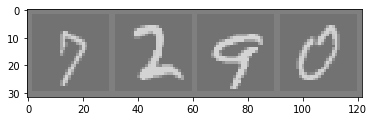

GroundTruth:      7     2     9     0


In [38]:
#Test network on test data
dataiter = iter(testloader)
images, labels = dataiter.next()
outputs = net(images)
_, predicted = torch.max(outputs.data, 1)
print(predicted)
print(labels)

#print images
imshow(torchvision.utils.make_grid(images))
print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(4)))

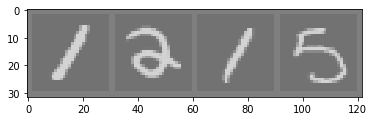

None tensor([1, 3, 1, 5]) tensor([1, 2, 1, 5])


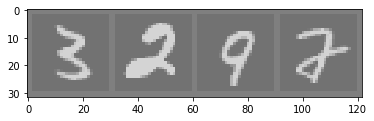

None tensor([3, 2, 9, 3]) tensor([3, 2, 9, 2])


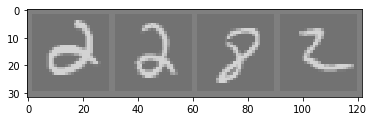

None tensor([3, 2, 8, 2]) tensor([2, 2, 8, 2])


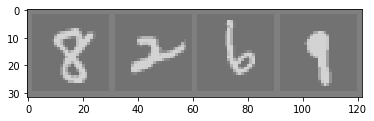

None tensor([8, 2, 6, 1]) tensor([8, 2, 6, 9])


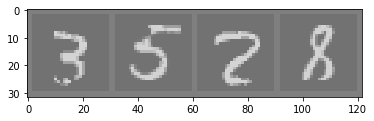

None tensor([3, 5, 8, 8]) tensor([3, 5, 2, 8])


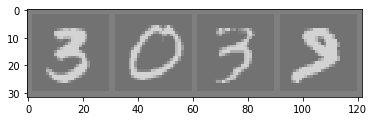

None tensor([3, 0, 3, 3]) tensor([3, 0, 3, 9])


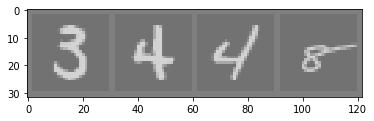

None tensor([3, 4, 4, 6]) tensor([3, 4, 4, 8])


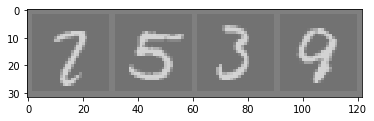

None tensor([7, 5, 3, 9]) tensor([2, 5, 3, 9])


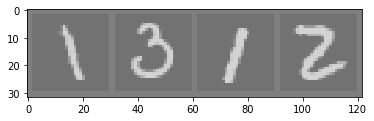

None tensor([1, 0, 1, 2]) tensor([1, 3, 1, 2])


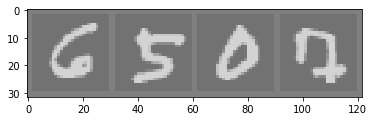

None tensor([6, 5, 0, 0]) tensor([6, 5, 0, 7])


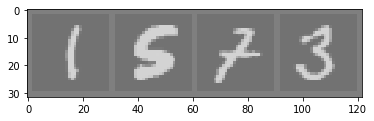

None tensor([1, 5, 8, 3]) tensor([1, 5, 7, 3])


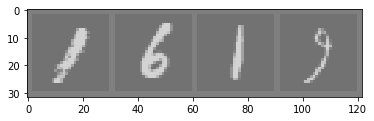

None tensor([1, 6, 1, 7]) tensor([1, 6, 1, 9])


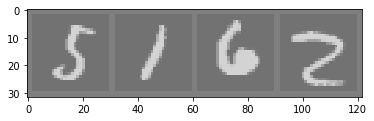

None tensor([5, 1, 6, 7]) tensor([5, 1, 6, 2])


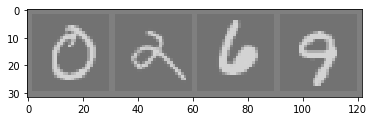

None tensor([0, 3, 6, 9]) tensor([0, 2, 6, 9])


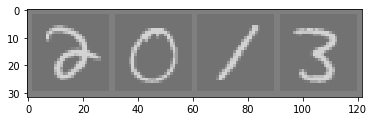

None tensor([3, 0, 1, 3]) tensor([2, 0, 1, 3])


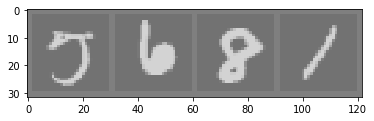

None tensor([7, 6, 8, 1]) tensor([5, 6, 8, 1])


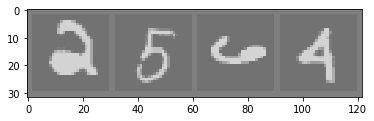

None tensor([2, 5, 4, 4]) tensor([2, 5, 6, 4])


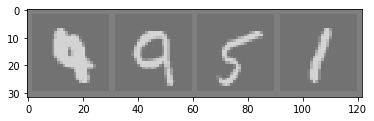

None tensor([9, 9, 5, 1]) tensor([4, 9, 5, 1])


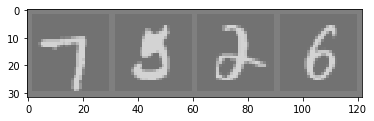

None tensor([7, 3, 2, 6]) tensor([7, 5, 2, 6])


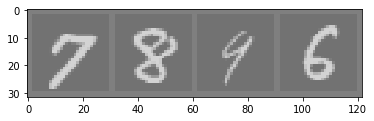

None tensor([7, 8, 4, 6]) tensor([7, 8, 9, 6])


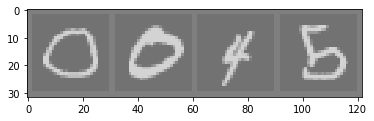

None tensor([0, 0, 4, 8]) tensor([0, 0, 4, 5])


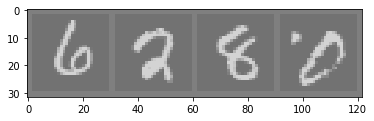

None tensor([6, 2, 8, 8]) tensor([6, 2, 8, 0])


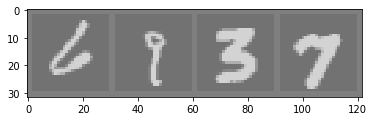

None tensor([6, 1, 3, 7]) tensor([6, 9, 3, 7])


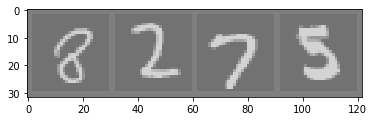

None tensor([8, 2, 7, 3]) tensor([8, 2, 7, 5])


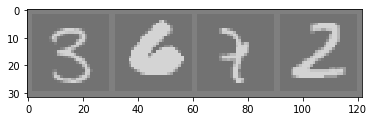

None tensor([3, 6, 3, 2]) tensor([3, 6, 7, 2])


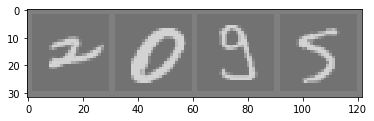

None tensor([2, 0, 3, 5]) tensor([2, 0, 9, 5])


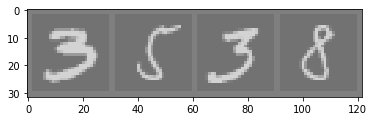

None tensor([3, 8, 3, 8]) tensor([3, 5, 3, 8])


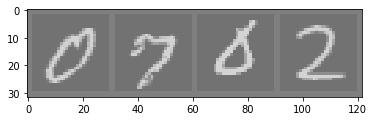

None tensor([0, 7, 6, 2]) tensor([0, 7, 0, 2])


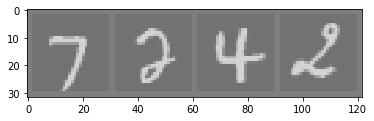

None tensor([7, 7, 4, 2]) tensor([7, 2, 4, 2])


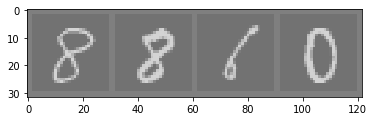

None tensor([8, 8, 1, 0]) tensor([8, 8, 6, 0])


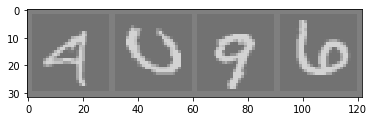

None tensor([9, 0, 9, 6]) tensor([4, 0, 9, 6])


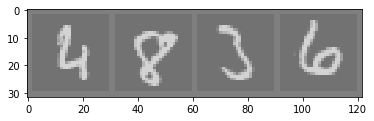

None tensor([6, 8, 3, 6]) tensor([4, 8, 3, 6])


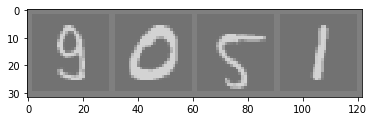

None tensor([3, 0, 5, 1]) tensor([9, 0, 5, 1])


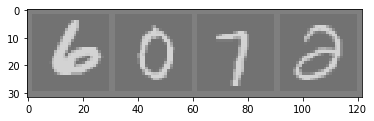

None tensor([6, 0, 7, 3]) tensor([6, 0, 7, 2])


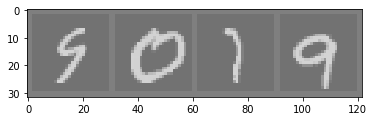

None tensor([9, 0, 1, 9]) tensor([9, 0, 7, 9])


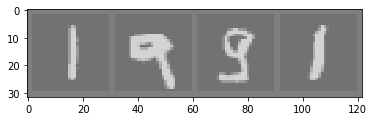

None tensor([1, 9, 3, 1]) tensor([1, 9, 9, 1])


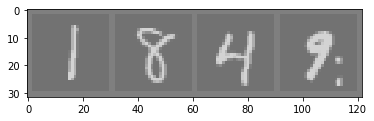

None tensor([1, 8, 4, 1]) tensor([1, 8, 4, 9])


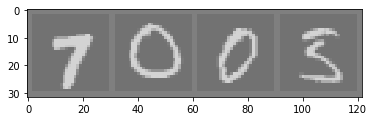

None tensor([7, 0, 0, 3]) tensor([7, 0, 0, 5])


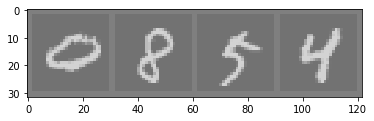

None tensor([0, 8, 3, 4]) tensor([0, 8, 5, 4])


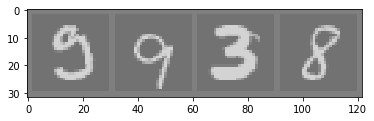

None tensor([3, 9, 3, 8]) tensor([9, 9, 3, 8])


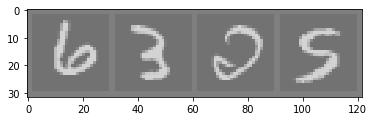

None tensor([6, 3, 0, 5]) tensor([6, 3, 2, 5])


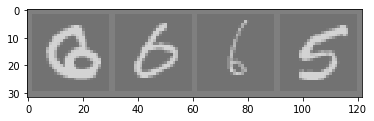

None tensor([8, 6, 6, 5]) tensor([6, 6, 6, 5])


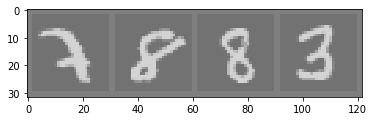

None tensor([3, 8, 8, 3]) tensor([7, 8, 8, 3])


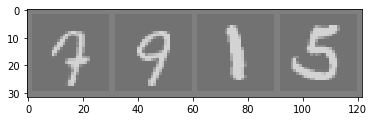

None tensor([9, 9, 1, 5]) tensor([7, 9, 1, 5])


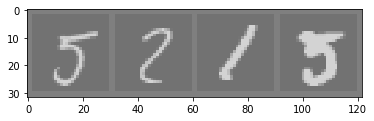

None tensor([5, 8, 1, 3]) tensor([5, 2, 1, 5])


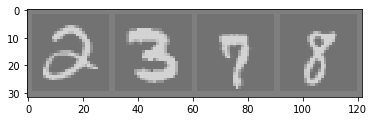

None tensor([3, 3, 7, 8]) tensor([2, 3, 7, 8])


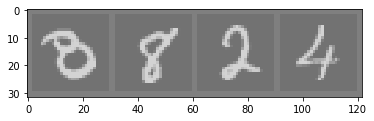

None tensor([3, 8, 2, 4]) tensor([8, 8, 2, 4])


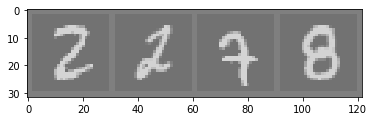

None tensor([2, 2, 9, 8]) tensor([2, 2, 7, 8])


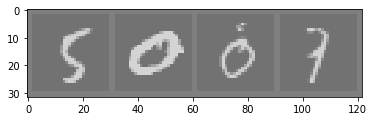

None tensor([5, 0, 0, 3]) tensor([5, 0, 0, 7])


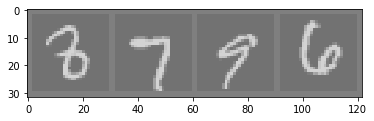

None tensor([3, 7, 9, 6]) tensor([8, 7, 9, 6])


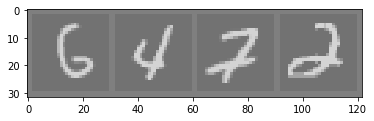

None tensor([6, 4, 2, 2]) tensor([6, 4, 7, 2])


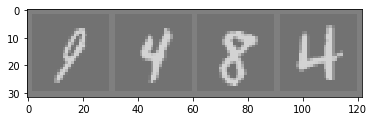

None tensor([1, 4, 8, 4]) tensor([9, 4, 8, 4])


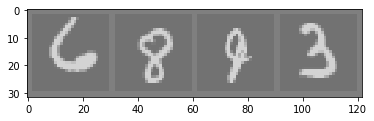

None tensor([6, 8, 4, 3]) tensor([6, 8, 9, 3])


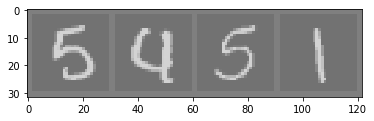

None tensor([5, 9, 5, 1]) tensor([5, 4, 5, 1])


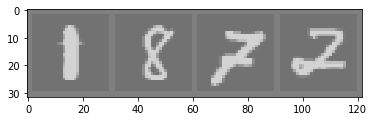

None tensor([1, 8, 2, 2]) tensor([1, 8, 7, 2])


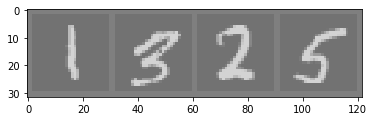

None tensor([1, 8, 2, 5]) tensor([1, 3, 2, 5])


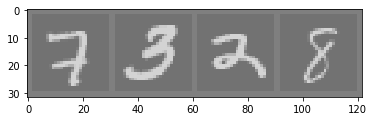

None tensor([7, 3, 3, 8]) tensor([7, 3, 2, 8])


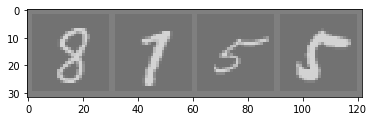

None tensor([8, 7, 5, 0]) tensor([8, 7, 5, 5])


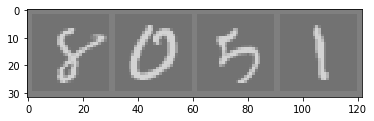

None tensor([8, 0, 8, 1]) tensor([8, 0, 5, 1])


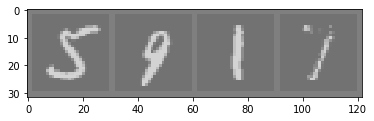

None tensor([5, 9, 1, 1]) tensor([5, 9, 1, 7])


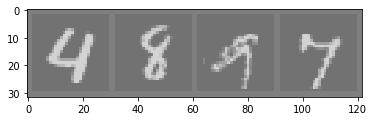

None tensor([4, 8, 8, 7]) tensor([4, 8, 9, 7])


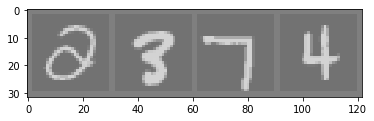

None tensor([3, 3, 7, 4]) tensor([2, 3, 7, 4])


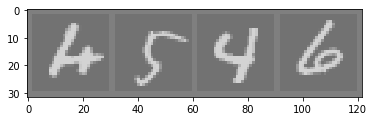

None tensor([6, 5, 4, 6]) tensor([4, 5, 4, 6])


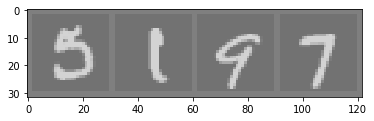

None tensor([3, 1, 9, 7]) tensor([5, 1, 9, 7])


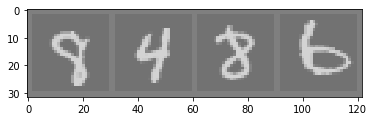

None tensor([9, 4, 8, 6]) tensor([8, 4, 8, 6])


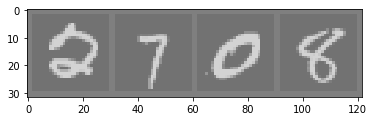

None tensor([0, 7, 0, 8]) tensor([2, 7, 0, 8])


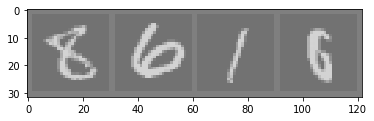

None tensor([8, 6, 1, 8]) tensor([8, 6, 1, 6])


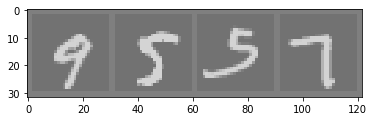

None tensor([9, 5, 3, 7]) tensor([9, 5, 5, 7])


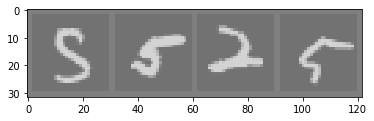

None tensor([3, 5, 2, 5]) tensor([5, 5, 2, 5])


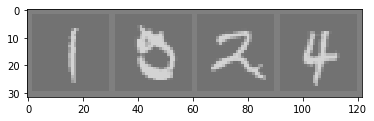

None tensor([1, 0, 3, 4]) tensor([1, 5, 2, 4])


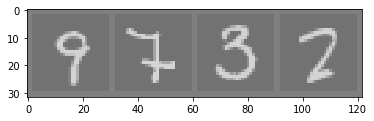

None tensor([9, 3, 3, 2]) tensor([9, 7, 3, 2])


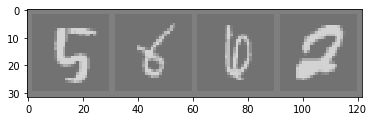

None tensor([5, 8, 6, 2]) tensor([5, 6, 6, 2])


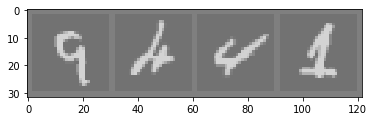

None tensor([9, 6, 4, 1]) tensor([9, 4, 4, 1])


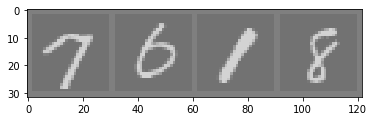

None tensor([7, 0, 1, 8]) tensor([7, 6, 1, 8])


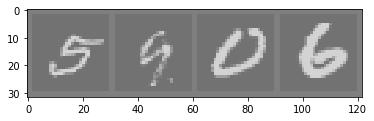

None tensor([3, 9, 0, 6]) tensor([5, 9, 0, 6])


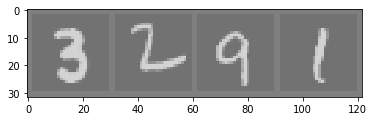

None tensor([3, 6, 9, 1]) tensor([3, 2, 9, 1])


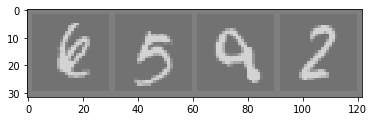

None tensor([8, 3, 9, 2]) tensor([6, 5, 9, 2])


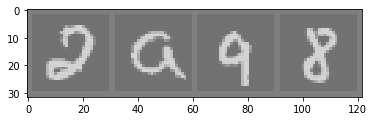

None tensor([2, 0, 9, 8]) tensor([2, 9, 9, 8])


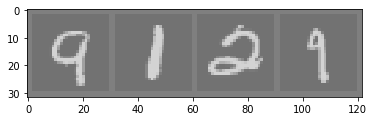

None tensor([9, 1, 2, 1]) tensor([9, 1, 2, 9])


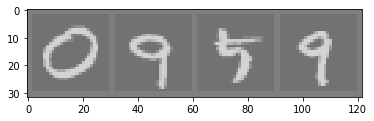

None tensor([0, 9, 4, 9]) tensor([0, 9, 5, 9])


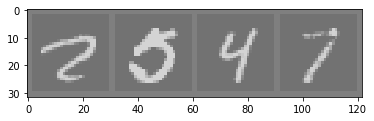

None tensor([2, 0, 4, 7]) tensor([2, 5, 4, 7])


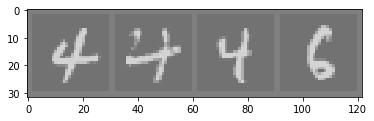

None tensor([4, 3, 4, 6]) tensor([4, 4, 4, 6])


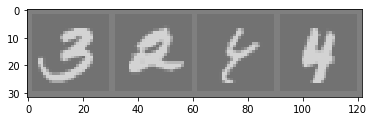

None tensor([3, 2, 8, 4]) tensor([3, 2, 4, 4])


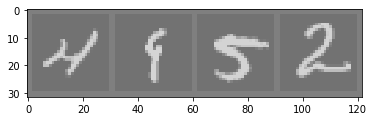

None tensor([4, 8, 5, 2]) tensor([4, 9, 5, 2])


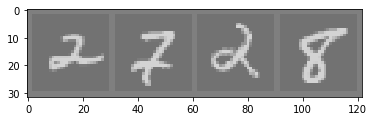

None tensor([2, 3, 2, 8]) tensor([2, 7, 2, 8])


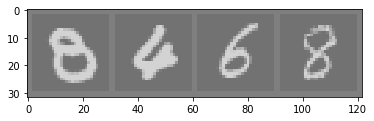

None tensor([8, 6, 6, 8]) tensor([8, 4, 6, 8])


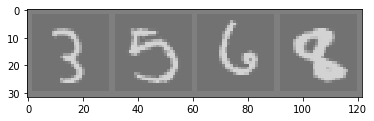

None tensor([3, 3, 6, 8]) tensor([3, 5, 6, 8])


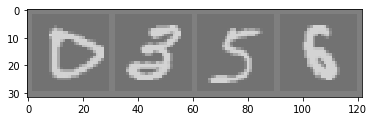

None tensor([0, 3, 5, 5]) tensor([0, 3, 5, 6])


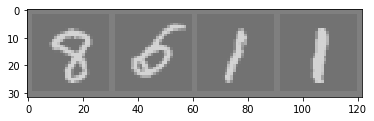

None tensor([8, 6, 1, 1]) tensor([8, 5, 1, 1])


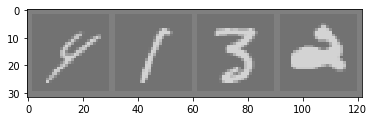

None tensor([8, 1, 3, 2]) tensor([4, 1, 3, 2])


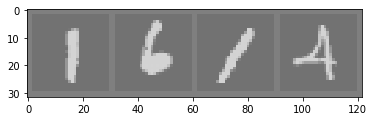

None tensor([1, 6, 1, 3]) tensor([1, 6, 1, 4])


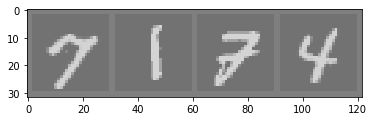

None tensor([7, 1, 3, 4]) tensor([7, 1, 7, 4])


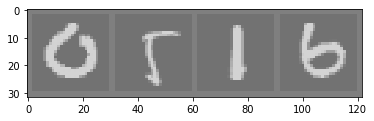

None tensor([0, 8, 1, 6]) tensor([0, 5, 1, 6])


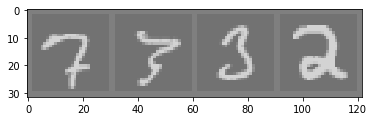

None tensor([7, 7, 3, 2]) tensor([7, 3, 3, 2])


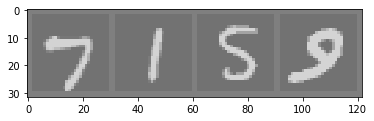

None tensor([7, 1, 5, 3]) tensor([7, 1, 5, 9])


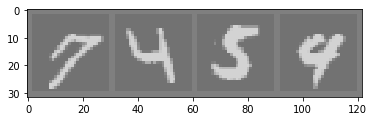

None tensor([7, 4, 5, 9]) tensor([7, 4, 5, 4])


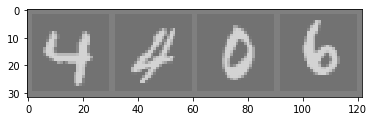

None tensor([4, 2, 0, 6]) tensor([4, 4, 0, 6])


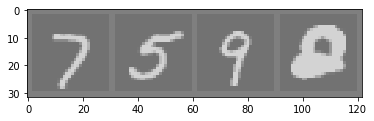

None tensor([7, 5, 9, 0]) tensor([7, 5, 9, 2])


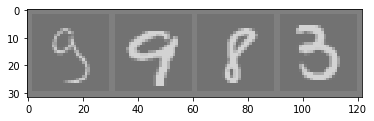

None tensor([3, 9, 8, 3]) tensor([9, 9, 8, 3])


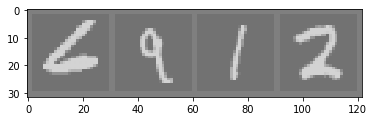

None tensor([6, 8, 1, 2]) tensor([6, 9, 1, 2])


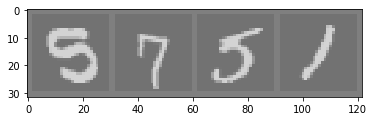

None tensor([3, 7, 5, 1]) tensor([5, 7, 5, 1])


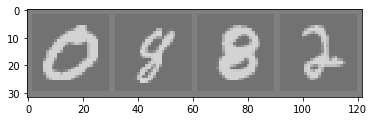

None tensor([0, 9, 8, 2]) tensor([0, 8, 8, 2])


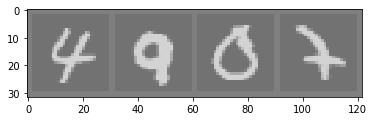

None tensor([4, 9, 0, 3]) tensor([4, 9, 0, 7])


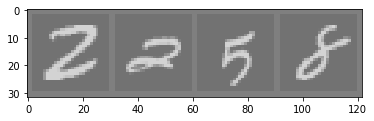

None tensor([2, 3, 5, 8]) tensor([2, 2, 5, 8])


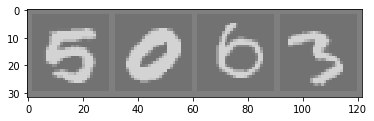

None tensor([5, 0, 0, 3]) tensor([5, 0, 6, 3])


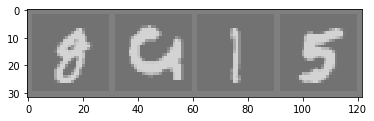

None tensor([8, 0, 1, 5]) tensor([8, 9, 1, 5])


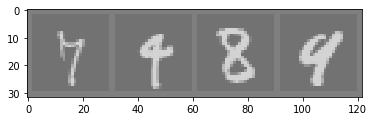

None tensor([7, 4, 8, 4]) tensor([7, 4, 8, 9])


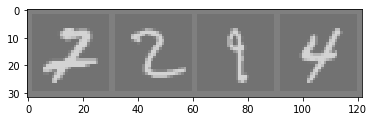

None tensor([2, 2, 1, 4]) tensor([7, 2, 9, 4])


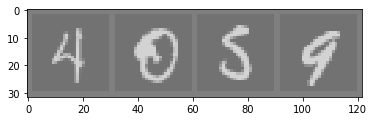

None tensor([4, 8, 5, 9]) tensor([4, 0, 5, 9])


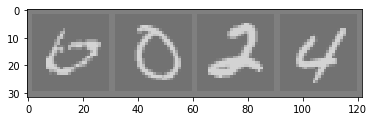

None tensor([0, 0, 2, 4]) tensor([6, 0, 2, 4])


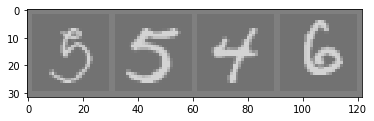

None tensor([3, 5, 4, 6]) tensor([5, 5, 4, 6])


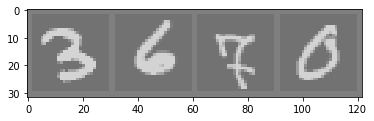

None tensor([3, 6, 8, 0]) tensor([3, 6, 7, 0])


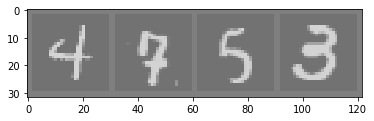

None tensor([4, 9, 5, 3]) tensor([4, 7, 5, 3])


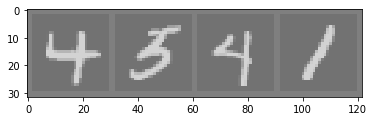

None tensor([4, 3, 4, 1]) tensor([4, 5, 4, 1])


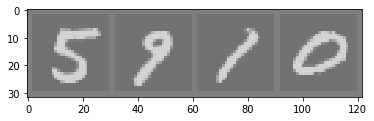

None tensor([5, 8, 1, 0]) tensor([5, 9, 1, 0])


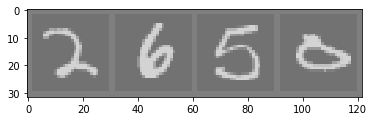

None tensor([2, 6, 5, 6]) tensor([2, 6, 5, 0])


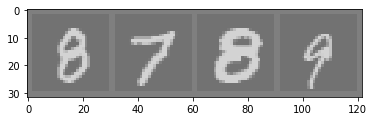

None tensor([8, 7, 8, 4]) tensor([8, 7, 8, 9])


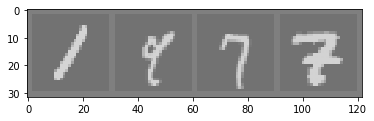

None tensor([1, 1, 7, 7]) tensor([1, 9, 7, 7])


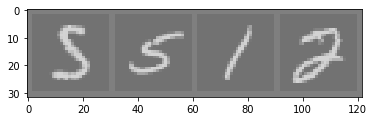

None tensor([5, 5, 1, 7]) tensor([5, 5, 1, 2])


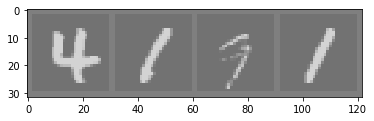

None tensor([4, 1, 7, 1]) tensor([4, 1, 9, 1])


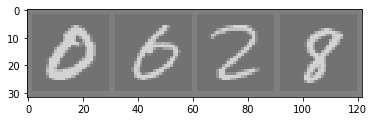

None tensor([0, 0, 2, 8]) tensor([0, 6, 2, 8])


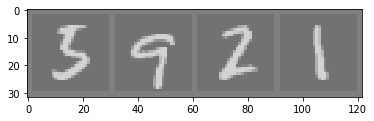

None tensor([3, 9, 2, 1]) tensor([5, 9, 2, 1])


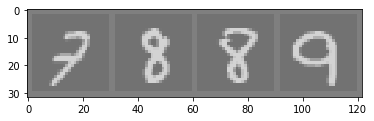

None tensor([3, 8, 8, 9]) tensor([7, 8, 8, 9])


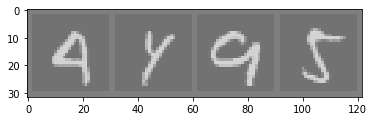

None tensor([4, 1, 9, 5]) tensor([4, 4, 9, 5])


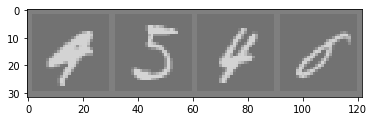

None tensor([4, 5, 4, 8]) tensor([4, 5, 4, 0])


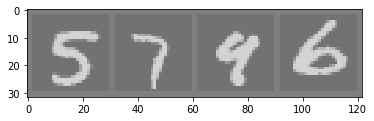

None tensor([5, 7, 9, 6]) tensor([5, 7, 4, 6])


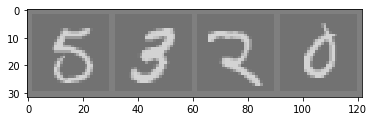

None tensor([5, 3, 3, 0]) tensor([5, 3, 2, 0])


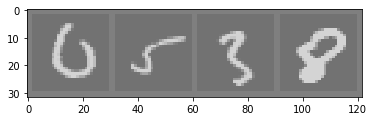

None tensor([6, 5, 3, 8]) tensor([0, 5, 3, 8])


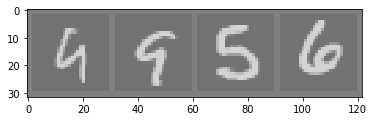

None tensor([6, 9, 5, 6]) tensor([9, 9, 5, 6])


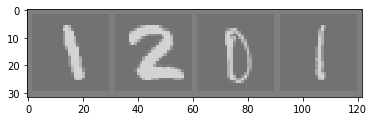

None tensor([1, 2, 8, 1]) tensor([1, 2, 0, 1])


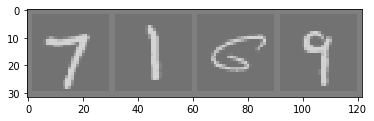

None tensor([7, 1, 5, 9]) tensor([7, 1, 6, 9])


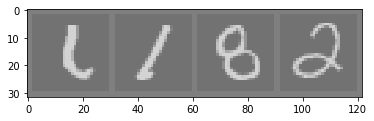

None tensor([1, 1, 8, 2]) tensor([6, 1, 8, 2])


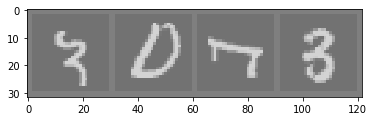

None tensor([7, 0, 7, 3]) tensor([3, 0, 7, 3])


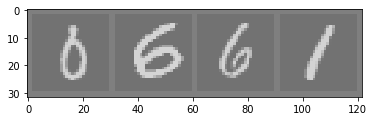

None tensor([6, 6, 6, 1]) tensor([0, 6, 6, 1])


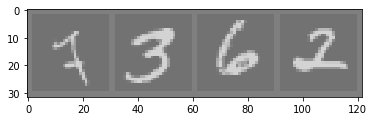

None tensor([2, 3, 6, 2]) tensor([7, 3, 6, 2])


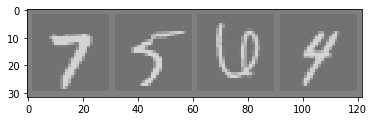

None tensor([7, 5, 0, 4]) tensor([7, 5, 6, 4])


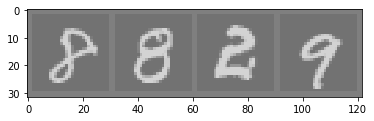

None tensor([8, 8, 3, 9]) tensor([8, 8, 2, 9])


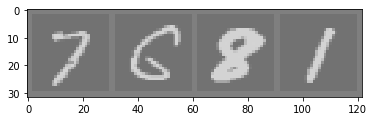

None tensor([7, 8, 8, 1]) tensor([7, 6, 8, 1])


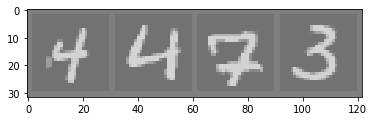

None tensor([4, 4, 2, 3]) tensor([4, 4, 7, 3])


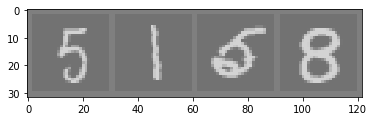

None tensor([5, 1, 6, 8]) tensor([5, 1, 5, 8])


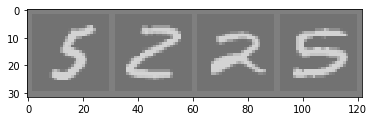

None tensor([5, 3, 2, 5]) tensor([5, 2, 2, 5])


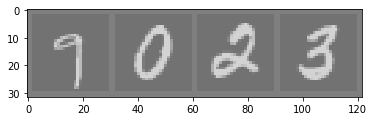

None tensor([7, 0, 2, 3]) tensor([9, 0, 2, 3])


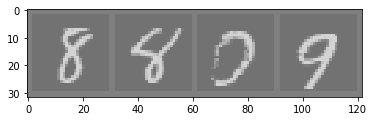

None tensor([8, 8, 7, 9]) tensor([8, 8, 0, 9])


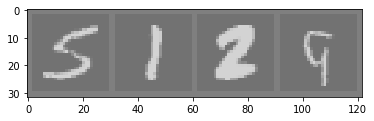

None tensor([5, 1, 2, 8]) tensor([5, 1, 2, 9])


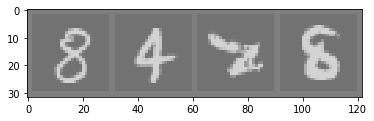

None tensor([8, 4, 7, 8]) tensor([8, 4, 2, 8])


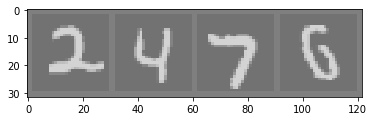

None tensor([2, 4, 7, 5]) tensor([2, 4, 7, 6])


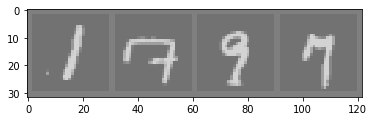

None tensor([1, 9, 9, 7]) tensor([1, 7, 9, 7])


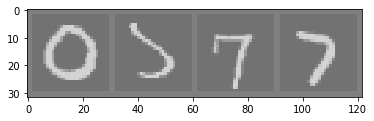

None tensor([0, 3, 7, 7]) tensor([0, 5, 7, 7])


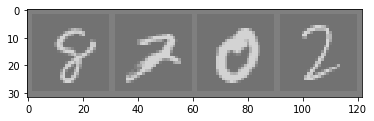

None tensor([8, 7, 0, 2]) tensor([8, 2, 0, 2])


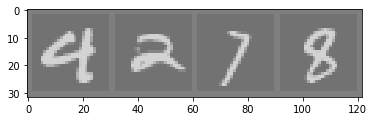

None tensor([9, 2, 7, 8]) tensor([4, 2, 7, 8])


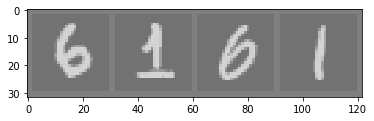

None tensor([6, 1, 0, 1]) tensor([6, 1, 6, 1])


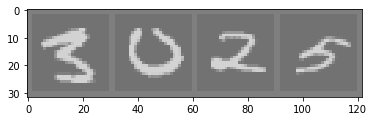

None tensor([3, 0, 2, 3]) tensor([3, 0, 2, 5])


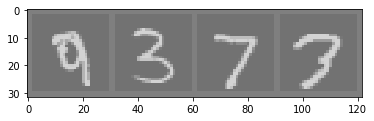

None tensor([9, 3, 7, 7]) tensor([9, 3, 7, 3])


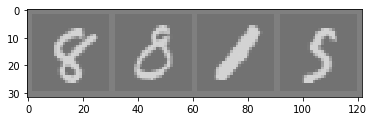

None tensor([8, 3, 1, 5]) tensor([8, 8, 1, 5])


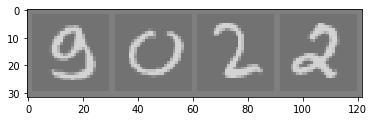

None tensor([3, 0, 2, 2]) tensor([9, 0, 2, 2])


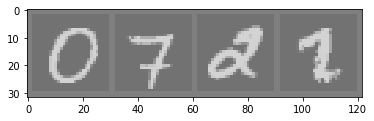

None tensor([0, 7, 2, 1]) tensor([0, 7, 2, 2])


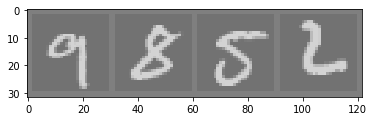

None tensor([9, 8, 5, 6]) tensor([9, 8, 5, 2])


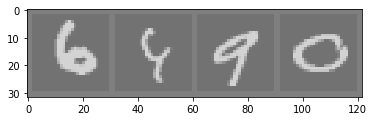

None tensor([6, 4, 9, 0]) tensor([6, 9, 9, 0])


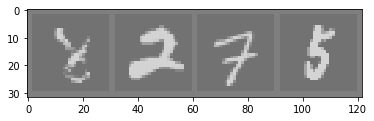

None tensor([7, 2, 7, 5]) tensor([8, 2, 7, 5])


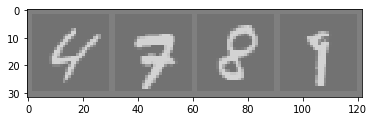

None tensor([4, 7, 8, 1]) tensor([4, 7, 8, 9])


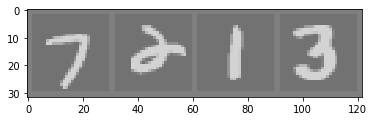

None tensor([7, 3, 1, 3]) tensor([7, 2, 1, 3])


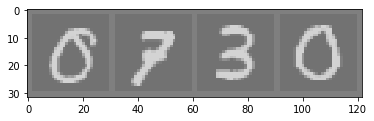

None tensor([0, 3, 3, 0]) tensor([0, 7, 3, 0])


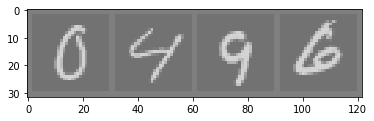

None tensor([0, 9, 9, 6]) tensor([0, 4, 9, 6])


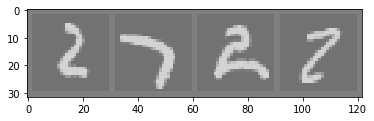

None tensor([2, 7, 2, 3]) tensor([2, 7, 2, 2])


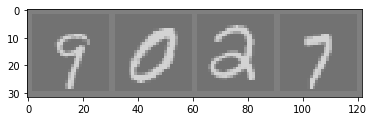

None tensor([9, 0, 3, 7]) tensor([9, 0, 2, 7])


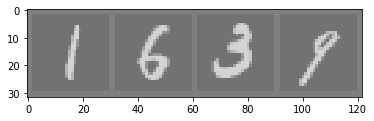

None tensor([1, 6, 3, 1]) tensor([1, 6, 3, 9])


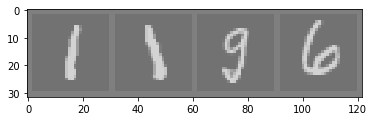

None tensor([1, 1, 3, 6]) tensor([1, 1, 9, 6])


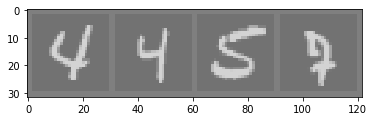

None tensor([4, 4, 5, 9]) tensor([4, 4, 5, 7])


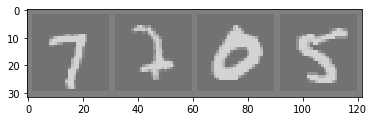

None tensor([7, 3, 0, 5]) tensor([7, 7, 0, 5])


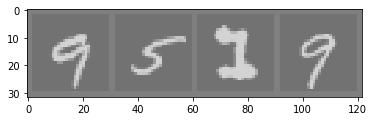

None tensor([9, 5, 3, 9]) tensor([9, 5, 1, 9])


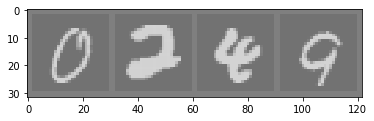

None tensor([0, 2, 8, 9]) tensor([0, 2, 4, 9])


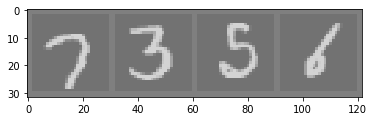

None tensor([7, 3, 5, 1]) tensor([7, 3, 5, 6])


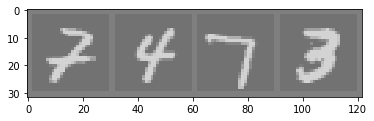

None tensor([2, 4, 7, 3]) tensor([7, 4, 7, 3])


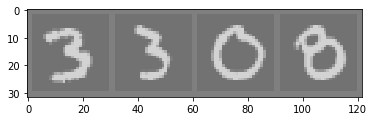

None tensor([3, 3, 0, 0]) tensor([3, 3, 0, 8])


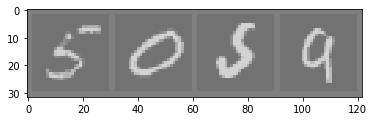

None tensor([5, 0, 6, 9]) tensor([5, 0, 5, 9])


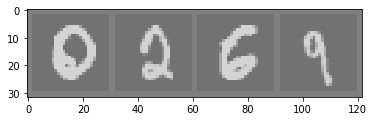

None tensor([0, 2, 6, 8]) tensor([0, 2, 6, 9])


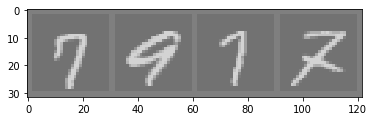

None tensor([7, 9, 7, 2]) tensor([7, 9, 7, 7])


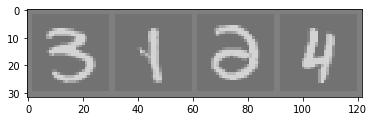

None tensor([3, 1, 3, 4]) tensor([3, 1, 2, 4])


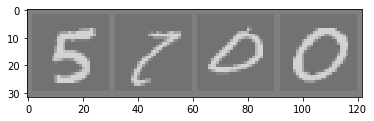

None tensor([5, 8, 0, 0]) tensor([5, 7, 0, 0])


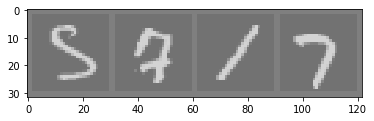

None tensor([3, 9, 1, 7]) tensor([5, 7, 1, 7])


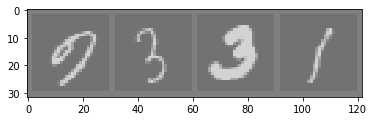

None tensor([0, 3, 3, 1]) tensor([9, 3, 3, 1])


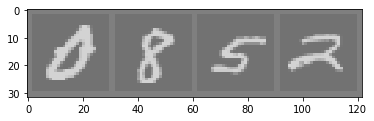

None tensor([0, 8, 5, 3]) tensor([0, 8, 5, 2])


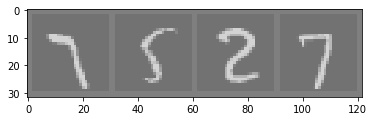

None tensor([7, 8, 2, 7]) tensor([7, 5, 2, 7])


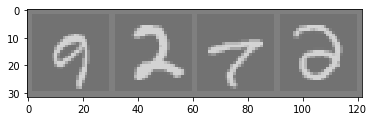

None tensor([9, 2, 7, 3]) tensor([9, 2, 7, 2])


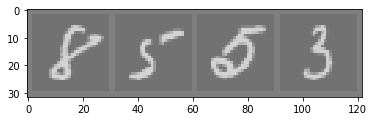

None tensor([8, 5, 0, 3]) tensor([8, 5, 5, 3])


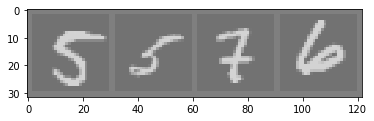

None tensor([5, 5, 3, 6]) tensor([5, 5, 7, 6])


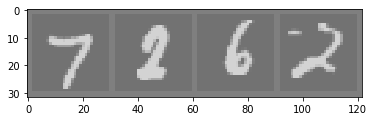

None tensor([7, 8, 6, 2]) tensor([7, 2, 6, 2])


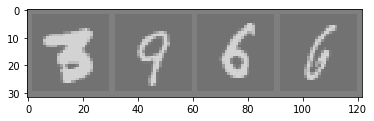

None tensor([8, 9, 6, 6]) tensor([3, 9, 6, 6])


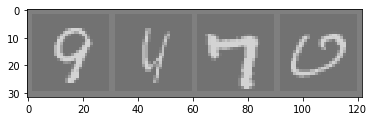

None tensor([9, 6, 7, 0]) tensor([9, 4, 7, 0])


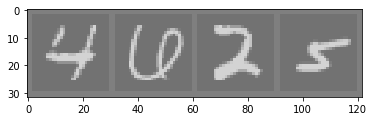

None tensor([4, 0, 2, 5]) tensor([4, 6, 2, 5])


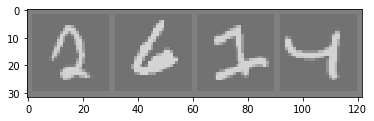

None tensor([0, 6, 3, 4]) tensor([2, 6, 1, 4])


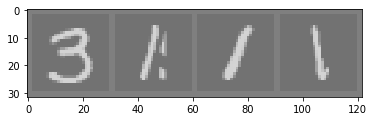

None tensor([3, 8, 1, 1]) tensor([3, 1, 1, 1])


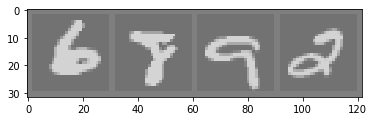

None tensor([6, 7, 9, 2]) tensor([6, 8, 9, 2])


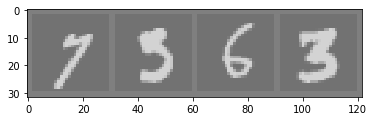

None tensor([7, 3, 6, 3]) tensor([7, 5, 6, 3])


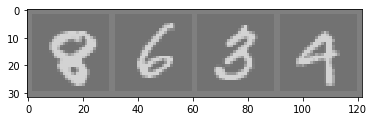

None tensor([8, 6, 3, 9]) tensor([8, 6, 3, 4])


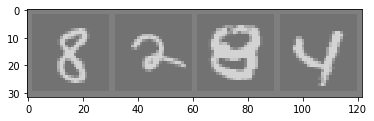

None tensor([8, 7, 8, 4]) tensor([8, 2, 8, 4])


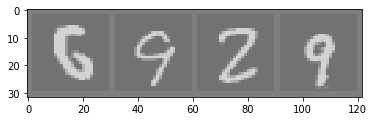

None tensor([5, 9, 2, 9]) tensor([6, 9, 2, 9])


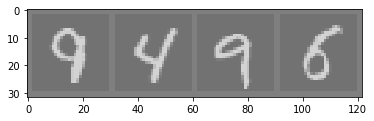

None tensor([9, 4, 9, 8]) tensor([9, 4, 9, 6])


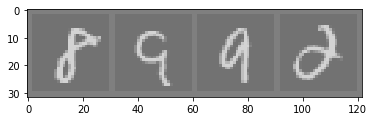

None tensor([8, 9, 9, 3]) tensor([8, 9, 9, 2])


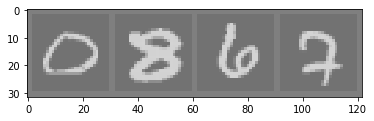

None tensor([0, 8, 6, 2]) tensor([0, 8, 6, 7])


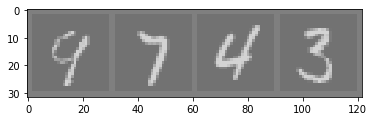

None tensor([7, 7, 4, 3]) tensor([9, 7, 4, 3])


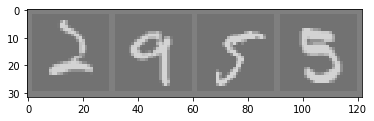

None tensor([2, 9, 5, 3]) tensor([2, 9, 5, 5])


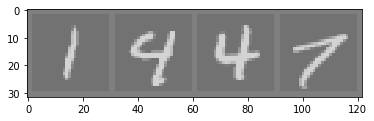

None tensor([1, 9, 4, 7]) tensor([1, 4, 4, 7])


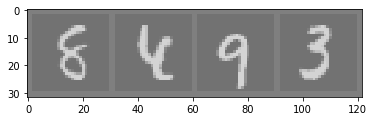

None tensor([8, 8, 9, 3]) tensor([8, 4, 9, 3])


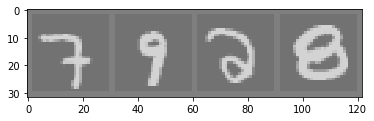

None tensor([7, 9, 3, 8]) tensor([7, 9, 2, 8])


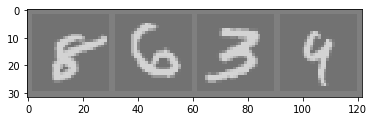

None tensor([8, 6, 3, 4]) tensor([8, 6, 3, 9])


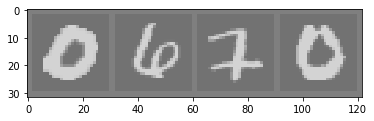

None tensor([0, 6, 2, 0]) tensor([0, 6, 7, 0])


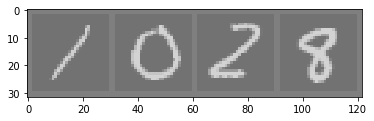

None tensor([1, 0, 8, 8]) tensor([1, 0, 2, 8])


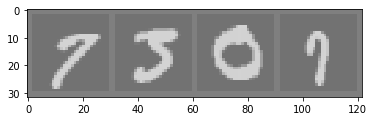

None tensor([7, 3, 0, 9]) tensor([7, 3, 0, 7])


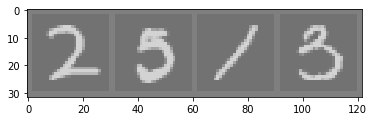

None tensor([2, 3, 1, 3]) tensor([2, 5, 1, 3])


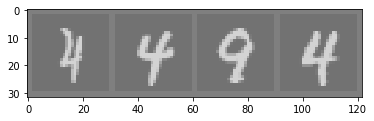

None tensor([9, 4, 9, 4]) tensor([4, 4, 9, 4])


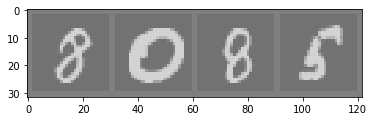

None tensor([8, 0, 8, 8]) tensor([8, 0, 8, 5])


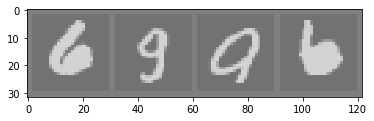

None tensor([6, 9, 0, 6]) tensor([6, 9, 9, 6])


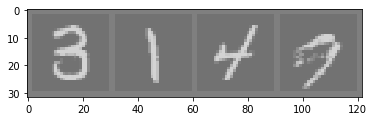

None tensor([3, 1, 4, 7]) tensor([3, 1, 4, 9])


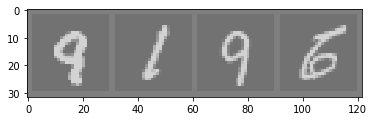

None tensor([9, 1, 9, 8]) tensor([9, 1, 9, 6])


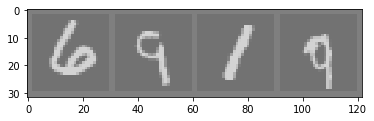

None tensor([6, 9, 1, 7]) tensor([6, 9, 1, 9])


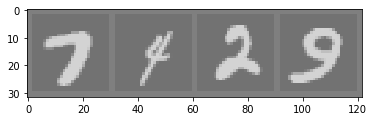

None tensor([7, 4, 2, 3]) tensor([7, 4, 2, 9])


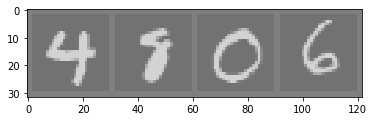

None tensor([4, 7, 0, 6]) tensor([4, 8, 0, 6])


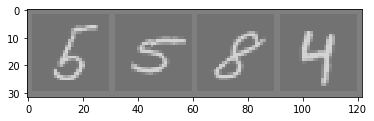

None tensor([8, 5, 8, 4]) tensor([5, 5, 8, 4])


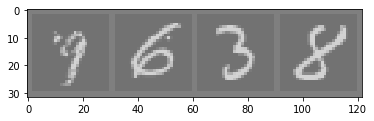

None tensor([7, 6, 3, 8]) tensor([9, 6, 3, 8])


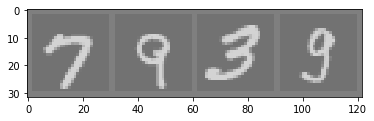

None tensor([7, 9, 3, 3]) tensor([7, 9, 3, 9])


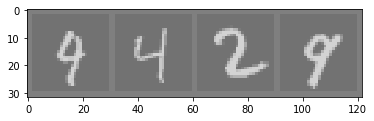

None tensor([9, 4, 2, 9]) tensor([4, 4, 2, 9])


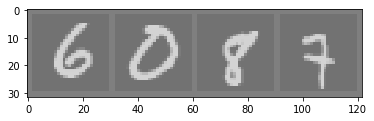

None tensor([6, 0, 8, 3]) tensor([6, 0, 8, 7])


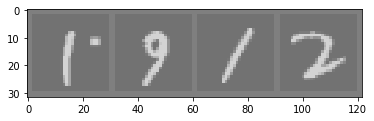

None tensor([8, 9, 1, 2]) tensor([1, 9, 1, 2])


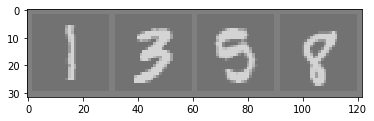

None tensor([1, 3, 3, 8]) tensor([1, 3, 5, 8])


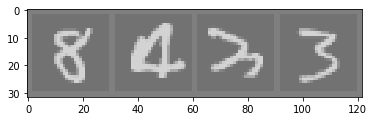

None tensor([8, 0, 3, 3]) tensor([8, 4, 3, 3])


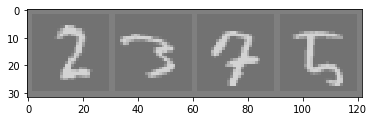

None tensor([2, 3, 9, 5]) tensor([2, 3, 7, 5])


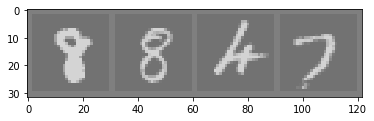

None tensor([8, 8, 6, 7]) tensor([8, 8, 4, 7])


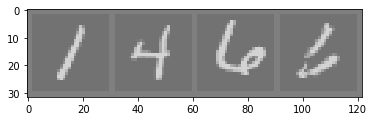

None tensor([1, 4, 6, 3]) tensor([1, 4, 6, 6])


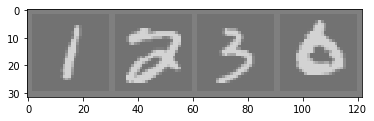

None tensor([1, 2, 3, 0]) tensor([1, 2, 3, 6])


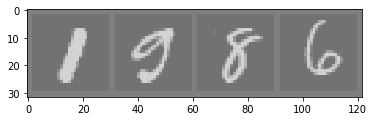

None tensor([1, 3, 8, 6]) tensor([1, 9, 8, 6])


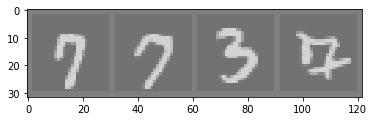

None tensor([7, 7, 3, 0]) tensor([7, 7, 3, 7])


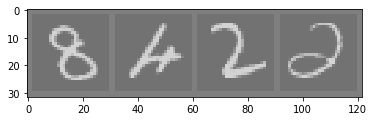

None tensor([8, 6, 2, 3]) tensor([8, 4, 2, 2])


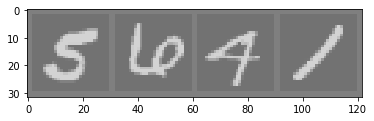

None tensor([5, 6, 7, 1]) tensor([5, 6, 4, 1])


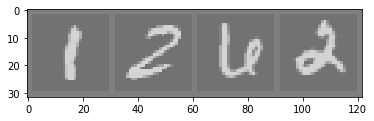

None tensor([1, 2, 0, 2]) tensor([1, 2, 6, 2])


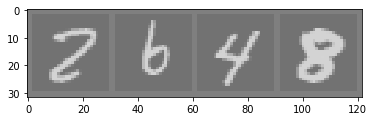

None tensor([8, 6, 4, 8]) tensor([2, 6, 4, 8])


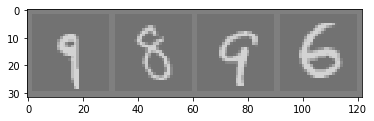

None tensor([4, 8, 9, 6]) tensor([9, 8, 9, 6])


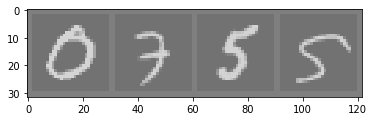

None tensor([0, 3, 5, 5]) tensor([0, 7, 5, 5])


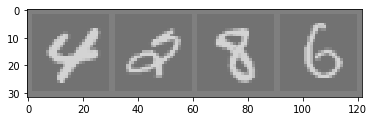

None tensor([4, 0, 8, 6]) tensor([4, 2, 8, 6])


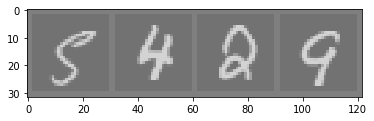

None tensor([5, 4, 8, 9]) tensor([5, 4, 2, 9])


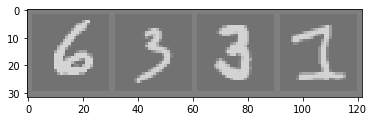

None tensor([6, 3, 3, 3]) tensor([6, 3, 3, 1])


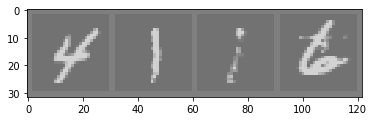

None tensor([4, 1, 7, 6]) tensor([4, 1, 1, 6])


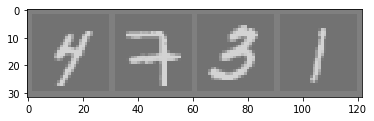

None tensor([4, 3, 3, 1]) tensor([4, 7, 3, 1])


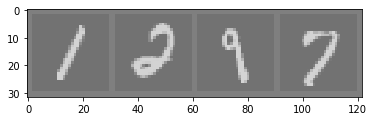

None tensor([1, 2, 1, 7]) tensor([1, 2, 9, 7])


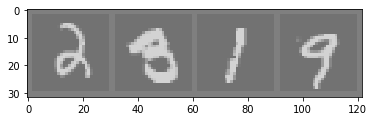

None tensor([2, 8, 1, 9]) tensor([2, 3, 1, 9])


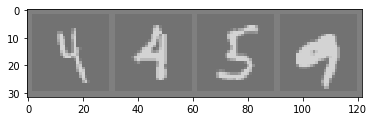

None tensor([4, 4, 3, 9]) tensor([4, 4, 5, 9])


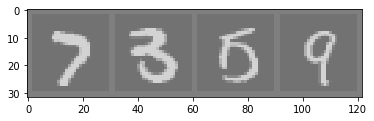

None tensor([7, 3, 0, 9]) tensor([7, 3, 5, 9])
Accuracy of the network on MNIST Data: 97 %


In [43]:
#Test:

net = Net()
net.load_state_dict(torch.load(PATH))
correct = 0
total = 0
failed_probabilities = []
with torch.no_grad():
    for i, data in enumerate(testloader, 0):
        inputs, label = data
        outputs = net(inputs)
        _, predicted = torch.max(outputs.data, 1)
        if (predicted == label).sum().item() != 4:
            print(imshow(torchvision.utils.make_grid(inputs)), predicted, label)
        total += labels.size(0)
        correct += (predicted == label).sum().item()
        #print(total, correct, "\n")
        
print('Accuracy of the network on MNIST Data: %d %%' % (
    100 * correct / total))